In [7]:
# verify the path using getcwd()
cwd = os.getcwd()
 
# print the current directory
print("Current working directory is:", cwd)

Current working directory is: /Users/phypdo/Box Sync/ChristianLOrealPapers/Notebooks/Caff_Convolve_100


1 :  a =  0.6384  b =  6.9854  c = 2.8173 integral =  0.0128


<Figure size 1440x432 with 0 Axes>

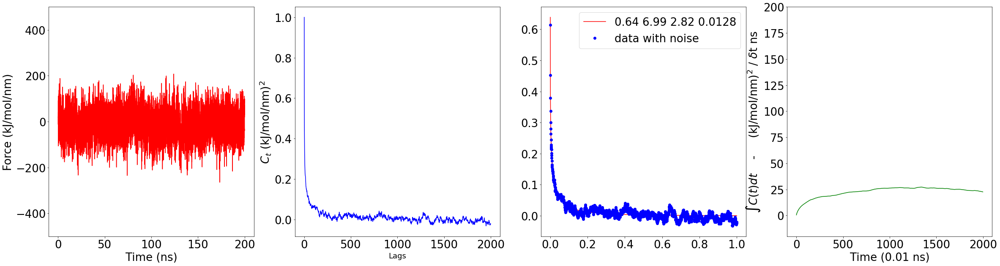

2 :  a =  0.6474  b =  2.9124  c = 2.6337 integral =  0.1498


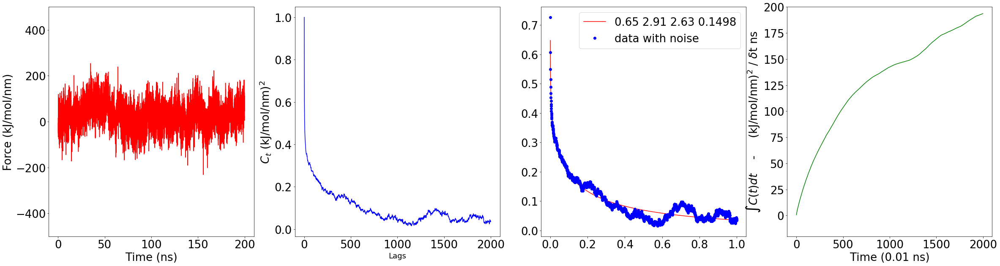

3 :  a =  0.7380  b =  4.0433  c = 4.3442 integral =  0.0697


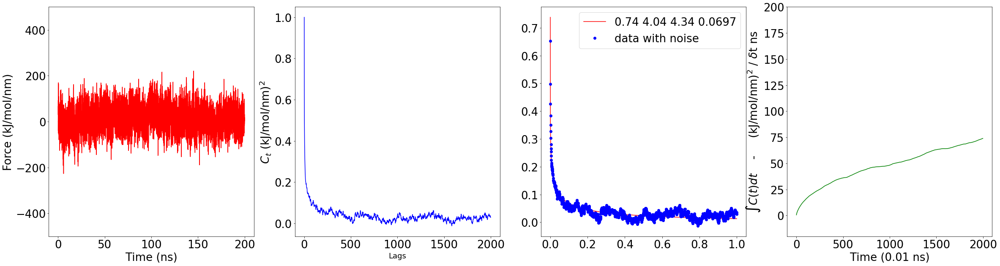

4 :  a =  0.6291  b =  10.1876  c = 2.3681 integral =  0.0074


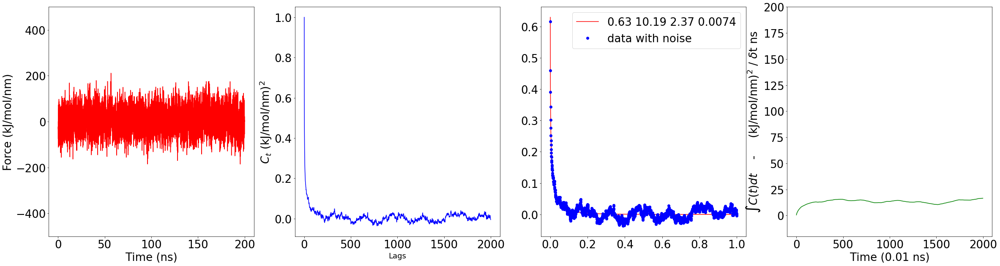

5 :  a =  0.6698  b =  3.5462  c = 3.6418 integral =  0.0946


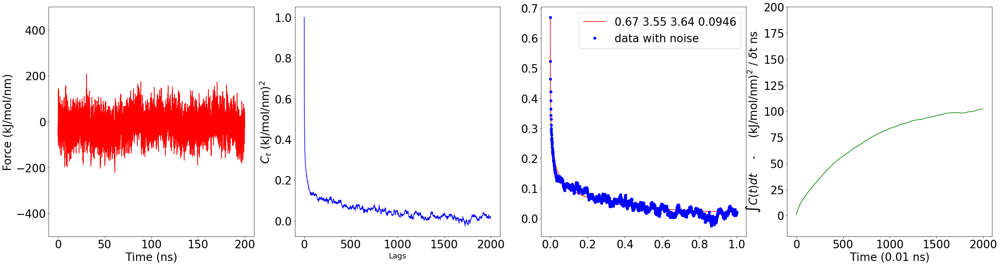

6 :  a =  0.6074  b =  9.6975  c = 1.9414 integral =  0.0140


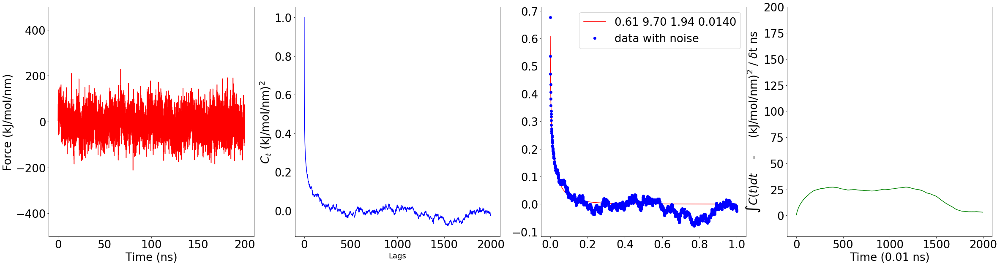

7 :  a =  0.7019  b =  2.4209  c = 4.0604 integral =  0.5094


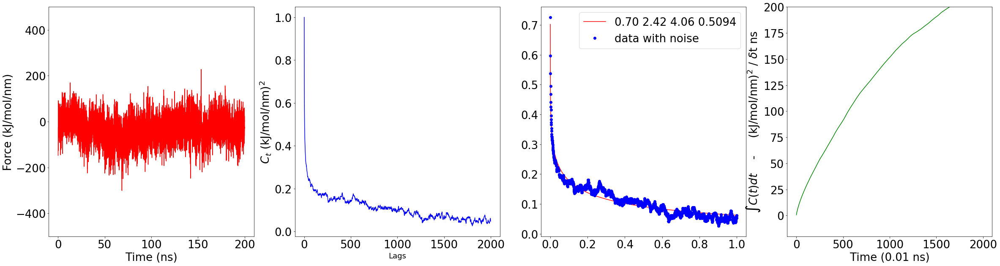

8 :  a =  0.3905  b =  4.2413  c = 1.6308 integral =  0.0542


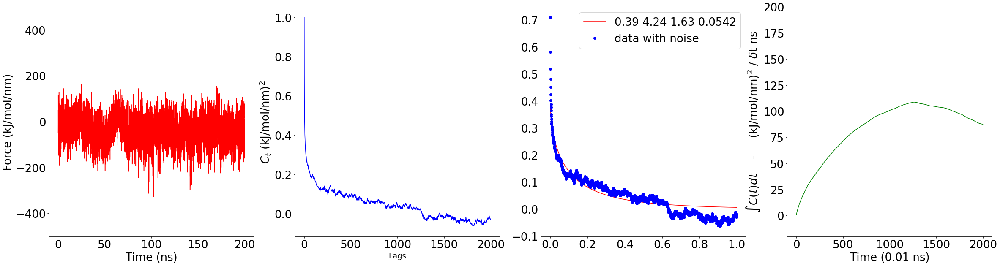

KeyboardInterrupt: 

Error in callback <function flush_figures at 0x12870a040> (for post_execute):


KeyboardInterrupt: 

In [44]:

#Original data, 100, 1000. 
#Red, blue, black and purple at 500,000. 

#Correlation func & Integral: 1, 100, 1000.

#Auto-correlation
from statsmodels.graphics import tsaplots

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import os
import glob 
import errno
import statsmodels.api as sm
import scipy.integrate as scint
from scipy import integrate
from scipy.optimize import curve_fit
import math        
from numpy import array, hstack, vstack
import itertools
from scipy.stats import gamma          
        
last = []
dz = []
bl = []
bla = range(20000)
bla2 = array([bla])
save_acf = array([bla])

bla3 = save_acf.T
bla4 = np.empty(shape=(20000,) * 1)

plt.figure(figsize=(20,6))
count=1

# create subplots
# os.chdir('/Users/chrisjorg/Documents/Postdoc/Georgetown/Double_bilayer_Sandwich/Z_LPP/LPP_Caff_5000eq_0.2/Force_prod/All_new/Convolve_100')
os.chdir('/Users/phypdo/Box Sync/ChristianLOrealPapers/Notebooks/Caff_Convolve_100')

with open('data.txt', 'w') as file:
    path = './*pullf.xvg' 
    path2 = os.getcwd()
    files = glob.glob(path)
    
def key_func(x):
        return os.path.split(x)[-1]

# define type of function to search
def model_func(x, a, b, c):
        return a * np.exp(-(b * x ** (c ** (-1))))
# integral of function to time infinity
def int_val(a, b, c): 
                return a * (b ** (-c)) * math.gamma(1 + c)
for name in sorted(glob.glob('*_pullf.xvg_dt*'), key=key_func):
        try: 
            # print(count)
            
            colors = itertools.cycle(["r", "b", "g", "c","m"])
            lines = open(name,'r')
            f = np.loadtxt(name)
            #plt.subplot(1, 1, count) 

            subplot_dim = (20, 10)
            X_=f[:,0]/1000
            Y=f[:,1]
            X_scale = np.linspace(0, 1, 20000) 
            X_scale_ = X_scale/100
            
            fntsize=26
            fig, (ax0, ax1, ax2, ax3) = plt.subplots(1, 4,figsize=(40,10))
            ax0.plot(X_,Y,label=name,color=next(colors))
            ax0.tick_params(axis='both', labelsize=fntsize)
            ax0.set_ylabel('Force (kJ/mol/nm)',fontsize=fntsize)
            ax0.set_xlabel('Time (ns)',fontsize=fntsize)
            ax0.set_ylim(-500, 500)

            acf_ = sm.tsa.acf(Y,  nlags=2000, fft=False)
            acf__ = acf_.T
            # print(acf__)  # to debug
            # print(acf_)
            blbb = np.concatenate(([X_scale, X_, Y]), axis=0) 
            np.savetxt('AutoCorr_100_' + str(count) + '.txt', acf_, delimiter=" ", fmt="%s")
 
            save_acf__ = hstack([ X_, Y])
           
            ax1.tick_params(axis='both', labelsize=fntsize)
            ax1.plot(acf_,label=name,color=next(colors)) 
            ax1.set_ylabel('$C_{t}$ (kJ/mol/nm)$^2$',fontsize=fntsize)
            ax1.set_xlabel('Lags',fontsize=18)
            
            # print(len(acf_)) # to debug
            # colors = itertools.cycle(["r", "b", "g","c","m"])

            X_scale = np.linspace(0, 1, 2000)
            acf__ = acf_[1:]
            acf_int = integrate.cumtrapz(acf__)
   
            np.savetxt("dz_integrat.txt", acf_int, delimiter=" ", fmt="%s")

            # curve fit
            X_scale = np.linspace(0, 1, 1999)
            p0 = (0.6,4.0,2.0) # starting search koefs
            opt, pcov = curve_fit(model_func, X_scale, acf__[:1999], p0)
            a, b, c= opt
            # test result
            
            x2 = np.linspace(0, 1, 1999)
            y2 = model_func(x2, a, b, c)
            # calculate integral
            y3 = int_val(a, b, c)
            
            ax2.tick_params(axis='both', labelsize=fntsize)
            ax2.plot(x2, y2, color='r')
            ax2.plot(X_scale, acf__[:1999], 'bo')
            ax2.legend(['%.2f %.2f %-.2f %.4f' % (a,b,c,y3),"data with noise"],loc="upper right",fontsize=fntsize)
            #ax2.set_xlim(0, 1999)
            #ax2.legend(loc='best')
        
            print(count,": ","a = ","{:.4f}".format(a)," b = ", "{:.4f}".format(b), " c =","{:.4f}".format(c), "integral = ","{:.4f}".format(y3))
           
            ax3.tick_params(axis='both', labelsize=fntsize)
            ax3.plot(acf_int,label=name,color=next(colors))
            ax3.set_ylabel(r'$\int C(t) dt $    -     (kJ/mol/nm)$^2$ / $\delta$t ns',fontsize=fntsize)
            ax3.set_xlabel('Time (0.01 ns)',fontsize=fntsize)
            ax3.set_ylim(-20, 200)
            plt.show()
             
            count+=1
             
            fig.savefig('AutoCorr_100_' + str(count) + '.png',dpi=300,bbox_inches='tight',pad_inches=0.06)
            last_element = y3
      
            #last_element_ = 100*last_element
            last.append(last_element)
            # print(len(last))
        except IOError as exc: 
            if exc.errno != errno.EISDIR: 
                raise

np.savetxt("test5.txt", blbb, delimiter=" ", fmt="%s") 

# Display the autocorrelation plot of your time series

print(len(last))
fig, (ax0, ax1, ax2) = plt.subplots(1, 3,figsize=(40,10))
last_arr = np.array(last)
last_ = last_arr
np.savetxt("test6.txt", last_, delimiter=" ", fmt="%s") 

print(len(last_))
rt = 0.008314*310   #kJ/mol
rt2_ = rt*rt

dt = 0.01 

dt1 = 1/dt
invert_last = 1. / dt1*last_
print(len(invert_last))
print(invert_last)
#invert_last = np.reciprocal(last_)
fraction = rt2_*invert_last
fraction_units = fraction*0.00001

#plt.plot(last_,':ro',label=name,color=next(colors))
fntsize=26
ax0.plot(last_,label=name,color=next(colors))
ax0.set_ylabel(r'$\int C(t) dt $    -     (kJ/mol/nm)$^2$ / ns',fontsize=fntsize)
ax0.set_xlabel('Z window',fontsize=18)
#plt.xlim(0, 50000)

ax1.plot(fraction,label=name,color=next(colors))
ax1.set_ylabel('$(RT)^{2} / \int C(t) dt $    -     (nm)$^2$ / ns',fontsize=fntsize)
ax1.set_xlabel('Z window',fontsize=18)
#plt.xlim(0, 100)
 
ax2.plot(fraction_units,label=name,color=next(colors))
ax2.set_ylabel('$(RT)^{2} / \int C(t) dt $    -     (cm)$^2$ / s',fontsize=fntsize)
ax2.set_xlabel('Z window',fontsize=18)
np.savetxt("last_element_.txt", last, delimiter=" ", fmt="%s")
plt.ticklabel_format(useOffset=False)

np.savetxt("dz.txt", fraction_units, delimiter=" ", fmt="%s")
 
plt.subplots_adjust(wspace=0.4)
            
#plt.tight_layout()
plt.savefig('AutoCorr_100.png',dpi=300,bbox_inches='tight',pad_inches=0.2)

In [ ]:
#Original data, 100, 1000. 
#Red, blue, black and purple at 500,000. 

#Correlation func & Integral: 1, 100, 1000.

#Auto-correlation
from statsmodels.graphics import tsaplots

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import os
import glob 
import errno
import statsmodels.api as sm
import scipy.integrate as scint
from scipy import integrate

from scipy.optimize import curve_fit
            
import math        
from numpy import array, hstack, vstack


import itertools

last = []
dz = []
bl = []
bla = range(20000)
bla2 = array([bla])
save_acf = array([bla])

bla3 = save_acf.T

bla4 = np.empty(shape=(20000,) * 1)

plt.figure(figsize=(20,6))
count=1

# create subplots

os.chdir('/Users/chrisjorg/Documents/Postdoc/Georgetown/Double_bilayer_Sandwich/Z_LPP/LPP_2MR_5000eq_0.2/Force_prod/All_new/Convolve_2MR')
#os.chdir('/Users/chrisjorg/Documents/Postdoc/Georgetown/Double_bilayer_Sandwich/Z_LPP/LPP_DPG_5000eq_0.2/All_new_/Convolve_100')
#os.chdir('/Users/chrisjorg/Documents/Postdoc/Georgetown/Double_bilayer_Sandwich/Z_LPP/LPP_Naphtha_5000eq_0.2/Force_prod/All_new2/Convolve_100')



with open('data.txt', 'w') as file:
    path = './*pullf.xvg' 
    path2 = os.getcwd()
    files = glob.glob(path)
    colors = itertools.cycle(["r", "b", "g","y","c","m"])
    
def key_func(x):
        return os.path.split(x)[-1]

for name in sorted(glob.glob('*_pullf.xvg_dt*'), key=key_func):
        try: 
            print(count)
            
            lines = open(name,'r')
            f = np.loadtxt(name)
            #plt.subplot(1, 1, count) 

            subplot_dim = (20, 10)
            X_=f[:,0]/1000
            Y=f[:,1]
            X_scale = np.linspace(0, 1, 20000) 
            
            X_scale_ = X_scale/100
            
           
            
            
            fig, (ax0, ax1, ax2, ax3) = plt.subplots(1, 4,figsize=(20,10))
            ax0.plot(X_,Y,':ro',label=name,color=next(colors))
             
            ax0.set_ylabel('Force (kJ/mol/nm)',fontsize=18)
            ax0.set_xlabel('Time (ns)',fontsize=18)
             
            ax0.set_ylim(-500, 500)

            colors = itertools.cycle(["r", "b", "g","y","c","m"])
            
            acf_ = sm.tsa.acf(Y,  nlags=2000)
            
            acf__ = acf_.T
            print(acf__)
            print(acf_)
            blbb = np.concatenate(([X_scale, X_, Y]), axis=0) 
            np.savetxt('AutoCorr_100_' + str(count) + '.txt', acf_, delimiter=" ", fmt="%s")
 
            save_acf__ = hstack([ X_, Y])
           
            ax1.plot(acf_,':ro',label=name,color=next(colors)) 
            ax1.set_ylabel('$C_{t}$ (kJ/mol/nm)$^2$',fontsize=18)
            ax1.set_xlabel('Lags',fontsize=18)
            
            print(len(acf_))
            colors = itertools.cycle(["r", "b", "g","y","c","m"])

            X_scale = np.linspace(0, 1, 2000)
            acf__ = acf_[1:]
            acf_int = integrate.cumtrapz(acf__)
   
            np.savetxt("dz_integrat.txt", acf_int, delimiter=" ", fmt="%s")

            # define type of function to search
            def model_func(x, a, b, c):
                return a * np.exp(-(b * x ** (c ** (-1))))

            # curve fit
            X_scale = np.linspace(0, 1, 1999)
            p0 = (1.,1.e-5,1.) # starting search koefs
            opt, pcov = curve_fit(model_func, X_scale, acf__[:1999], p0, maxfev=1500)
            a, b, c= opt
            # test result
            
            x2 = np.linspace(0, 1999, 1)
            y2 = model_func(x2, a, b, c)
            ax2.plot(x2, y2, color='r', label='%.1f, %.8f , %-.3f' % (a,b,c))
            
            print(a, b, c)
            ax2.plot(X_scale, acf__[:1999], 'bo', label='data with noise')
            #ax2.set_xlim(0, 1999)
            ax2.legend(loc='best')
        
        
            from scipy.stats import gamma
          
            
        
            def int_val(a, b, c):
                return a * (b ** (-c)) * math.gamma(1 + c)
            y3 = int_val(a, b, c)
            print("Gamma function value is")
            print(y3)

 
            ax3.plot(acf_int,':ro',label=name,color=next(colors))
            ax3.set_ylabel(r'$\int C(t) dt $    -     (kJ/mol/nm)$^2$ / $\delta$t ns',fontsize=14)
            ax3.set_xlabel('Time (0.01 ns)',fontsize=14)
            ax3.set_ylim(-20, 200)
            plt.show()
             
            count+=1
             
            fig.savefig('AutoCorr_100_' + str(count) + '.png',dpi=300,bbox_inches='tight',pad_inches=0.06)
            last_element = y3
      
            #last_element_ = 100*last_element
            last.append(last_element)
            print(len(last))
        except IOError as exc: 
            if exc.errno != errno.EISDIR: 
                raise

np.savetxt("test5.txt", blbb, delimiter=" ", fmt="%s") 

# Display the autocorrelation plot of your time series

print(len(last))
fig, (ax0, ax1, ax2) = plt.subplots(1, 3,figsize=(20,10))
last_arr = np.array(last)
last_ = last_arr
np.savetxt("test6.txt", last_, delimiter=" ", fmt="%s") 

print(len(last_))
rt = 0.008314*310   #kJ/mol
rt2_ = rt*rt

dt = 0.01 

dt1 = 1/dt
invert_last = 1. / dt1*last_
print(len(invert_last))
print(invert_last)
#invert_last = np.reciprocal(last_)
fraction = rt2_*invert_last
fraction_units = fraction*0.00001

#plt.plot(last_,':ro',label=name,color=next(colors))

ax0.plot(last_,':ro',label=name,color=next(colors))
ax0.set_ylabel(r'$\int C(t) dt $    -     (kJ/mol/nm)$^2$ / ns',fontsize=18)
ax0.set_xlabel('Z window',fontsize=18)
#plt.xlim(0, 50000)

ax1.plot(fraction,':ro',label=name,color=next(colors))
ax1.set_ylabel('$(RT)^{2} / \int C(t) dt $    -     (nm)$^2$ / ns',fontsize=18)
ax1.set_xlabel('Z window',fontsize=18)
#plt.xlim(0, 100)
 
ax2.plot(fraction_units,':ro',label=name,color=next(colors))
ax2.set_ylabel('$(RT)^{2} / \int C(t) dt $    -     (cm)$^2$ / s',fontsize=18)
ax2.set_xlabel('Z window',fontsize=18)
np.savetxt("last_element_.txt", last, delimiter=" ", fmt="%s")
plt.ticklabel_format(useOffset=False)

np.savetxt("dz.txt", fraction_units, delimiter=" ", fmt="%s")
 
plt.subplots_adjust(wspace=0.4)
            
#plt.tight_layout()
plt.savefig('AutoCorr_100.png',dpi=300,bbox_inches='tight',pad_inches=0.2)


1
[ 1.          0.5904402   0.41562636 ... -0.01033458 -0.00594588
 -0.00632657]
[ 1.          0.5904402   0.41562636 ... -0.01033458 -0.00594588
 -0.00632657]
2001
0.6184260338860422 6.791356780512551 3.3629546244196846
Gamma function value is
0.009494302440993191


<Figure size 1440x432 with 0 Axes>

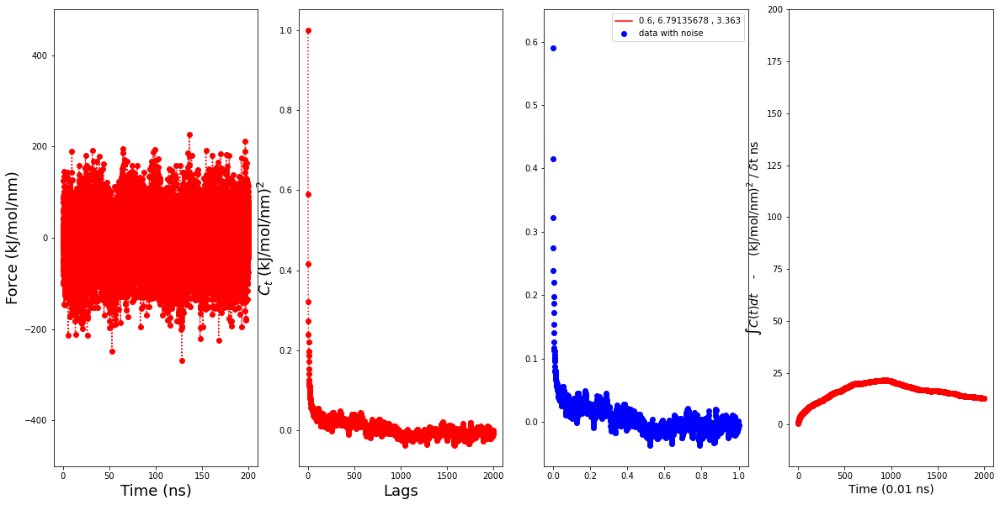

1
2
[ 1.          0.61232345  0.44505357 ... -0.01368543 -0.01884084
 -0.01117547]
[ 1.          0.61232345  0.44505357 ... -0.01368543 -0.01884084
 -0.01117547]
2001
0.6533150742747318 5.709951497480888 3.4635141351331247
Gamma function value is
0.017307106354968394


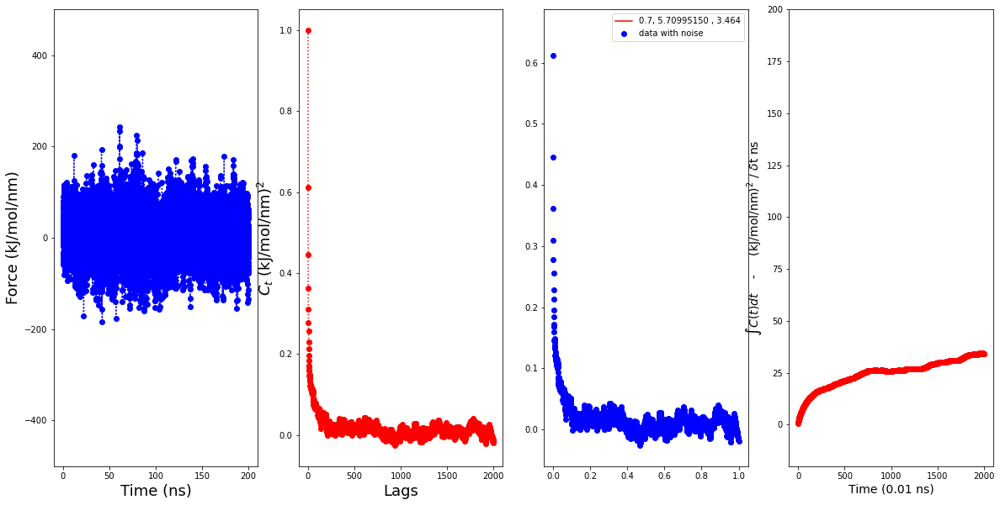

2
3
[1.         0.60076188 0.44104996 ... 0.00873991 0.00289715 0.00521024]
[1.         0.60076188 0.44104996 ... 0.00873991 0.00289715 0.00521024]
2001
0.6460939158204453 4.8119366662852 3.995193389826191
Gamma function value is
0.028931039763996993


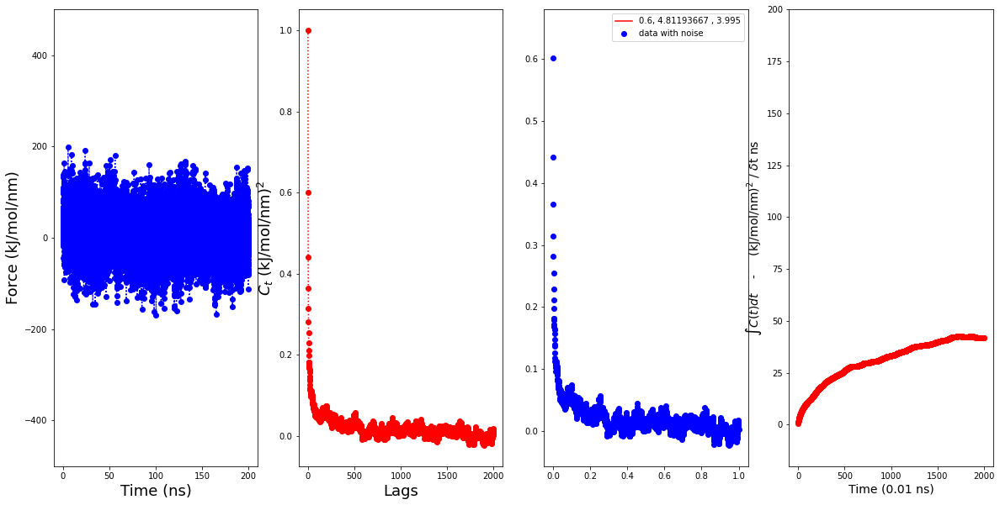

3
4
[1.         0.5638458  0.39102475 ... 0.00855268 0.01464921 0.00660186]
[1.         0.5638458  0.39102475 ... 0.00855268 0.01464921 0.00660186]
2001
0.6006224252710162 8.317273373165596 2.988022705612825
Gamma function value is
0.006328542286184505


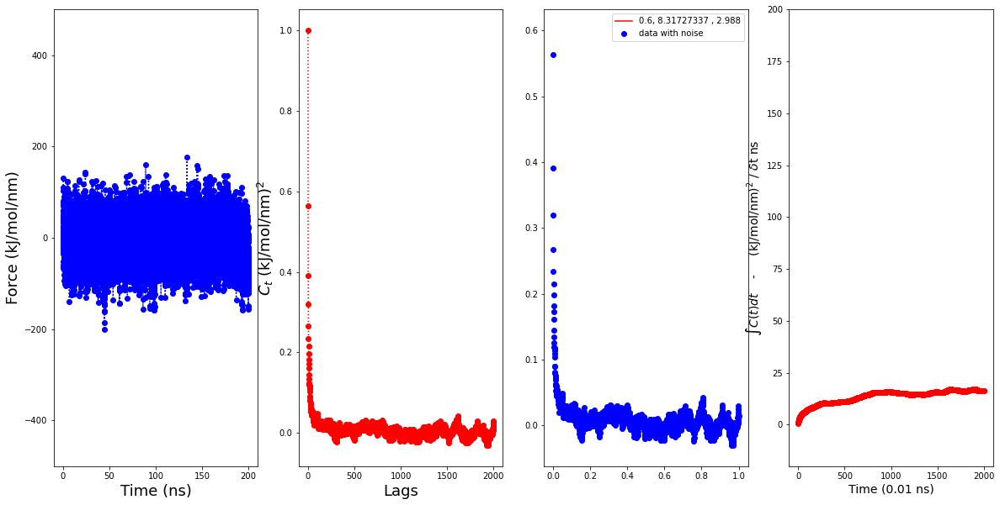

4
5
[ 1.00000000e+00  6.74782149e-01  5.31950026e-01 ...  5.45738937e-04
 -5.73873320e-04  6.46494428e-04]
[ 1.00000000e+00  6.74782149e-01  5.31950026e-01 ...  5.45738937e-04
 -5.73873320e-04  6.46494428e-04]
2001
0.7520302400882569 5.308435756230563 3.440987520252512
Gamma function value is
0.025815026489836038


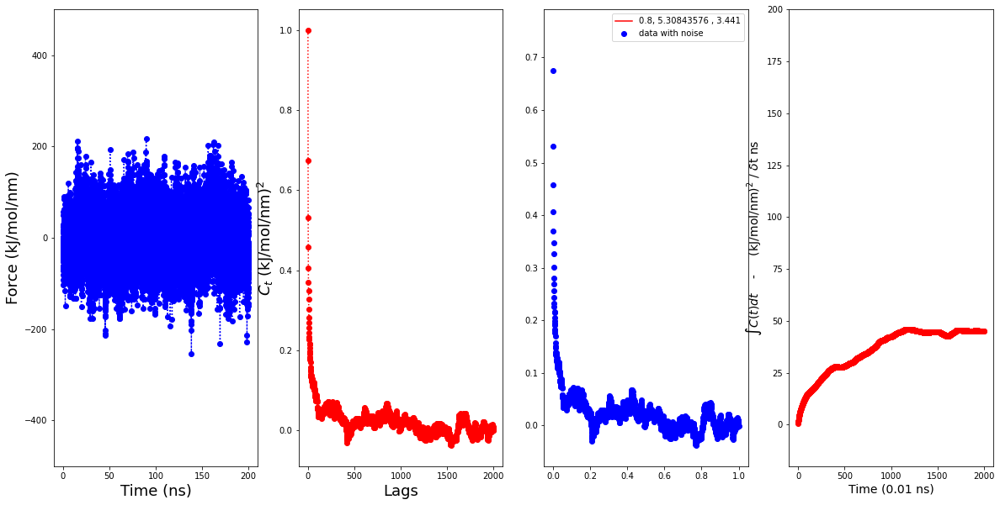

5
6
[ 1.          0.60257013  0.44191906 ... -0.02833972 -0.02274274
 -0.01540734]
[ 1.          0.60257013  0.44191906 ... -0.02833972 -0.02274274
 -0.01540734]
2001
0.09699845414193692 1.752522782021616 -985340.6674169829
Gamma function value is
nan


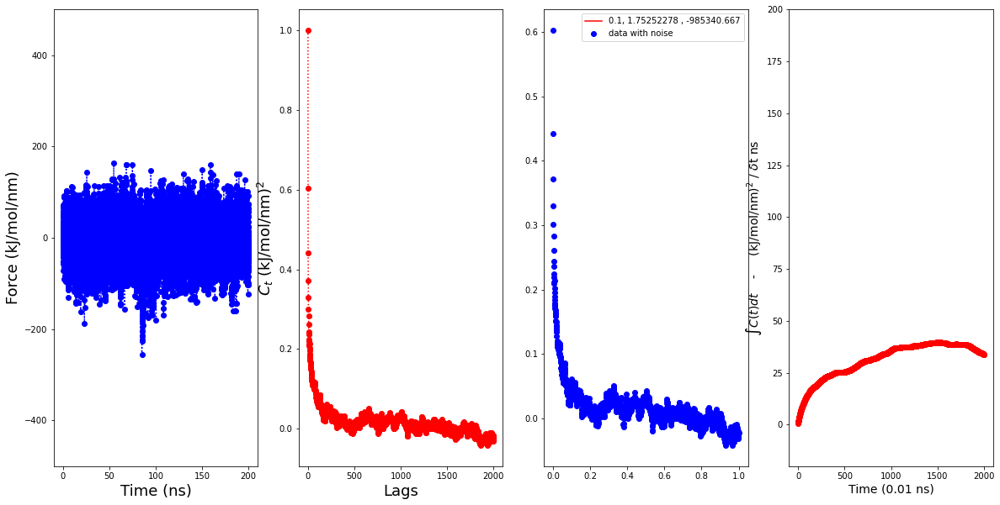

6
7
[1.         0.53275629 0.38023404 ... 0.01427209 0.00835508 0.00409989]
[1.         0.53275629 0.38023404 ... 0.01427209 0.00835508 0.00409989]
2001
0.584431305711233 5.19232847124115 3.822827438731124
Gamma function value is
0.019855413327702964


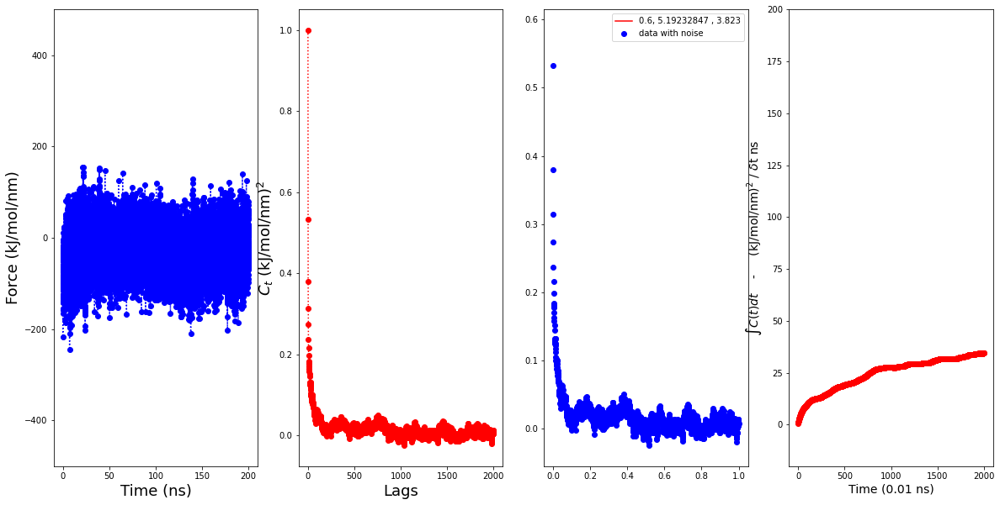

7
8
[ 1.          0.50171932  0.33429699 ... -0.00864924 -0.0135968
 -0.01471783]
[ 1.          0.50171932  0.33429699 ... -0.00864924 -0.0135968
 -0.01471783]
2001
0.39955122454056036 2.8681097651930996 -1533069.2595197812
Gamma function value is
nan


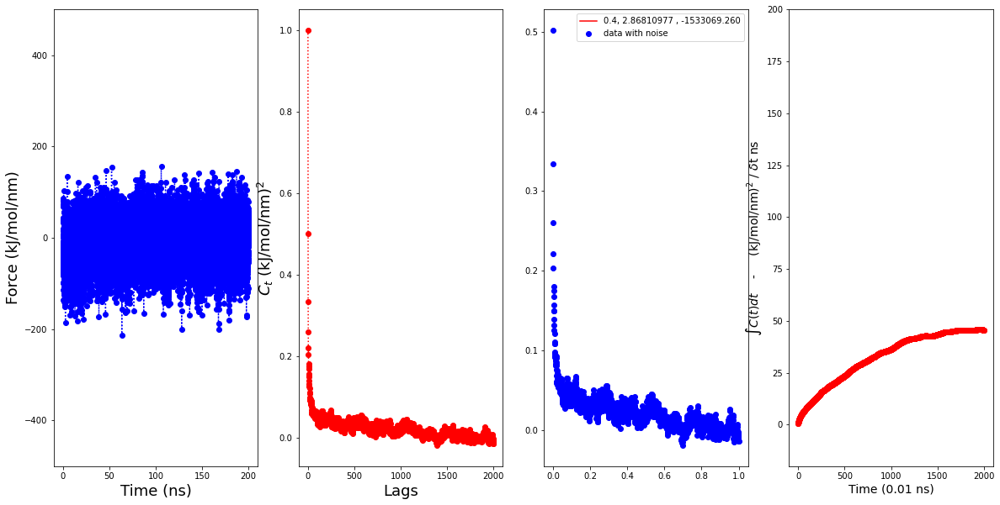

8
9
[ 1.          0.56793517  0.38726058 ... -0.02271506 -0.02489892
 -0.0247619 ]
[ 1.          0.56793517  0.38726058 ... -0.02271506 -0.02489892
 -0.0247619 ]
2001
0.32702828801247463 2.8969019068876234 -1401577.604508919
Gamma function value is
nan


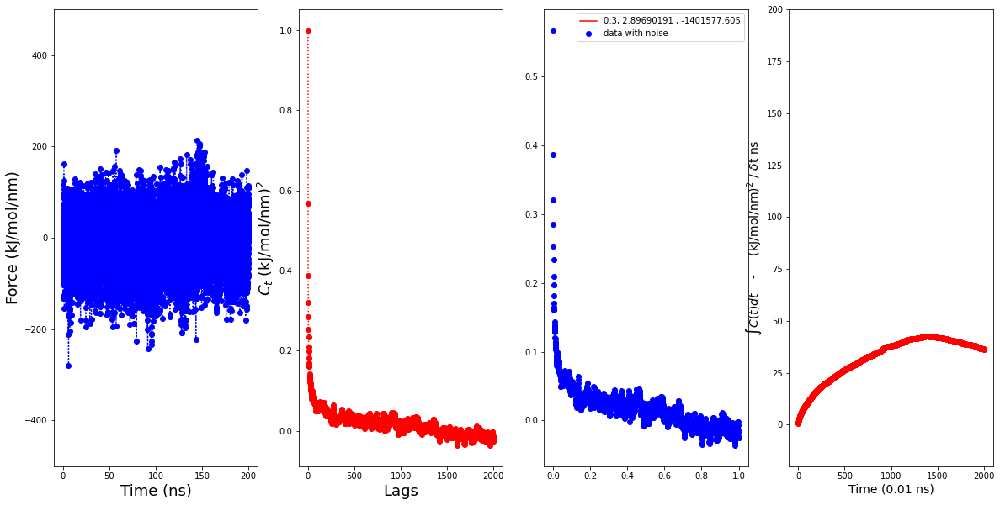

9
10
[1.00000000e+00 5.80262862e-01 4.05296117e-01 ... 9.90836380e-03
 4.85569888e-03 3.69914023e-04]
[1.00000000e+00 5.80262862e-01 4.05296117e-01 ... 9.90836380e-03
 4.85569888e-03 3.69914023e-04]
2001
0.607115870669834 11.33858122493391 2.5168055143078845
Gamma function value is
0.004558272268209692


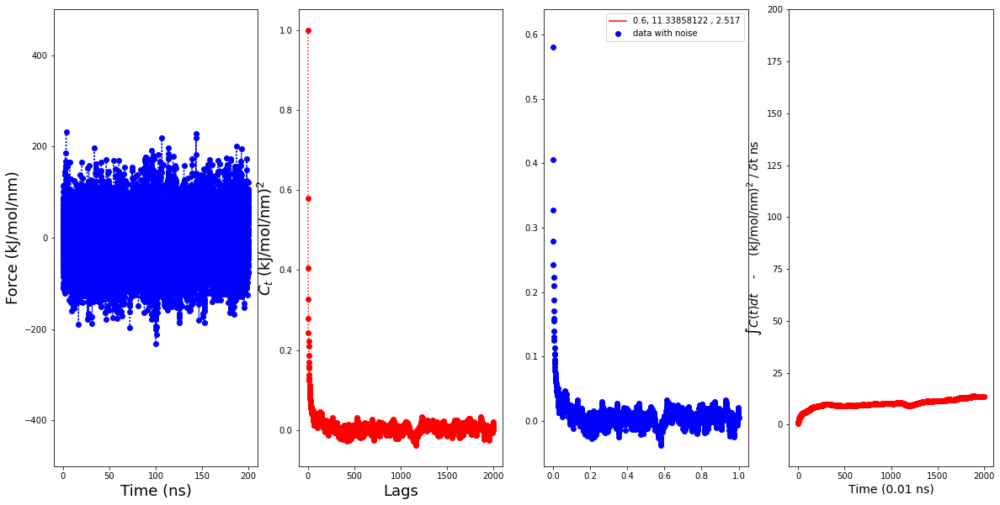

10
11
[1.         0.59992137 0.42936682 ... 0.01587404 0.01893432 0.01453318]
[1.         0.59992137 0.42936682 ... 0.01587404 0.01893432 0.01453318]
2001
0.6157729684831816 11.160201203945633 2.425813325057416
Gamma function value is
0.005424949093776328


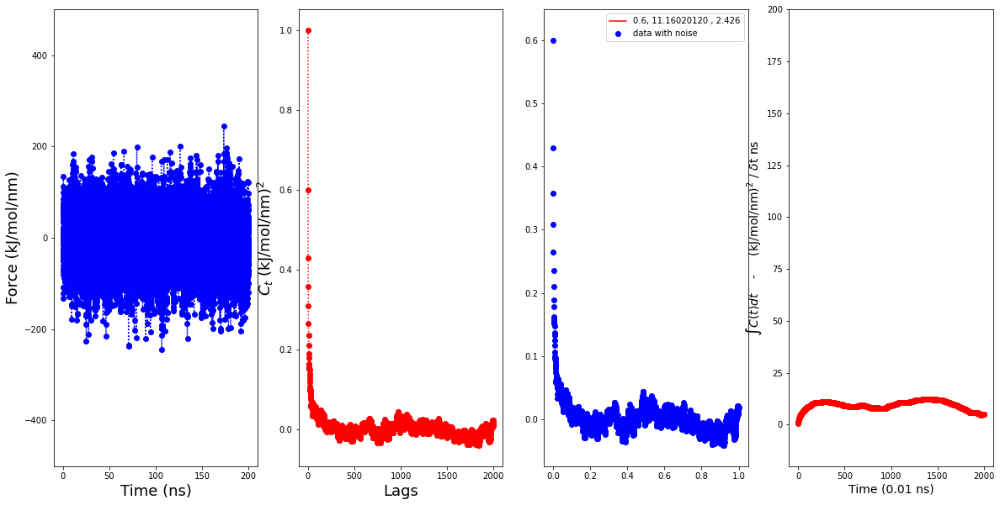

11
12
[ 1.00000000e+00  5.77206960e-01  3.87626001e-01 ...  9.01541861e-03
  8.85176537e-04 -3.80987503e-04]
[ 1.00000000e+00  5.77206960e-01  3.87626001e-01 ...  9.01541861e-03
  8.85176537e-04 -3.80987503e-04]
2001
0.595185357394252 13.130783403909264 2.4098521202636434
Gamma function value is
0.0036200352263348378


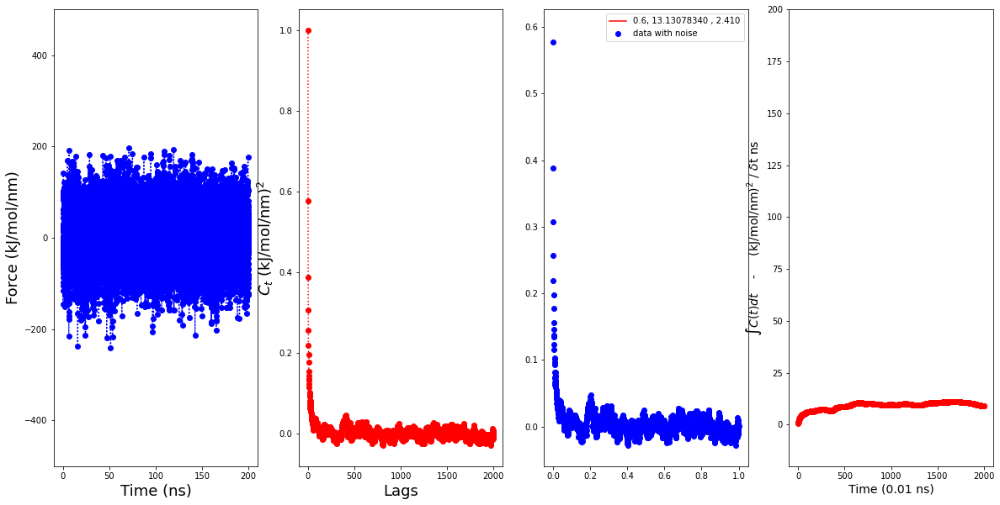

12
13
[1.         0.59588566 0.41159555 ... 0.00842635 0.00812126 0.01064355]
[1.         0.59588566 0.41159555 ... 0.00842635 0.00812126 0.01064355]
2001
0.6312212947569512 8.434464421126314 2.9613287171842426
Gamma function value is
0.006530832515887941


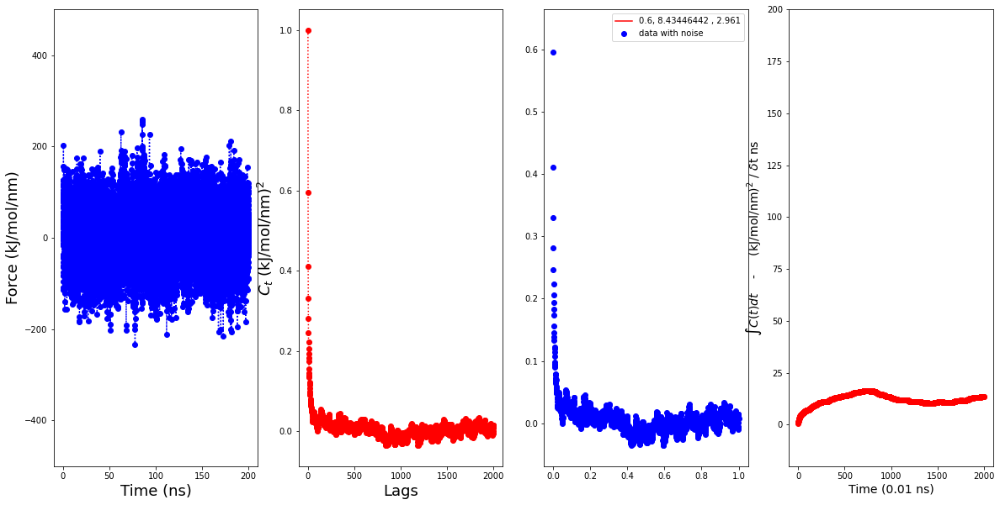

13
14
[1.         0.59254095 0.41686728 ... 0.01070038 0.01434643 0.01995279]
[1.         0.59254095 0.41686728 ... 0.01070038 0.01434643 0.01995279]
2001
0.45716865717820987 2.4671192560969506 -1519743.0364578252
Gamma function value is
nan


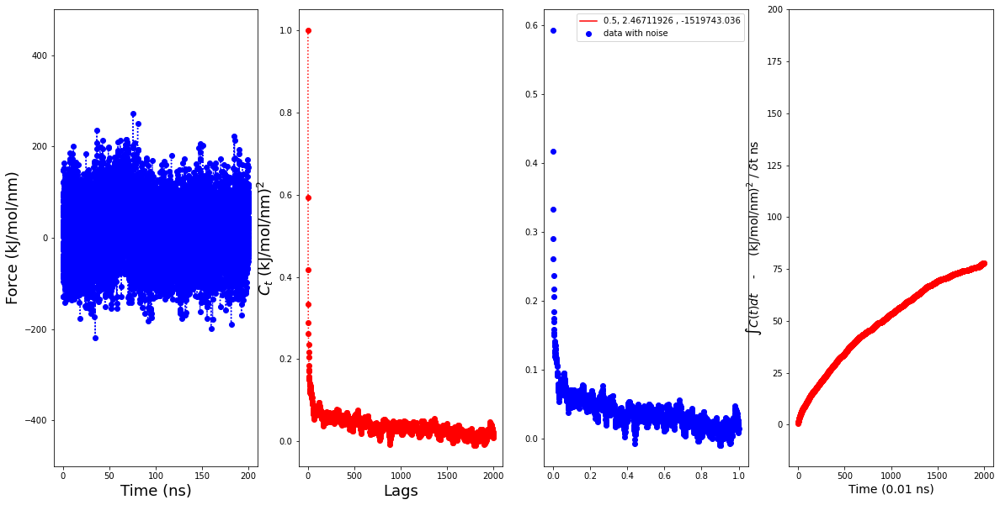

14
15
[ 1.          0.56314973  0.37951881 ... -0.01623927 -0.00903372
 -0.01861605]
[ 1.          0.56314973  0.37951881 ... -0.01623927 -0.00903372
 -0.01861605]
2001
0.015000479539242934 0.14087802624581025 -767310.4338813078
Gamma function value is
0.0


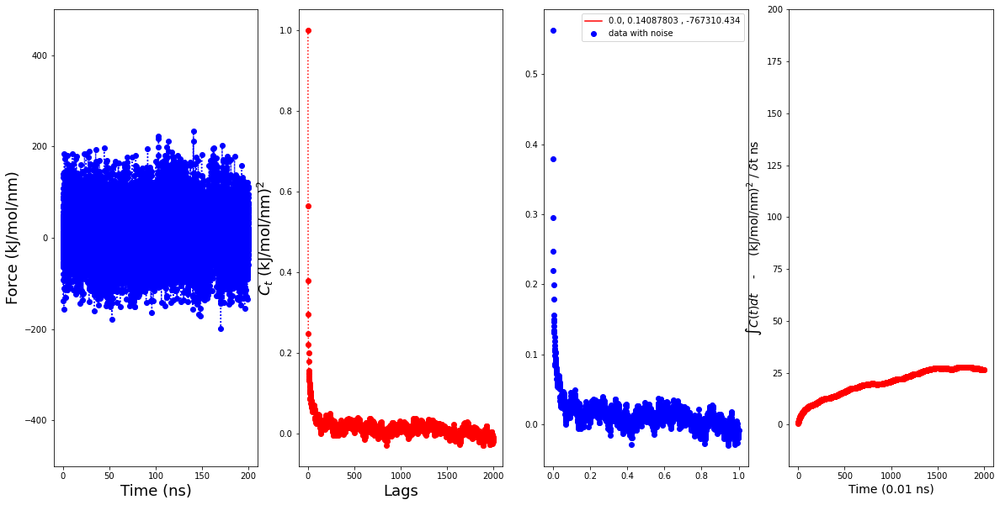

15
16
[1.         0.58205485 0.42407779 ... 0.02121666 0.02183446 0.024822  ]
[1.         0.58205485 0.42407779 ... 0.02121666 0.02183446 0.024822  ]
2001
0.02600200461075527 4.836419134665419e-05 -806089.9966924004
Gamma function value is
-0.0


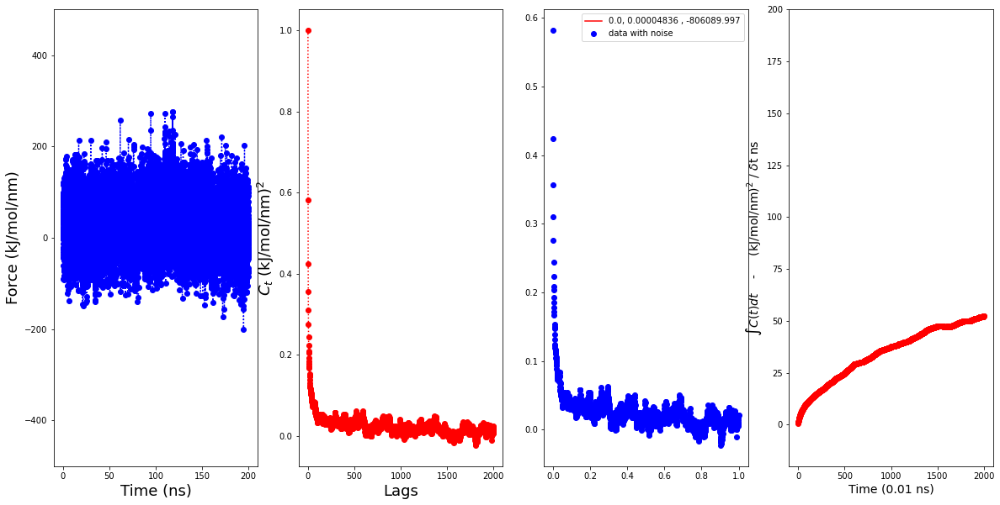

16
17
[1.         0.54984561 0.38192563 ... 0.00576275 0.00412875 0.0087948 ]
[1.         0.54984561 0.38192563 ... 0.00576275 0.00412875 0.0087948 ]
2001
0.571183832561096 6.251370295976282 3.29921088099687
Gamma function value is
0.01195178380447659


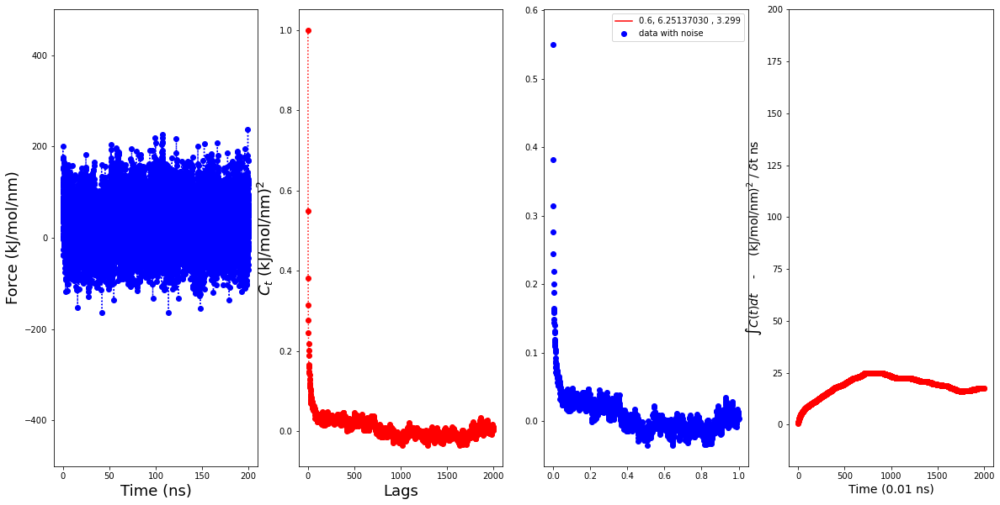

17
18
[1.         0.56855984 0.4195059  ... 0.00412243 0.0100456  0.01735435]
[1.         0.56855984 0.4195059  ... 0.00412243 0.0100456  0.01735435]
2001
0.5991218097604146 4.610129949565428 3.6983773580731882
Gamma function value is
0.03237771611037149


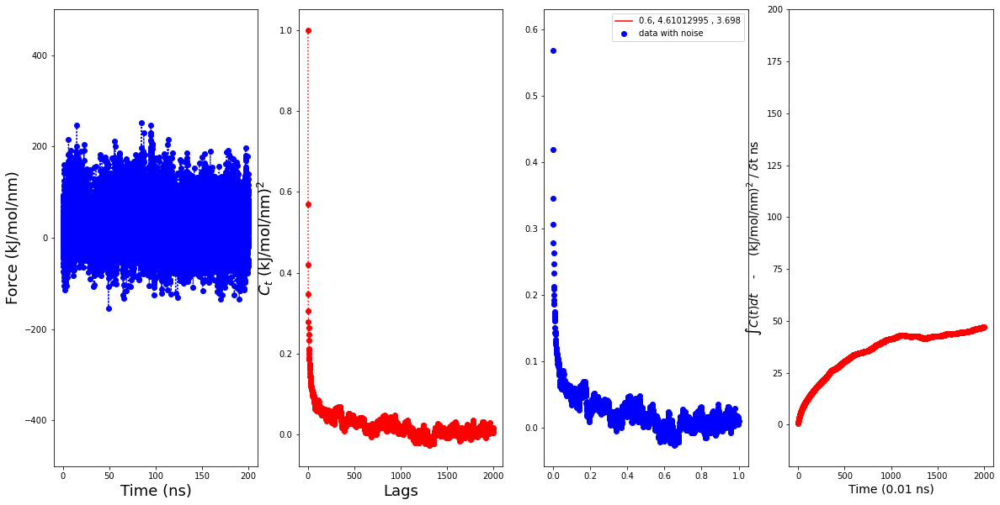

18
19
[1.         0.58196405 0.43627937 ... 0.03536786 0.02747743 0.02930676]
[1.         0.58196405 0.43627937 ... 0.03536786 0.02747743 0.02930676]
2001
0.6067181623818564 4.033486295818345 3.8945551264473006
Gamma function value is
0.05443885853280247


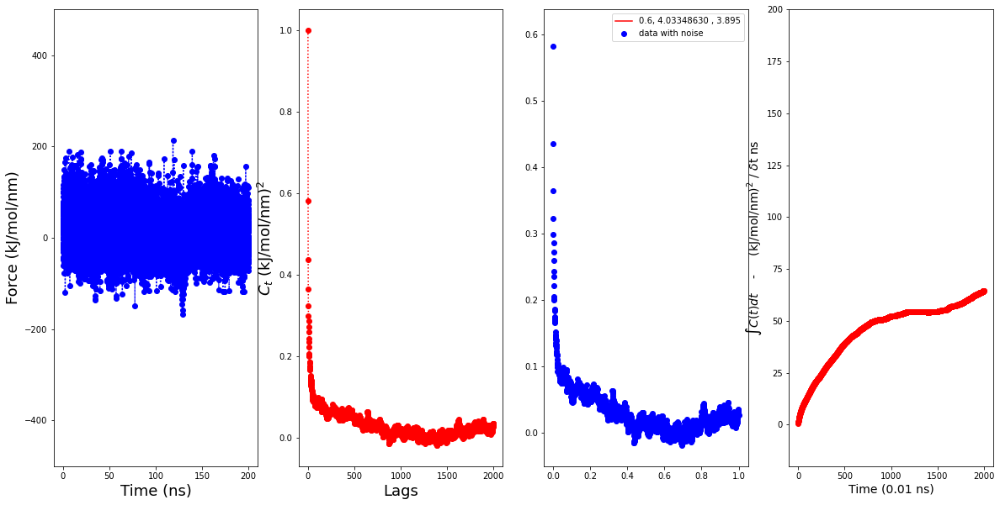

19
20
[1.         0.61198506 0.45335856 ... 0.01277583 0.00977976 0.0153853 ]
[1.         0.61198506 0.45335856 ... 0.01277583 0.00977976 0.0153853 ]
2001
0.6567139256139963 4.285590600182236 4.047270253991683
Gamma function value is
0.04684851858174525


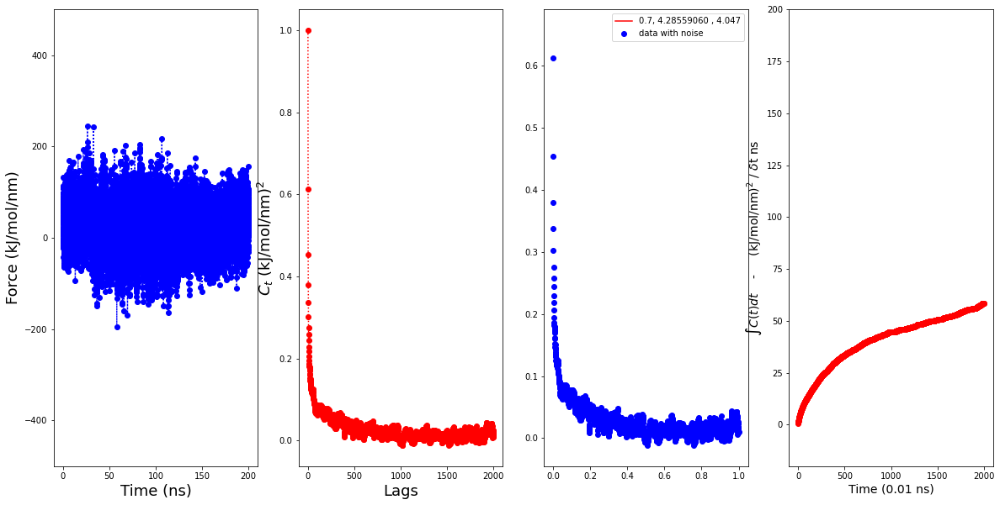

20
21
[ 1.          0.54185496  0.3824636  ... -0.01690556 -0.01335468
 -0.00369852]
[ 1.          0.54185496  0.3824636  ... -0.01690556 -0.01335468
 -0.00369852]
2001
0.2672678504516928 3.0273439128860007 -1485559.2475196852
Gamma function value is
nan


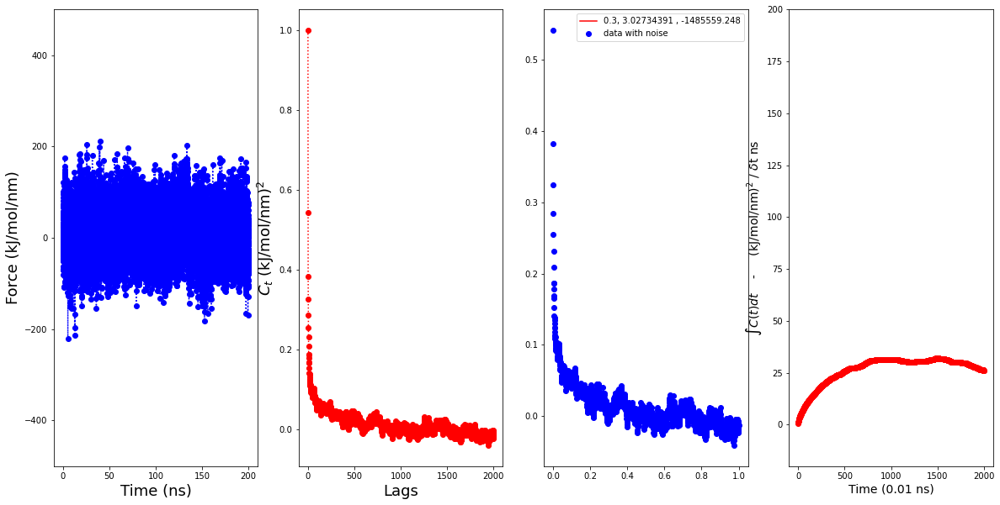

21
22
[ 1.00000000e+00  5.24889273e-01  3.64730918e-01 ...  4.71486616e-03
  3.51914122e-03 -2.31510167e-04]
[ 1.00000000e+00  5.24889273e-01  3.64730918e-01 ...  4.71486616e-03
  3.51914122e-03 -2.31510167e-04]
2001
0.5534239404389115 5.320157429254457 3.666565401335704
Gamma function value is
0.017741879451722082


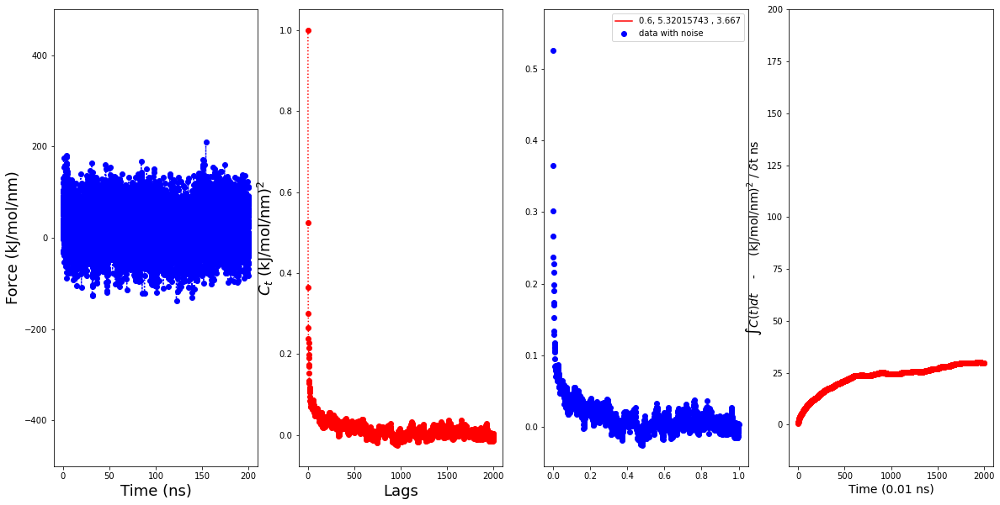

22
23
[1.         0.65017922 0.5101588  ... 0.00358147 0.00868667 0.00358417]
[1.         0.65017922 0.5101588  ... 0.00358147 0.00868667 0.00358417]
2001
0.36285089158669576 2.0303385890677568 -1430463.0405058672
Gamma function value is
nan


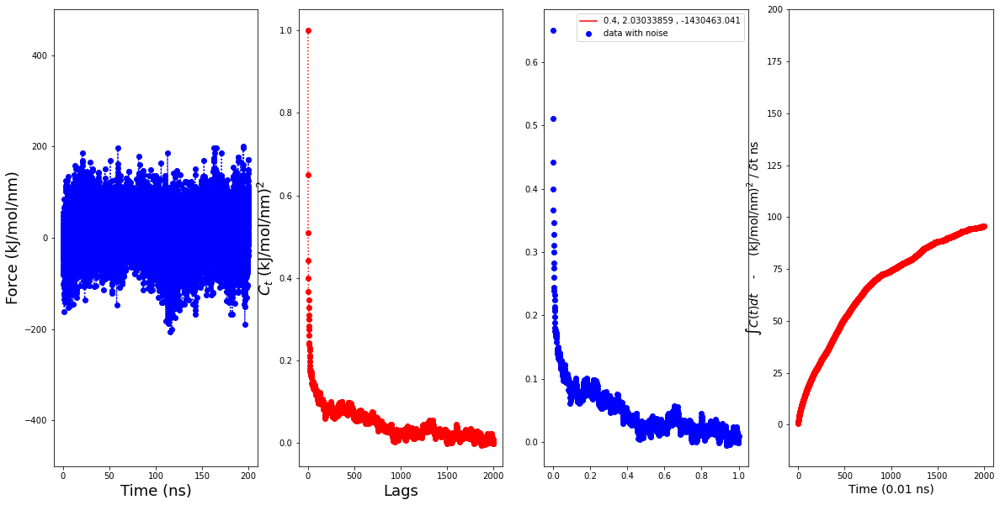

23
24
[ 1.00000000e+00  7.36619708e-01  6.06880957e-01 ... -3.41014520e-04
 -1.35046505e-03 -4.96662957e-03]
[ 1.00000000e+00  7.36619708e-01  6.06880957e-01 ... -3.41014520e-04
 -1.35046505e-03 -4.96662957e-03]
2001
0.2593681239481905 1.7132725127310022 -1389860.9796564989
Gamma function value is
nan


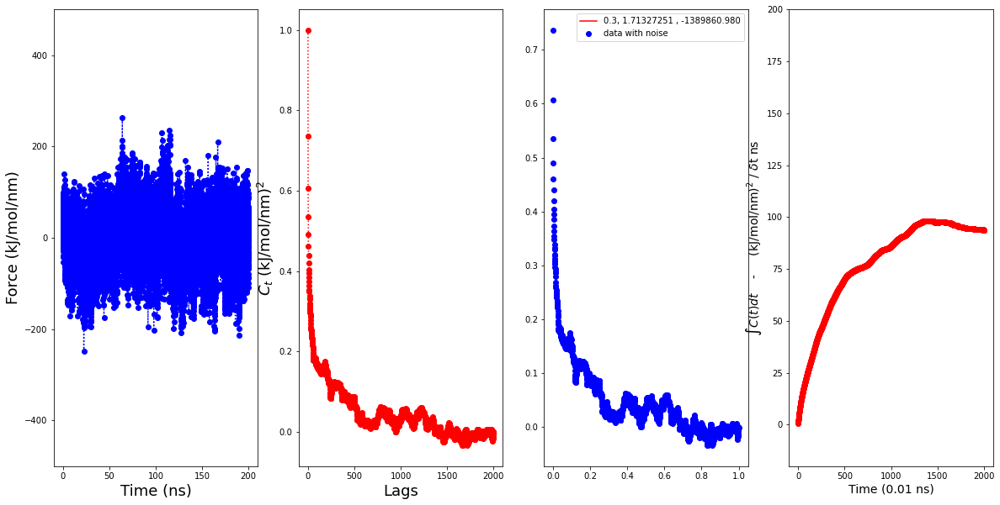

24
25
[1.         0.60128375 0.43325252 ... 0.02959499 0.01936639 0.02150311]
[1.         0.60128375 0.43325252 ... 0.02959499 0.01936639 0.02150311]
2001
0.6312540191727238 11.858841616717259 2.4418286088691508
Gamma function value is
0.004693836067852332


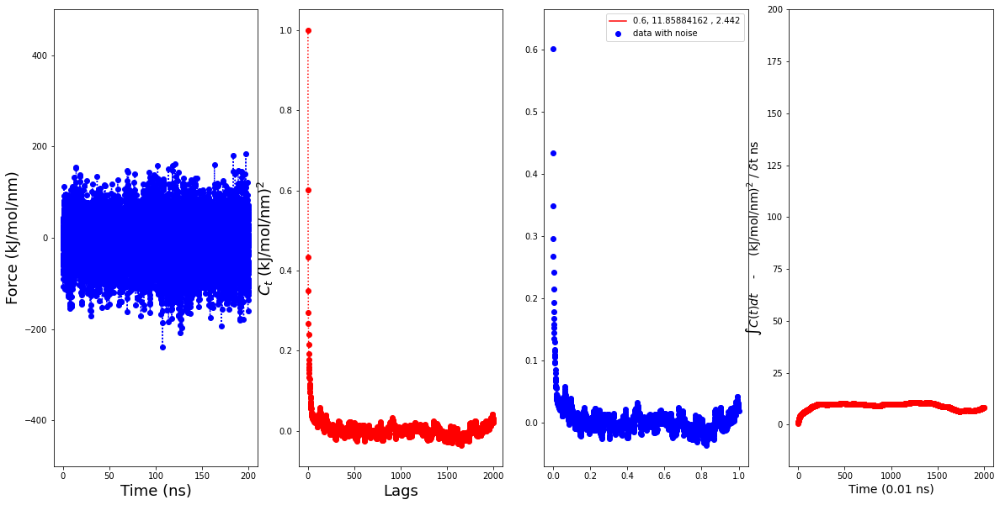

25
26
[ 1.          0.65576498  0.50443686 ...  0.00536793 -0.00196281
 -0.00125492]
[ 1.          0.65576498  0.50443686 ...  0.00536793 -0.00196281
 -0.00125492]
2001
0.5119477969021459 2.9076190452038677 -1424599.56583067
Gamma function value is
nan


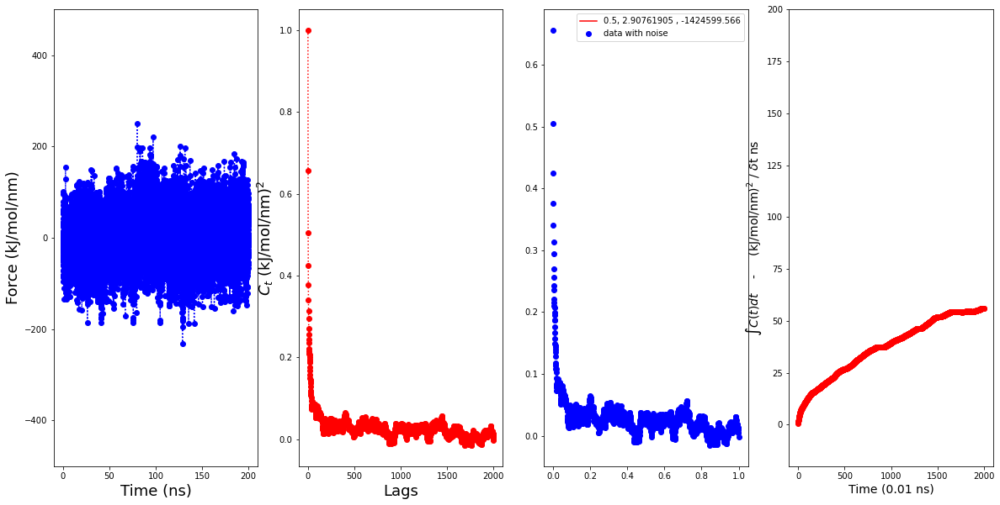

26
27
[1.         0.62970589 0.46244648 ... 0.01128314 0.00976553 0.01244791]
[1.         0.62970589 0.46244648 ... 0.01128314 0.00976553 0.01244791]
2001
0.02289105531660355 0.0015501151521960567 -952219.168452996
Gamma function value is
-0.0


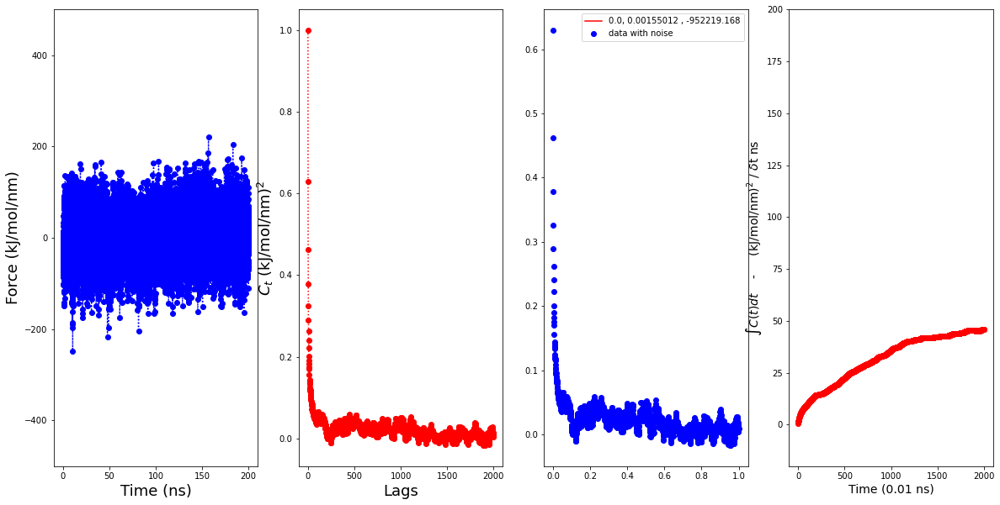

27
28
[1.         0.61617024 0.45498549 ... 0.01005445 0.00682705 0.00568042]
[1.         0.61617024 0.45498549 ... 0.01005445 0.00682705 0.00568042]
2001
0.645191993662717 8.299698996404596 2.6926789548604546
Gamma function value is
0.008942227866456622


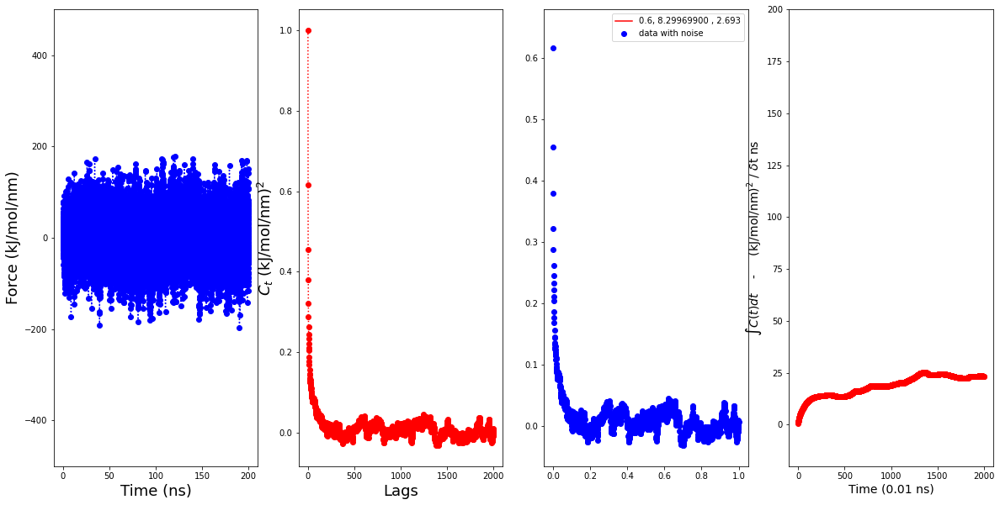

28
29
[ 1.          0.64359381  0.48335713 ... -0.01206183 -0.01482565
 -0.01437465]
[ 1.          0.64359381  0.48335713 ... -0.01206183 -0.01482565
 -0.01437465]
2001
0.6441606148278757 11.121834668907276 2.254935031449315
Gamma function value is
0.007219871452154691


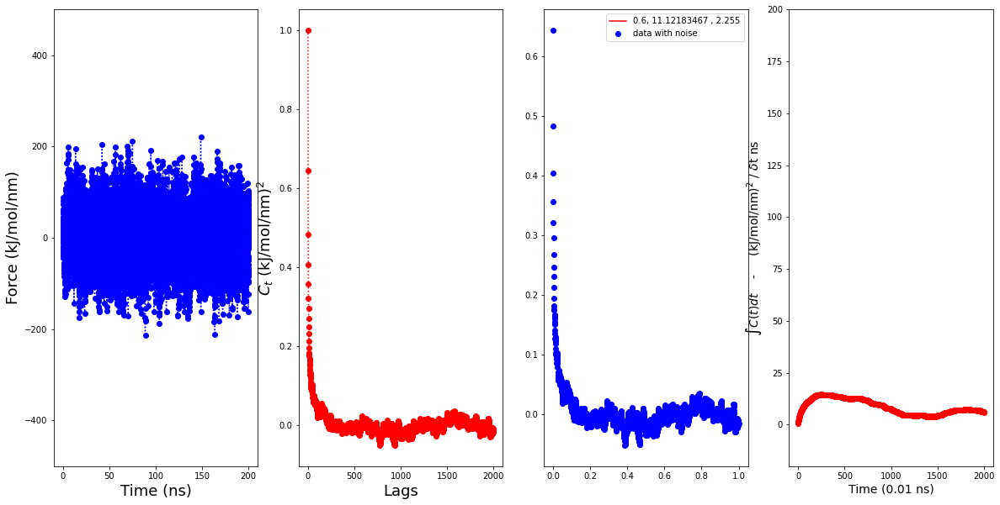

29
30
[1.         0.66537774 0.51602475 ... 0.00987066 0.011482   0.01208664]
[1.         0.66537774 0.51602475 ... 0.00987066 0.011482   0.01208664]
2001
0.6940482592267387 5.207331606929598 3.168040402722431
Gamma function value is
0.027711408390455956


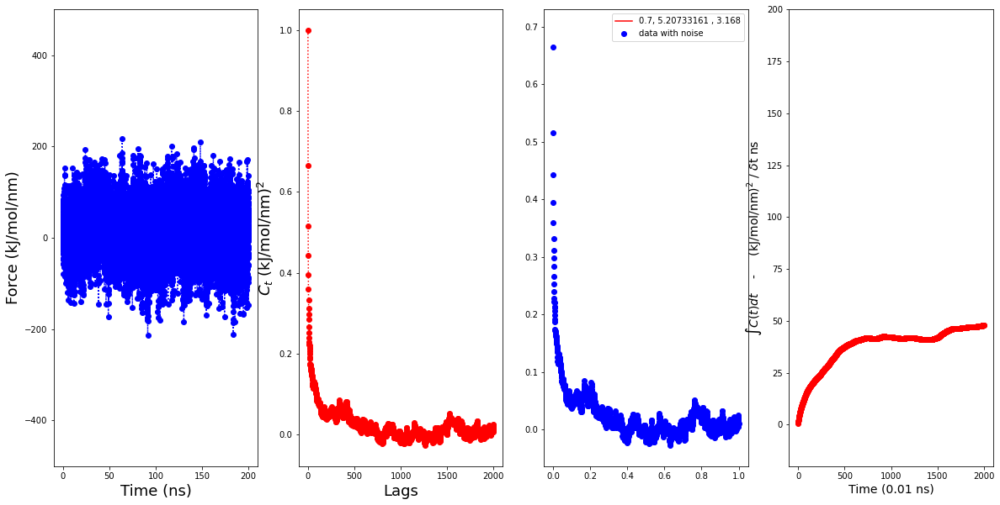

30
31
[1.         0.64568482 0.48737698 ... 0.03884912 0.0425868  0.03666793]
[1.         0.64568482 0.48737698 ... 0.03884912 0.0425868  0.03666793]
2001
0.7485277473531516 4.105201083311519 4.920899334316038
Gamma function value is
0.07531291351062207


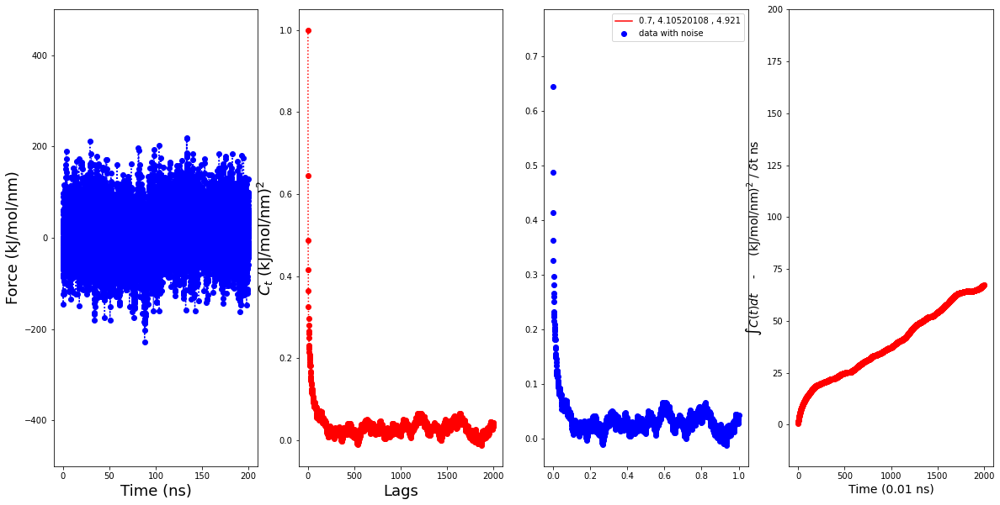

31
32
[ 1.00000000e+00  5.84707076e-01  4.29699235e-01 ... -9.91657628e-04
 -7.68192054e-04 -2.71498445e-03]
[ 1.00000000e+00  5.84707076e-01  4.29699235e-01 ... -9.91657628e-04
 -7.68192054e-04 -2.71498445e-03]
2001
0.11814987347290878 1.1485123489168683 -1523696.3195133943
Gamma function value is
nan


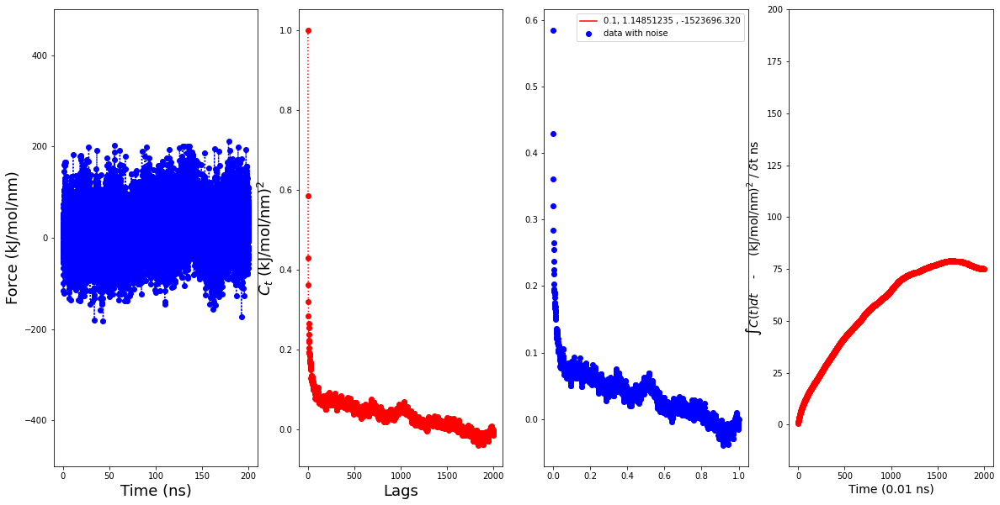

32
33
[ 1.          0.62174138  0.45428755 ... -0.00313178 -0.00163138
 -0.00153565]
[ 1.          0.62174138  0.45428755 ... -0.00313178 -0.00163138
 -0.00153565]
2001
0.6842499069173742 5.339096985043625 3.650759869837637
Gamma function value is
0.021736843305379724


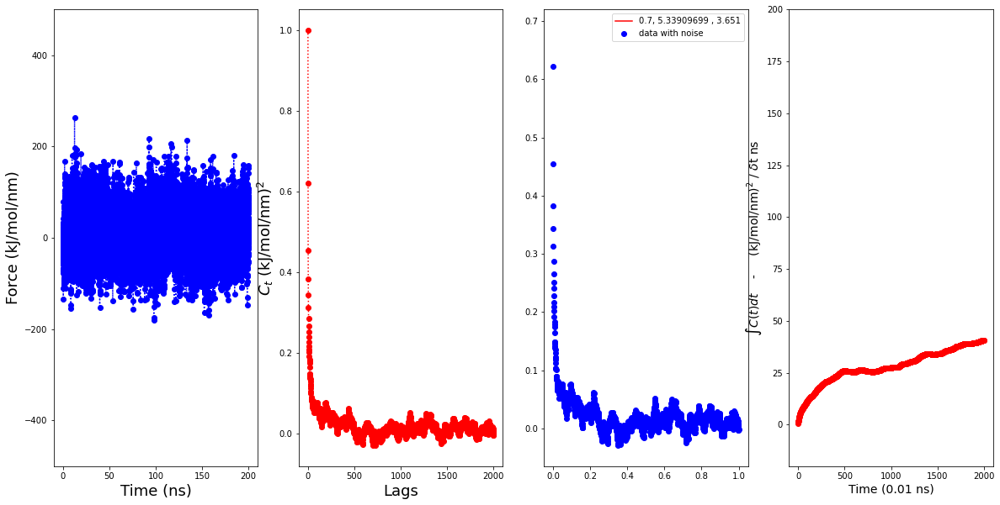

33
34
[ 1.00000000e+00  6.46094640e-01  4.93292758e-01 ... -3.43603407e-03
 -5.05679951e-04 -2.18118932e-03]
[ 1.00000000e+00  6.46094640e-01  4.93292758e-01 ... -3.43603407e-03
 -5.05679951e-04 -2.18118932e-03]
2001
0.6795083979567097 7.063395719084989 2.824722557458803
Gamma function value is
0.013134864655421881


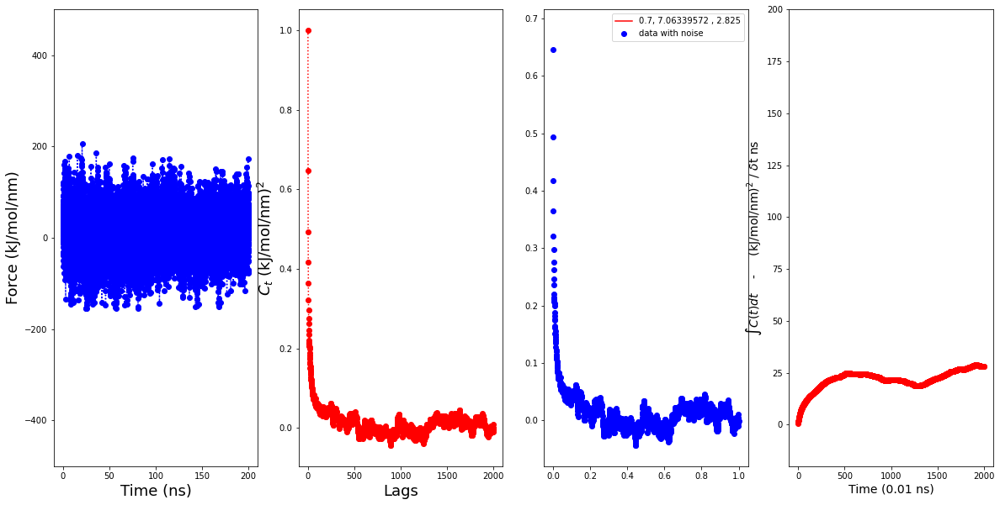

34
35
[1.         0.56943198 0.42222246 ... 0.01113068 0.01274477 0.02156876]
[1.         0.56943198 0.42222246 ... 0.01113068 0.01274477 0.02156876]
2001
0.5351094484960358 7.513980966872639 2.4573161512528765
Gamma function value is
0.011951180519958906


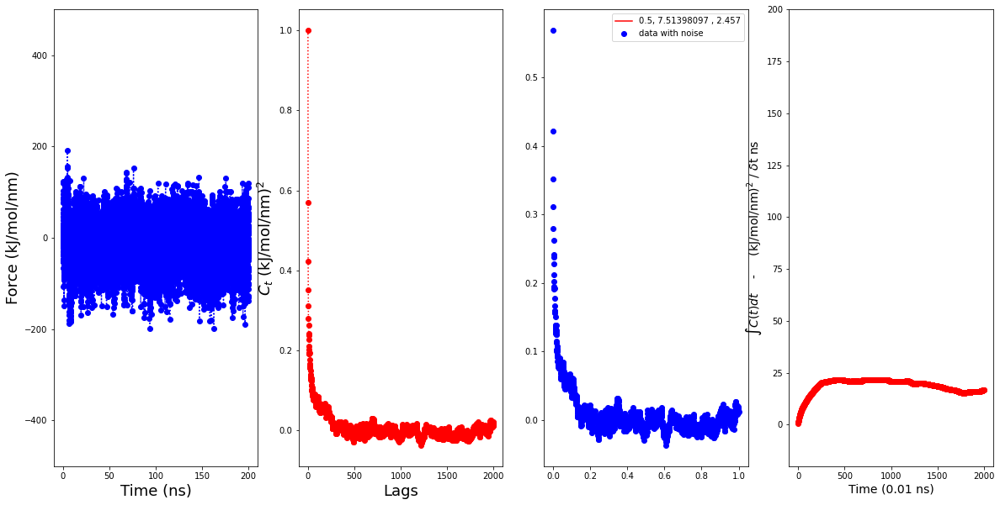

35
36
[1.         0.59979963 0.4499896  ... 0.00728963 0.00489403 0.00493986]
[1.         0.59979963 0.4499896  ... 0.00728963 0.00489403 0.00493986]
2001
0.5770536175622782 5.985569459450396 2.8314603064833888
Gamma function value is
0.017736200457614506


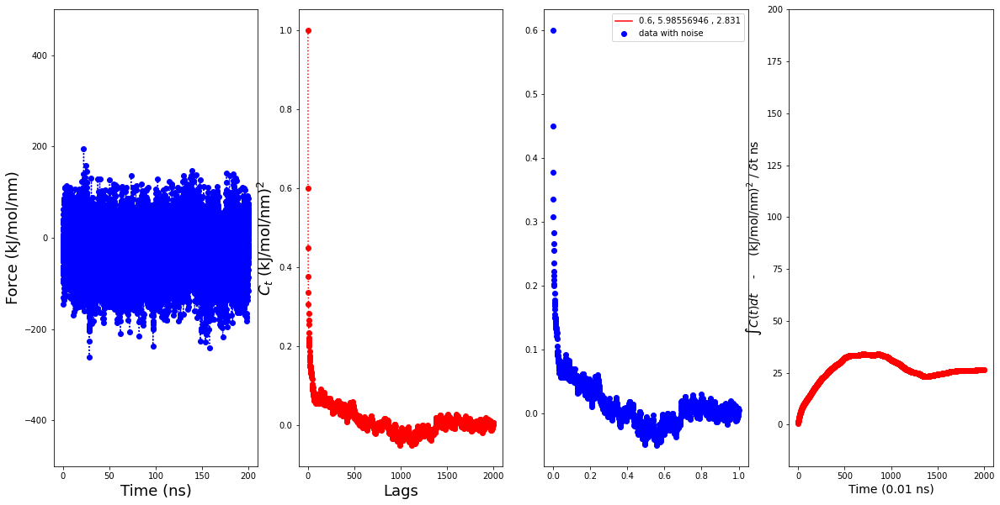

36
37
[1.         0.53135709 0.370656   ... 0.03315472 0.03646539 0.04585684]
[1.         0.53135709 0.370656   ... 0.03315472 0.03646539 0.04585684]
2001
0.561307596471307 6.180335960230918 3.4440492396673785
Gamma function value is
0.011402029169517948


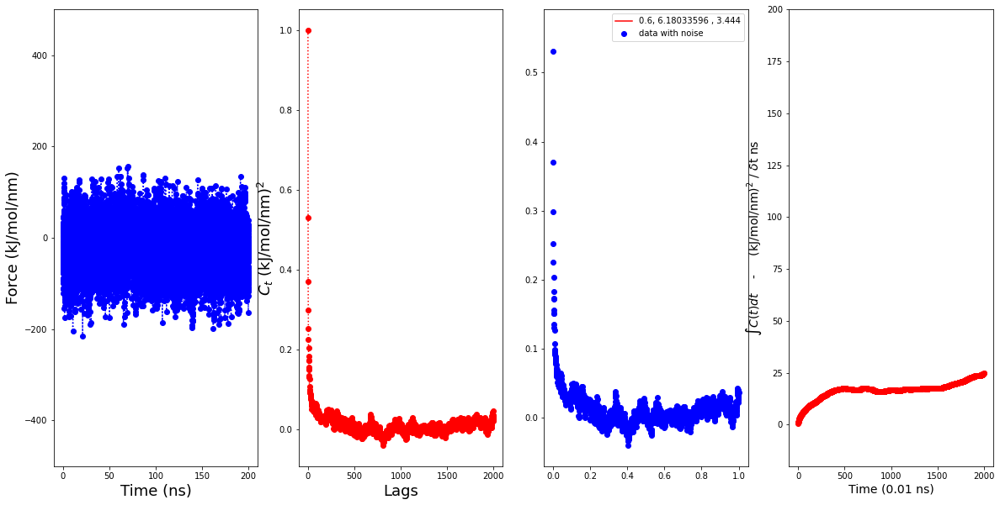

37
38
[ 1.          0.56061445  0.3898533  ... -0.01077633 -0.00858737
 -0.01001696]
[ 1.          0.56061445  0.3898533  ... -0.01077633 -0.00858737
 -0.01001696]
2001
0.5797861166479756 5.874221578384932 3.227969211320112
Gamma function value is
0.01537341822229555


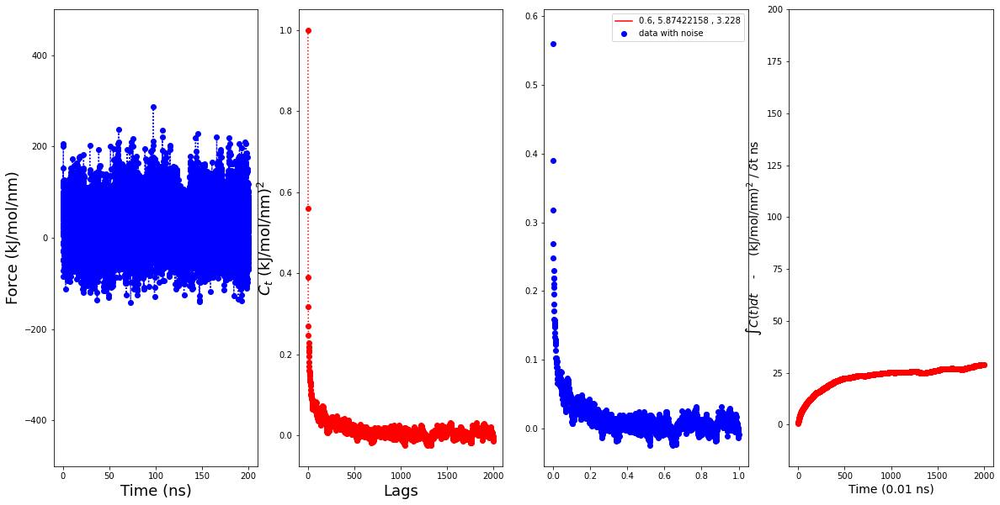

38
39
[ 1.          0.55371384  0.37886224 ... -0.00903482 -0.00873456
 -0.00907002]
[ 1.          0.55371384  0.37886224 ... -0.00903482 -0.00873456
 -0.00907002]
2001
0.5749876197793163 5.455166462715054 3.753363342893705
Gamma function value is
0.01644427751445924


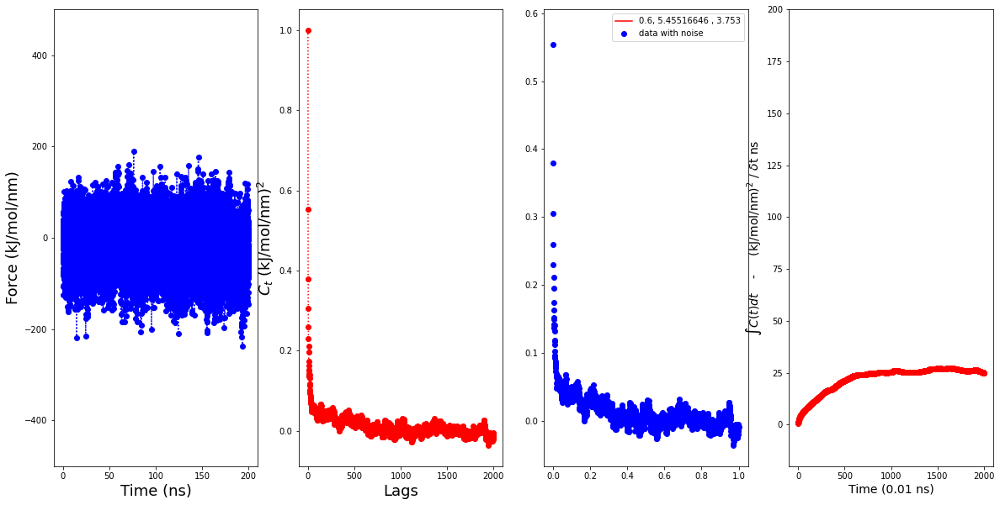

39
40
[ 1.          0.56585397  0.38626363 ... -0.02474643 -0.02154696
 -0.02955396]
[ 1.          0.56585397  0.38626363 ... -0.02474643 -0.02154696
 -0.02955396]
2001
0.5035685816655636 6.209276354248851 2.90424565151626
Gamma function value is
0.013346208059709961


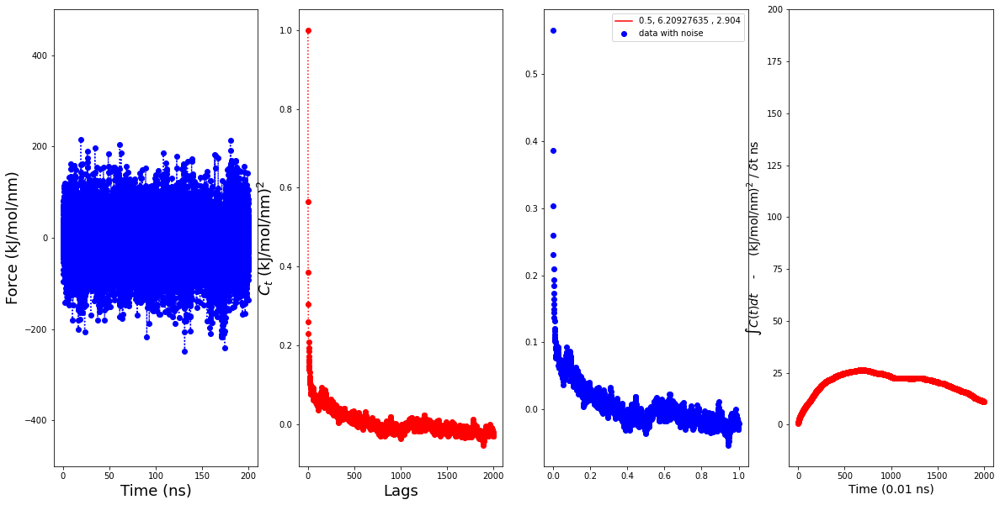

40
41
[1.         0.54874231 0.36996461 ... 0.01891403 0.02147112 0.01174722]
[1.         0.54874231 0.36996461 ... 0.01891403 0.02147112 0.01174722]
2001
0.5813425569777799 5.673375751533427 3.9842807677076073
Gamma function value is
0.013516272450489246


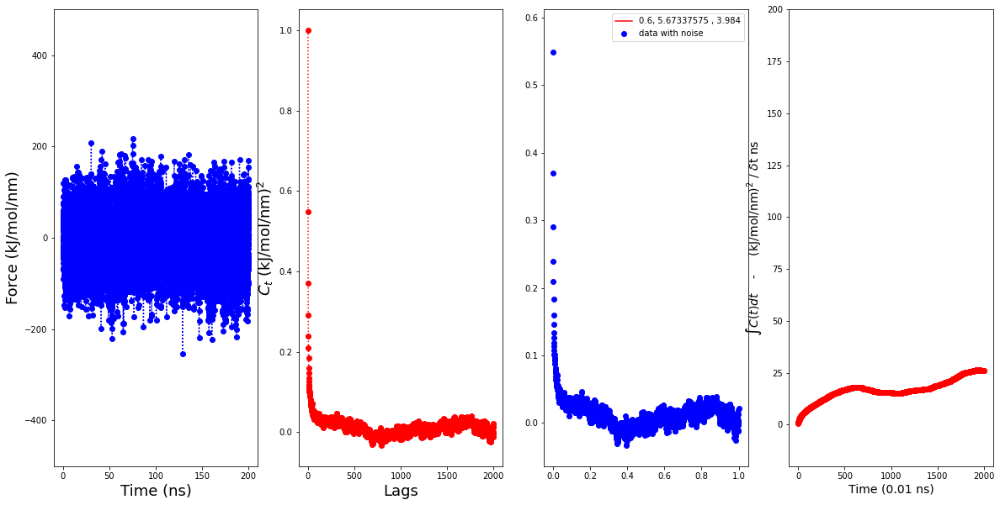

41
42
[ 1.          0.58383929  0.43019002 ... -0.00957298 -0.00255644
 -0.00143138]
[ 1.          0.58383929  0.43019002 ... -0.00957298 -0.00255644
 -0.00143138]
2001
0.5556535091787832 12.480369232059202 2.016744341606751
Gamma function value is
0.006946372028220189


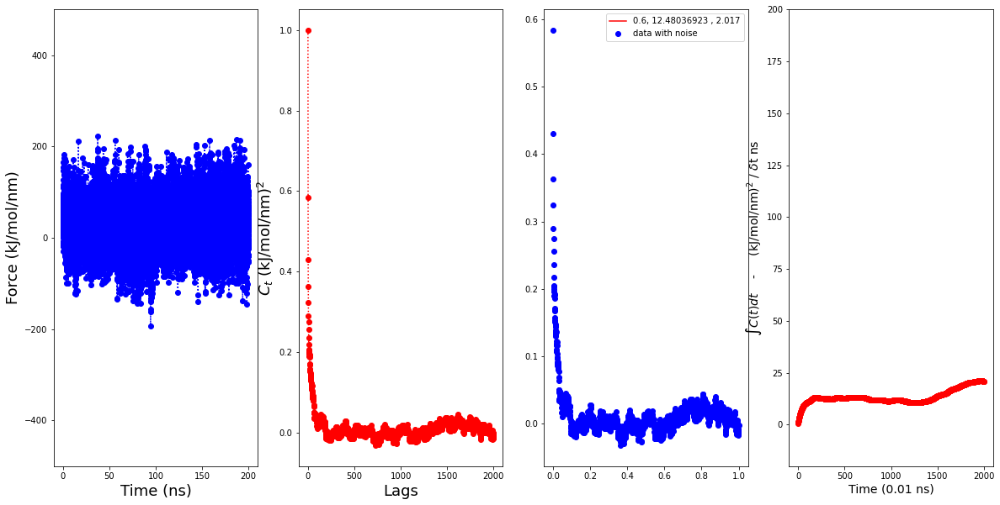

42
43
[ 1.          0.58509123  0.41818954 ... -0.01349568 -0.00713661
 -0.00569504]
[ 1.          0.58509123  0.41818954 ... -0.01349568 -0.00713661
 -0.00569504]
2001
0.5844873457923162 5.562994358959595 3.1795819215436882
Gamma function value is
0.018839866970431596


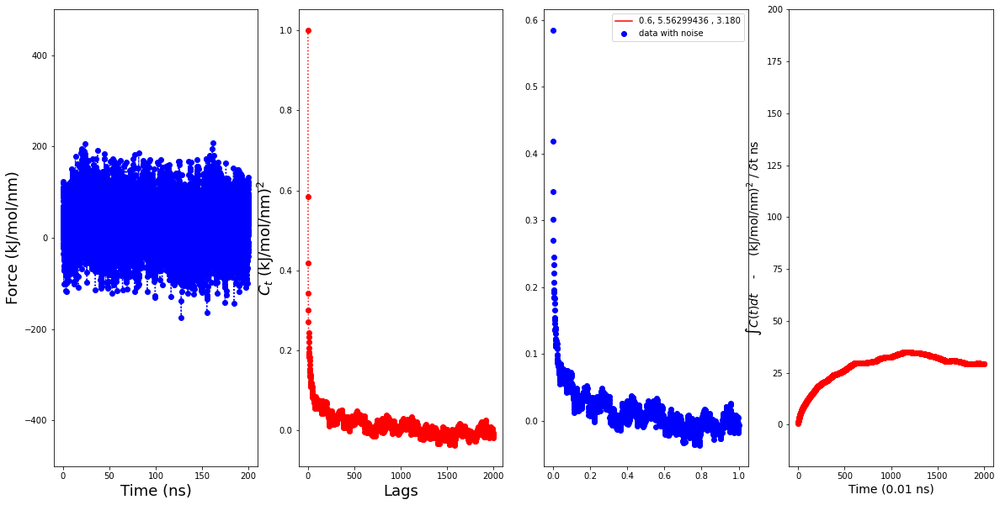

43
44
[1.         0.55605034 0.39549813 ... 0.01219532 0.01137926 0.01902516]
[1.         0.55605034 0.39549813 ... 0.01219532 0.01137926 0.01902516]
2001
0.5958015491659675 5.576871004531638 3.4957462670102473
Gamma function value is
0.01694294672741871


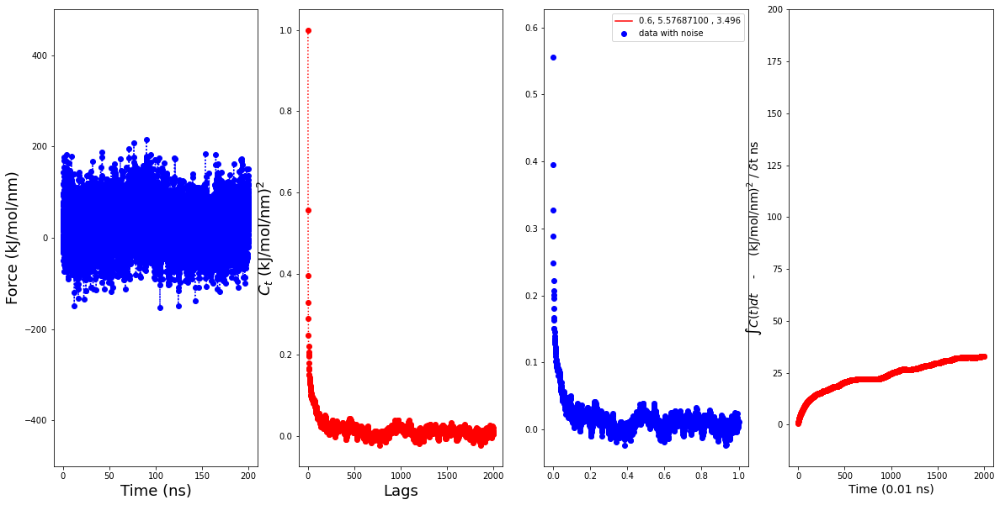

44
45
[1.         0.66727516 0.52206255 ... 0.03501084 0.03358213 0.03710734]
[1.         0.66727516 0.52206255 ... 0.03501084 0.03358213 0.03710734]
2001
0.7154232529824464 5.805994318165274 2.9353216655223333
Gamma function value is
0.022670782282192048


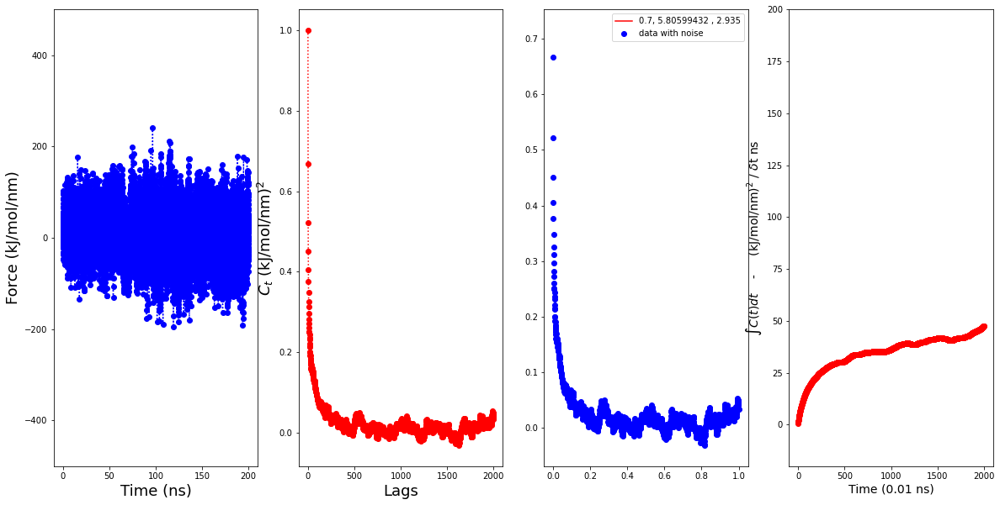

45
46
[1.         0.6200234  0.46001599 ... 0.01287211 0.01585621 0.01930347]
[1.         0.6200234  0.46001599 ... 0.01287211 0.01585621 0.01930347]
2001
0.6844955635849669 4.5691271568883405 4.080840103398658
Gamma function value is
0.037678841241001196


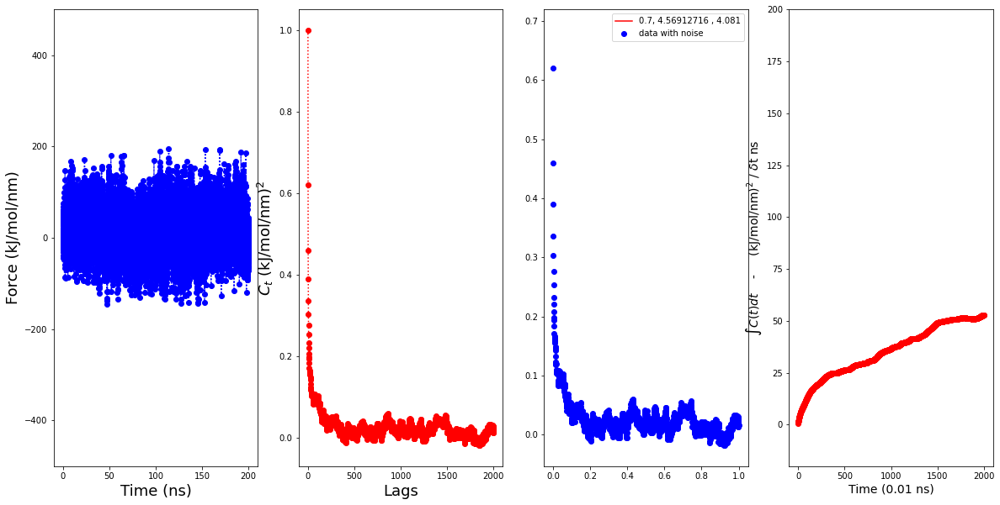

46
46
46
46
[ 9.49430244e-05  1.73071064e-04  2.89310398e-04  6.32854229e-05
  2.58150265e-04             nan  1.98554133e-04             nan
             nan  4.55827227e-05  5.42494909e-05  3.62003523e-05
  6.53083252e-05             nan  0.00000000e+00 -0.00000000e+00
  1.19517838e-04  3.23777161e-04  5.44388585e-04  4.68485186e-04
             nan  1.77418795e-04             nan             nan
  4.69383607e-05             nan -0.00000000e+00  8.94222787e-05
  7.21987145e-05  2.77114084e-04  7.53129135e-04             nan
  2.17368433e-04  1.31348647e-04  1.19511805e-04  1.77362005e-04
  1.14020292e-04  1.53734182e-04  1.64442775e-04  1.33462081e-04
  1.35162725e-04  6.94637203e-05  1.88398670e-04  1.69429467e-04
  2.26707823e-04  3.76788412e-04]


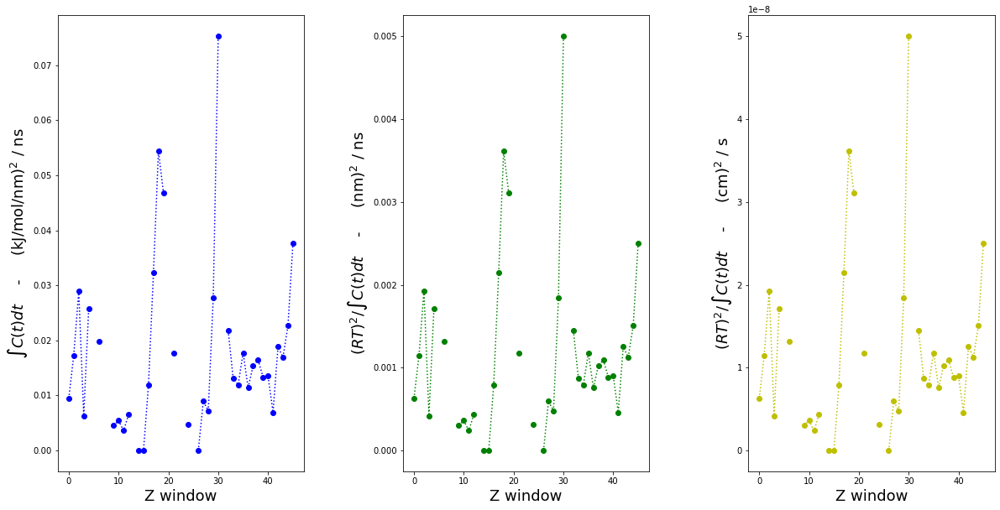

In [16]:
#Original data, 100, 1000. 
#Red, blue, black and purple at 500,000. 

#Correlation func & Integral: 1, 100, 1000.

#Auto-correlation
from statsmodels.graphics import tsaplots

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import os
import glob 
import errno
import statsmodels.api as sm
import scipy.integrate as scint
from scipy import integrate

from scipy.optimize import curve_fit
            
import math        
from numpy import array, hstack, vstack


import itertools

last = []
dz = []
bl = []
bla = range(20000)
bla2 = array([bla])
save_acf = array([bla])

bla3 = save_acf.T

bla4 = np.empty(shape=(20000,) * 1)

plt.figure(figsize=(20,6))
count=1

# create subplots

os.chdir('/Users/chrisjorg/Documents/Postdoc/Georgetown/Double_bilayer_Sandwich/Z_LPP/LPP_DPG_5000eq_0.2/All_new_/Convolve_100')
#os.chdir('/Users/chrisjorg/Documents/Postdoc/Georgetown/Double_bilayer_Sandwich/Z_LPP/LPP_Naphtha_5000eq_0.2/Force_prod/All_new2/Convolve_100')



with open('data.txt', 'w') as file:
    path = './*pullf.xvg' 
    path2 = os.getcwd()
    files = glob.glob(path)
    colors = itertools.cycle(["r", "b", "g","y","c","m"])
    
def key_func(x):
        return os.path.split(x)[-1]

for name in sorted(glob.glob('*_pullf.xvg_dt*'), key=key_func):
        try: 
            print(count)
            
            lines = open(name,'r')
            f = np.loadtxt(name)
            #plt.subplot(1, 1, count) 

            subplot_dim = (20, 10)
            X_=f[:,0]/1000
            Y=f[:,1]
            X_scale = np.linspace(0, 1, 20000) 
            
            X_scale_ = X_scale/100
            
           
            
            
            fig, (ax0, ax1, ax2, ax3) = plt.subplots(1, 4,figsize=(20,10))
            ax0.plot(X_,Y,':ro',label=name,color=next(colors))
             
            ax0.set_ylabel('Force (kJ/mol/nm)',fontsize=18)
            ax0.set_xlabel('Time (ns)',fontsize=18)
             
            ax0.set_ylim(-500, 500)

            colors = itertools.cycle(["r", "b", "g","y","c","m"])
            
            acf_ = sm.tsa.acf(Y,  nlags=2000)
            
            acf__ = acf_.T
            print(acf__)
            print(acf_)
            blbb = np.concatenate(([X_scale, X_, Y]), axis=0) 
            np.savetxt('AutoCorr_100_' + str(count) + '.txt', acf_, delimiter=" ", fmt="%s")
 
            save_acf__ = hstack([ X_, Y])
           
            ax1.plot(acf_,':ro',label=name,color=next(colors)) 
            ax1.set_ylabel('$C_{t}$ (kJ/mol/nm)$^2$',fontsize=18)
            ax1.set_xlabel('Lags',fontsize=18)
            
            print(len(acf_))
            colors = itertools.cycle(["r", "b", "g","y","c","m"])

            X_scale = np.linspace(0, 1, 2000)
            acf__ = acf_[1:]
            acf_int = integrate.cumtrapz(acf__)
   
            np.savetxt("dz_integrat.txt", acf_int, delimiter=" ", fmt="%s")

            # define type of function to search
            def model_func(x, a, b, c):
                return a * np.exp(-(b * x ** (c ** (-1))))

            # curve fit
            X_scale = np.linspace(0, 1, 1999)
            p0 = (1.,1.e-5,1.) # starting search koefs
            opt, pcov = curve_fit(model_func, X_scale, acf__[:1999], p0)
            a, b, c= opt
            # test result
            
            x2 = np.linspace(0, 1999, 1)
            y2 = model_func(x2, a, b, c)
            ax2.plot(x2, y2, color='r', label='%.1f, %.8f , %-.3f' % (a,b,c))
            
            print(a, b, c)
            ax2.plot(X_scale, acf__[:1999], 'bo', label='data with noise')
            #ax2.set_xlim(0, 1999)
            ax2.legend(loc='best')
        
        
            from scipy.stats import gamma
          
            
        
            def int_val(a, b, c):
                return a * (b ** (-c)) * math.gamma(1 + c)
            y3 = int_val(a, b, c)
            print("Gamma function value is")
            print(y3)

 
            ax3.plot(acf_int,':ro',label=name,color=next(colors))
            ax3.set_ylabel(r'$\int C(t) dt $    -     (kJ/mol/nm)$^2$ / $\delta$t ns',fontsize=14)
            ax3.set_xlabel('Time (0.01 ns)',fontsize=14)
            ax3.set_ylim(-20, 200)
            plt.show()
             
            count+=1
             
            fig.savefig('AutoCorr_100_' + str(count) + '.png',dpi=300,bbox_inches='tight',pad_inches=0.06)
            last_element = y3
      
            #last_element_ = 100*last_element
            last.append(last_element)
            print(len(last))
        except IOError as exc: 
            if exc.errno != errno.EISDIR: 
                raise

np.savetxt("test5.txt", blbb, delimiter=" ", fmt="%s") 

# Display the autocorrelation plot of your time series

print(len(last))
fig, (ax0, ax1, ax2) = plt.subplots(1, 3,figsize=(20,10))
last_arr = np.array(last)
last_ = last_arr
np.savetxt("test6.txt", last_, delimiter=" ", fmt="%s") 

print(len(last_))
rt = 0.008314*310   #kJ/mol
rt2_ = rt*rt

dt = 0.01 

dt1 = 1/dt
invert_last = 1. / dt1*last_
print(len(invert_last))
print(invert_last)
#invert_last = np.reciprocal(last_)
fraction = rt2_*invert_last
fraction_units = fraction*0.00001

#plt.plot(last_,':ro',label=name,color=next(colors))

ax0.plot(last_,':ro',label=name,color=next(colors))
ax0.set_ylabel(r'$\int C(t) dt $    -     (kJ/mol/nm)$^2$ / ns',fontsize=18)
ax0.set_xlabel('Z window',fontsize=18)
#plt.xlim(0, 50000)

ax1.plot(fraction,':ro',label=name,color=next(colors))
ax1.set_ylabel('$(RT)^{2} / \int C(t) dt $    -     (nm)$^2$ / ns',fontsize=18)
ax1.set_xlabel('Z window',fontsize=18)
#plt.xlim(0, 100)
 
ax2.plot(fraction_units,':ro',label=name,color=next(colors))
ax2.set_ylabel('$(RT)^{2} / \int C(t) dt $    -     (cm)$^2$ / s',fontsize=18)
ax2.set_xlabel('Z window',fontsize=18)
np.savetxt("last_element_.txt", last, delimiter=" ", fmt="%s")
plt.ticklabel_format(useOffset=False)

np.savetxt("dz.txt", fraction_units, delimiter=" ", fmt="%s")
 
plt.subplots_adjust(wspace=0.4)
            
#plt.tight_layout()
plt.savefig('AutoCorr_100.png',dpi=300,bbox_inches='tight',pad_inches=0.2)

1
[1.00000000e+00 6.71813555e-01 5.23057770e-01 ... 4.83568476e-04
 2.74496608e-03 9.60662049e-04]
[1.00000000e+00 6.71813555e-01 5.23057770e-01 ... 4.83568476e-04
 2.74496608e-03 9.60662049e-04]
2001
0.7001528636833572 9.777302061180354 2.387409864805127
Gamma function value is
0.008906145650364046


<Figure size 1440x432 with 0 Axes>

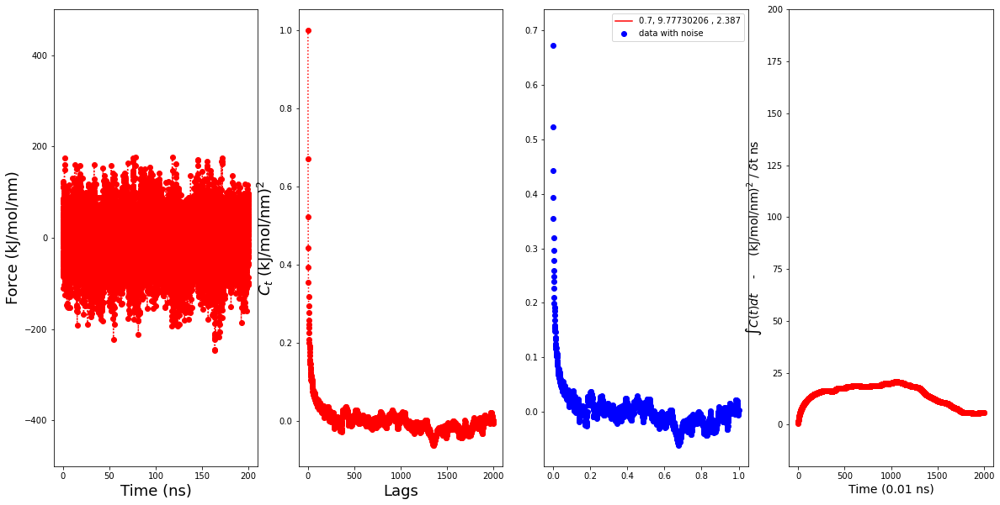

1
2
[1.         0.61312269 0.4496774  ... 0.0103766  0.01580459 0.01602275]
[1.         0.61312269 0.4496774  ... 0.0103766  0.01580459 0.01602275]
2001
0.6124437895397613 7.505991354196823 2.704464441609682
Gamma function value is
0.01101601481222285


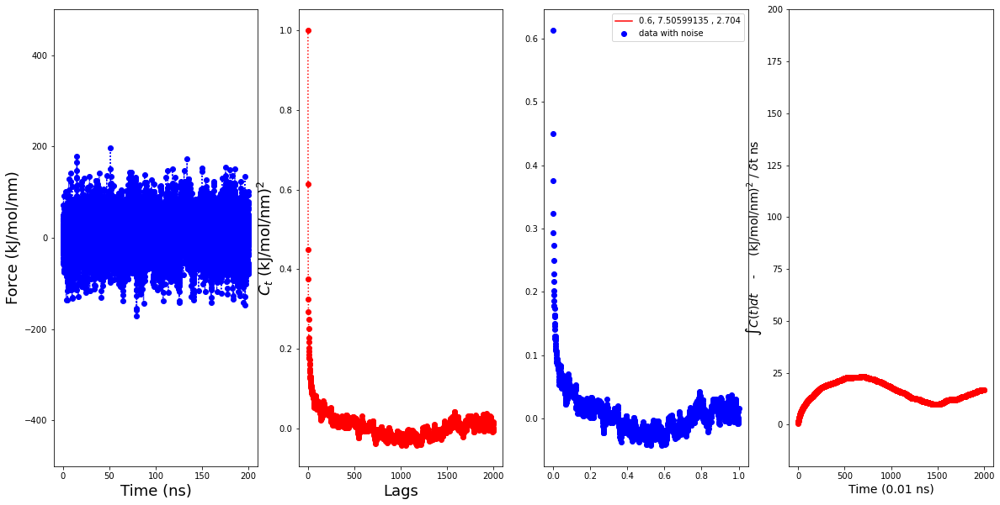

2
3
[ 1.          0.59563756  0.43997628 ... -0.00849524 -0.00367235
  0.00846585]
[ 1.          0.59563756  0.43997628 ... -0.00849524 -0.00367235
  0.00846585]
2001
0.6220933619227156 7.738147525165402 2.8242837829575445
Gamma function value is
0.009296539569849691


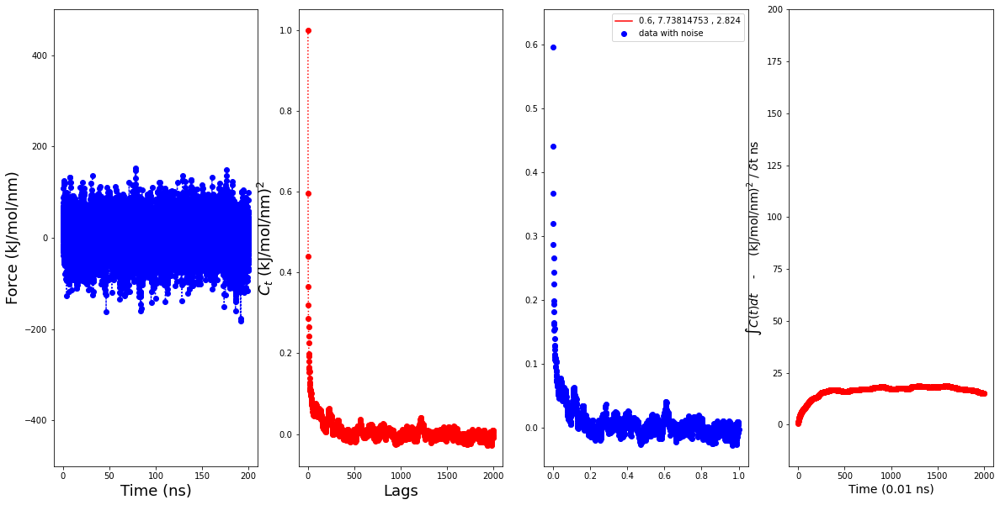

3
4
[1.         0.58580263 0.41764363 ... 0.01594803 0.02133694 0.02196848]
[1.         0.58580263 0.41764363 ... 0.01594803 0.02133694 0.02196848]
2001
0.5863641026726049 10.485950505381325 2.4442802256008984
Gamma function value is
0.005869770767630732


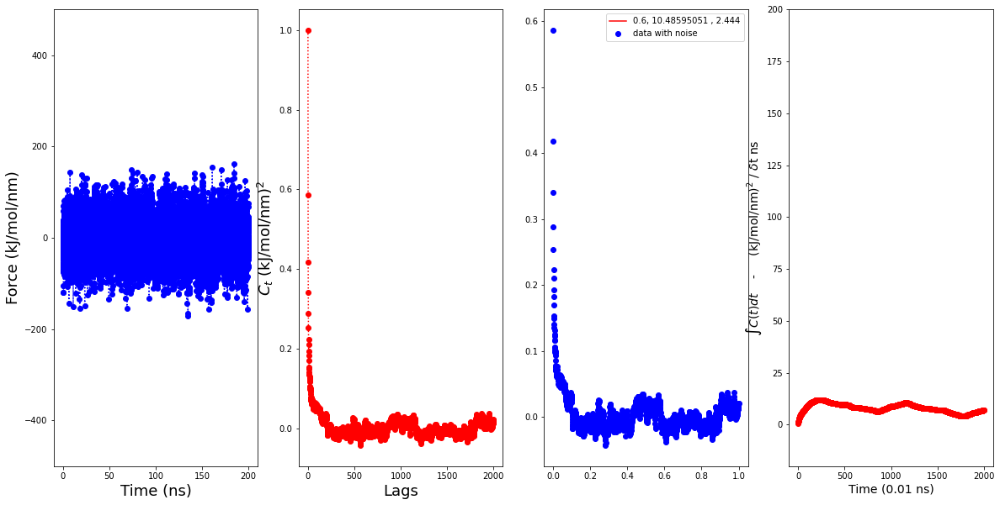

4
5
[ 1.          0.60408772  0.44940823 ...  0.00512696 -0.00188455
  0.00150967]
[ 1.          0.60408772  0.44940823 ...  0.00512696 -0.00188455
  0.00150967]
2001
0.630865495277799 7.901375566460571 2.7098367512210757
Gamma function value is
0.009828914705224064


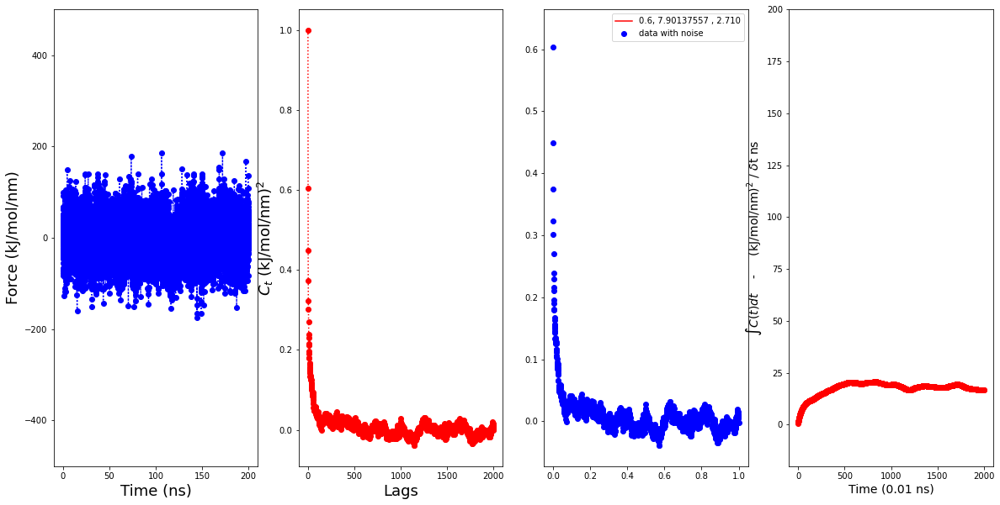

5
6
[ 1.          0.62285033  0.47053076 ... -0.00533775 -0.00174819
 -0.00250672]
[ 1.          0.62285033  0.47053076 ... -0.00533775 -0.00174819
 -0.00250672]
2001
0.6337984909481956 7.376599620949772 2.693919649322361
Gamma function value is
0.012054262970648207


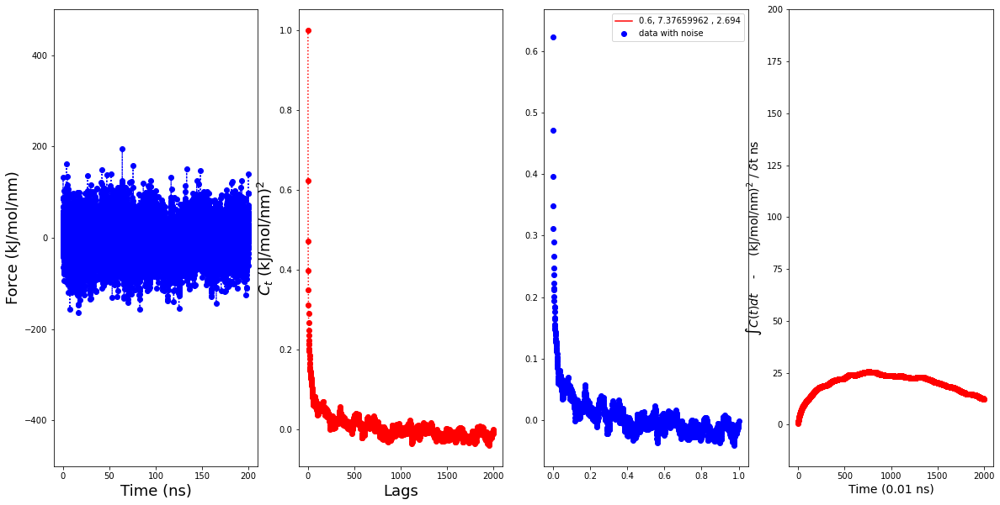

6
7
[ 1.          0.60696087  0.44943972 ...  0.00311719  0.00278798
 -0.01217167]
[ 1.          0.60696087  0.44943972 ...  0.00311719  0.00278798
 -0.01217167]
2001
0.6545084918320866 7.867670904718516 2.9328023698287113
Gamma function value is
0.008518219109154544


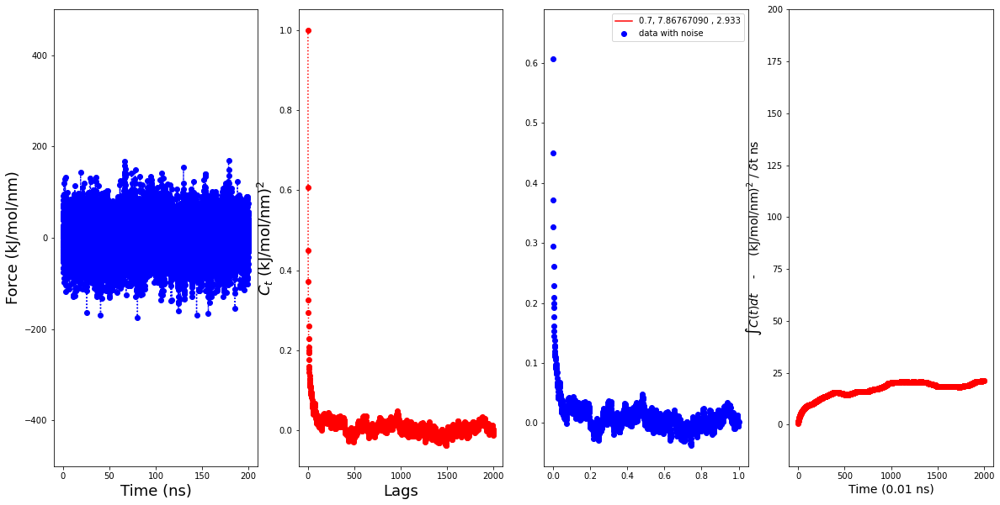

7
8
[ 1.          0.63354811  0.48690134 ... -0.02893342 -0.03527255
 -0.03910299]
[ 1.          0.63354811  0.48690134 ... -0.02893342 -0.03527255
 -0.03910299]
2001
0.5991334041431123 5.999940763859256 2.6674477343588174
Gamma function value is
0.020213072218576024


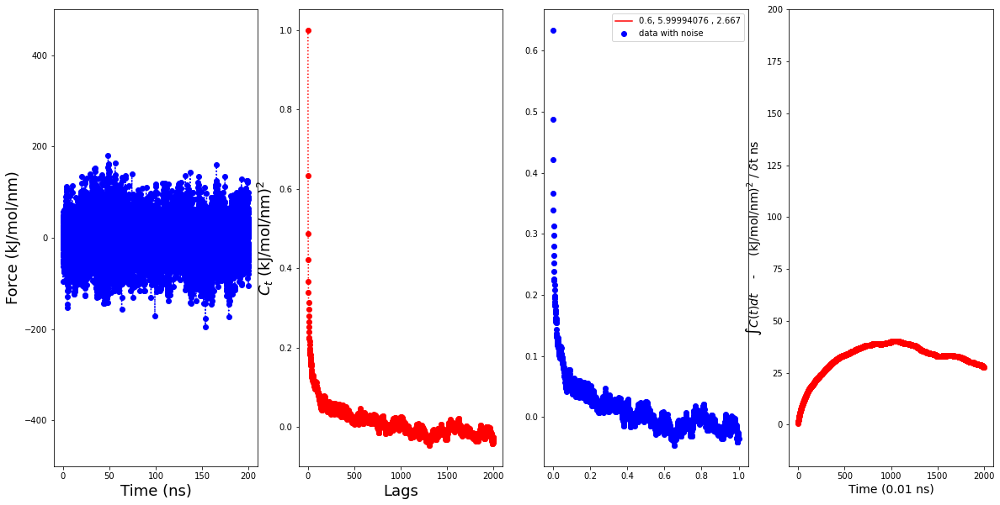

8
9
[1.         0.62756971 0.48761919 ... 0.02924477 0.03229397 0.02856441]
[1.         0.62756971 0.48761919 ... 0.02924477 0.03229397 0.02856441]
2001
0.6884622137219653 7.031156058561236 2.835191045471198
Gamma function value is
0.013376482310674892


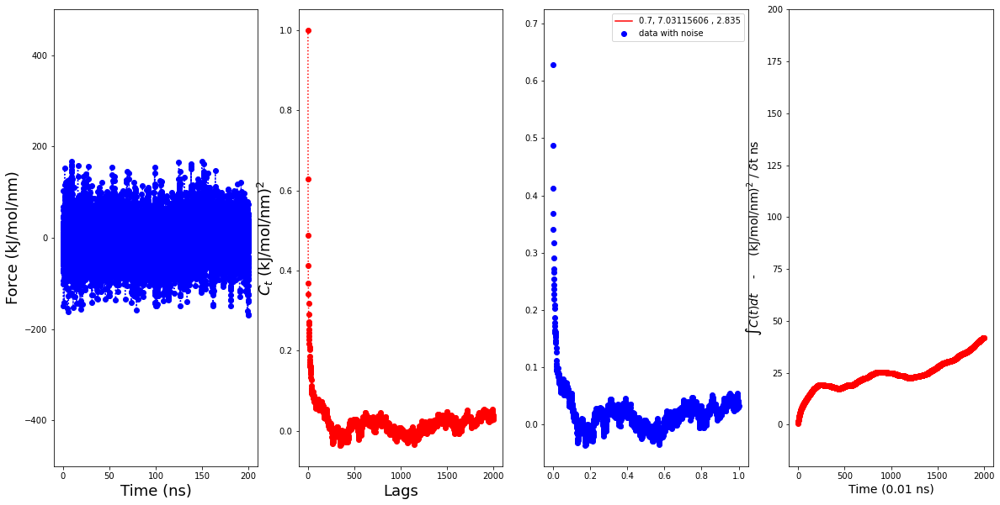

9
10
[ 1.00000000e+00  6.28510788e-01  4.75708896e-01 ... -5.04688657e-04
  3.81888992e-03  1.42595994e-02]
[ 1.00000000e+00  6.28510788e-01  4.75708896e-01 ... -5.04688657e-04
  3.81888992e-03  1.42595994e-02]
2001
0.6654428389661988 7.235121233260471 2.8555826456232425
Gamma function value is
0.011737170255823588


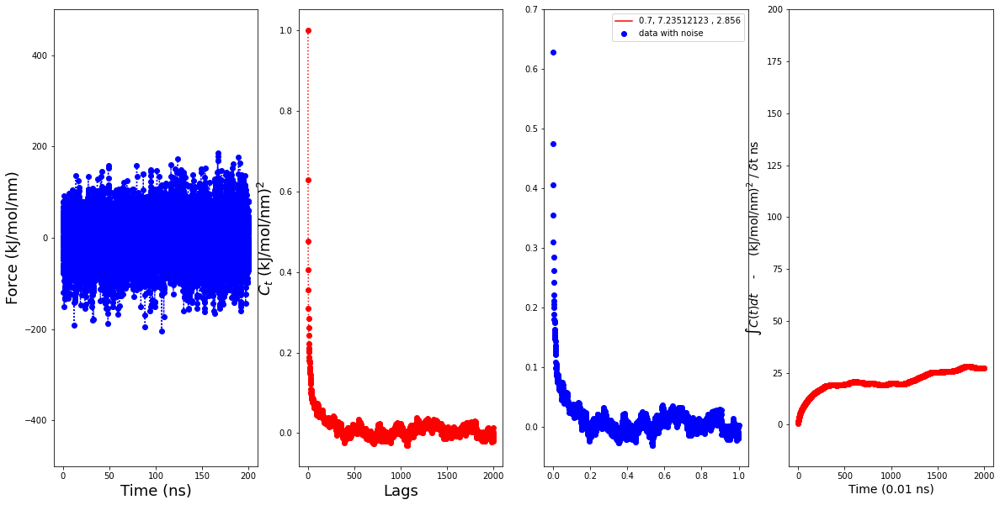

10
11
[ 1.          0.67969602  0.53539043 ... -0.02116737 -0.02131526
 -0.01891458]
[ 1.          0.67969602  0.53539043 ... -0.02116737 -0.02131526
 -0.01891458]
2001
0.3569703115172239 2.0986795423130356 -1389431.7250719217
Gamma function value is
nan


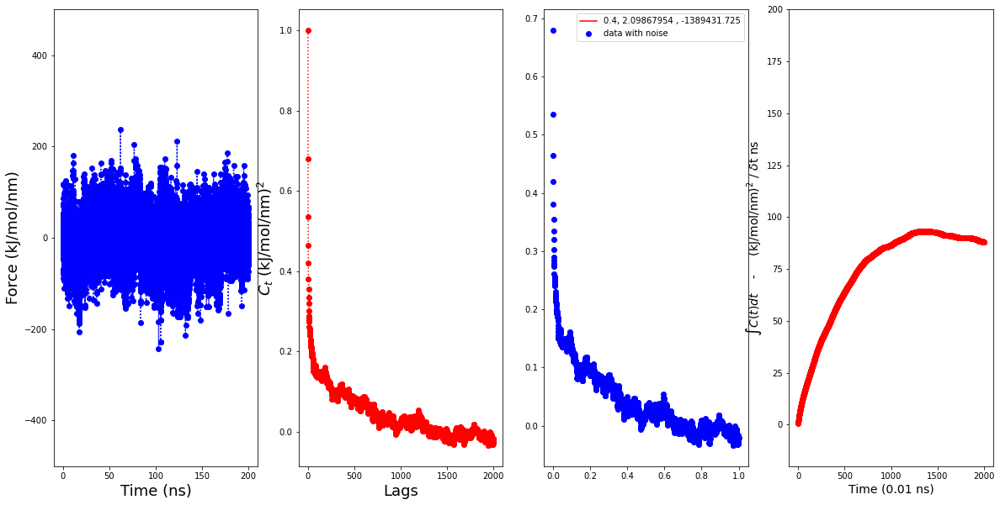

11
12
[1.         0.57365171 0.38523832 ... 0.02434179 0.02283272 0.02730407]
[1.         0.57365171 0.38523832 ... 0.02434179 0.02283272 0.02730407]
2001
0.5927453450432412 9.307586828656165 2.748886440965138
Gamma function value is
0.0056857660775016606


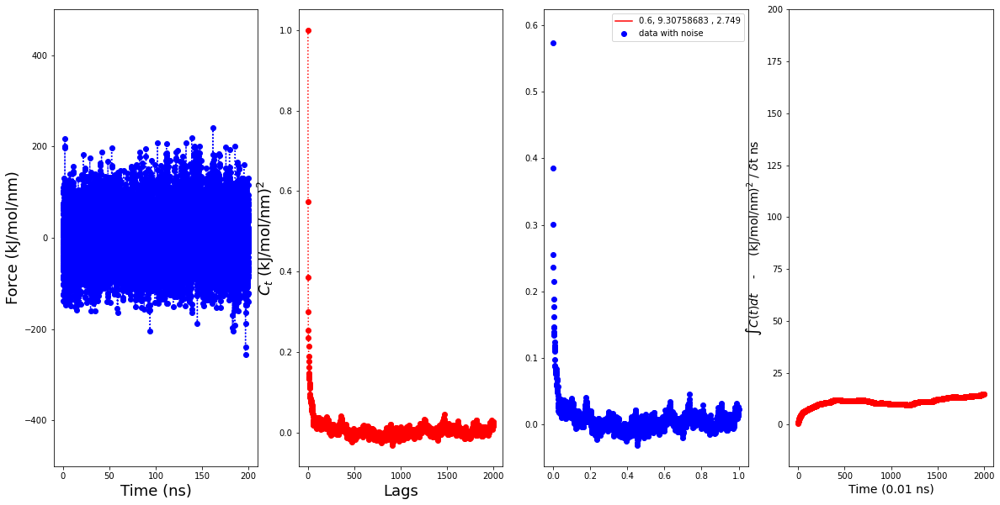

12
13
[ 1.          0.66911372  0.5246731  ... -0.03968768 -0.04026463
 -0.04120483]
[ 1.          0.66911372  0.5246731  ... -0.03968768 -0.04026463
 -0.04120483]
2001
0.6230333350502122 5.692626412443075 2.6299592801679066
Gamma function value is
0.02472313034725517


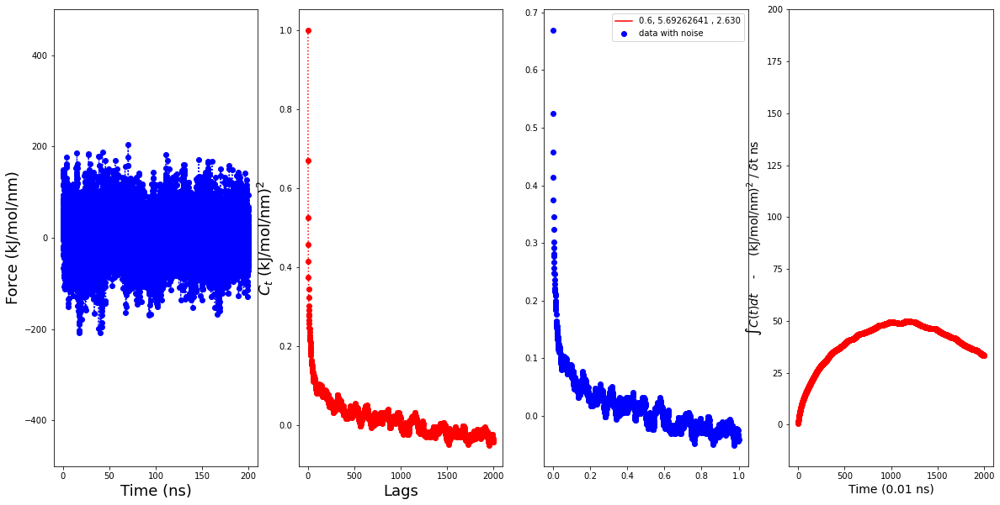

13
14
[ 1.          0.63754428  0.47907271 ... -0.01113622 -0.01780887
 -0.01844847]
[ 1.          0.63754428  0.47907271 ... -0.01113622 -0.01780887
 -0.01844847]
2001
0.6561280791987714 10.90220294834491 2.3163513704186163
Gamma function value is
0.007076224222928633


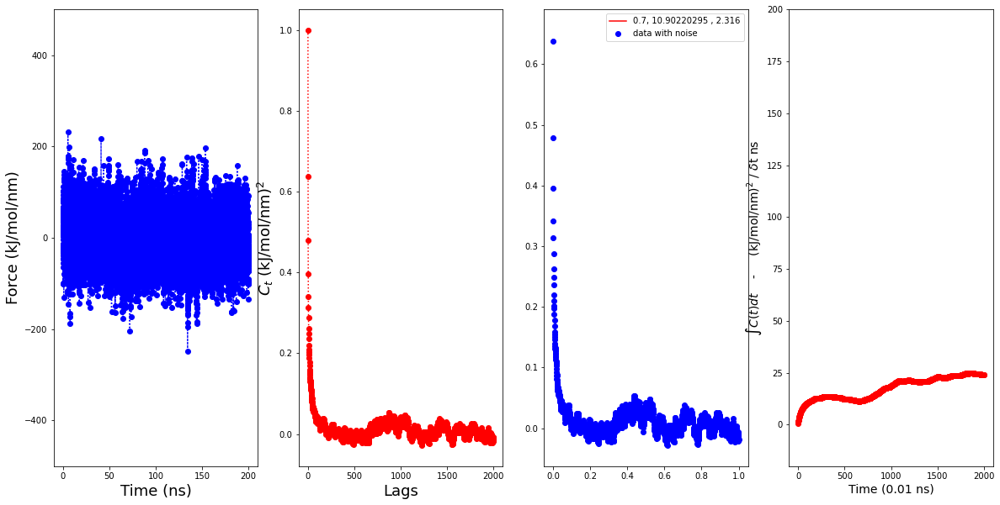

14
15
[1.00000000e+00 6.83651421e-01 5.38476567e-01 ... 5.99163482e-03
 2.89349594e-03 6.06204531e-04]
[1.00000000e+00 6.83651421e-01 5.38476567e-01 ... 5.99163482e-03
 2.89349594e-03 6.06204531e-04]
2001
0.7494002757106645 5.121856142513044 3.2531737960737637
Gamma function value is
0.03068645686038985


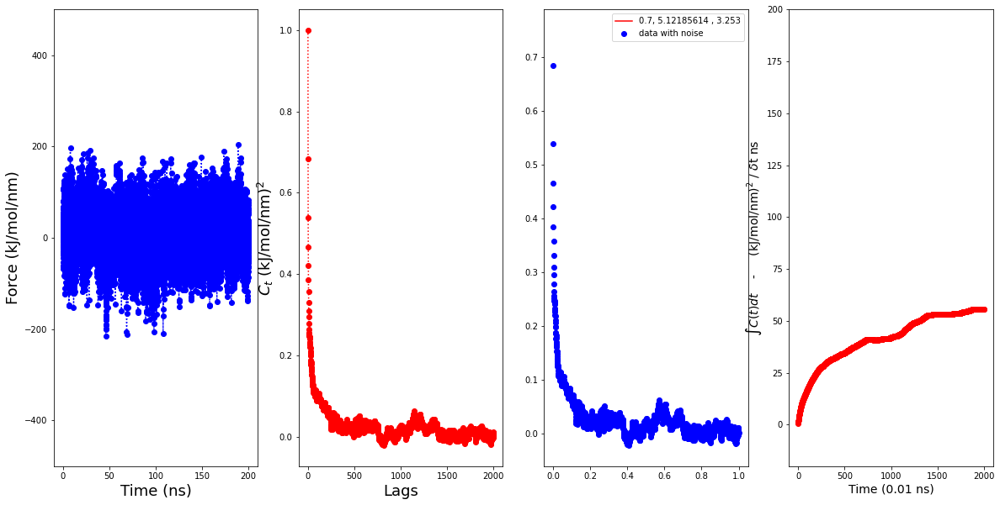

15
16
[ 1.          0.68959431  0.54074725 ... -0.03428876 -0.02900848
 -0.02665807]
[ 1.          0.68959431  0.54074725 ... -0.03428876 -0.02900848
 -0.02665807]
2001
-0.3498922183093505 5.753523385178051 -1304665.9191405885
Gamma function value is
nan


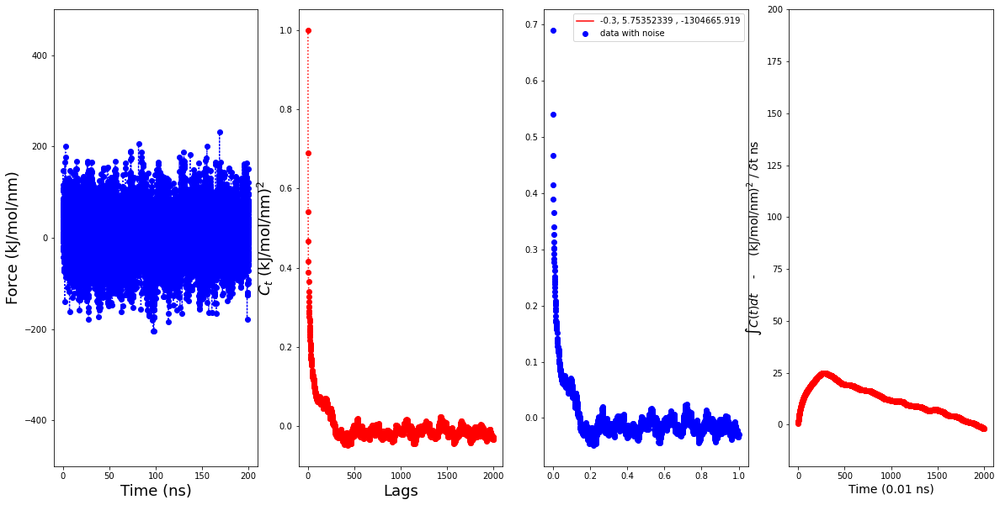

16
17
[1.         0.66508338 0.51652489 ... 0.02432867 0.02056908 0.02150776]
[1.         0.66508338 0.51652489 ... 0.02432867 0.02056908 0.02150776]
2001
0.7099402870591071 6.471606015930436 2.8954760541610662
Gamma function value is
0.016779023181992737


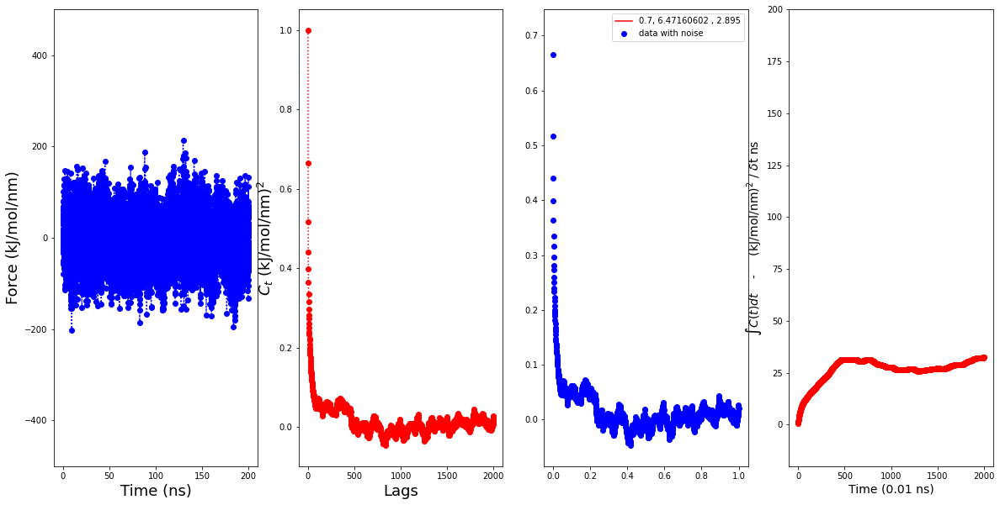

17
18
[ 1.          0.67382311  0.52817487 ... -0.04608812 -0.04075768
 -0.03901101]
[ 1.          0.67382311  0.52817487 ... -0.04608812 -0.04075768
 -0.03901101]
2001
0.646723349556269 9.28913965861024 2.1783919985958375
Gamma function value is
0.011947548507155353


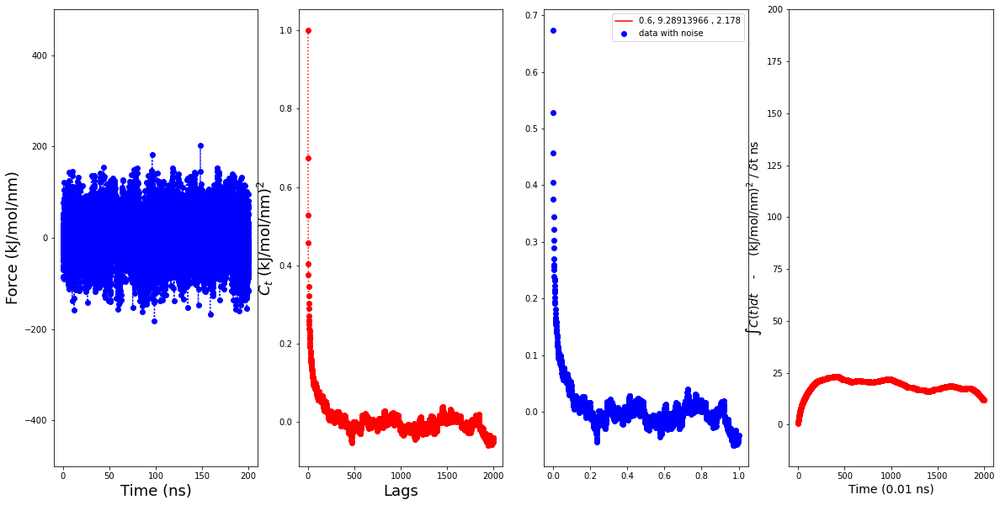

18
19
[1.         0.68383615 0.54215668 ... 0.00734548 0.01261876 0.01487963]
[1.         0.68383615 0.54215668 ... 0.00734548 0.01261876 0.01487963]
2001
0.6616967177945153 9.112622821672423 2.1879599921722326
Gamma function value is
0.01259832380930272


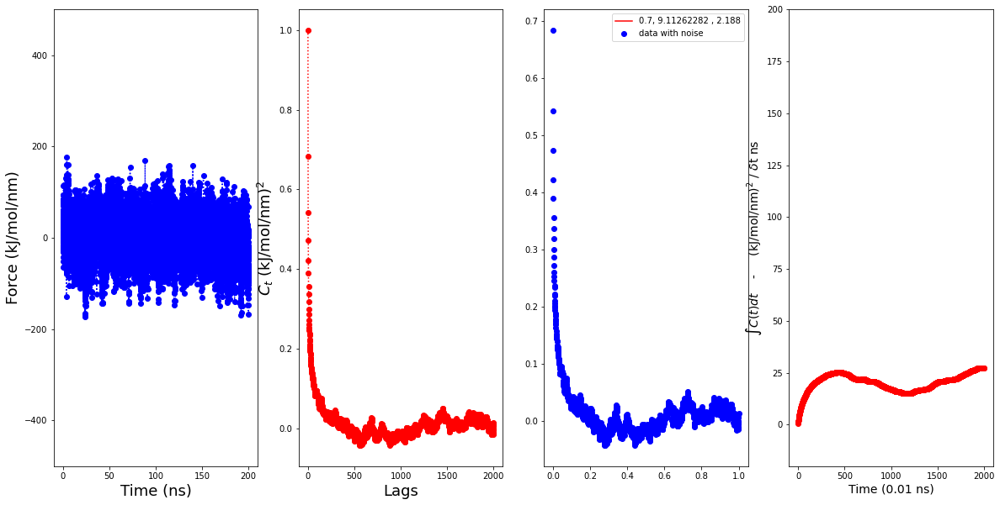

19
20
[1.         0.6644519  0.5287273  ... 0.03533285 0.0306766  0.03012159]
[1.         0.6644519  0.5287273  ... 0.03533285 0.0306766  0.03012159]
2001
0.0469643323771393 0.0001159444710331278 -975589.1045378326
Gamma function value is
-0.0


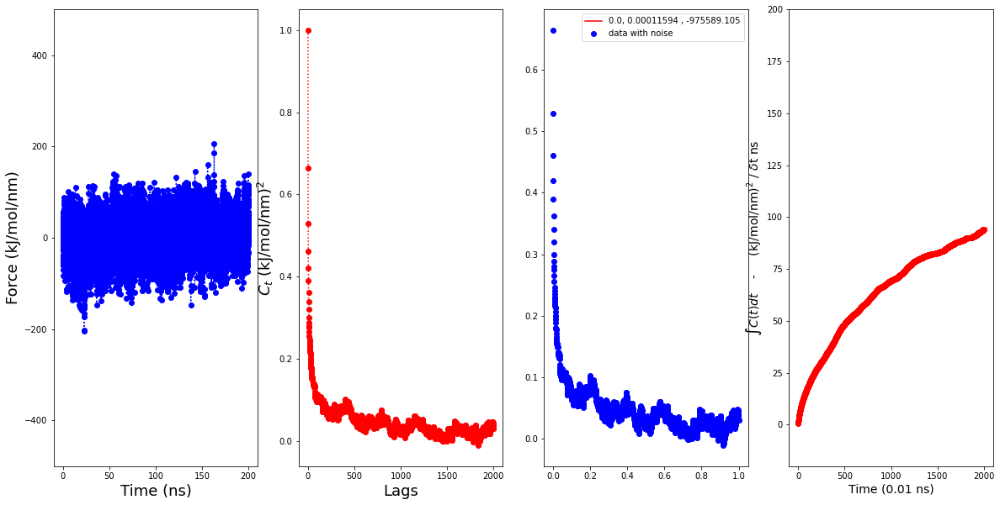

20
21
[ 1.00000000e+00  6.94942260e-01  5.64135599e-01 ... -7.31754132e-04
 -3.94245736e-03 -6.79097329e-03]
[ 1.00000000e+00  6.94942260e-01  5.64135599e-01 ... -7.31754132e-04
 -3.94245736e-03 -6.79097329e-03]
2001
0.18591684807887063 1.1154741040421052 -1484148.7009610701
Gamma function value is
nan


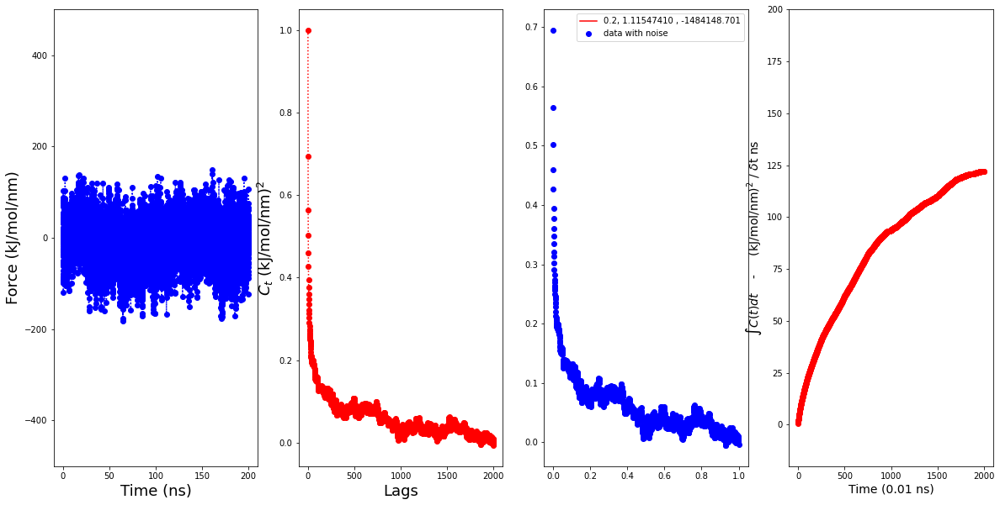

21
22
[ 1.          0.67669363  0.53196136 ... -0.01998083 -0.01442941
 -0.0171458 ]
[ 1.          0.67669363  0.53196136 ... -0.01998083 -0.01442941
 -0.0171458 ]
2001
0.6882800619631356 10.26564943978661 2.1953906956314966
Gamma function value is
0.00999782389229409


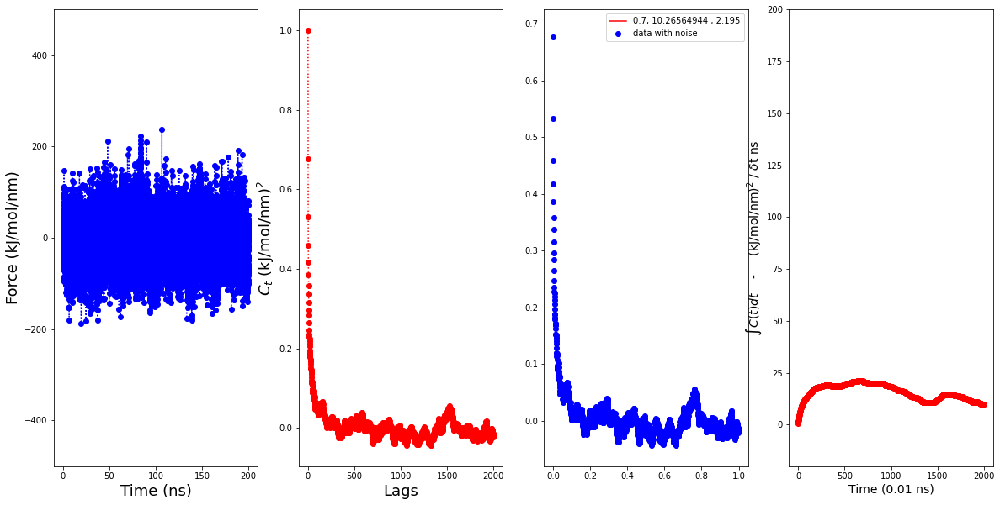

22
23
[ 1.          0.69762156  0.56534523 ... -0.01878183 -0.02129748
 -0.0222689 ]
[ 1.          0.69762156  0.56534523 ... -0.01878183 -0.02129748
 -0.0222689 ]
2001
0.7726953950934681 4.096077603977712 3.6101284971963734
Gamma function value is
0.06456559303473844


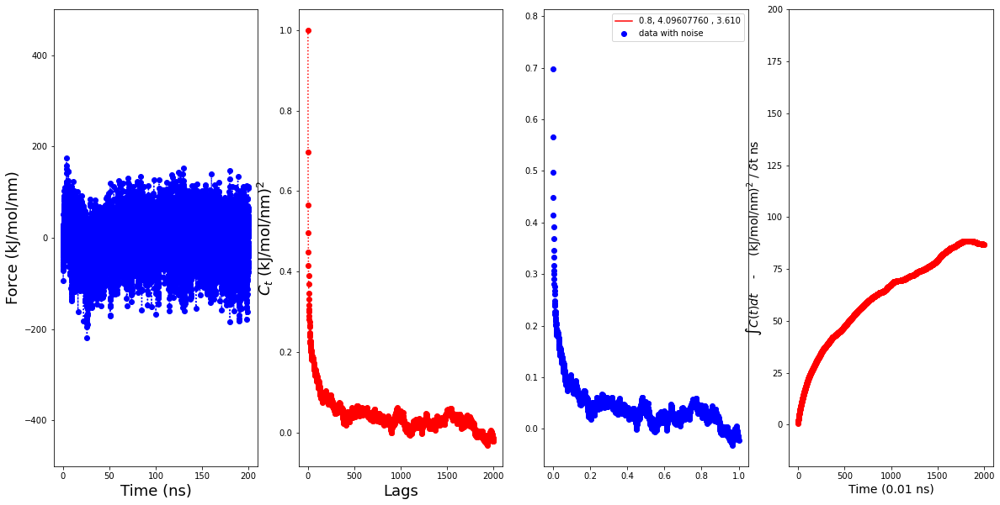

23
24
[ 1.          0.59877214  0.43853143 ... -0.00570418 -0.00524007
 -0.00186365]
[ 1.          0.59877214  0.43853143 ... -0.00570418 -0.00524007
 -0.00186365]
2001
0.6359362611821645 7.3138145749553685 2.9817681188043457
Gamma function value is
0.009884678482578249


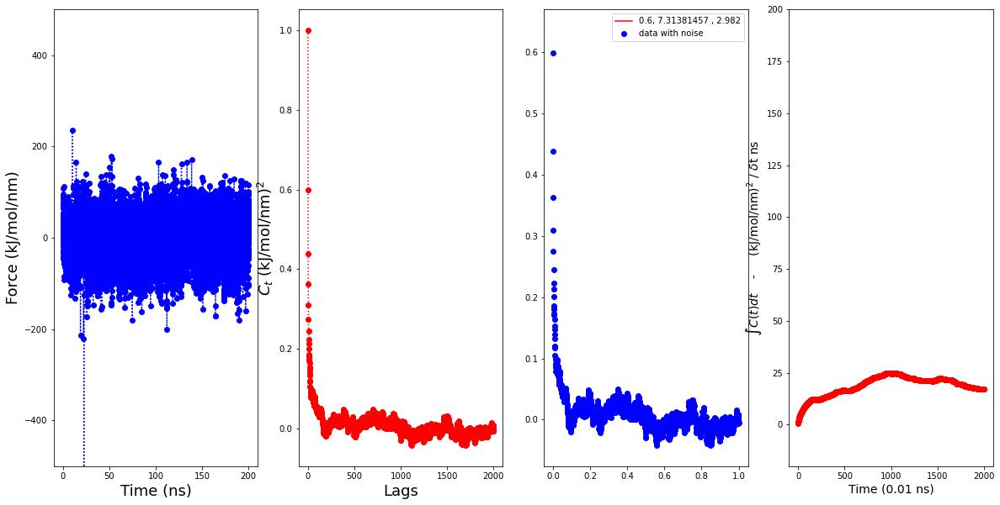

24
25
[ 1.          0.58609118  0.42818378 ... -0.00312117 -0.00484567
 -0.00103571]
[ 1.          0.58609118  0.42818378 ... -0.00312117 -0.00484567
 -0.00103571]
2001
0.5980092380322509 10.770664096906168 2.396153743981565
Gamma function value is
0.005969015924341492


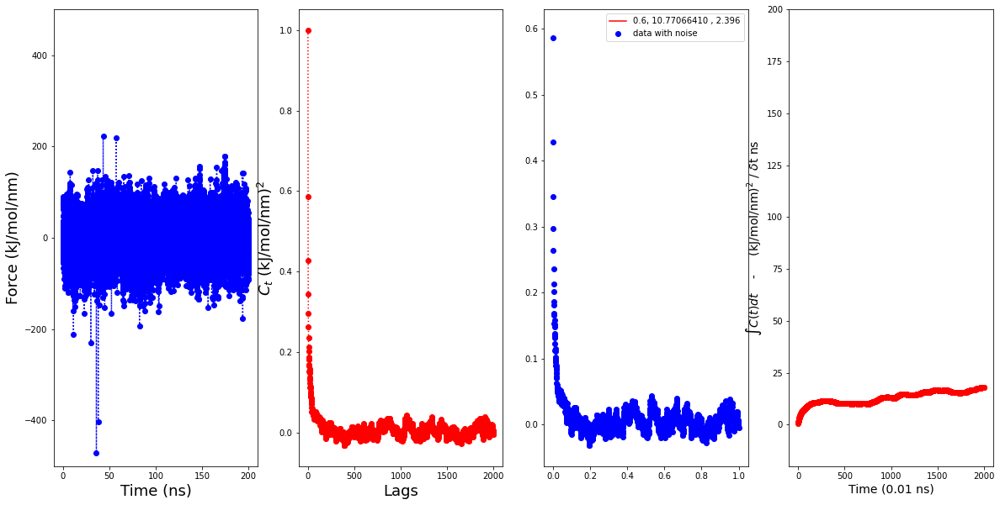

25
26
[1.         0.52817545 0.37284636 ... 0.0211625  0.01453185 0.01218162]
[1.         0.52817545 0.37284636 ... 0.0211625  0.01453185 0.01218162]
2001
0.539597010282592 14.800692120990501 2.230054561763484
Gamma function value is
0.003310641576667182


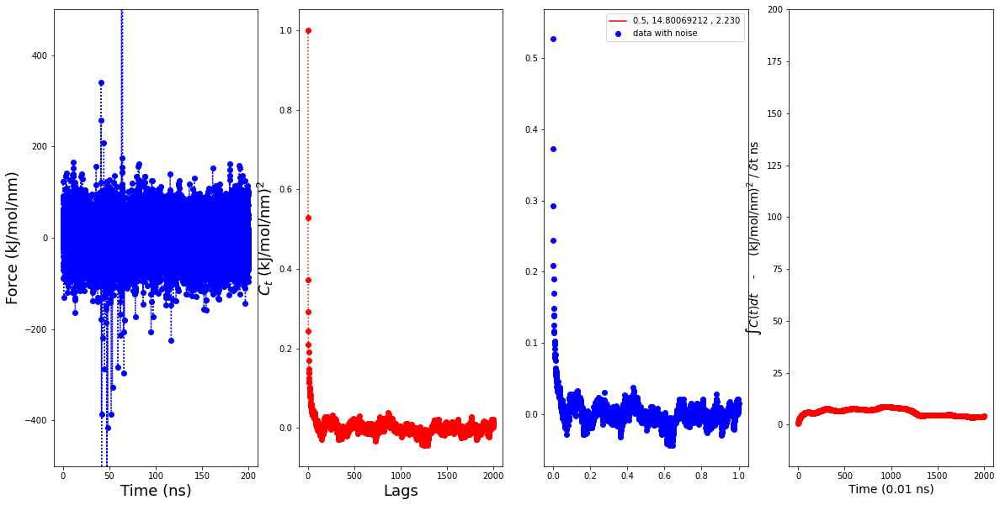

26
27
[ 1.          0.53918972  0.37073391 ... -0.00654393 -0.00596391
 -0.0113782 ]
[ 1.          0.53918972  0.37073391 ... -0.00654393 -0.00596391
 -0.0113782 ]
2001
0.5738492326366346 7.869719776099768 3.001656178621043
Gamma function value is
0.007054902853056649


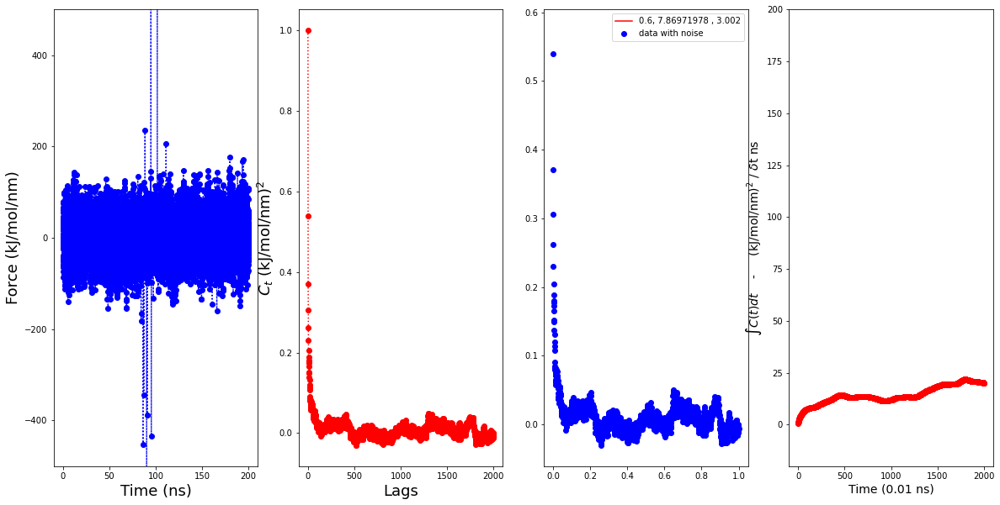

27
28
[1.         0.63334188 0.48622569 ... 0.09202193 0.0948213  0.09661929]
[1.         0.63334188 0.48622569 ... 0.09202193 0.0948213  0.09661929]
2001
0.12457247293539293 0.0027961200025463273 -678397.8067816482
Gamma function value is
-0.0


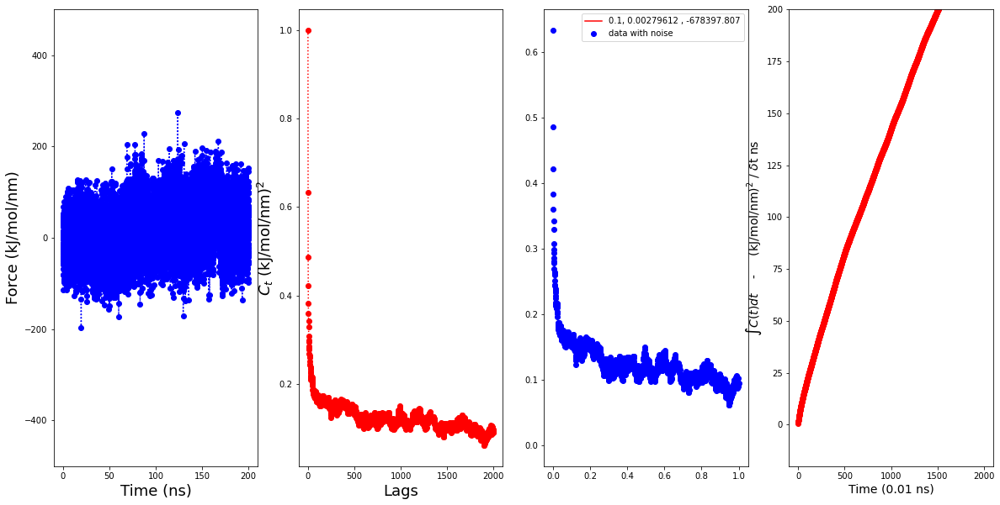

28
29
[1.         0.5545507  0.39307557 ... 0.01389209 0.01505639 0.01014981]
[1.         0.5545507  0.39307557 ... 0.01389209 0.01505639 0.01014981]
2001
0.5337147033163763 11.979819165840498 2.200767271929989
Gamma function value is
0.0054796199462664235


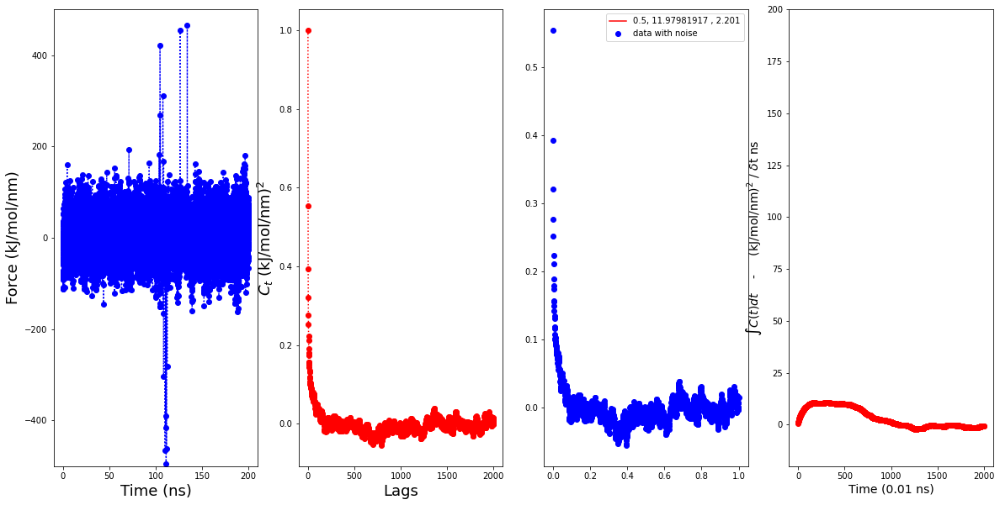

29
30
[ 1.          0.58526529  0.42392785 ... -0.01646839 -0.02310749
 -0.02651694]
[ 1.          0.58526529  0.42392785 ... -0.01646839 -0.02310749
 -0.02651694]
2001
0.6151164363897462 7.793929229261267 2.7578144098651287
Gamma function value is
0.009536557052183548


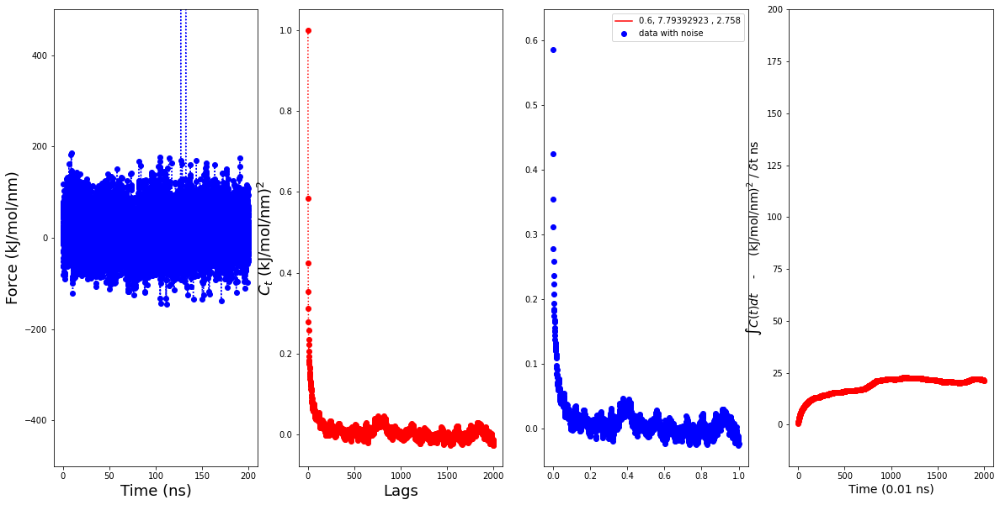

30
31
[ 1.00000000e+00  5.85266438e-01  4.42533502e-01 ...  3.54757520e-03
  6.34689126e-03 -2.68681318e-04]
[ 1.00000000e+00  5.85266438e-01  4.42533502e-01 ...  3.54757520e-03
  6.34689126e-03 -2.68681318e-04]
2001
0.5875753597216321 4.8481395948607755 3.202235036881258
Gamma function value is
0.029150129450399315


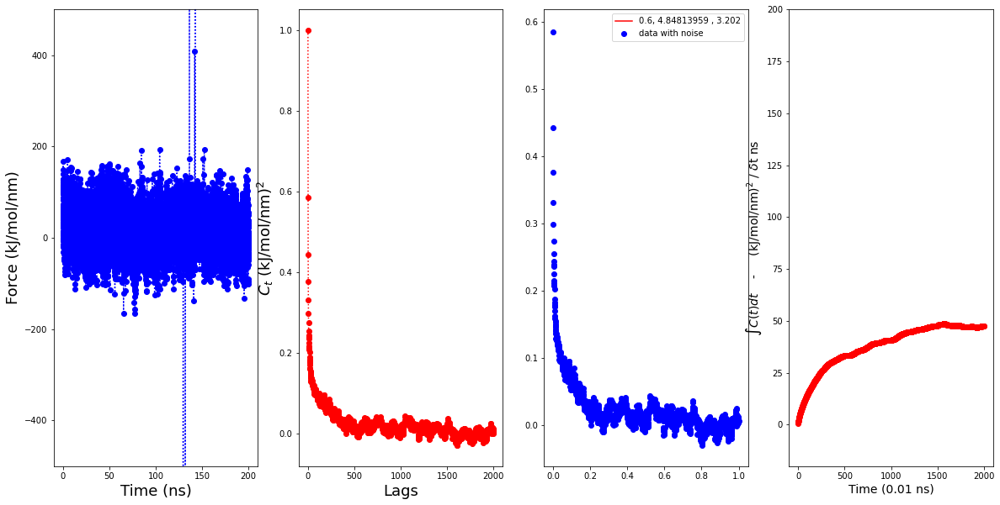

31
32
[ 1.          0.68042888  0.5576091  ... -0.00826596 -0.00849194
 -0.00628748]
[ 1.          0.68042888  0.5576091  ... -0.00826596 -0.00849194
 -0.00628748]
2001
0.07302096072798026 0.0007970678150749592 -883829.9831404067
Gamma function value is
-0.0


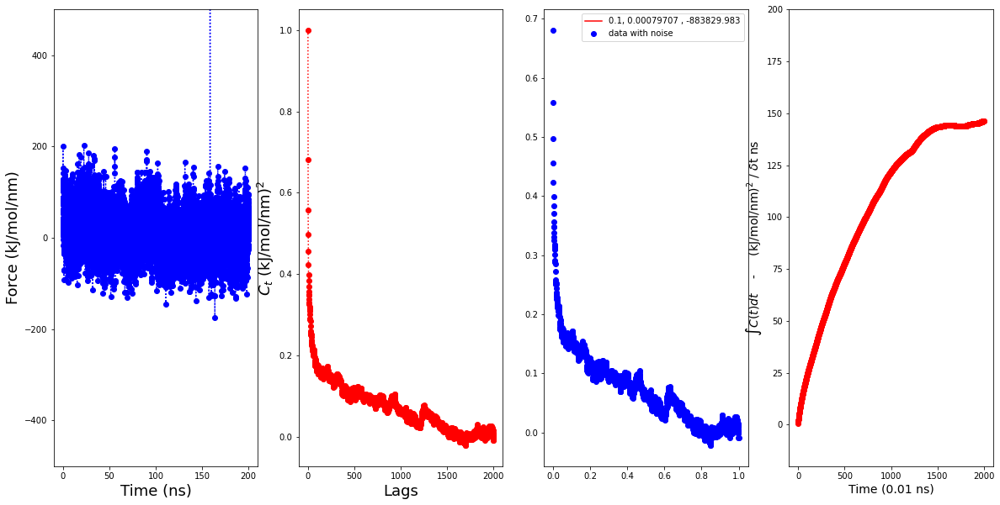

32
33
[1.         0.67242882 0.53978249 ... 0.01638347 0.01911592 0.01684751]
[1.         0.67242882 0.53978249 ... 0.01638347 0.01911592 0.01684751]
2001
0.5270252640182201 6.497383047750409 2.1021772868715023
Gamma function value is
0.022707709483915987


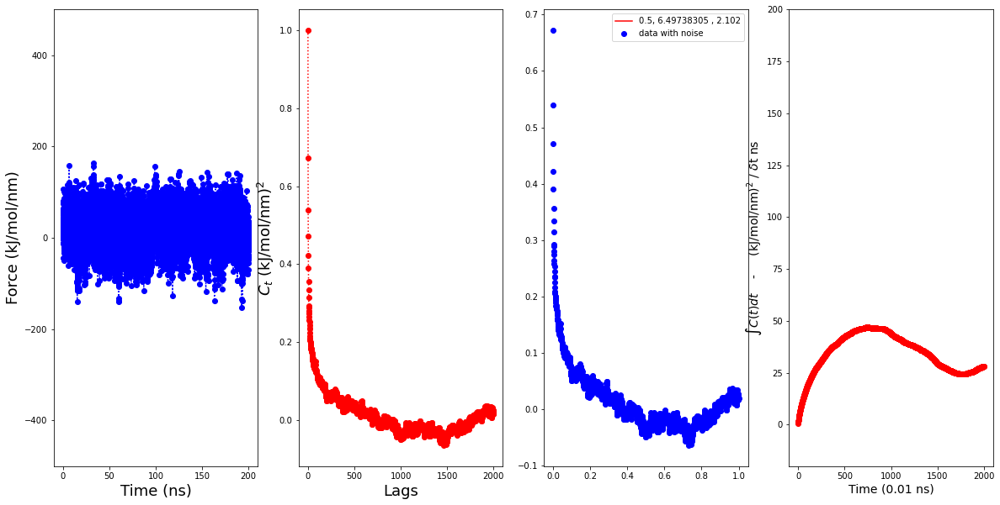

33
34
[1.         0.66486887 0.52239868 ... 0.00400923 0.00873314 0.00959128]
[1.         0.66486887 0.52239868 ... 0.00400923 0.00873314 0.00959128]
2001
0.6774202127426985 5.828276836210991 2.80059618451464
Gamma function value is
0.022843287055673227


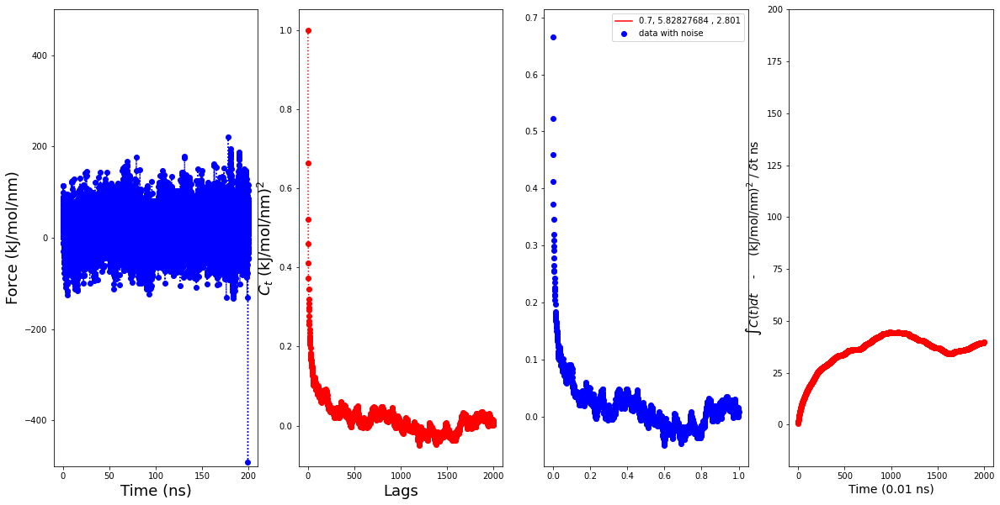

34
35
[ 1.          0.61546588  0.48259749 ... -0.00921303 -0.0158452
 -0.01574346]
[ 1.          0.61546588  0.48259749 ... -0.00921303 -0.0158452
 -0.01574346]
2001
0.16062848747670494 4.513193164367798 -1297414.77605038
Gamma function value is
nan


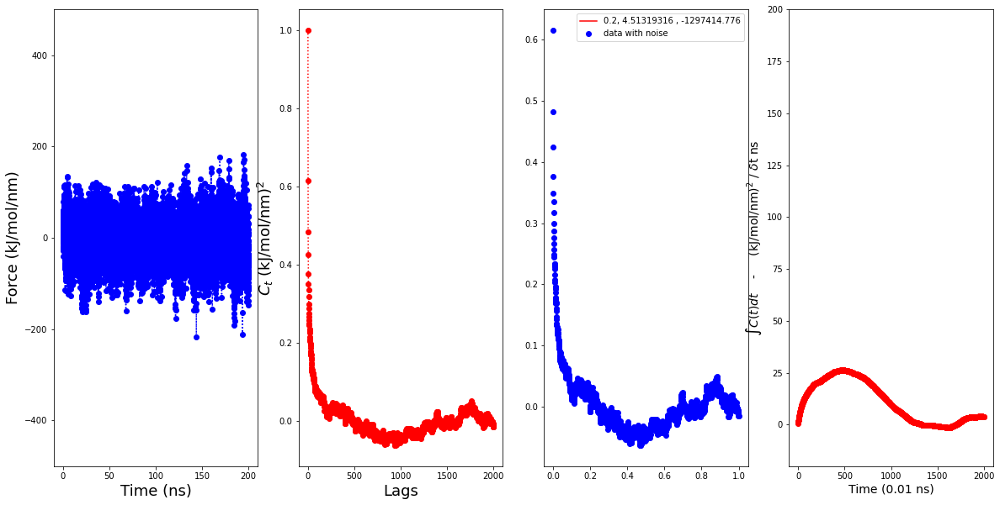

35
36
[1.         0.64729519 0.51076442 ... 0.0360636  0.03907851 0.04154314]
[1.         0.64729519 0.51076442 ... 0.0360636  0.03907851 0.04154314]
2001
0.04870256552213273 0.0018609872205604164 -687549.7593374135
Gamma function value is
-0.0


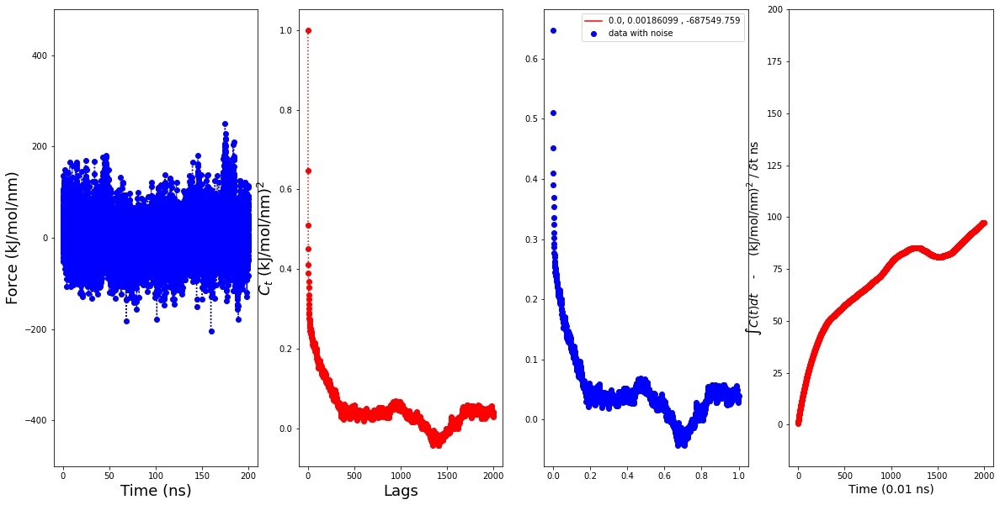

36
37
[1.         0.59548804 0.44228092 ... 0.03288031 0.03236231 0.03398469]
[1.         0.59548804 0.44228092 ... 0.03288031 0.03236231 0.03398469]
2001
0.6767649379400208 4.307661156453668 4.780791120384621
Gamma function value is
0.052111773993400556


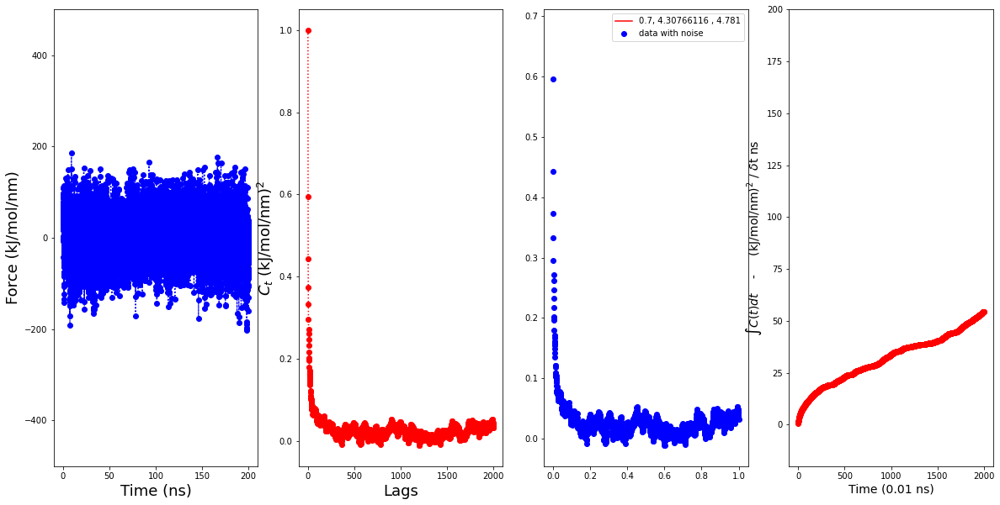

37
38
[ 1.          0.63049341  0.47067952 ...  0.00251087 -0.00178427
 -0.00709281]
[ 1.          0.63049341  0.47067952 ...  0.00251087 -0.00178427
 -0.00709281]
2001
0.6182993579823696 6.102726037959843 2.882655553425708
Gamma function value is
0.01745014847831931


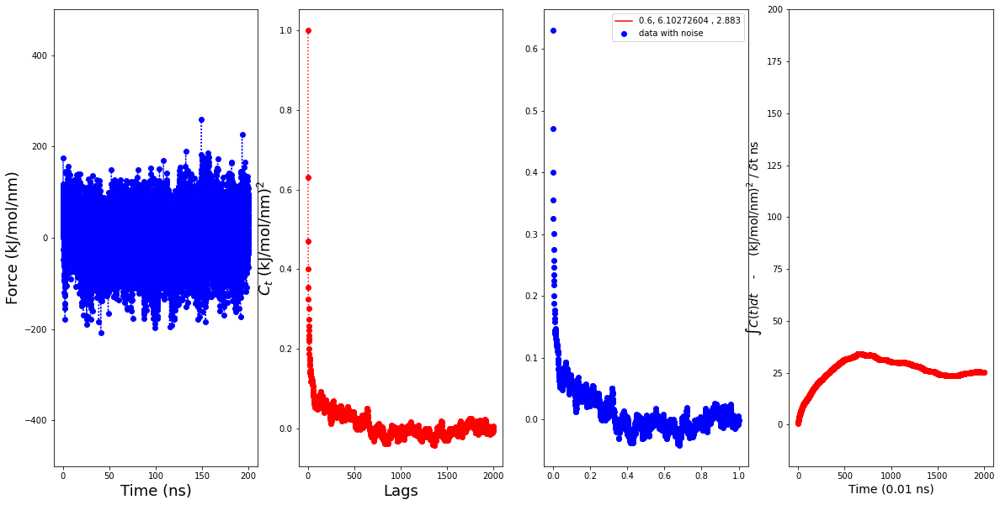

38
39
[ 1.          0.62644719  0.46301317 ...  0.00137007 -0.00456913
 -0.00676538]
[ 1.          0.62644719  0.46301317 ...  0.00137007 -0.00456913
 -0.00676538]
2001
0.6671204903795394 6.482994141350085 3.0700098185678426
Gamma function value is
0.01408278641249346


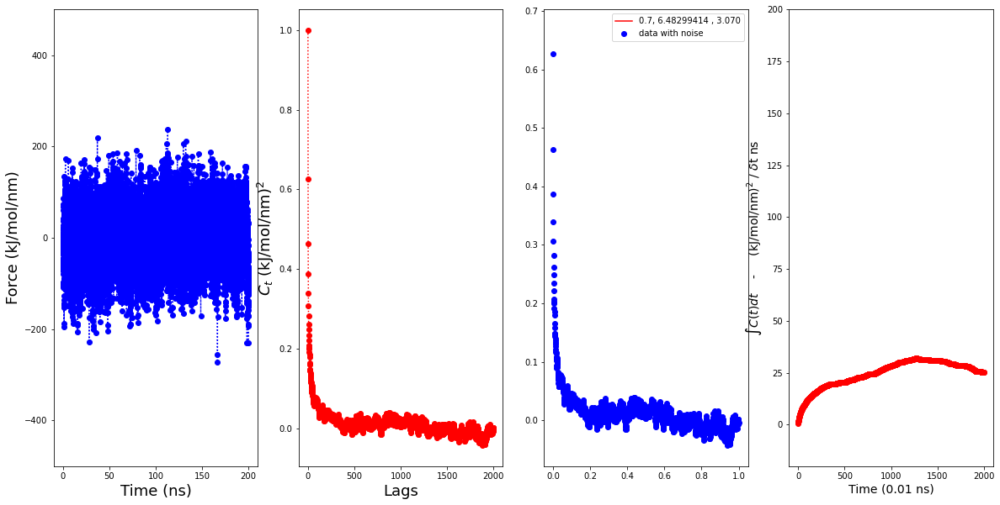

39
40
[ 1.          0.64378448  0.48643221 ... -0.01316014 -0.01895852
 -0.01627772]
[ 1.          0.64378448  0.48643221 ... -0.01316014 -0.01895852
 -0.01627772]
2001
0.6869141297551417 5.930807747135797 3.05338648963688
Gamma function value is
0.019219264880019953


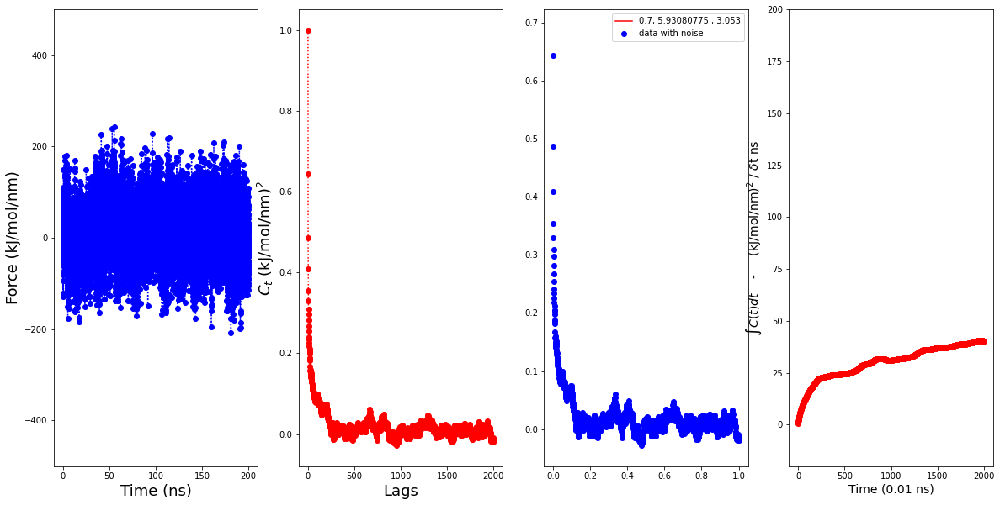

40
41
[1.         0.6298969  0.47100697 ... 0.02449124 0.02288711 0.02478901]
[1.         0.6298969  0.47100697 ... 0.02449124 0.02288711 0.02478901]
2001
0.21846176930331496 1.4514659424840448 -1415316.4322828886
Gamma function value is
nan


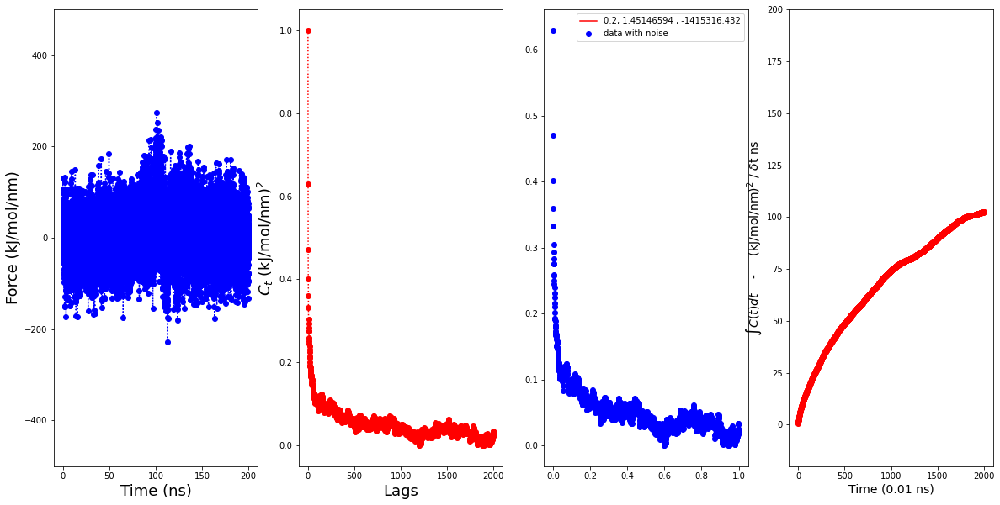

41
42
[1.         0.63216602 0.51929131 ... 0.07370497 0.06930491 0.07061636]
[1.         0.63216602 0.51929131 ... 0.07370497 0.06930491 0.07061636]
2001
0.09562363346500231 0.0012055076831897628 -609906.897818988
Gamma function value is
0.0


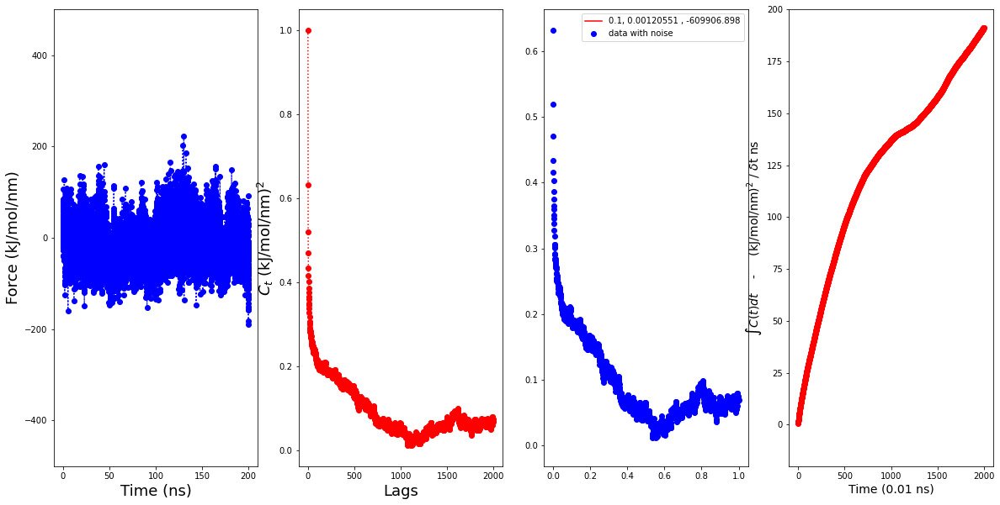

42
43
[1.         0.6008725  0.4439924  ... 0.01234821 0.00729421 0.01343663]
[1.         0.6008725  0.4439924  ... 0.01234821 0.00729421 0.01343663]
2001
0.2729743045248204 3.081598894276596 -1289318.0270521895
Gamma function value is
nan


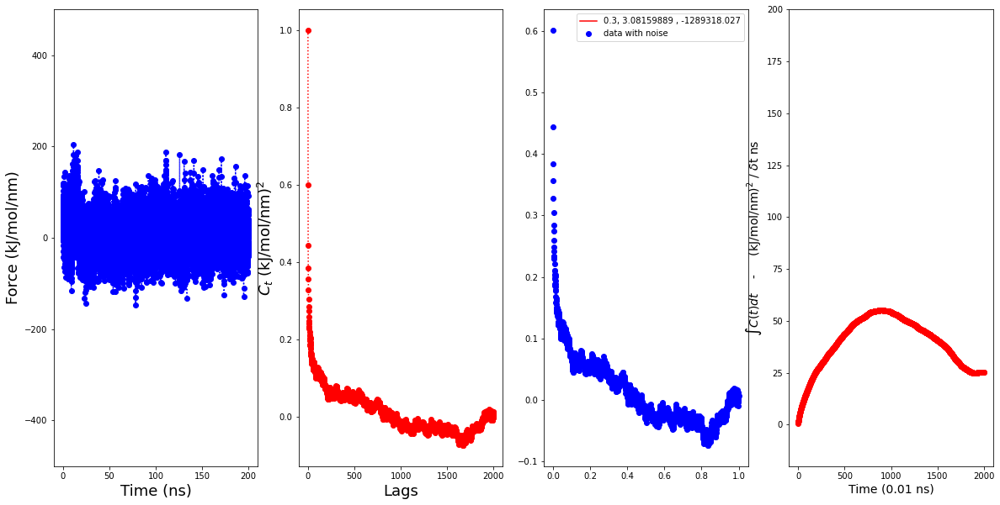

43
44
[ 1.          0.59582064  0.44285109 ... -0.04053534 -0.0430775
 -0.03855733]
[ 1.          0.59582064  0.44285109 ... -0.04053534 -0.0430775
 -0.03855733]
2001
0.2878999870426658 3.0631172193479594 -1290115.1245556348
Gamma function value is
nan


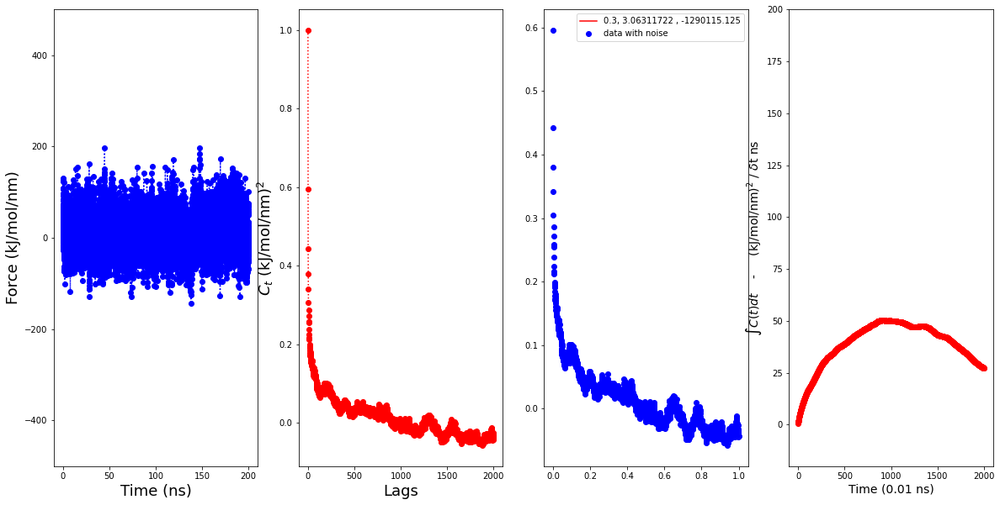

44
45
[1.         0.65034983 0.50404921 ... 0.01646711 0.01607843 0.01112437]
[1.         0.65034983 0.50404921 ... 0.01646711 0.01607843 0.01112437]
2001
0.055154661266681025 0.0017610768057792466 -1386323.5852286248
Gamma function value is
-0.0


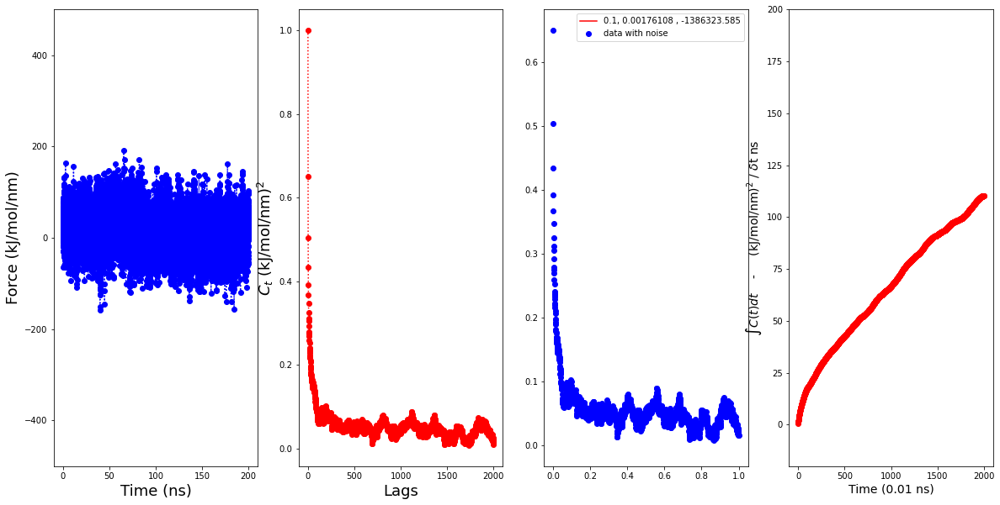

45
46
[ 1.          0.61984352  0.46644341 ... -0.01188702 -0.02000059
 -0.02127788]
[ 1.          0.61984352  0.46644341 ... -0.01188702 -0.02000059
 -0.02127788]
2001
0.6394524558413638 8.520190381182138 2.5608683333049354
Gamma function value is
0.00942002504517116


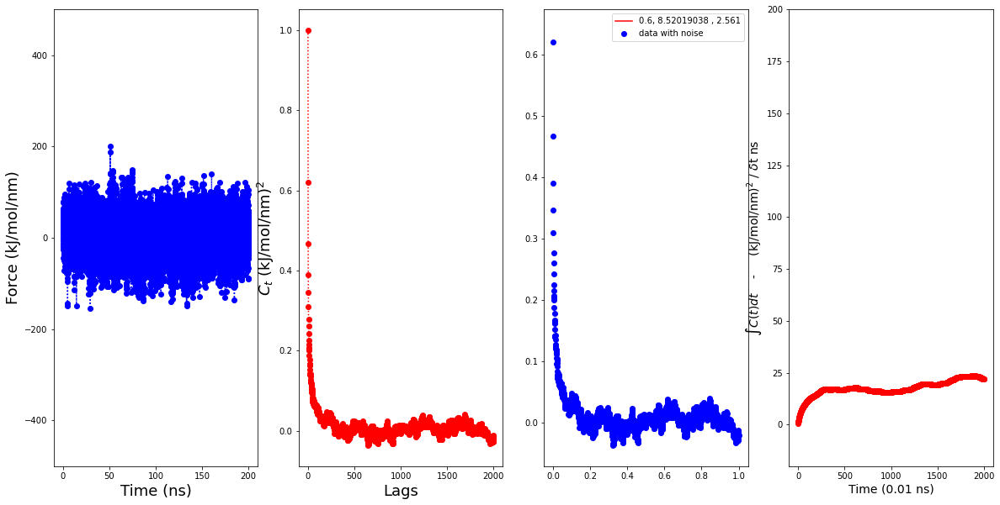

46
46
46
46
[ 8.90614565e-05  1.10160148e-04  9.29653957e-05  5.86977077e-05
  9.82891471e-05  1.20542630e-04  8.51821911e-05  2.02130722e-04
  1.33764823e-04  1.17371703e-04             nan  5.68576608e-05
  2.47231303e-04  7.07622422e-05  3.06864569e-04             nan
  1.67790232e-04  1.19475485e-04  1.25983238e-04 -0.00000000e+00
             nan  9.99782389e-05  6.45655930e-04  9.88467848e-05
  5.96901592e-05  3.31064158e-05  7.05490285e-05 -0.00000000e+00
  5.47961995e-05  9.53655705e-05  2.91501295e-04 -0.00000000e+00
  2.27077095e-04  2.28432871e-04             nan -0.00000000e+00
  5.21117740e-04  1.74501485e-04  1.40827864e-04  1.92192649e-04
             nan  0.00000000e+00             nan             nan
 -0.00000000e+00  9.42002505e-05]


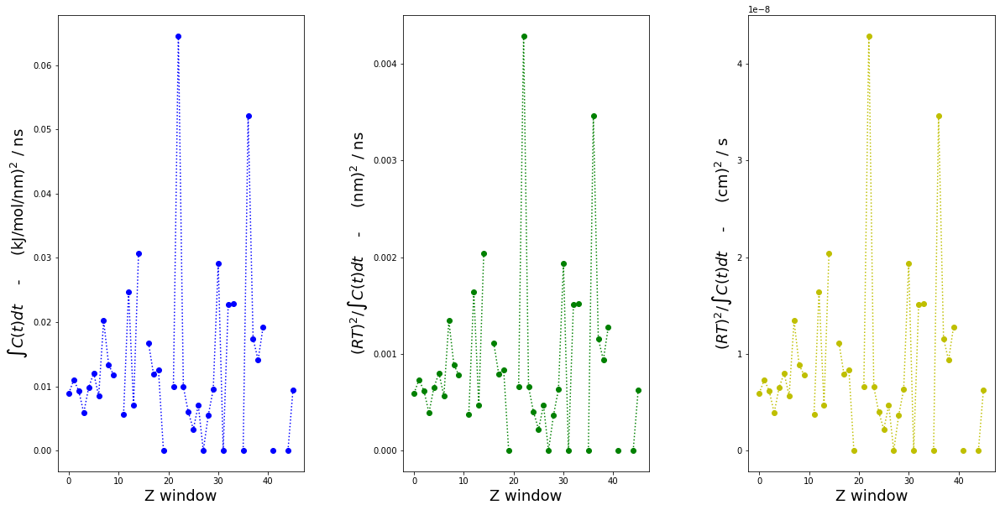

In [17]:
#Original data, 100, 1000. 
#Red, blue, black and purple at 500,000. 

#Correlation func & Integral: 1, 100, 1000.

#Auto-correlation
from statsmodels.graphics import tsaplots

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import os
import glob 
import errno
import statsmodels.api as sm
import scipy.integrate as scint
from scipy import integrate

from scipy.optimize import curve_fit
            
import math        
from numpy import array, hstack, vstack


import itertools

last = []
dz = []
bl = []
bla = range(20000)
bla2 = array([bla])
save_acf = array([bla])

bla3 = save_acf.T

bla4 = np.empty(shape=(20000,) * 1)

plt.figure(figsize=(20,6))
count=1

# create subplots

os.chdir('/Users/chrisjorg/Documents/Postdoc/Georgetown/Double_bilayer_Sandwich/Z_LPP/LPP_Naphtha_5000eq_0.2/Force_prod/All_new2/Convolve_100')



with open('data.txt', 'w') as file:
    path = './*pullf.xvg' 
    path2 = os.getcwd()
    files = glob.glob(path)
    colors = itertools.cycle(["r", "b", "g","y","c","m"])
    
def key_func(x):
        return os.path.split(x)[-1]

for name in sorted(glob.glob('*_pullf.xvg_dt*'), key=key_func):
        try: 
            print(count)
            
            lines = open(name,'r')
            f = np.loadtxt(name)
            #plt.subplot(1, 1, count) 

            subplot_dim = (20, 10)
            X_=f[:,0]/1000
            Y=f[:,1]
            X_scale = np.linspace(0, 1, 20000) 
            
            X_scale_ = X_scale/100
            
           
            
            
            fig, (ax0, ax1, ax2, ax3) = plt.subplots(1, 4,figsize=(20,10))
            ax0.plot(X_,Y,':ro',label=name,color=next(colors))
             
            ax0.set_ylabel('Force (kJ/mol/nm)',fontsize=18)
            ax0.set_xlabel('Time (ns)',fontsize=18)
             
            ax0.set_ylim(-500, 500)

            colors = itertools.cycle(["r", "b", "g","y","c","m"])
            
            acf_ = sm.tsa.acf(Y,  nlags=2000)
            
            acf__ = acf_.T
            print(acf__)
            print(acf_)
            blbb = np.concatenate(([X_scale, X_, Y]), axis=0) 
            np.savetxt('AutoCorr_100_' + str(count) + '.txt', acf_, delimiter=" ", fmt="%s")
 
            save_acf__ = hstack([ X_, Y])
           
            ax1.plot(acf_,':ro',label=name,color=next(colors)) 
            ax1.set_ylabel('$C_{t}$ (kJ/mol/nm)$^2$',fontsize=18)
            ax1.set_xlabel('Lags',fontsize=18)
            
            print(len(acf_))
            colors = itertools.cycle(["r", "b", "g","y","c","m"])

            X_scale = np.linspace(0, 1, 2000)
            acf__ = acf_[1:]
            acf_int = integrate.cumtrapz(acf__)
   
            np.savetxt("dz_integrat.txt", acf_int, delimiter=" ", fmt="%s")

            # define type of function to search
            def model_func(x, a, b, c):
                return a * np.exp(-(b * x ** (c ** (-1))))

            # curve fit
            X_scale = np.linspace(0, 1, 1999)
            p0 = (1.,1.e-5,1.) # starting search koefs
            opt, pcov = curve_fit(model_func, X_scale, acf__[:1999], p0)
            a, b, c= opt
            # test result
            
            x2 = np.linspace(0, 1999, 1)
            y2 = model_func(x2, a, b, c)
            ax2.plot(x2, y2, color='r', label='%.1f, %.8f , %-.3f' % (a,b,c))
            
            print(a, b, c)
            ax2.plot(X_scale, acf__[:1999], 'bo', label='data with noise')
            #ax2.set_xlim(0, 1999)
            ax2.legend(loc='best')
        
        
            from scipy.stats import gamma
          
            
        
            def int_val(a, b, c):
                return a * (b ** (-c)) * math.gamma(1 + c)
            y3 = int_val(a, b, c)
            print("Gamma function value is")
            print(y3)

 
            ax3.plot(acf_int,':ro',label=name,color=next(colors))
            ax3.set_ylabel(r'$\int C(t) dt $    -     (kJ/mol/nm)$^2$ / $\delta$t ns',fontsize=14)
            ax3.set_xlabel('Time (0.01 ns)',fontsize=14)
            ax3.set_ylim(-20, 200)
            plt.show()
             
            count+=1
             
            fig.savefig('AutoCorr_100_' + str(count) + '.png',dpi=300,bbox_inches='tight',pad_inches=0.06)
            last_element = y3
      
            #last_element_ = 100*last_element
            last.append(last_element)
            print(len(last))
        except IOError as exc: 
            if exc.errno != errno.EISDIR: 
                raise

np.savetxt("test5.txt", blbb, delimiter=" ", fmt="%s") 

# Display the autocorrelation plot of your time series

print(len(last))
fig, (ax0, ax1, ax2) = plt.subplots(1, 3,figsize=(20,10))
last_arr = np.array(last)
last_ = last_arr
np.savetxt("test6.txt", last_, delimiter=" ", fmt="%s") 

print(len(last_))
rt = 0.008314*310   #kJ/mol
rt2_ = rt*rt

dt = 0.01 

dt1 = 1/dt
invert_last = 1. / dt1*last_
print(len(invert_last))
print(invert_last)
#invert_last = np.reciprocal(last_)
fraction = rt2_*invert_last
fraction_units = fraction*0.00001

#plt.plot(last_,':ro',label=name,color=next(colors))

ax0.plot(last_,':ro',label=name,color=next(colors))
ax0.set_ylabel(r'$\int C(t) dt $    -     (kJ/mol/nm)$^2$ / ns',fontsize=18)
ax0.set_xlabel('Z window',fontsize=18)
#plt.xlim(0, 50000)

ax1.plot(fraction,':ro',label=name,color=next(colors))
ax1.set_ylabel('$(RT)^{2} / \int C(t) dt $    -     (nm)$^2$ / ns',fontsize=18)
ax1.set_xlabel('Z window',fontsize=18)
#plt.xlim(0, 100)
 
ax2.plot(fraction_units,':ro',label=name,color=next(colors))
ax2.set_ylabel('$(RT)^{2} / \int C(t) dt $    -     (cm)$^2$ / s',fontsize=18)
ax2.set_xlabel('Z window',fontsize=18)
np.savetxt("last_element_.txt", last, delimiter=" ", fmt="%s")
plt.ticklabel_format(useOffset=False)

np.savetxt("dz.txt", fraction_units, delimiter=" ", fmt="%s")
 
plt.subplots_adjust(wspace=0.4)
            
#plt.tight_layout()
plt.savefig('AutoCorr_100.png',dpi=300,bbox_inches='tight',pad_inches=0.2)

1
[1.         0.61481031 0.45224287 ... 0.01075451 0.00357514 0.0085743 ]
[1.         0.61481031 0.45224287 ... 0.01075451 0.00357514 0.0085743 ]
2001
0.6781436141525019 5.904403090205412 3.471650608994145
Gamma function value is
0.015946157726922136


<Figure size 1440x432 with 0 Axes>

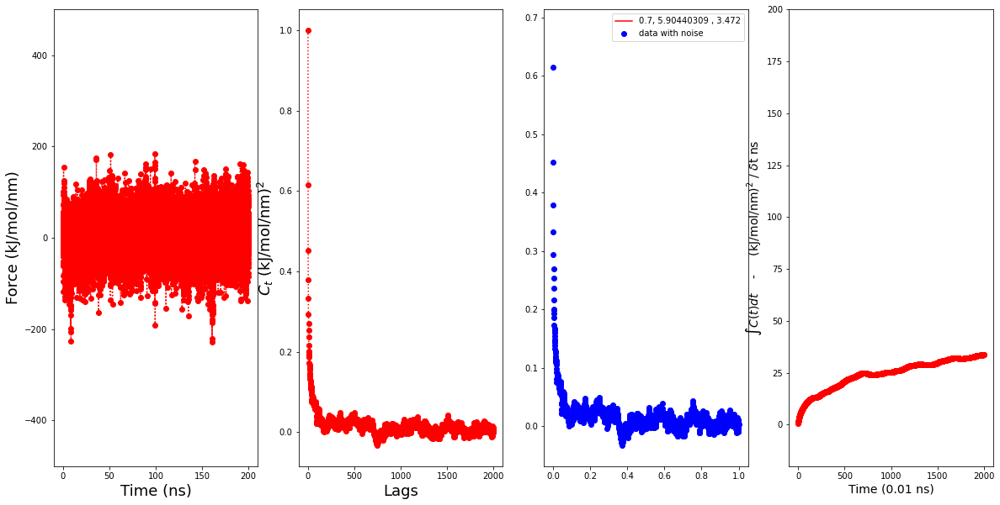

1
2
[ 1.          0.6010309   0.43011003 ... -0.02218985 -0.02258064
 -0.02437194]
[ 1.          0.6010309   0.43011003 ... -0.02218985 -0.02258064
 -0.02437194]
2001
0.6285407577239559 10.520429708287377 2.557257488347773
Gamma function value is
0.005419664191059691


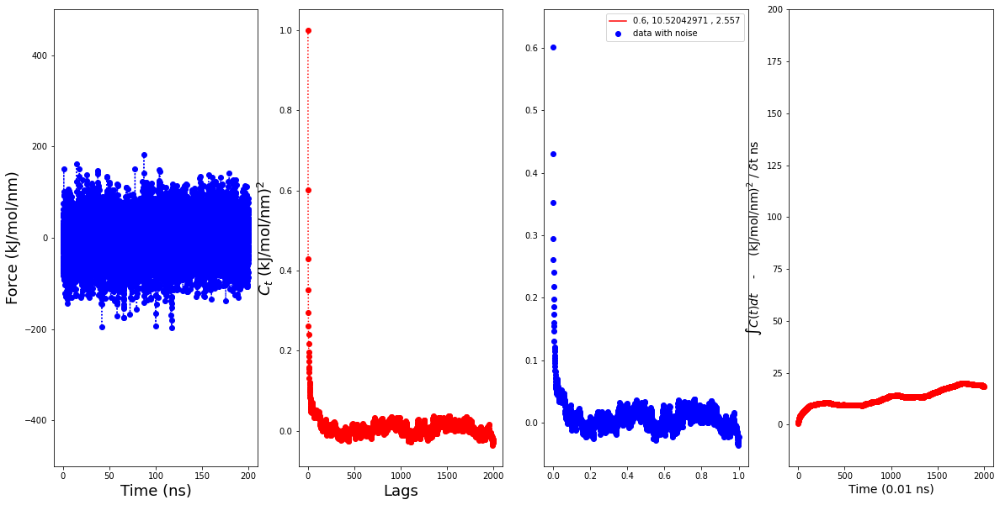

2
3
[1.         0.67613743 0.52998474 ... 0.01674039 0.01286647 0.01594003]
[1.         0.67613743 0.52998474 ... 0.01674039 0.01286647 0.01594003]
2001
0.6877619767492767 6.8292107925284276 2.5600425061851575
Gamma function value is
0.01786542578074897


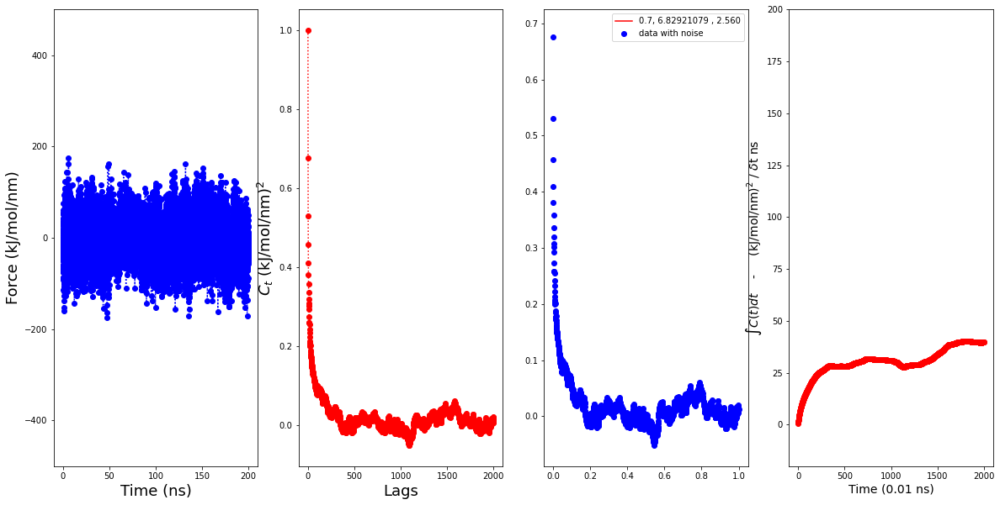

3
4
[1.         0.66396238 0.52905594 ... 0.00587813 0.0049152  0.00304962]
[1.         0.66396238 0.52905594 ... 0.00587813 0.0049152  0.00304962]
2001
0.06651086360192619 0.00614070634340432 -1415760.7733965695
Gamma function value is
0.0


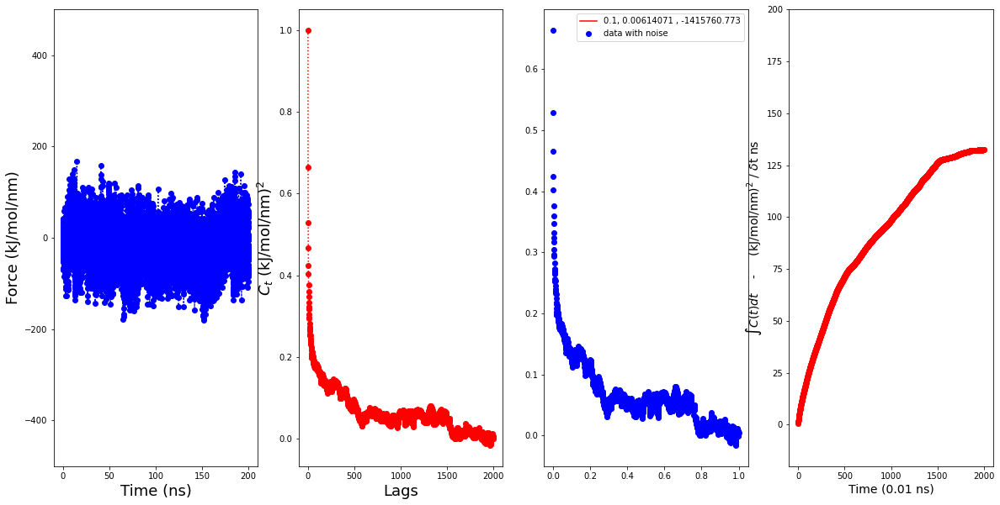

4
5
[ 1.00000000e+00  5.96131051e-01  4.24260959e-01 ... -5.65552888e-04
 -1.68804464e-03 -2.78841872e-03]
[ 1.00000000e+00  5.96131051e-01  4.24260959e-01 ... -5.65552888e-04
 -1.68804464e-03 -2.78841872e-03]
2001
0.6218707891278371 7.916769117549178 2.9036745675999405
Gamma function value is
0.008143098054400562


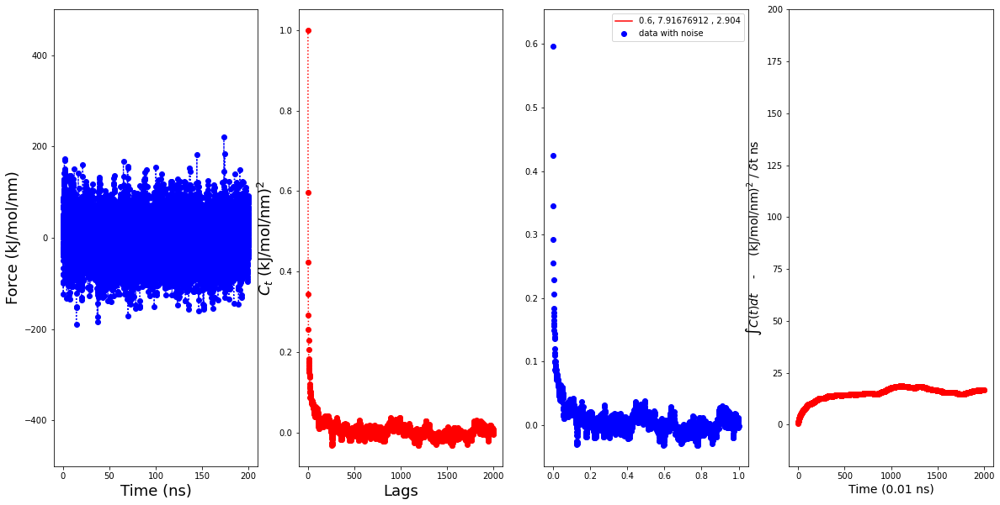

5
6
[1.         0.61773006 0.4570787  ... 0.01293179 0.00607781 0.00746434]
[1.         0.61773006 0.4570787  ... 0.01293179 0.00607781 0.00746434]
2001
0.5702908048755232 2.6861470513379 -1331707.3336182702
Gamma function value is
nan


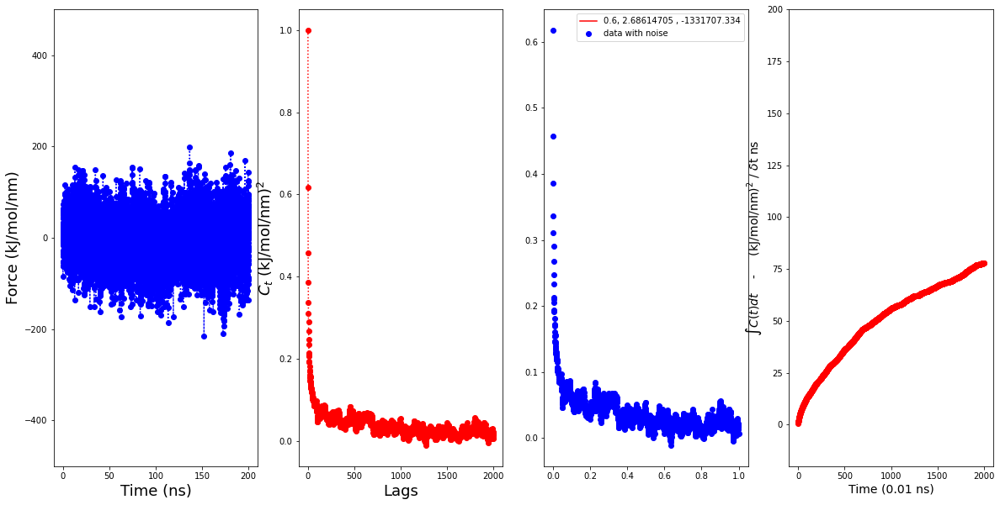

6
7
[1.         0.69251527 0.55384648 ... 0.05082204 0.04878326 0.04773624]
[1.         0.69251527 0.55384648 ... 0.05082204 0.04878326 0.04773624]
2001
0.05543795102952367 0.009708912708639716 -1388063.6533256979
Gamma function value is
-0.0


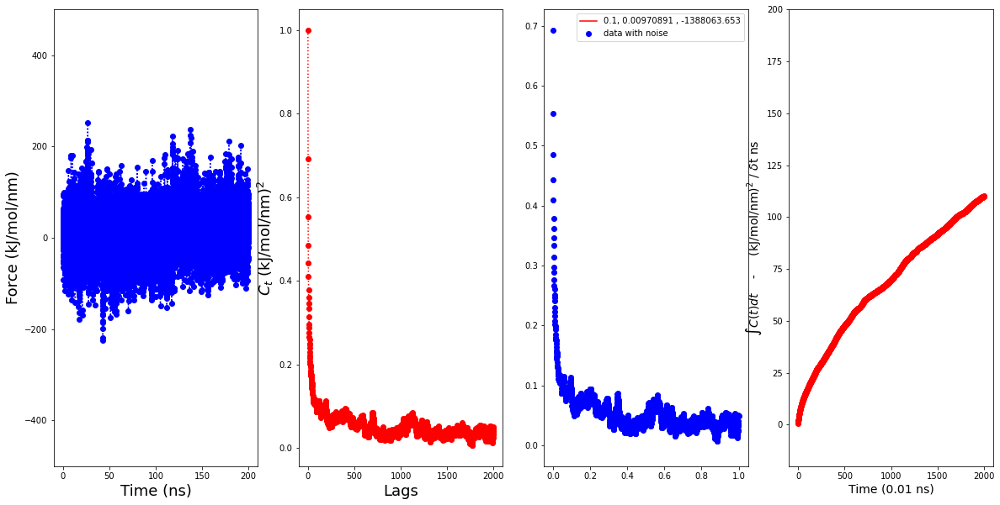

7
8
[1.         0.57622708 0.40589344 ... 0.00763039 0.00442495 0.00490627]
[1.         0.57622708 0.40589344 ... 0.00763039 0.00442495 0.00490627]
2001
0.5714540917454701 7.1228091054587175 2.799067271442675
Gamma function value is
0.011000871329126728


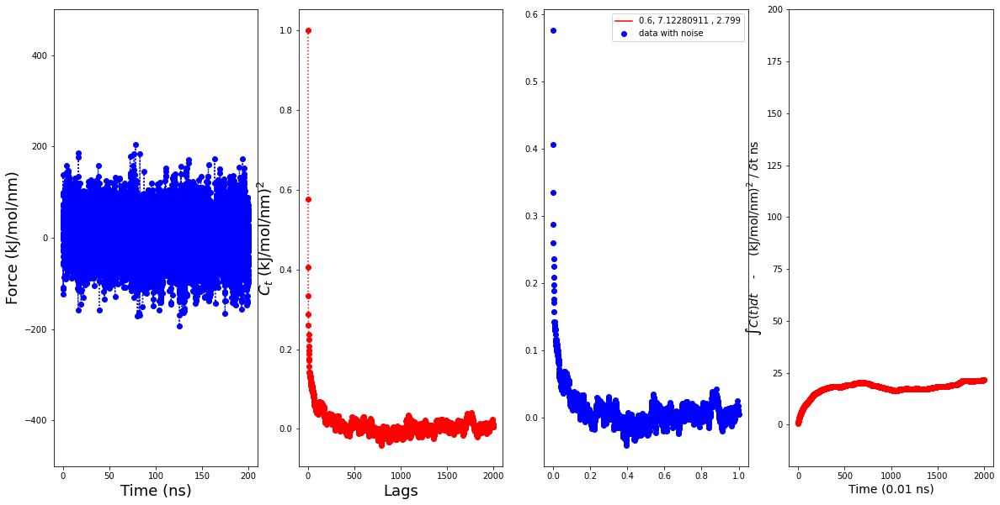

8
9
[1.         0.65060838 0.48879637 ... 0.0110281  0.00976042 0.00855269]
[1.         0.65060838 0.48879637 ... 0.0110281  0.00976042 0.00855269]
2001
0.6664482620754738 9.107349833513016 2.457203858586
Gamma function value is
0.009280031923589551


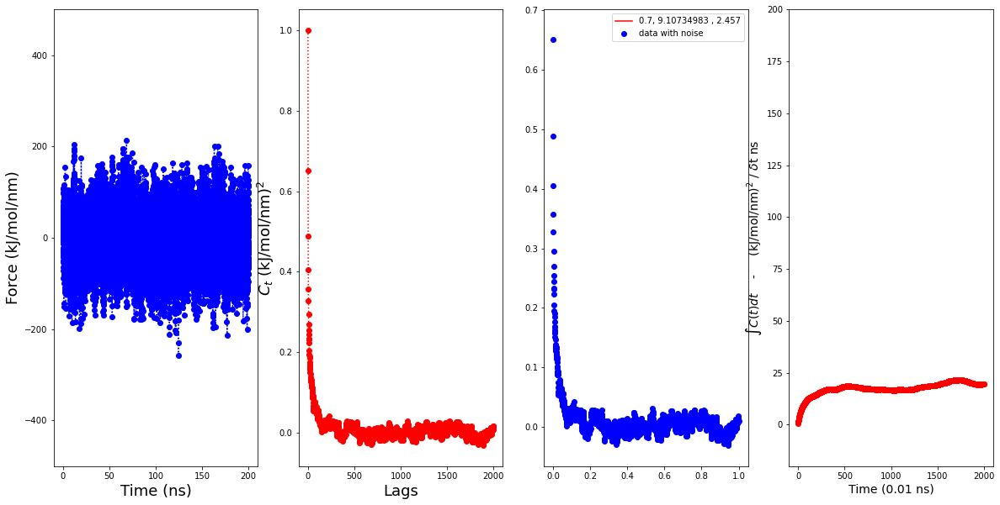

9
10
[ 1.          0.6898441   0.54091652 ... -0.02455026 -0.01995675
 -0.01676349]
[ 1.          0.6898441   0.54091652 ... -0.02455026 -0.01995675
 -0.01676349]
2001
0.7487011741456447 4.903632635205533 3.380243690350253
Gamma function value is
0.034228019343023684


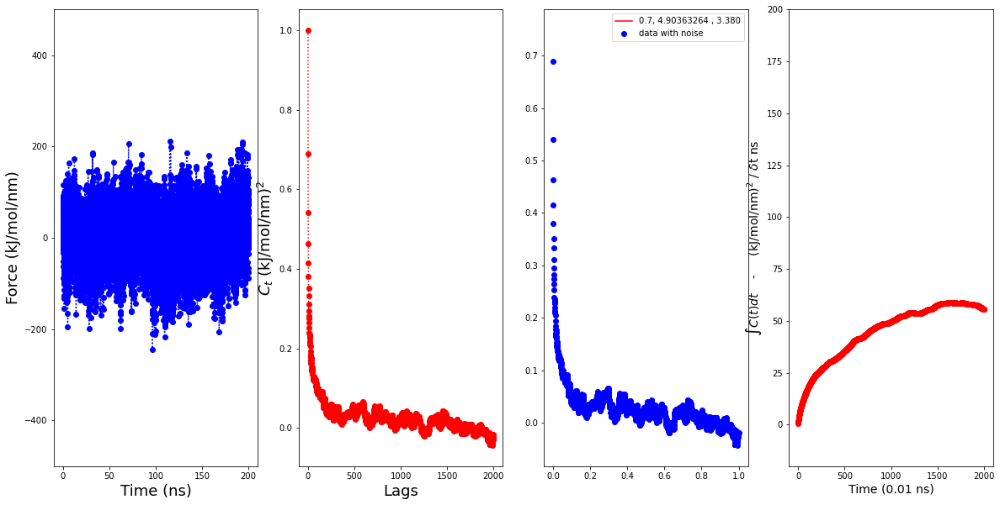

10
11
[ 1.          0.66596944  0.5166622  ... -0.00433956 -0.00933541
 -0.00422281]
[ 1.          0.66596944  0.5166622  ... -0.00433956 -0.00933541
 -0.00422281]
2001
0.6482702337264328 6.812425024483858 2.5347328899463157
Gamma function value is
0.017292649364831707


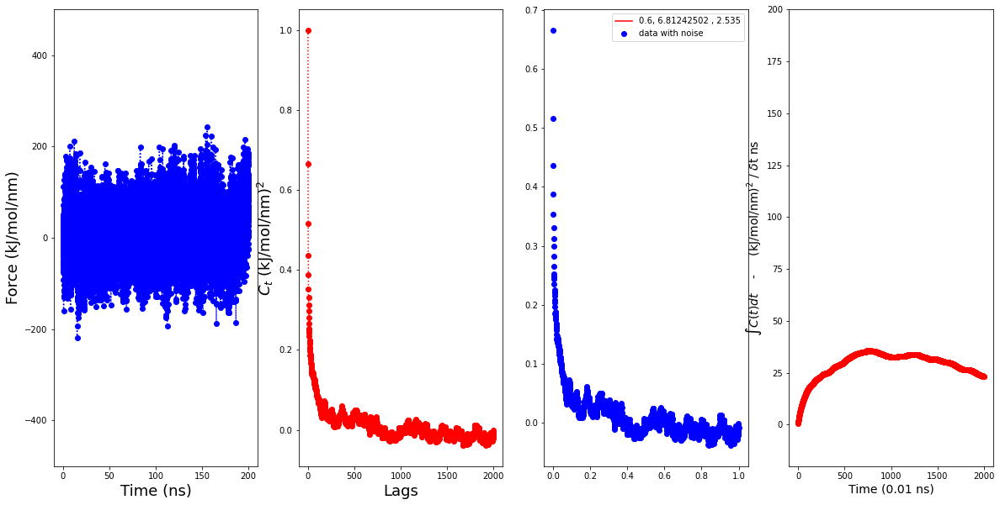

11
12
[ 1.          0.68976885  0.53687637 ... -0.01836492 -0.02007413
 -0.01988333]
[ 1.          0.68976885  0.53687637 ... -0.01836492 -0.02007413
 -0.01988333]
2001
0.7237124220512237 7.881302568666954 2.5727803241591833
Gamma function value is
0.012871768478822708


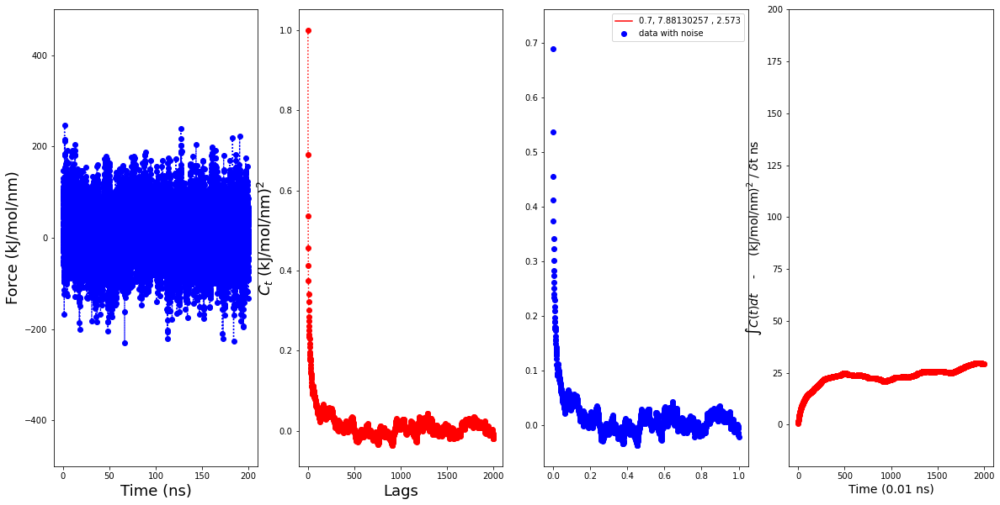

12
13
[1.         0.72613481 0.58518505 ... 0.04486908 0.04593398 0.04912691]
[1.         0.72613481 0.58518505 ... 0.04486908 0.04593398 0.04912691]
2001
0.40700674200272047 3.622627869688308 -1313090.6284281637
Gamma function value is
nan


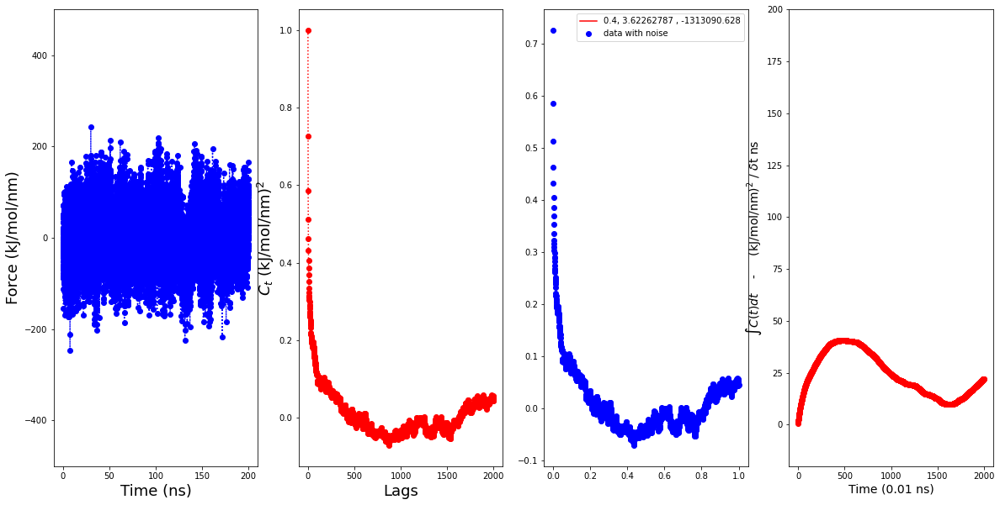

13
14
[1.         0.70339422 0.56245938 ... 0.00922325 0.00507021 0.00342596]
[1.         0.70339422 0.56245938 ... 0.00922325 0.00507021 0.00342596]
2001
0.6848974174433413 8.07687118867006 2.3084553913306634
Gamma function value is
0.014920800469715143


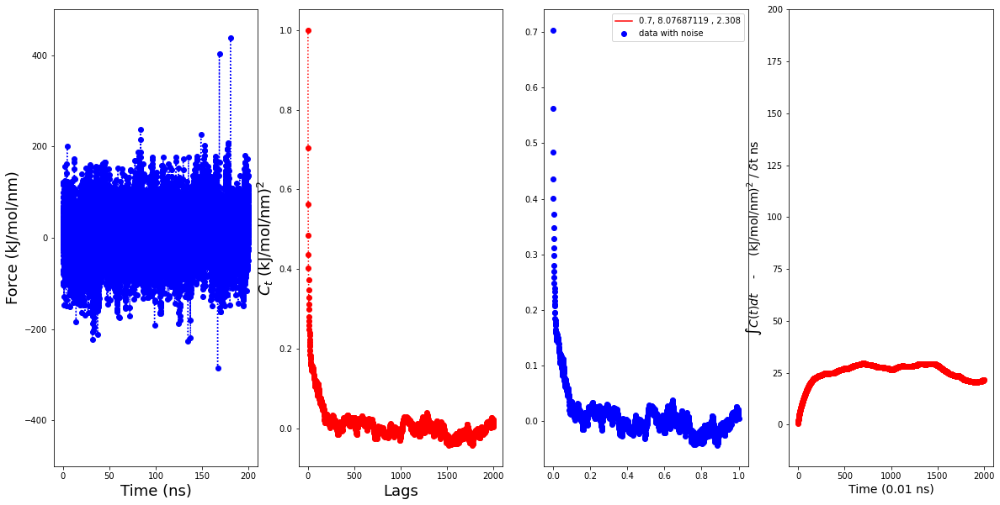

14
15
[1.         0.54808734 0.44439007 ... 0.04700382 0.04453913 0.04050023]
[1.         0.54808734 0.44439007 ... 0.04700382 0.04453913 0.04050023]
2001
0.06812203252540722 0.0038215286022261225 -852791.5858096348
Gamma function value is
-0.0


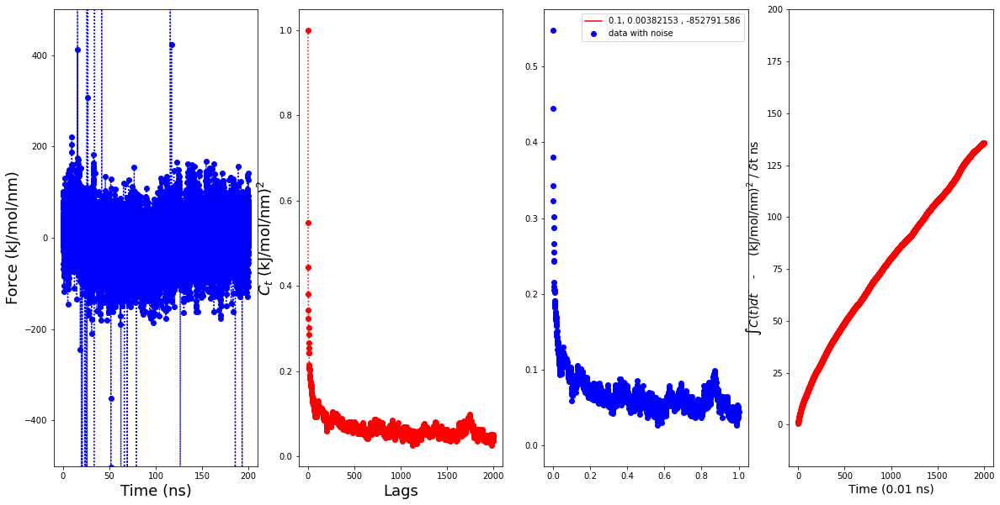

15
16
[ 1.          0.6568873   0.5204145  ...  0.00316473 -0.0063884
 -0.00570864]
[ 1.          0.6568873   0.5204145  ...  0.00316473 -0.0063884
 -0.00570864]
2001
0.45668901744847545 13.477606057400147 1.460887185458677
Gamma function value is
0.013220252060019656


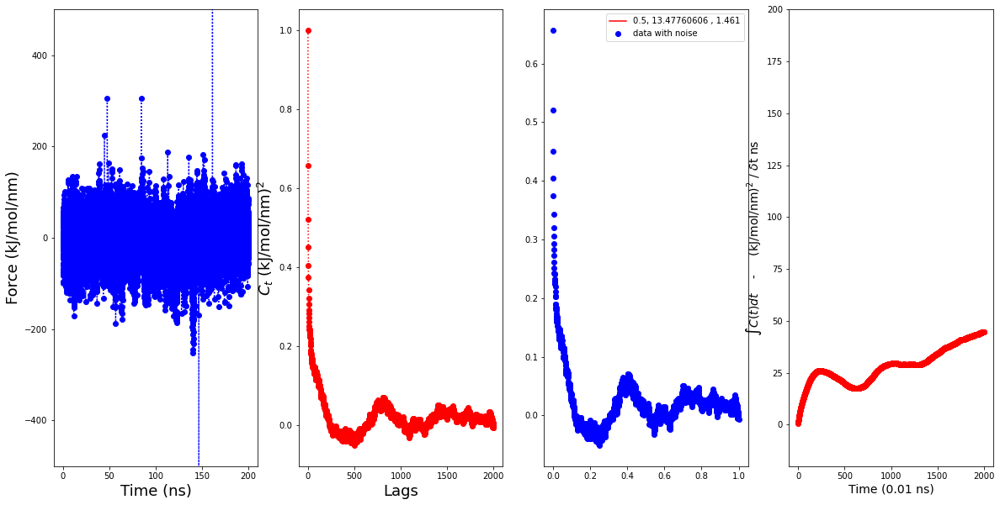

16
17
[ 1.          0.64590026  0.50624096 ... -0.03359264 -0.03497917
 -0.03841838]
[ 1.          0.64590026  0.50624096 ... -0.03359264 -0.03497917
 -0.03841838]
2001
0.26369150410410913 3.497995697949637 -1431895.0070562446
Gamma function value is
nan


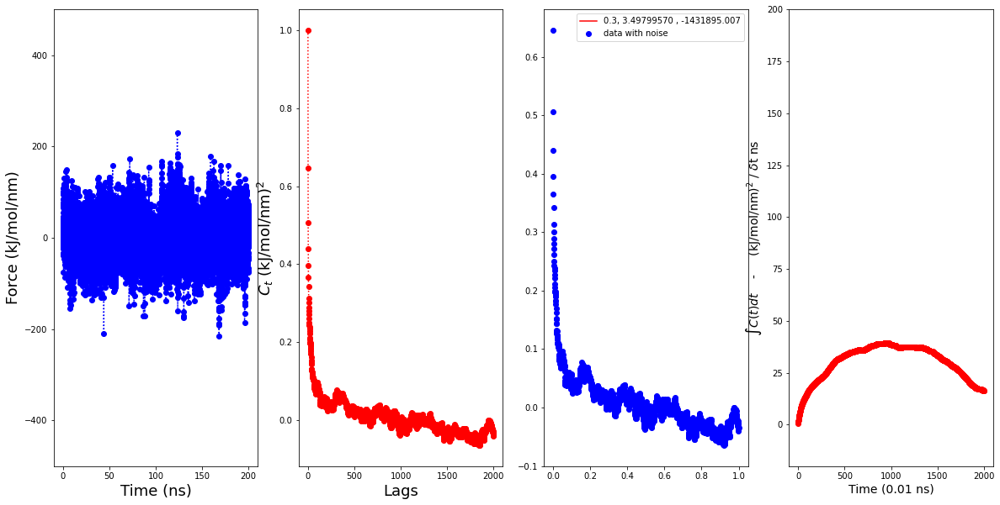

17
18
[ 1.00000000e+00  6.61816836e-01  5.17643816e-01 ...  1.31129666e-04
 -6.32901878e-05 -2.92041646e-03]
[ 1.00000000e+00  6.61816836e-01  5.17643816e-01 ...  1.31129666e-04
 -6.32901878e-05 -2.92041646e-03]
2001
0.7099491075344188 6.093110629564873 2.9990561365290778
Gamma function value is
0.018840273901430376


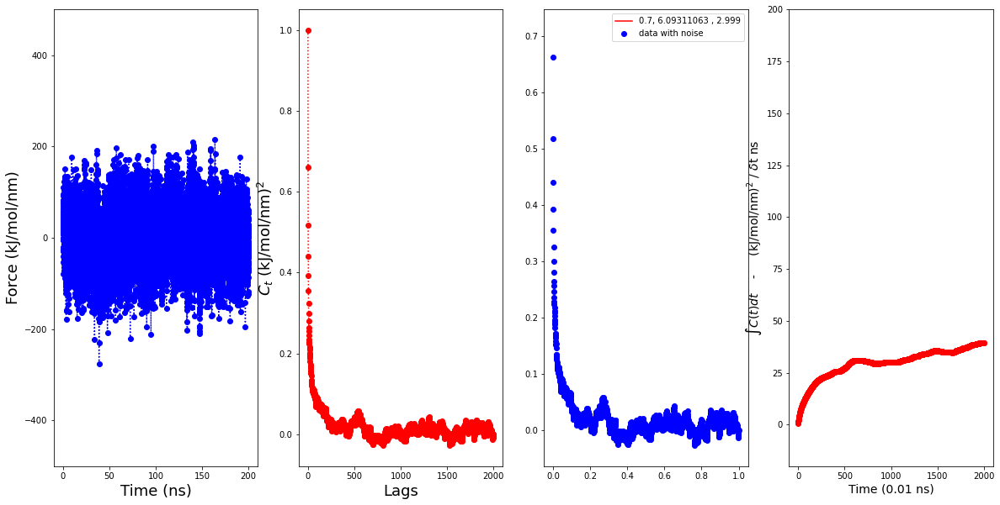

18
19
[1.         0.60362627 0.45412432 ... 0.01236034 0.01243174 0.00108289]
[1.         0.60362627 0.45412432 ... 0.01236034 0.01243174 0.00108289]
2001
0.6802925946871924 6.127866668962099 3.3896751058651557
Gamma function value is
0.014579244934275514


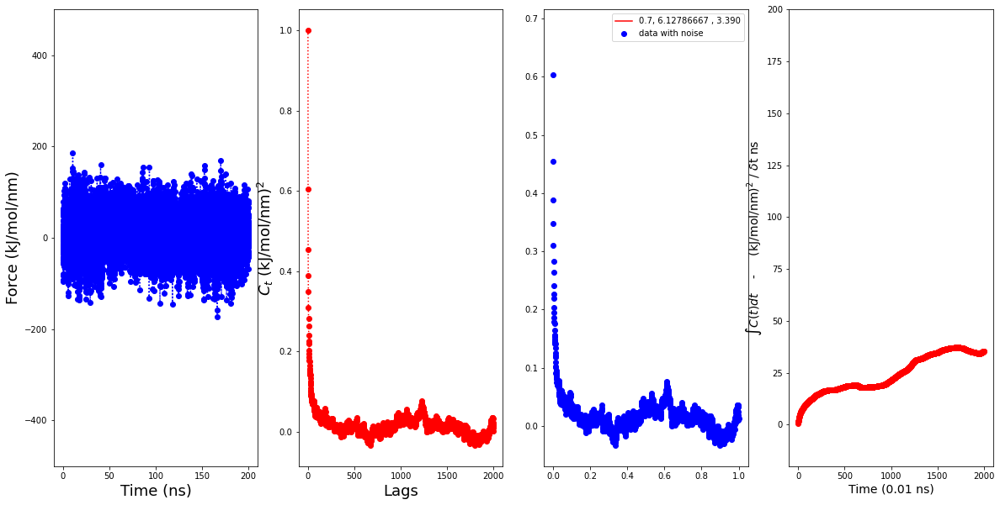

19
20
[ 1.          0.67367418  0.52411035 ... -0.0013158  -0.00659101
 -0.0026193 ]
[ 1.          0.67367418  0.52411035 ... -0.0013158  -0.00659101
 -0.0026193 ]
2001
0.7371560423965776 6.467142899400945 3.0447614610463765
Gamma function value is
0.01591571290163538


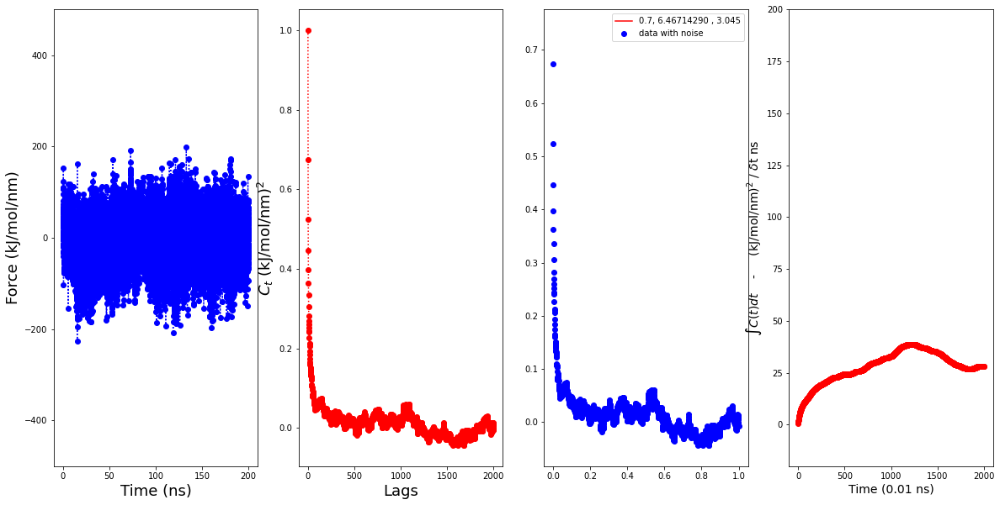

20
21
[ 1.          0.66396803  0.51333611 ... -0.0091269  -0.00591196
 -0.00643759]
[ 1.          0.66396803  0.51333611 ... -0.0091269  -0.00591196
 -0.00643759]
2001
0.6466501550795107 8.417216511994413 2.349526205914001
Gamma function value is
0.012248936381426575


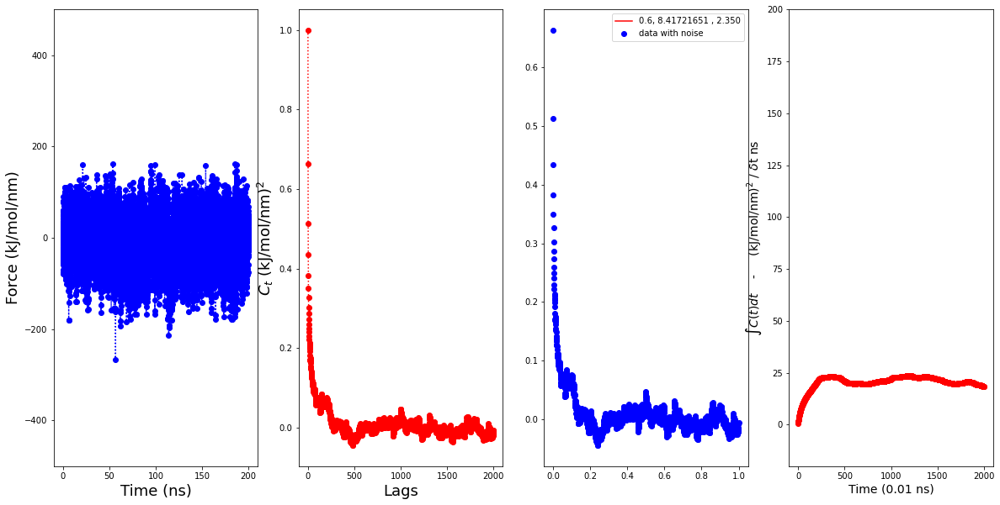

21
22
[1.         0.59971948 0.4280638  ... 0.01033658 0.0101214  0.01242595]
[1.         0.59971948 0.4280638  ... 0.01033658 0.0101214  0.01242595]
2001
0.6061627780864114 16.784433211760447 2.0856788843886167
Gamma function value is
0.003662828513257464


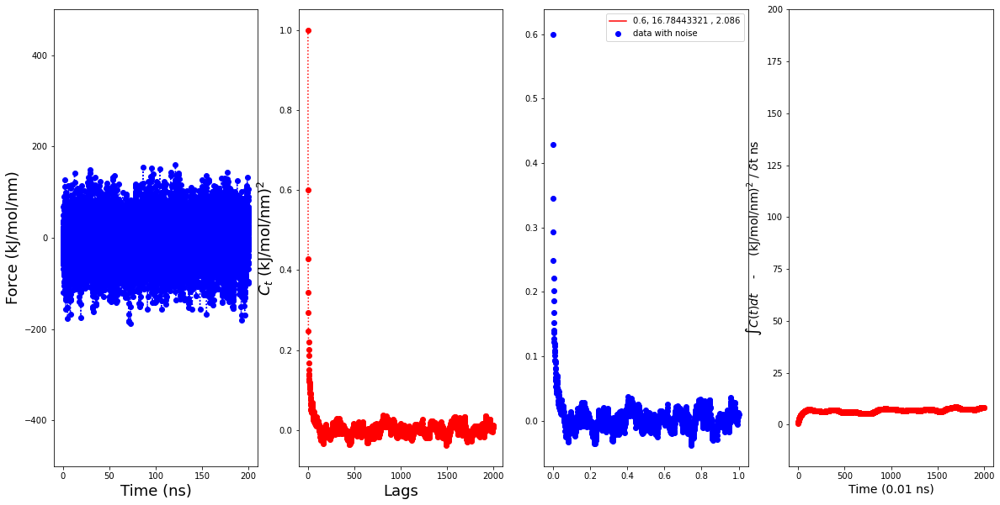

22
23
[ 1.          0.63190758  0.46530506 ... -0.00392263 -0.00406221
 -0.00567506]
[ 1.          0.63190758  0.46530506 ... -0.00392263 -0.00406221
 -0.00567506]
2001
0.6450448815026301 15.720805347053714 2.0737007053726004
Gamma function value is
0.0045654862466117585


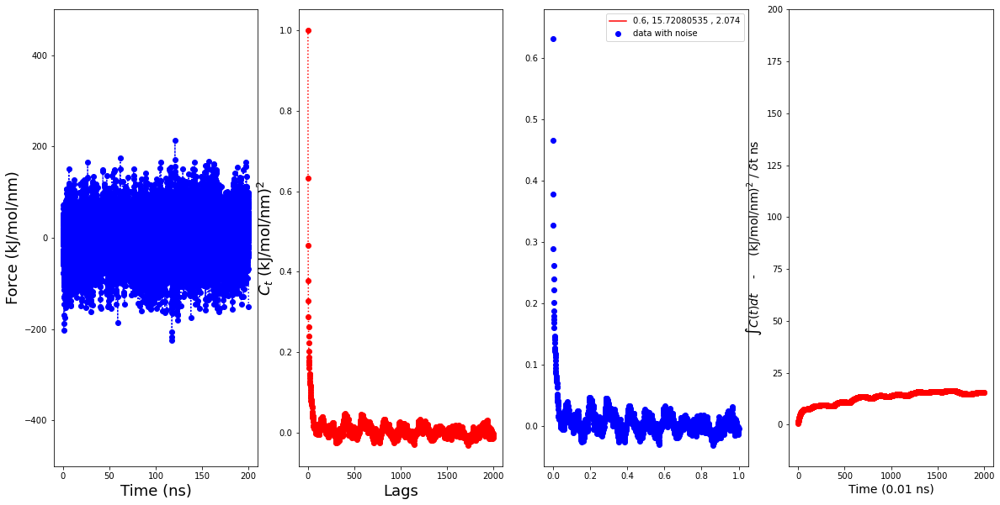

23
24
[1.         0.55415762 0.37537347 ... 0.00714417 0.00916699 0.00683329]
[1.         0.55415762 0.37537347 ... 0.00714417 0.00916699 0.00683329]
2001
0.5585839477957921 17.52861866372707 2.1069014582638843
Gamma function value is
0.002961236913137841


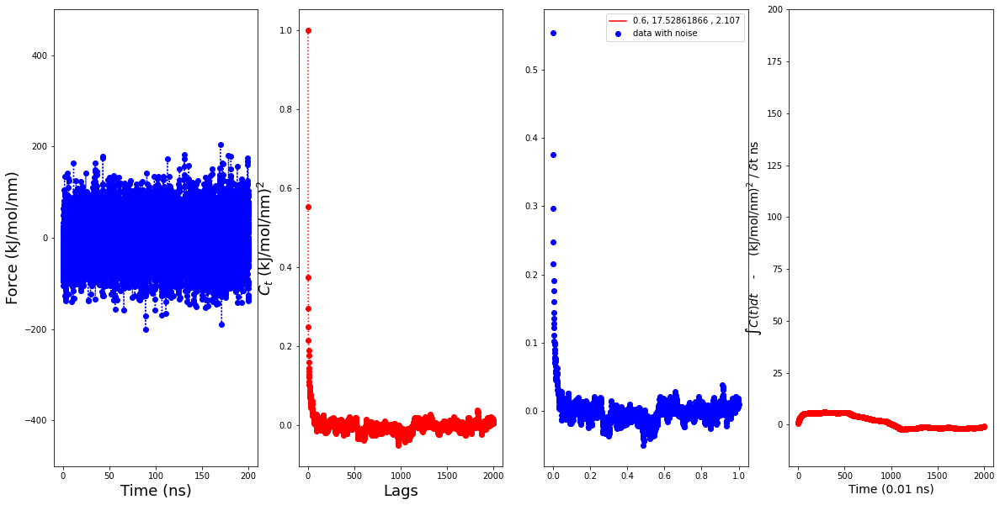

24
25
[1.         0.60293374 0.43542222 ... 0.0186786  0.01315555 0.01288414]
[1.         0.60293374 0.43542222 ... 0.0186786  0.01315555 0.01288414]
2001
0.6502983165262035 8.53042757554288 2.9069420718715624
Gamma function value is
0.006835317849527623


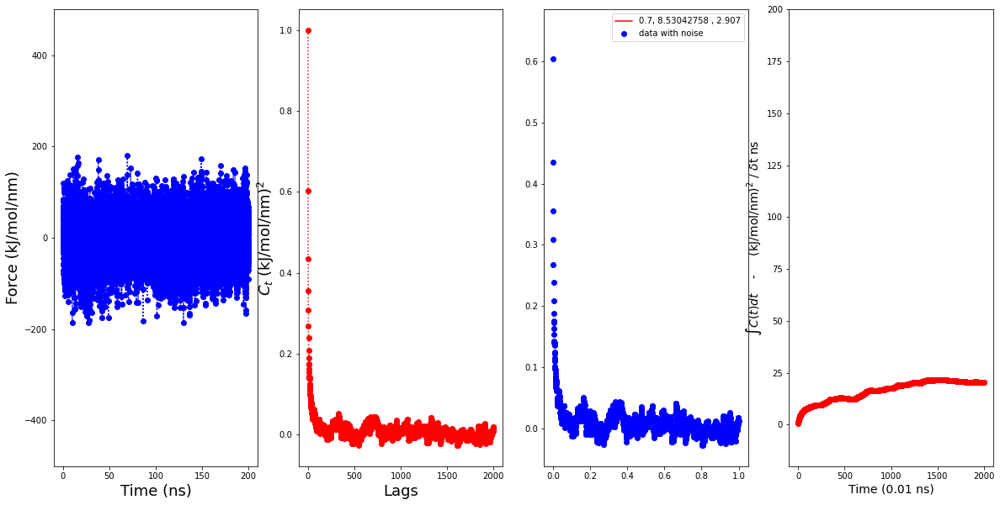

25
26
[1.         0.59064292 0.42015921 ... 0.0172646  0.02171895 0.02056178]
[1.         0.59064292 0.42015921 ... 0.0172646  0.02171895 0.02056178]
2001
0.6395424498049317 6.47194264750742 3.4174907557356256
Gamma function value is
0.011230848018863546


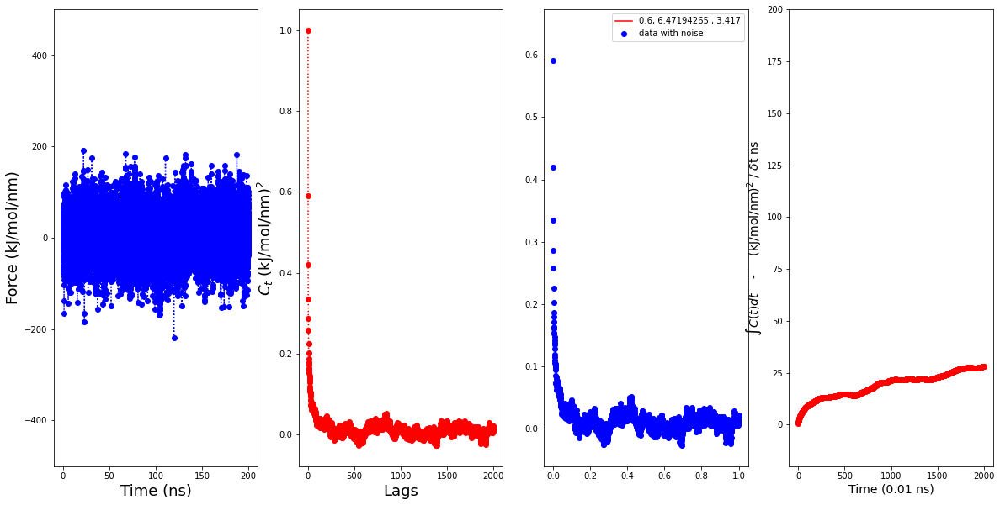

26
27
[ 1.          0.57058063  0.39808387 ... -0.00773009 -0.01153176
  0.00195307]
[ 1.          0.57058063  0.39808387 ... -0.00773009 -0.01153176
  0.00195307]
2001
0.6112662006668653 5.350185707501727 4.010600807038032
Gamma function value is
0.01787245732520807


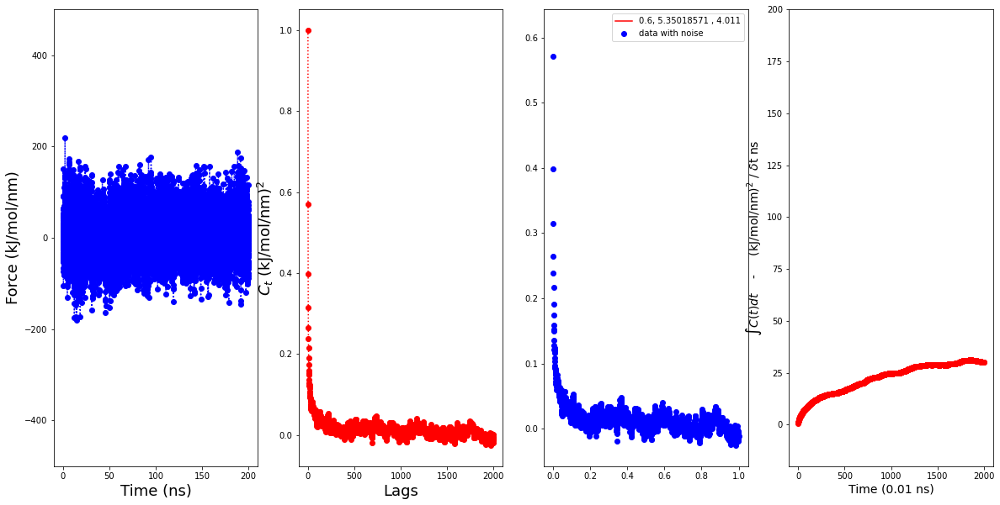

27
28
[ 1.          0.65059683  0.48848954 ... -0.0196434  -0.01987043
 -0.01961105]
[ 1.          0.65059683  0.48848954 ... -0.0196434  -0.01987043
 -0.01961105]
2001
0.6595909215151307 7.561263152641909 2.6167591314527257
Gamma function value is
0.012551207308085541


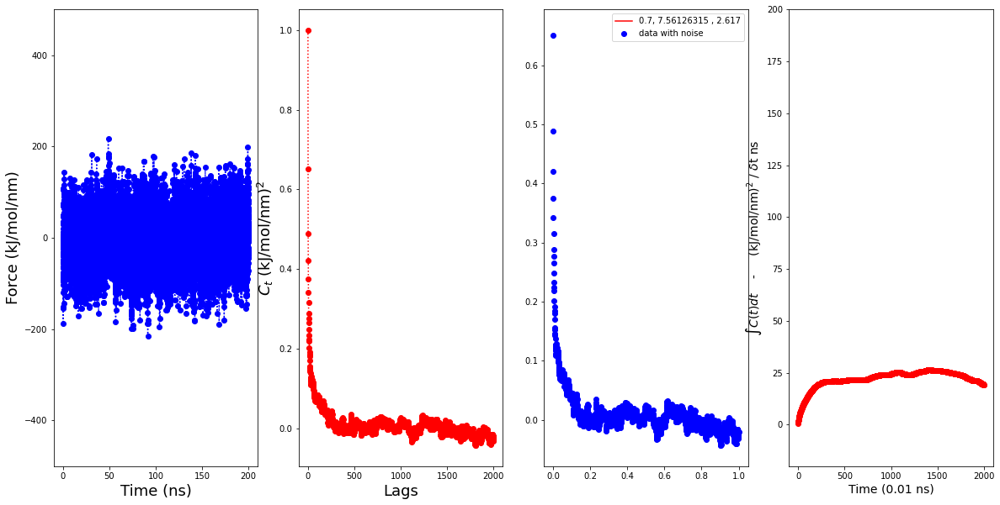

28
29
[1.         0.64544945 0.49505567 ... 0.01388508 0.01055793 0.00990032]
[1.         0.64544945 0.49505567 ... 0.01388508 0.01055793 0.00990032]
2001
0.6743835565143623 8.594955286985451 2.4856120670677884
Gamma function value is
0.01050600613960035


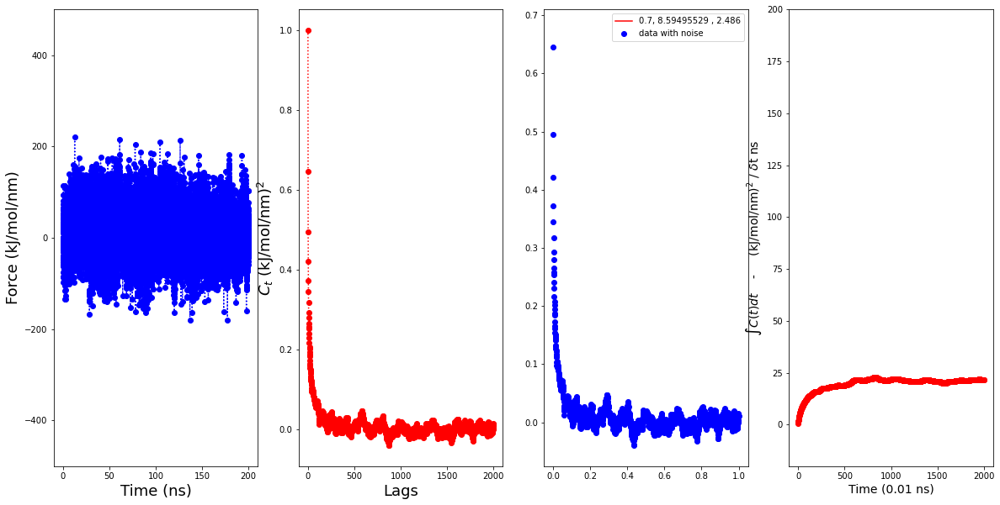

29
30
[ 1.          0.62555282  0.47606185 ... -0.01031987 -0.00440421
 -0.00957536]
[ 1.          0.62555282  0.47606185 ... -0.01031987 -0.00440421
 -0.00957536]
2001
0.04767339920837043 0.01116889999929995 -1089247.1777376975
Gamma function value is
-0.0


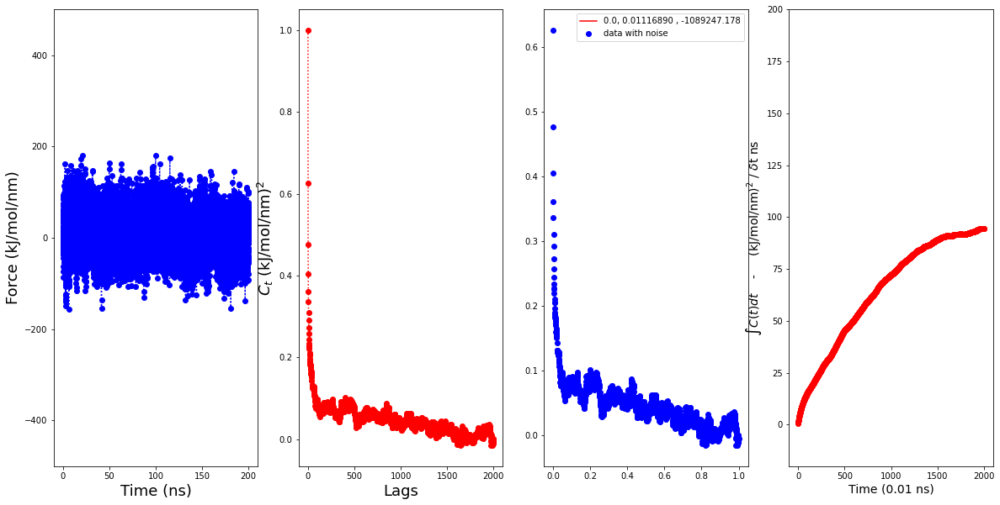

30
31
[ 1.00000000e+00  6.40304374e-01  4.97425886e-01 ... -9.72609541e-04
  3.62522076e-03  2.58955753e-03]
[ 1.00000000e+00  6.40304374e-01  4.97425886e-01 ... -9.72609541e-04
  3.62522076e-03  2.58955753e-03]
2001
0.09507777823267079 0.8671312795339797 -1433977.1011342104
Gamma function value is
-0.0


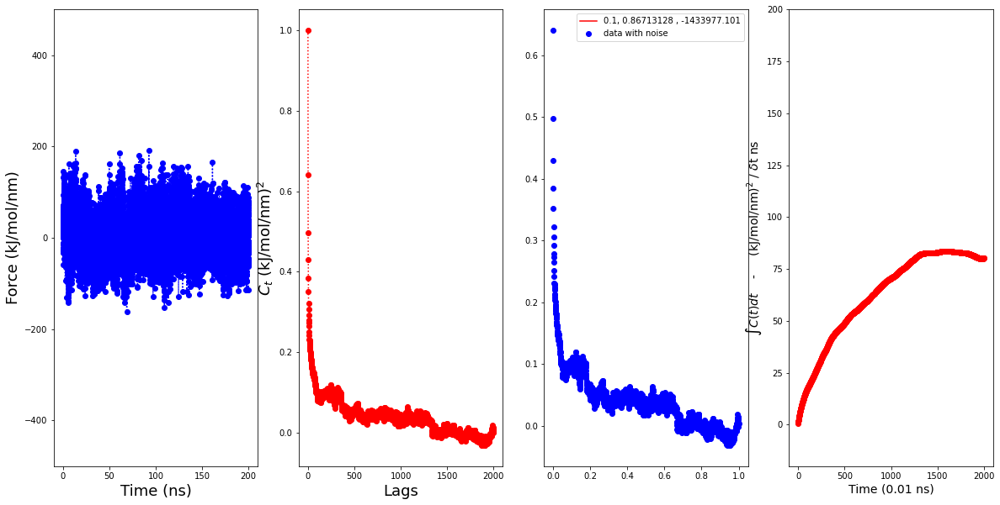

31
32
[ 1.          0.66269437  0.52702281 ... -0.01475265 -0.01404218
 -0.01129275]
[ 1.          0.66269437  0.52702281 ... -0.01475265 -0.01404218
 -0.01129275]
2001
0.35477825347391234 2.809111770393044 -1282441.0382137783
Gamma function value is
nan


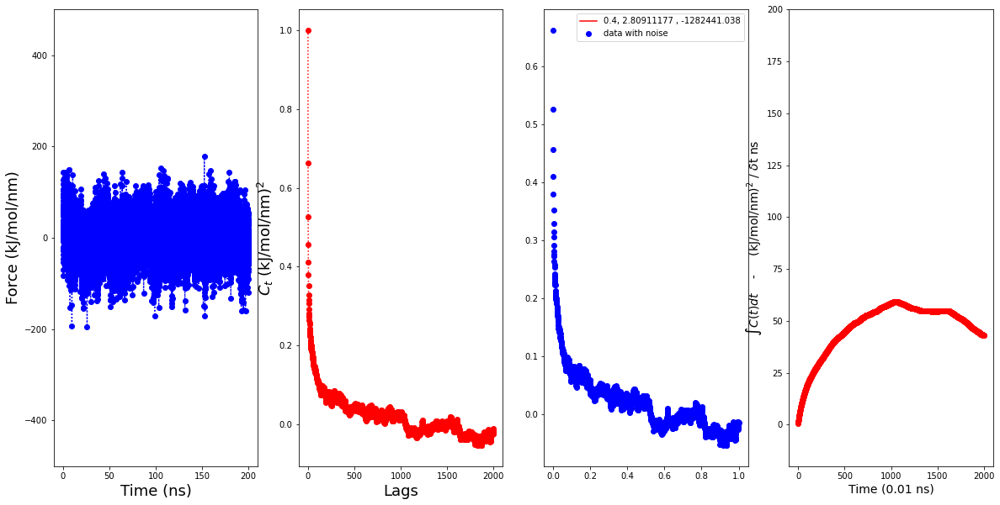

32
33
[1.         0.68167158 0.54874602 ... 0.04994601 0.05820661 0.05934213]
[1.         0.68167158 0.54874602 ... 0.04994601 0.05820661 0.05934213]
2001
0.071870615901252 5.668156330224642e-05 -935914.5568275165
Gamma function value is
0.0


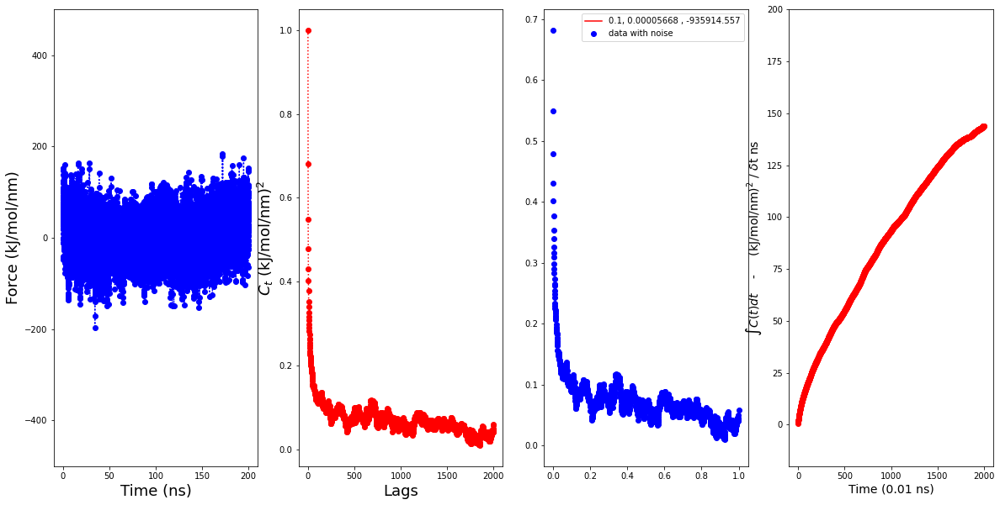

33
34
[ 1.          0.64405267  0.49821063 ... -0.03965643 -0.04395182
 -0.03991842]
[ 1.          0.64405267  0.49821063 ... -0.03965643 -0.04395182
 -0.03991842]
2001
0.02295434297521277 0.015009719548212577 -738076.3360393438
Gamma function value is
0.0


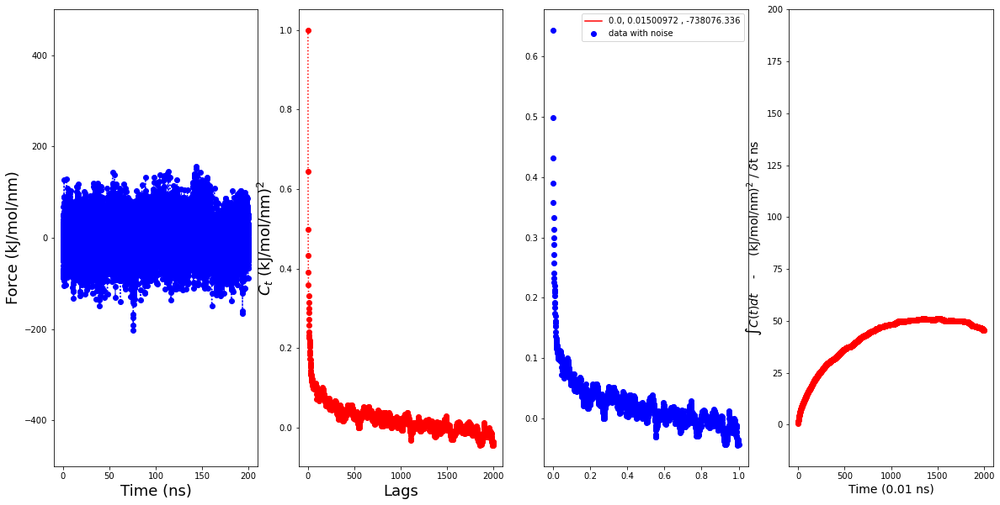

34
35
[1.         0.62317603 0.47384805 ... 0.02477474 0.01823943 0.02340343]
[1.         0.62317603 0.47384805 ... 0.02477474 0.01823943 0.02340343]
2001
0.7007093723374296 3.63814649708663 4.6568282826696485
Gamma function value is
0.11567959180730036


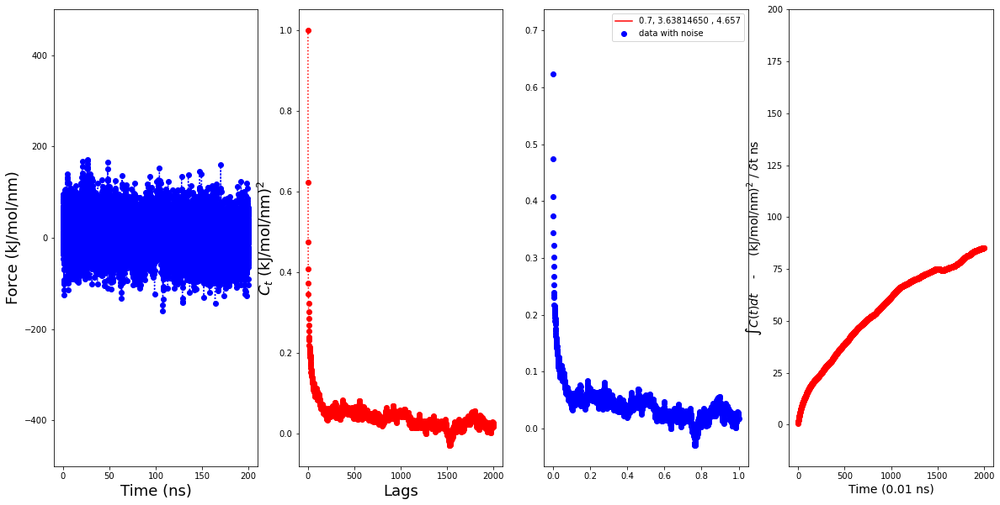

35
36
[1.         0.59382171 0.44161602 ... 0.00250626 0.00467693 0.00279861]
[1.         0.59382171 0.44161602 ... 0.00250626 0.00467693 0.00279861]
2001
0.6575757616873881 6.222616933845209 3.261672754529133
Gamma function value is
0.014232646276784534


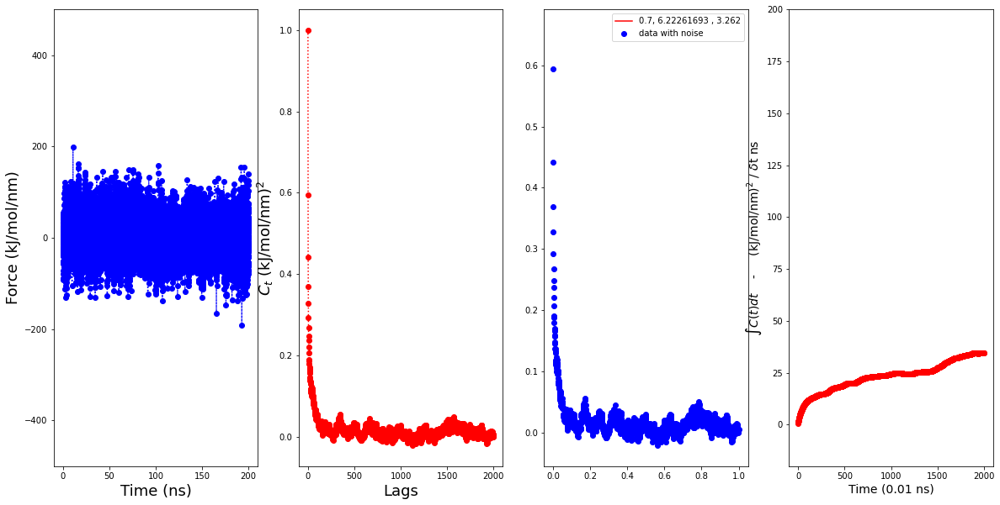

36
37
[ 1.          0.7207177   0.58293832 ... -0.00311399  0.00115605
  0.00181022]
[ 1.          0.7207177   0.58293832 ... -0.00311399  0.00115605
  0.00181022]
2001
0.76244573604062 5.252678954385798 2.8621524866139745
Gamma function value is
0.03345859176025215


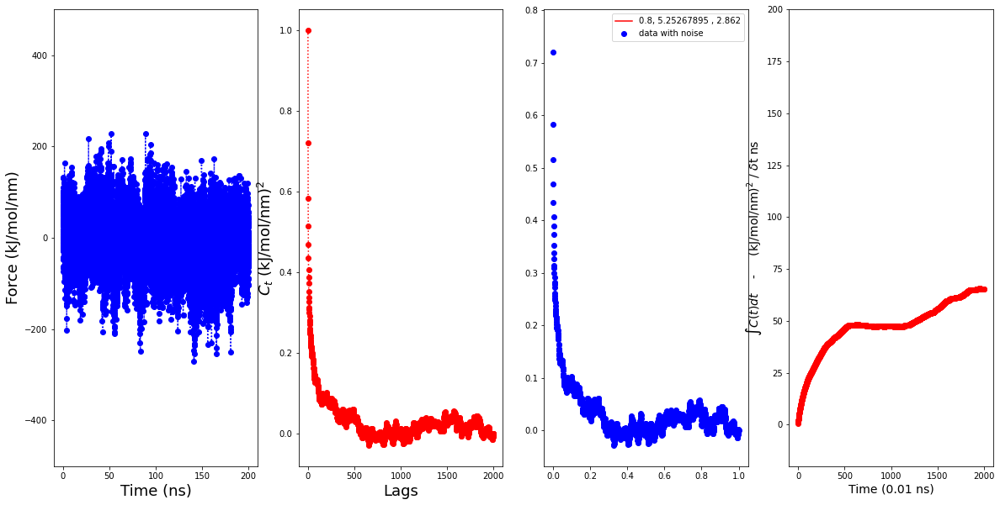

37
38
[1.         0.61756884 0.45820585 ... 0.0058832  0.00570339 0.0107993 ]
[1.         0.61756884 0.45820585 ... 0.0058832  0.00570339 0.0107993 ]
2001
0.6270152124374868 6.8637423847531345 2.809552003457481
Gamma function value is
0.013287710161232669


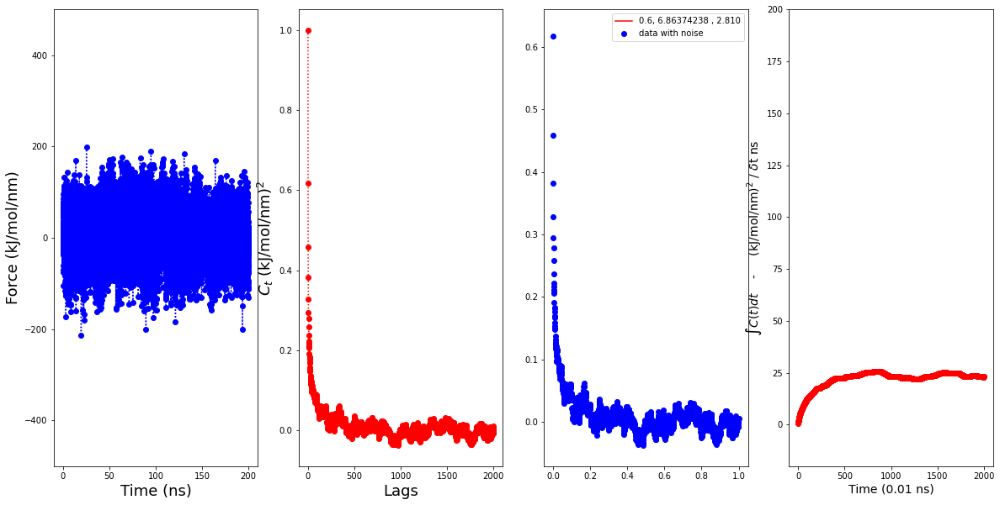

38
39
[ 1.          0.61756583  0.46140971 ... -0.02409005 -0.02089609
 -0.02382449]
[ 1.          0.61756583  0.46140971 ... -0.02409005 -0.02089609
 -0.02382449]
2001
0.24410484393097256 4.405341994512115 -1391872.0949811796
Gamma function value is
nan


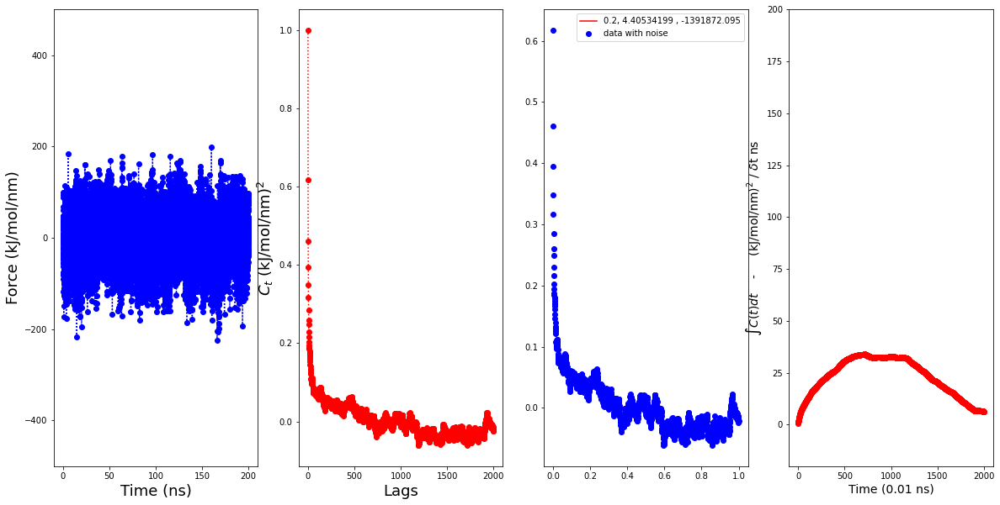

39
40
[ 1.          0.55910297  0.38328474 ... -0.03175737 -0.03382018
 -0.03491428]
[ 1.          0.55910297  0.38328474 ... -0.03175737 -0.03382018
 -0.03491428]
2001
0.5638429135591424 8.886413313678156 2.6647193445012256
Gamma function value is
0.006690721131285097


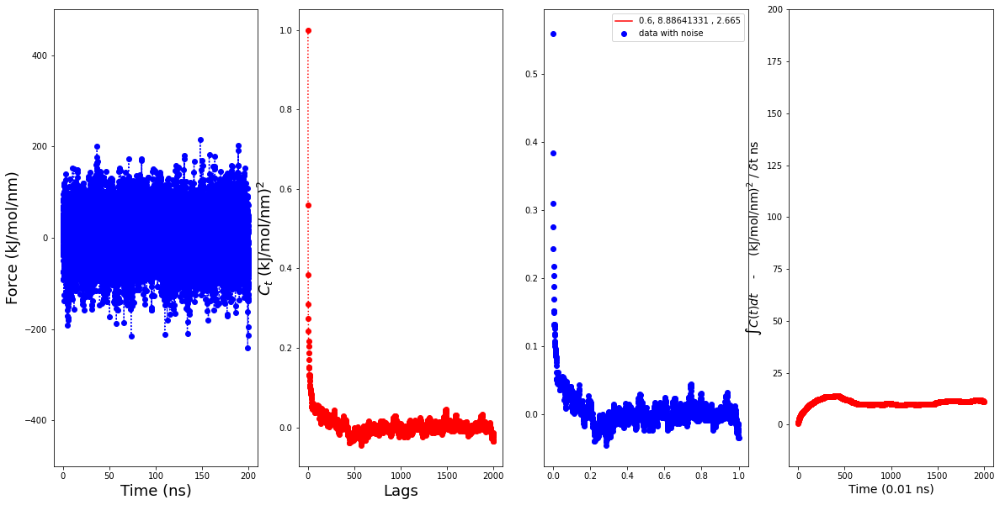

40
41
[ 1.          0.6468589   0.48821975 ... -0.02275174 -0.02094571
 -0.01828114]
[ 1.          0.6468589   0.48821975 ... -0.02275174 -0.02094571
 -0.01828114]
2001
0.6757279137404417 7.494195840795622 2.723802224958758
Gamma function value is
0.012008835772831954


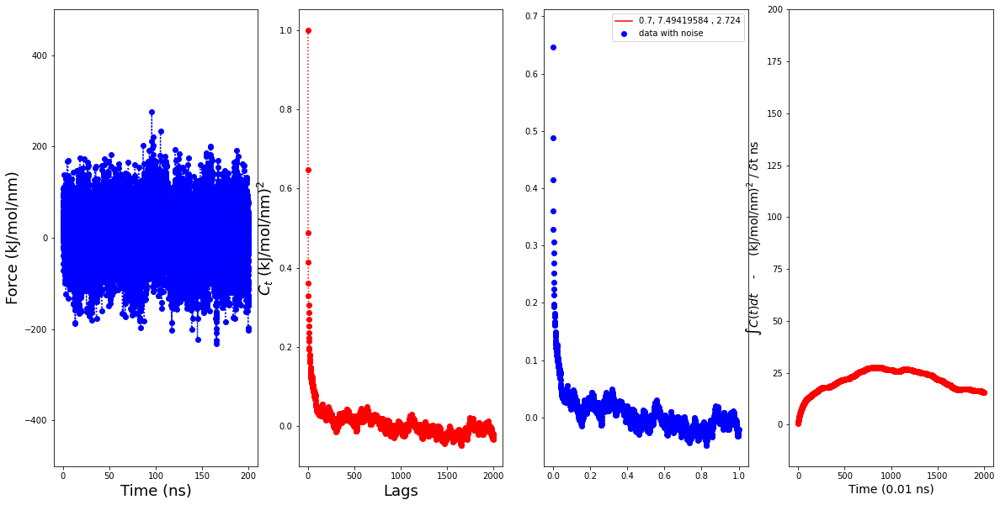

41
42
[1.         0.66415087 0.51650748 ... 0.00400769 0.00312585 0.00763211]
[1.         0.66415087 0.51650748 ... 0.00400769 0.00312585 0.00763211]
2001
0.7115065853838963 9.182302851494175 2.4478953282619673
Gamma function value is
0.009812579156770147


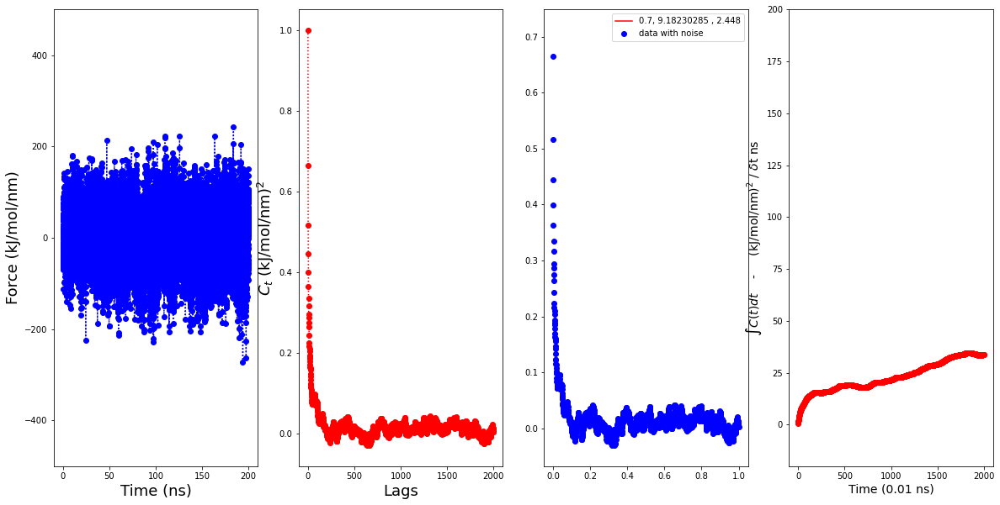

42
43
[ 1.          0.63688117  0.49026555 ... -0.00314673 -0.0017409
 -0.00412796]
[ 1.          0.63688117  0.49026555 ... -0.00314673 -0.0017409
 -0.00412796]
2001
0.4494735173379638 2.1993496669764125 -1351173.9269685566
Gamma function value is
nan


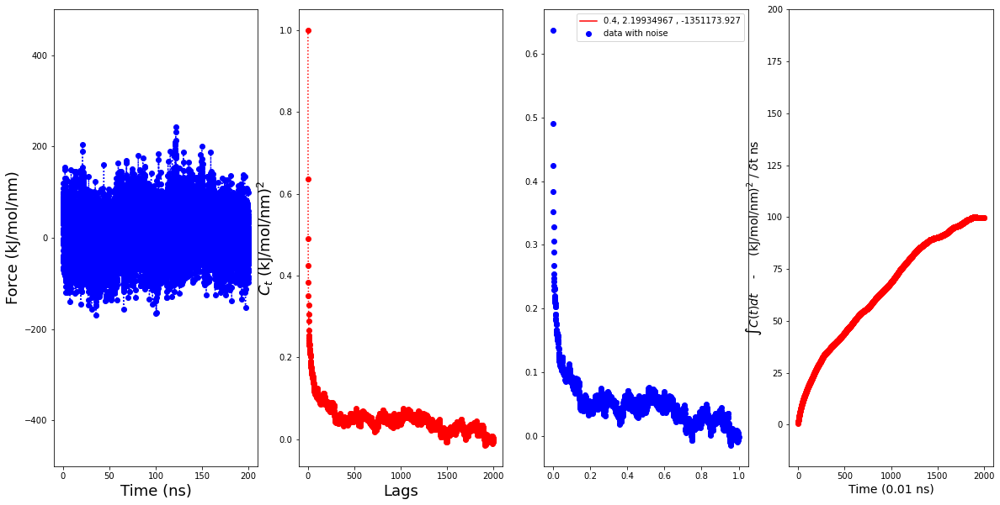

43
44
[ 1.00000000e+00  6.15739342e-01  4.73768857e-01 ...  6.70506632e-03
  2.44003120e-03 -9.92514326e-04]
[ 1.00000000e+00  6.15739342e-01  4.73768857e-01 ...  6.70506632e-03
  2.44003120e-03 -9.92514326e-04]
2001
0.39838874848251077 2.2707237768419555 -1359580.649638333
Gamma function value is
nan


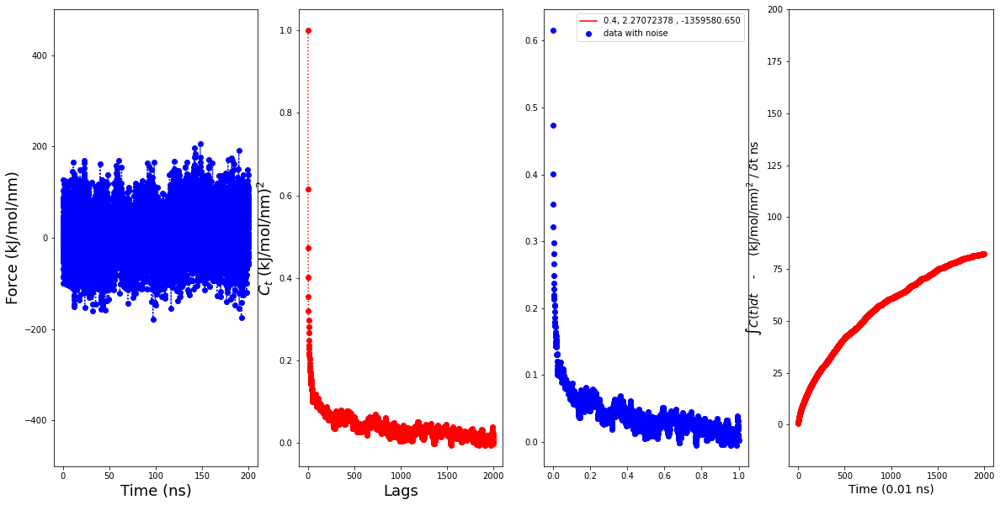

44
45
[ 1.00000000e+00  6.23572863e-01  4.70592184e-01 ... -4.30546995e-03
 -5.11373899e-03 -6.94341437e-05]
[ 1.00000000e+00  6.23572863e-01  4.70592184e-01 ... -4.30546995e-03
 -5.11373899e-03 -6.94341437e-05]
2001
0.6898341007213328 5.191869919861974 3.6834342529805357
Gamma function value is
0.024097658086203476


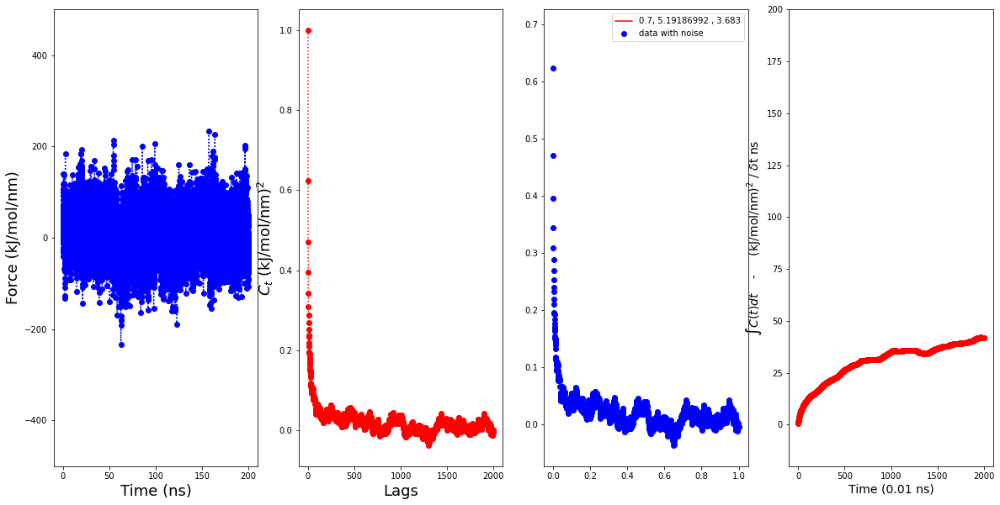

45
46
[1.         0.68532546 0.55582851 ... 0.00806093 0.00642688 0.00753635]
[1.         0.68532546 0.55582851 ... 0.00806093 0.00642688 0.00753635]
2001
0.3805799905242837 2.1154740752172088 -1387980.8479390445
Gamma function value is
nan


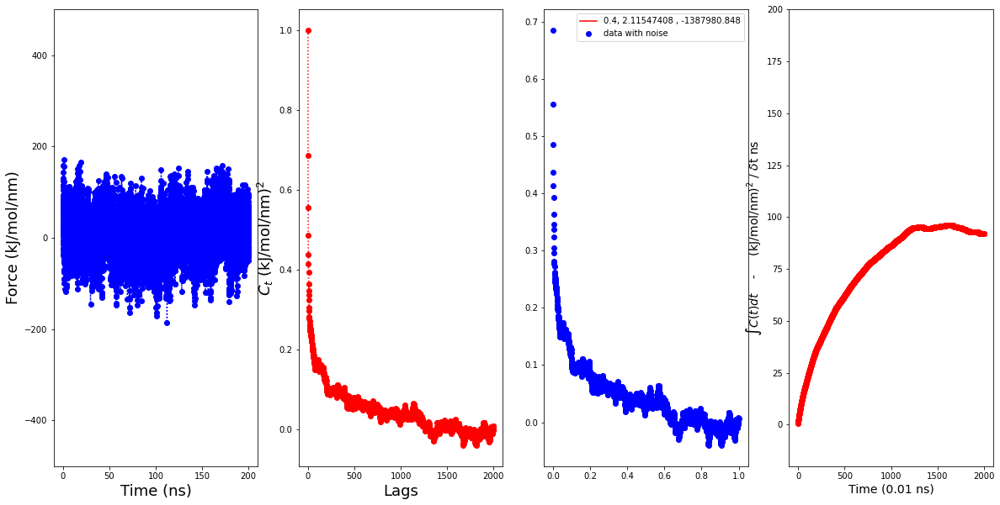

46
47
[1.         0.65877595 0.5092483  ... 0.00577393 0.00512527 0.00165326]
[1.         0.65877595 0.5092483  ... 0.00577393 0.00512527 0.00165326]
2001
0.6738729697187475 7.171620586345298 2.624225672280589
Gamma function value is
0.01463624068041564


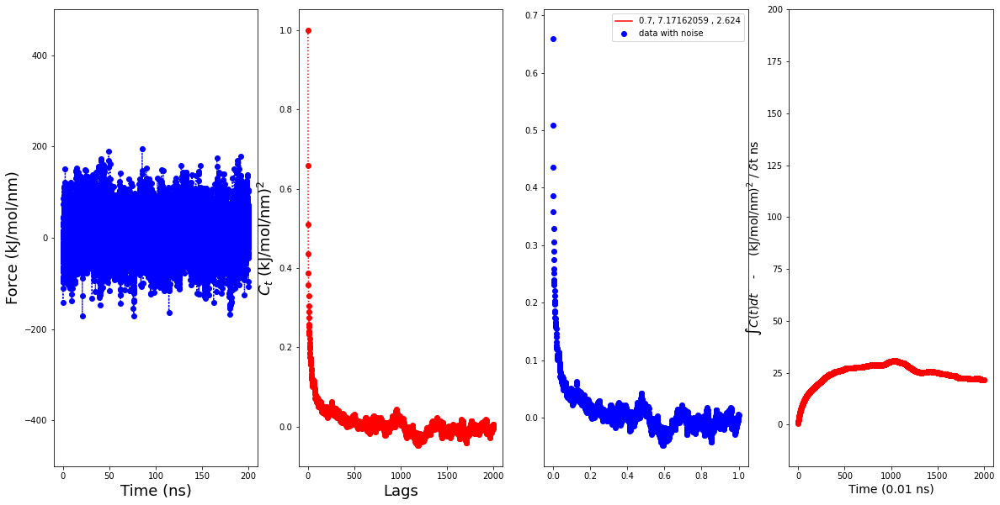

47
47
47
47
[ 1.59461577e-05  5.41966419e-06  1.78654258e-05  0.00000000e+00
  8.14309805e-06             nan -0.00000000e+00  1.10008713e-05
  9.28003192e-06  3.42280193e-05  1.72926494e-05  1.28717685e-05
             nan  1.49208005e-05 -0.00000000e+00  1.32202521e-05
             nan  1.88402739e-05  1.45792449e-05  1.59157129e-05
  1.22489364e-05  3.66282851e-06  4.56548625e-06  2.96123691e-06
  6.83531785e-06  1.12308480e-05  1.78724573e-05  1.25512073e-05
  1.05060061e-05 -0.00000000e+00 -0.00000000e+00             nan
  0.00000000e+00  0.00000000e+00  1.15679592e-04  1.42326463e-05
  3.34585918e-05  1.32877102e-05             nan  6.69072113e-06
  1.20088358e-05  9.81257916e-06             nan             nan
  2.40976581e-05             nan  1.46362407e-05]


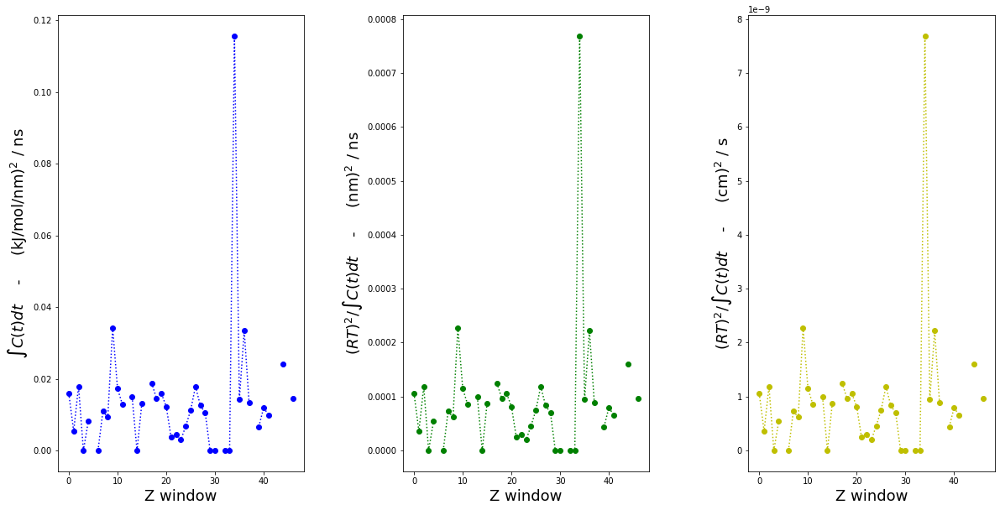

In [20]:

#Original data, 100, 1000. 
#Red, blue, black and purple at 500,000. 

#Correlation func & Integral: 1, 100, 1000.

#Auto-correlation
from statsmodels.graphics import tsaplots

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import os
import glob 
import errno
import statsmodels.api as sm
import scipy.integrate as scint
from scipy import integrate

from scipy.optimize import curve_fit
            
import math        
from numpy import array, hstack, vstack


import itertools

last = []
dz = []
bl = []
bla = range(20000)
bla2 = array([bla])
save_acf = array([bla])

bla3 = save_acf.T

bla4 = np.empty(shape=(20000,) * 1)

plt.figure(figsize=(20,6))
count=1

# create subplots

os.chdir('/Users/chrisjorg/Documents/Postdoc/Georgetown/Double_bilayer_Sandwich/Z_LPP/LPP_Benzo_5000eq_0.2/Force_prod/All_new/Convolve_100')



with open('data.txt', 'w') as file:
    path = './*pullf.xvg' 
    path2 = os.getcwd()
    files = glob.glob(path)
    colors = itertools.cycle(["r", "b", "g","y","c","m"])
    
def key_func(x):
        return os.path.split(x)[-1]

for name in sorted(glob.glob('*_pullf.xvg_dt*'), key=key_func):
        try: 
            print(count)
            
            lines = open(name,'r')
            f = np.loadtxt(name)
            #plt.subplot(1, 1, count) 

            subplot_dim = (20, 10)
            X_=f[:,0]/1000
            Y=f[:,1]
            X_scale = np.linspace(0, 1, 20000) 
            
            X_scale_ = X_scale/100
            
           
            
            
            fig, (ax0, ax1, ax2, ax3) = plt.subplots(1, 4,figsize=(20,10))
            ax0.plot(X_,Y,':ro',label=name,color=next(colors))
             
            ax0.set_ylabel('Force (kJ/mol/nm)',fontsize=18)
            ax0.set_xlabel('Time (ns)',fontsize=18)
             
            ax0.set_ylim(-500, 500)

            colors = itertools.cycle(["r", "b", "g","y","c","m"])
            
            acf_ = sm.tsa.acf(Y,  nlags=2000)
            
            acf__ = acf_.T
            print(acf__)
            print(acf_)
            blbb = np.concatenate(([X_scale, X_, Y]), axis=0) 
            np.savetxt('AutoCorr_100_' + str(count) + '.txt', acf_, delimiter=" ", fmt="%s")
 
            save_acf__ = hstack([ X_, Y])
           
            ax1.plot(acf_,':ro',label=name,color=next(colors)) 
            ax1.set_ylabel('$C_{t}$ (kJ/mol/nm)$^2$',fontsize=18)
            ax1.set_xlabel('Lags',fontsize=18)
            
            print(len(acf_))
            colors = itertools.cycle(["r", "b", "g","y","c","m"])

            X_scale = np.linspace(0, 1, 2000)
            acf__ = acf_[1:]
            acf_int = integrate.cumtrapz(acf__)
   
            np.savetxt("dz_integrat.txt", acf_int, delimiter=" ", fmt="%s")

            # define type of function to search
            def model_func(x, a, b, c):
                return a * np.exp(-(b * x ** (c ** (-1))))

            # curve fit
            X_scale = np.linspace(0, 1, 1999)
            p0 = (1.,1.e-5,1.) # starting search koefs
            opt, pcov = curve_fit(model_func, X_scale, acf__[:1999], p0, maxfev=1500)
            a, b, c= opt
            # test result
            
            x2 = np.linspace(0, 1999, 1)
            y2 = model_func(x2, a, b, c)
            ax2.plot(x2, y2, color='r', label='%.1f, %.8f , %-.3f' % (a,b,c))
            
            print(a, b, c)
            ax2.plot(X_scale, acf__[:1999], 'bo', label='data with noise')
            #ax2.set_xlim(0, 1999)
            ax2.legend(loc='best')
        
        
            from scipy.stats import gamma
          
            
        
            def int_val(a, b, c):
                return a * (b ** (-c)) * math.gamma(1 + c)
            y3 = int_val(a, b, c)
            print("Gamma function value is")
            print(y3)

 
            ax3.plot(acf_int,':ro',label=name,color=next(colors))
            ax3.set_ylabel(r'$\int C(t) dt $    -     (kJ/mol/nm)$^2$ / $\delta$t ns',fontsize=14)
            ax3.set_xlabel('Time (0.01 ns)',fontsize=14)
            ax3.set_ylim(-20, 200)
            plt.show()
             
            count+=1
             
            fig.savefig('AutoCorr_100_' + str(count) + '.png',dpi=300,bbox_inches='tight',pad_inches=0.06)
            last_element = y3
      
            #last_element_ = 100*last_element
            last.append(last_element)
            print(len(last))
        except IOError as exc: 
            if exc.errno != errno.EISDIR: 
                raise

np.savetxt("test5.txt", blbb, delimiter=" ", fmt="%s") 

# Display the autocorrelation plot of your time series

print(len(last))
fig, (ax0, ax1, ax2) = plt.subplots(1, 3,figsize=(20,10))
last_arr = np.array(last)
last_ = last_arr
np.savetxt("test6.txt", last_, delimiter=" ", fmt="%s") 

print(len(last_))
rt = 0.008314*310   #kJ/mol
rt2_ = rt*rt

dt = 0.001 

dt1 = 1/dt
invert_last = 1. / dt1*last_
print(len(invert_last))
print(invert_last)
#invert_last = np.reciprocal(last_)
fraction = rt2_*invert_last
fraction_units = fraction*0.00001

#plt.plot(last_,':ro',label=name,color=next(colors))

ax0.plot(last_,':ro',label=name,color=next(colors))
ax0.set_ylabel(r'$\int C(t) dt $    -     (kJ/mol/nm)$^2$ / ns',fontsize=18)
ax0.set_xlabel('Z window',fontsize=18)
#plt.xlim(0, 50000)

ax1.plot(fraction,':ro',label=name,color=next(colors))
ax1.set_ylabel('$(RT)^{2} / \int C(t) dt $    -     (nm)$^2$ / ns',fontsize=18)
ax1.set_xlabel('Z window',fontsize=18)
#plt.xlim(0, 100)
 
ax2.plot(fraction_units,':ro',label=name,color=next(colors))
ax2.set_ylabel('$(RT)^{2} / \int C(t) dt $    -     (cm)$^2$ / s',fontsize=18)
ax2.set_xlabel('Z window',fontsize=18)
np.savetxt("last_element_.txt", last, delimiter=" ", fmt="%s")
plt.ticklabel_format(useOffset=False)

np.savetxt("dz.txt", fraction_units, delimiter=" ", fmt="%s")
 
plt.subplots_adjust(wspace=0.4)
            
#plt.tight_layout()
plt.savefig('AutoCorr_100.png',dpi=300,bbox_inches='tight',pad_inches=0.2)


1
[1.00000000e+00 6.45503393e-01 4.90461907e-01 ... 8.81662509e-04
 1.51302667e-03 4.44815620e-03]
[1.00000000e+00 6.45503393e-01 4.90461907e-01 ... 8.81662509e-04
 1.51302667e-03 4.44815620e-03]
2001
0.7184674114458862 4.820945870176377 3.9961860919861163
Gamma function value is
0.03193013287126575


<Figure size 1440x432 with 0 Axes>

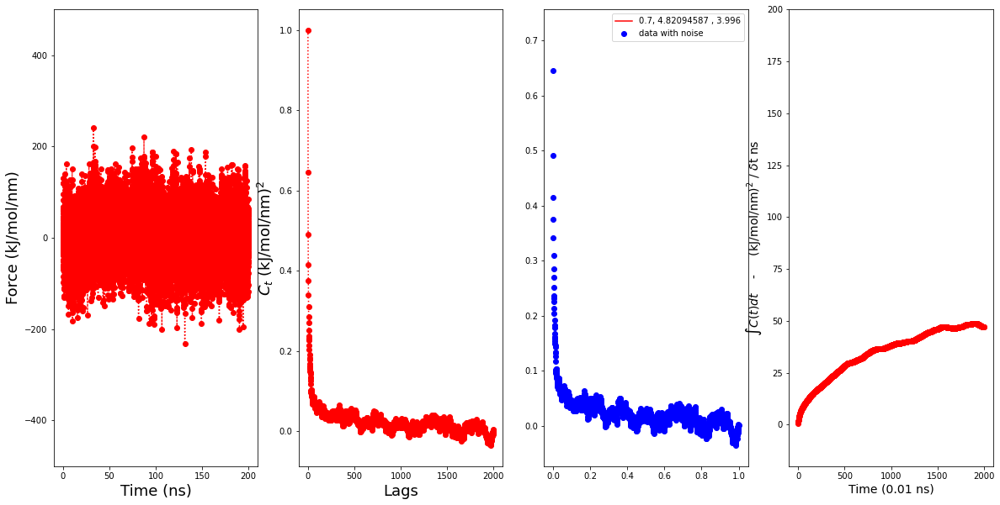

1
2
[1.         0.64405527 0.49783782 ... 0.00359323 0.01055186 0.01205575]
[1.         0.64405527 0.49783782 ... 0.00359323 0.01055186 0.01205575]
2001
0.7332675030679775 5.4934809912103955 3.3067518471901507
Gamma function value is
0.023436939594511763


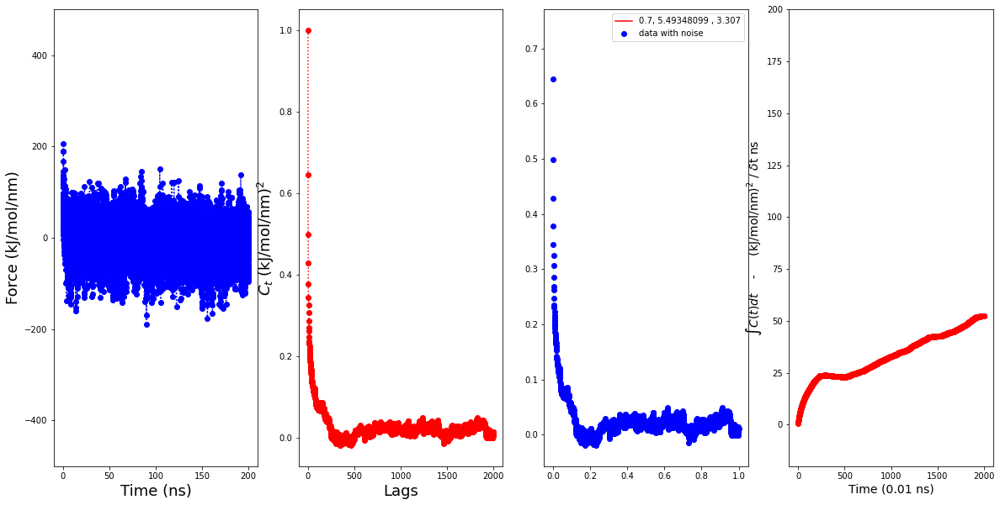

2
3
[1.         0.67699649 0.53331867 ... 0.03088719 0.02839309 0.02436332]
[1.         0.67699649 0.53331867 ... 0.03088719 0.02839309 0.02436332]
2001
0.7625633073654675 3.5163343402324156 4.676306855194874
Gamma function value is
0.1486406273450064


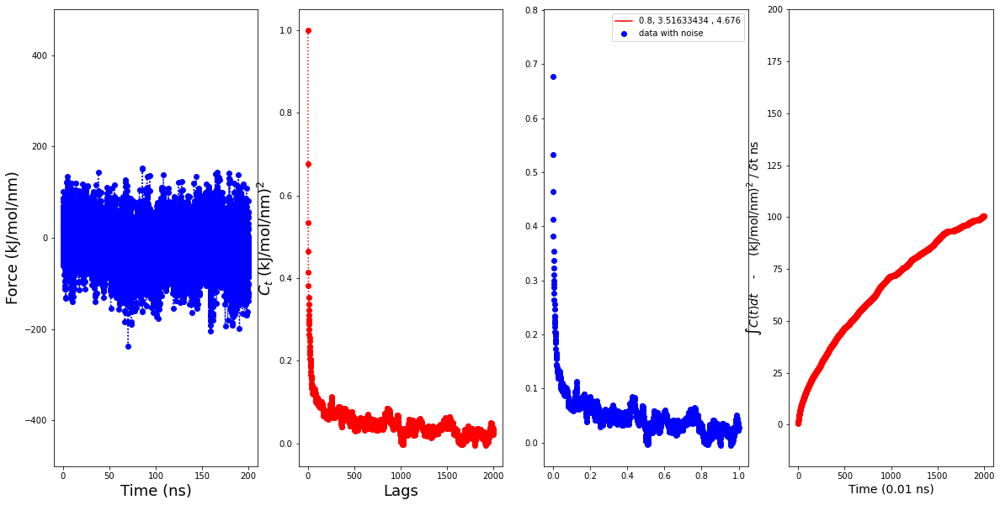

3
4
[ 1.          0.65309148  0.49863504 ...  0.01460099  0.00768946
 -0.00113436]
[ 1.          0.65309148  0.49863504 ...  0.01460099  0.00768946
 -0.00113436]
2001
0.6860426026250794 4.485061303654588 3.6056552323926696
Gamma function value is
0.041330437116724225


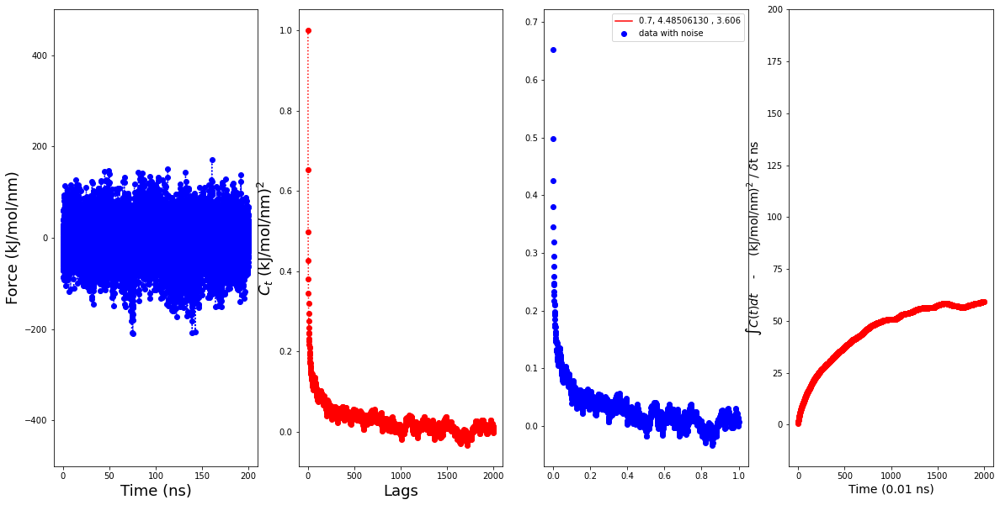

4
5
[1.         0.66179684 0.51511062 ... 0.03786461 0.0352827  0.03532131]
[1.         0.66179684 0.51511062 ... 0.03786461 0.0352827  0.03532131]
2001
0.4161980129030373 1.9628386689583635 -1358759.7173695061
Gamma function value is
nan


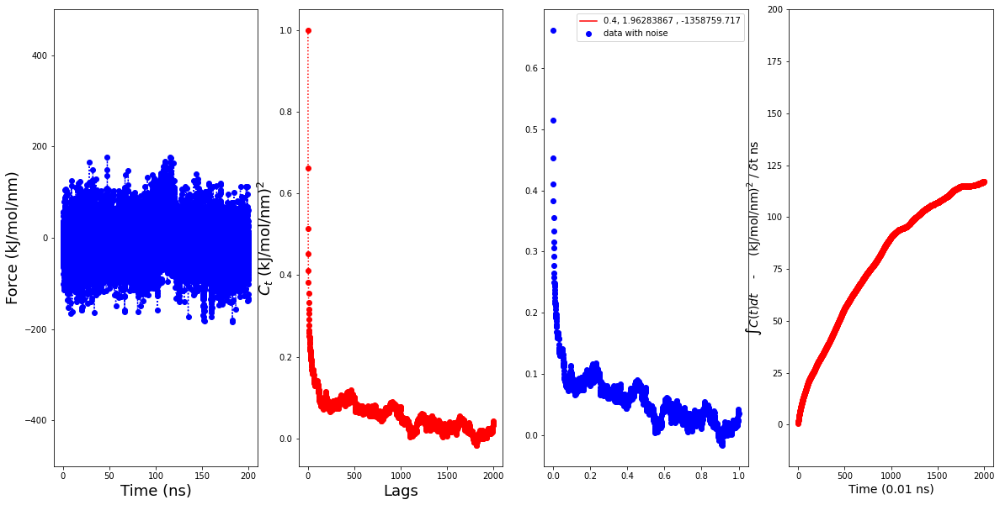

5
6
[1.         0.63915623 0.48682363 ... 0.03276126 0.02566051 0.02610157]
[1.         0.63915623 0.48682363 ... 0.03276126 0.02566051 0.02610157]
2001
0.4281654167853722 2.0866095965273703 -1380780.647862317
Gamma function value is
nan


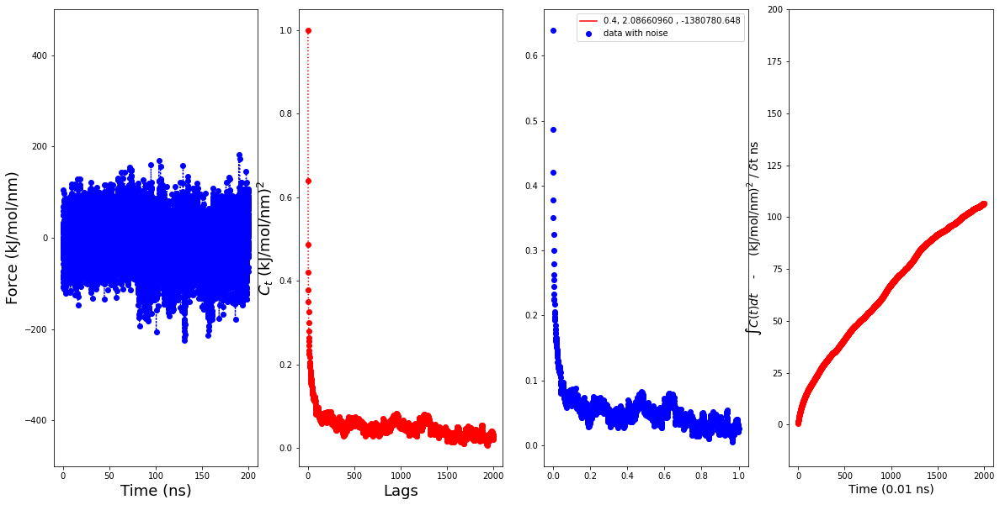

6
7
[1.         0.67769175 0.52976422 ... 0.00625064 0.00405701 0.00630611]
[1.         0.67769175 0.52976422 ... 0.00625064 0.00405701 0.00630611]
2001
0.7767072933668409 4.912461334189649 3.684771686932153
Gamma function value is
0.03325745129009328


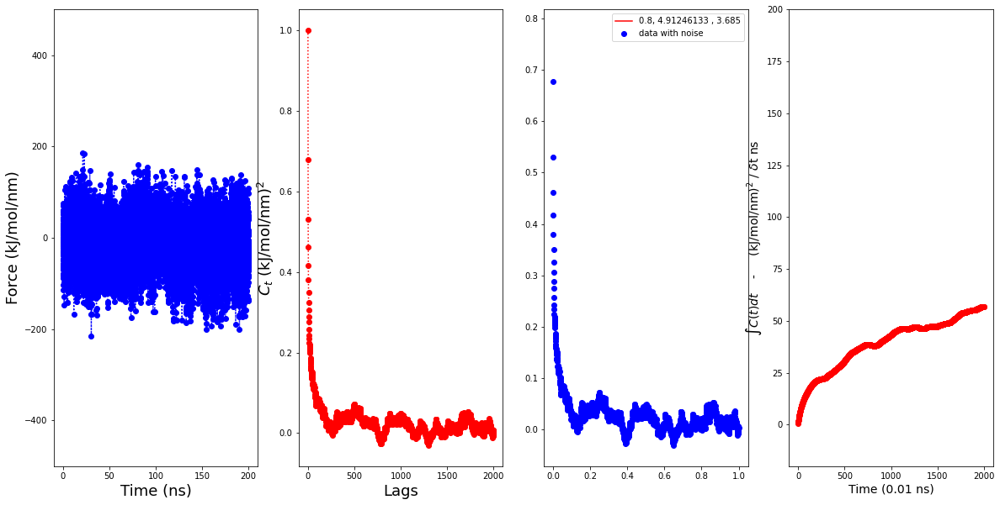

7
8
[ 1.          0.62454747  0.46931561 ... -0.01293355 -0.01462637
 -0.01567189]
[ 1.          0.62454747  0.46931561 ... -0.01293355 -0.01462637
 -0.01567189]
2001
0.015647193378467678 8.300904841977324e-06 -772733.5233960398
Gamma function value is
-0.0


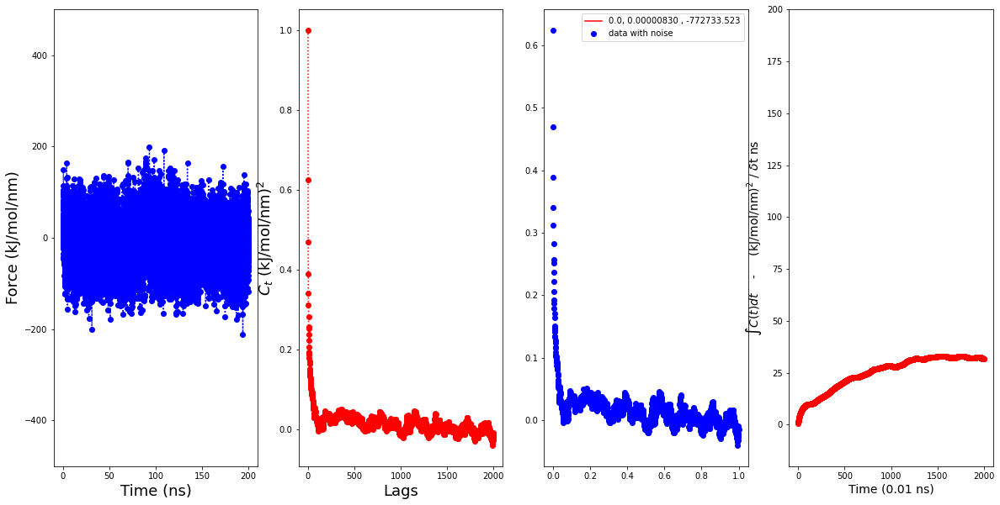

8
9
[ 1.          0.60270712  0.44689681 ... -0.02006793 -0.02357626
 -0.02391168]
[ 1.          0.60270712  0.44689681 ... -0.02006793 -0.02357626
 -0.02391168]
2001
0.5446374716148361 6.602901831839905 2.5209582475361736
Gamma function value is
0.01589420630834217


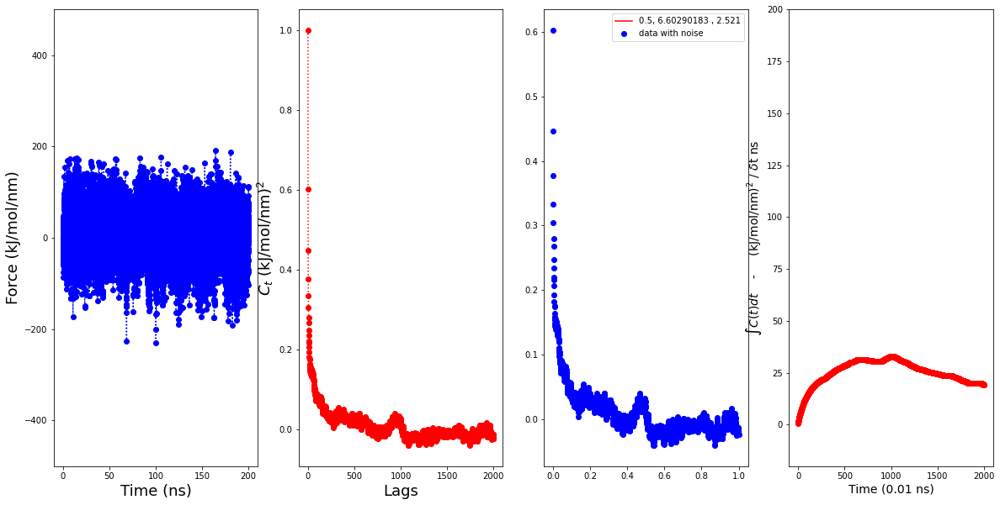

9
10
[ 1.          0.62935438  0.47471876 ... -0.03302076 -0.03241156
 -0.03459365]
[ 1.          0.62935438  0.47471876 ... -0.03302076 -0.03241156
 -0.03459365]
2001
0.5141416104369402 2.846052682574962 -1390796.2173527926
Gamma function value is
nan


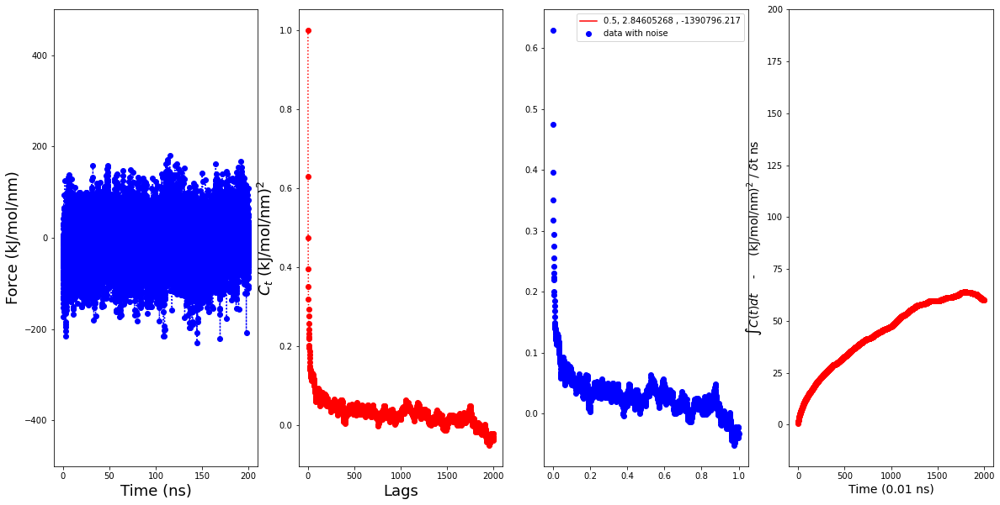

10
11
[1.         0.65283575 0.50351726 ... 0.00744216 0.00618942 0.00740713]
[1.         0.65283575 0.50351726 ... 0.00744216 0.00618942 0.00740713]
2001
0.6431536469564664 9.794568776129545 2.2438012861049503
Gamma function value is
0.009736870903643585


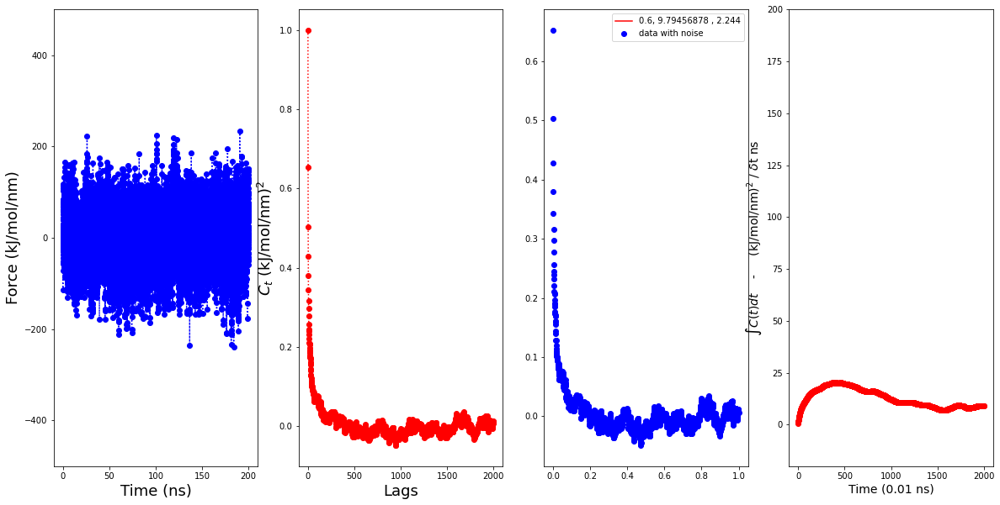

11
12
[1.         0.60998718 0.44936106 ... 0.02963805 0.02274788 0.02511046]
[1.         0.60998718 0.44936106 ... 0.02963805 0.02274788 0.02511046]
2001
0.39782275829255975 2.484452986550156 -1435380.3055961237
Gamma function value is
nan


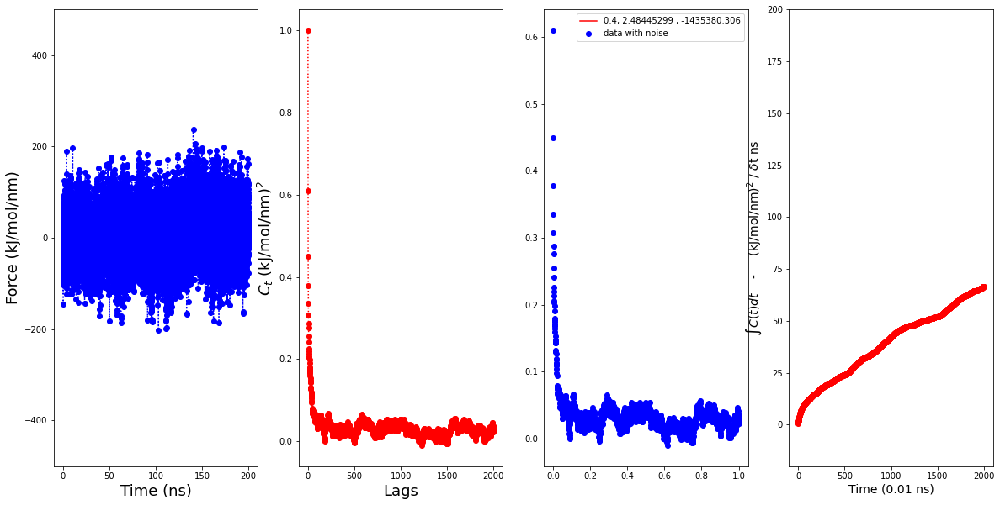

12
13
[ 1.00000000e+00  5.98890497e-01  4.29698774e-01 ... -2.25173314e-04
 -2.27998002e-03 -3.21209522e-03]
[ 1.00000000e+00  5.98890497e-01  4.29698774e-01 ... -2.25173314e-04
 -2.27998002e-03 -3.21209522e-03]
2001
0.6376582774120664 4.904551885604815 4.0804917927733175
Gamma function value is
0.02628896265914331


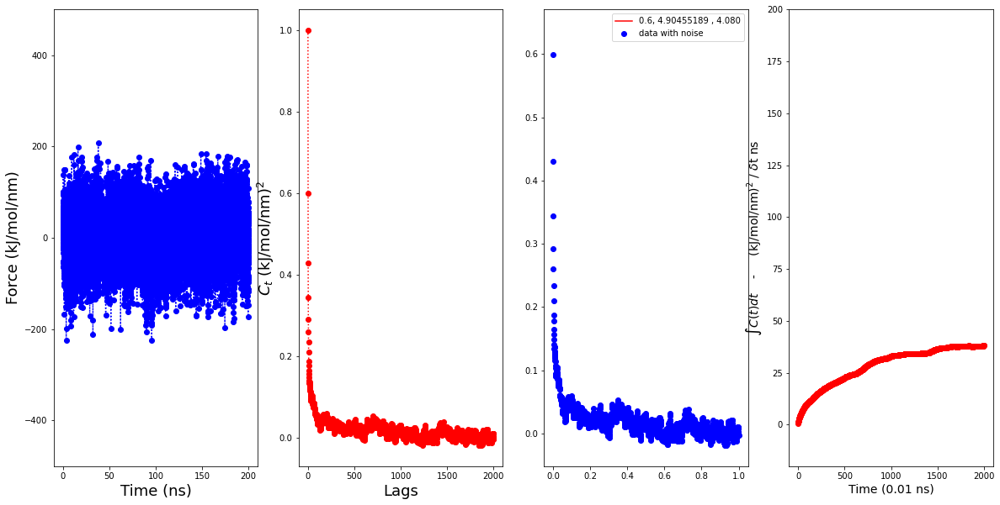

13
14
[ 1.          0.6208841   0.44520353 ... -0.00396492 -0.00660116
 -0.00704143]
[ 1.          0.6208841   0.44520353 ... -0.00396492 -0.00660116
 -0.00704143]
2001
0.6483964584863552 8.508898749795064 2.7013201608467
Gamma function value is
0.008333514847456201


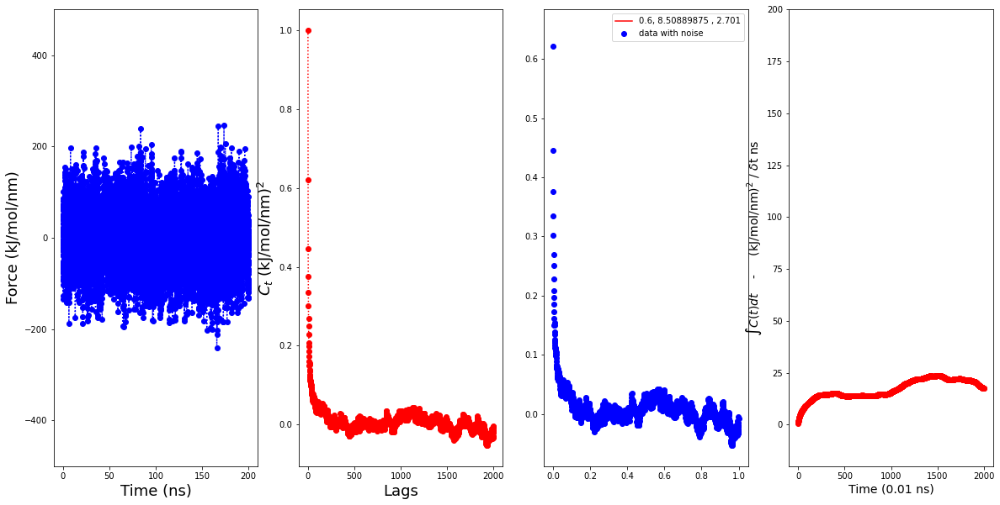

14
15
[1.         0.60854394 0.43604467 ... 0.01983526 0.02004619 0.01762242]
[1.         0.60854394 0.43604467 ... 0.01983526 0.02004619 0.01762242]
2001
0.6072126361015976 11.703358814280886 2.245996725021471
Gamma function value is
0.006145618506797307


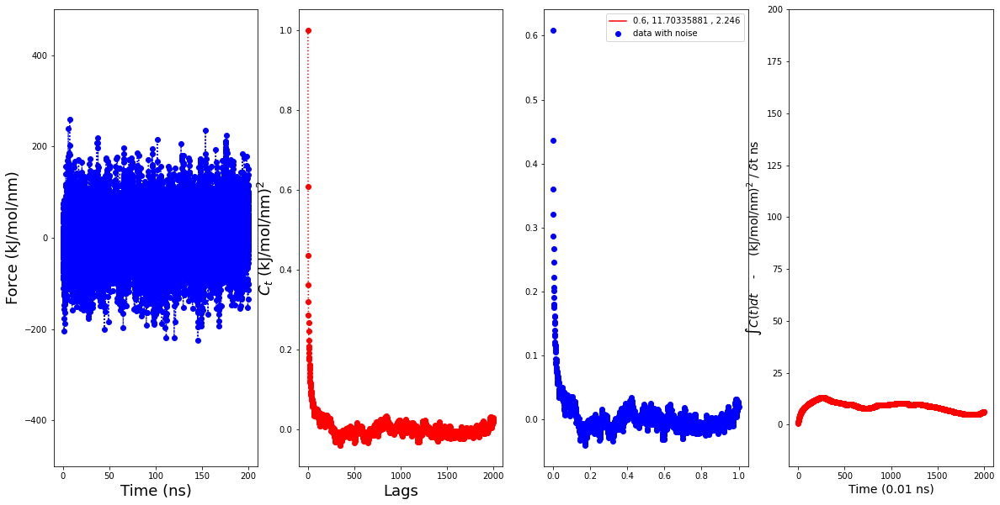

15
16
[1.         0.65474451 0.49465188 ... 0.01349415 0.01577787 0.01057296]
[1.         0.65474451 0.49465188 ... 0.01349415 0.01577787 0.01057296]
2001
0.5968194679364199 5.94208944319808 2.6717095300595077
Gamma function value is
0.020607255093952257


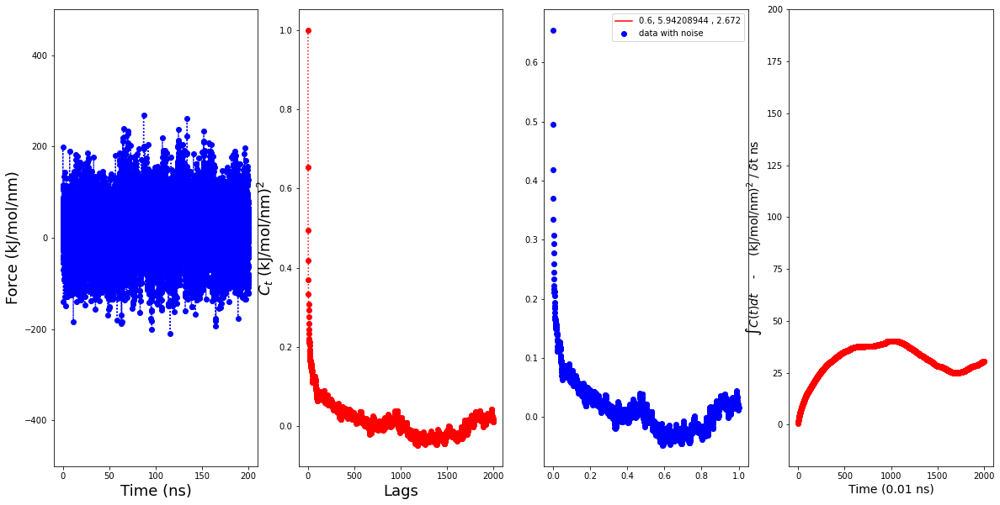

16
17
[ 1.          0.67643257  0.52656343 ... -0.02050922 -0.0157395
 -0.01758668]
[ 1.          0.67643257  0.52656343 ... -0.02050922 -0.0157395
 -0.01758668]
2001
0.3972173684381463 2.5817165638696626 -1326132.1725305074
Gamma function value is
nan


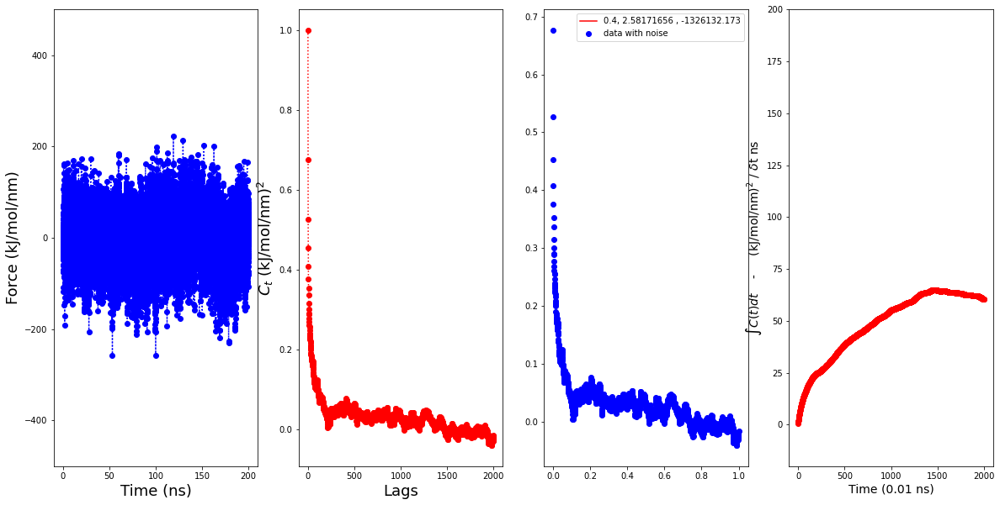

17
18
[1.         0.67296579 0.52238541 ... 0.04533673 0.04486936 0.04595708]
[1.         0.67296579 0.52238541 ... 0.04533673 0.04486936 0.04595708]
2001
0.34756681970802183 1.977631952635174 -1357555.5828072631
Gamma function value is
nan


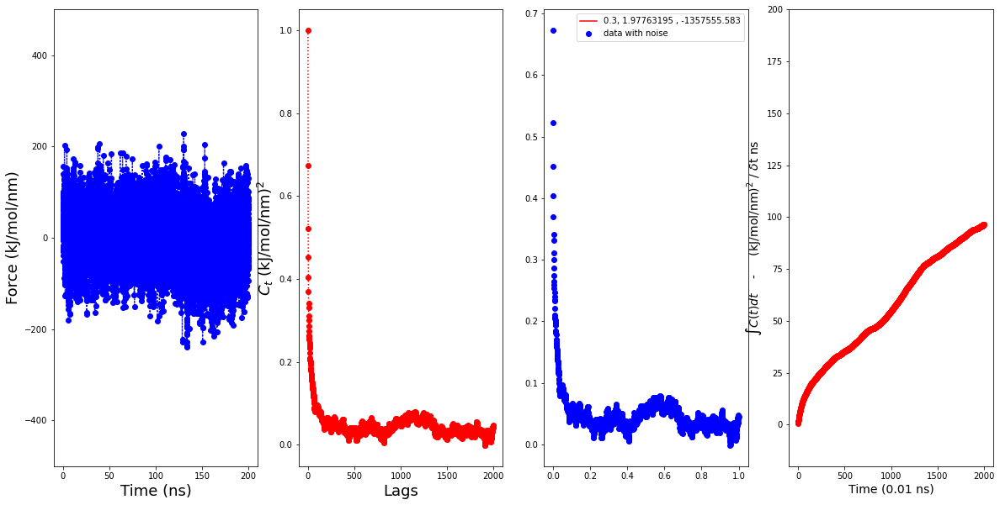

18
19
[1.         0.61849369 0.46354022 ... 0.01594921 0.01374051 0.01215448]
[1.         0.61849369 0.46354022 ... 0.01594921 0.01374051 0.01215448]
2001
0.6858782817822581 4.693462898427985 4.1040503314934
Gamma function value is
0.03382136919619347


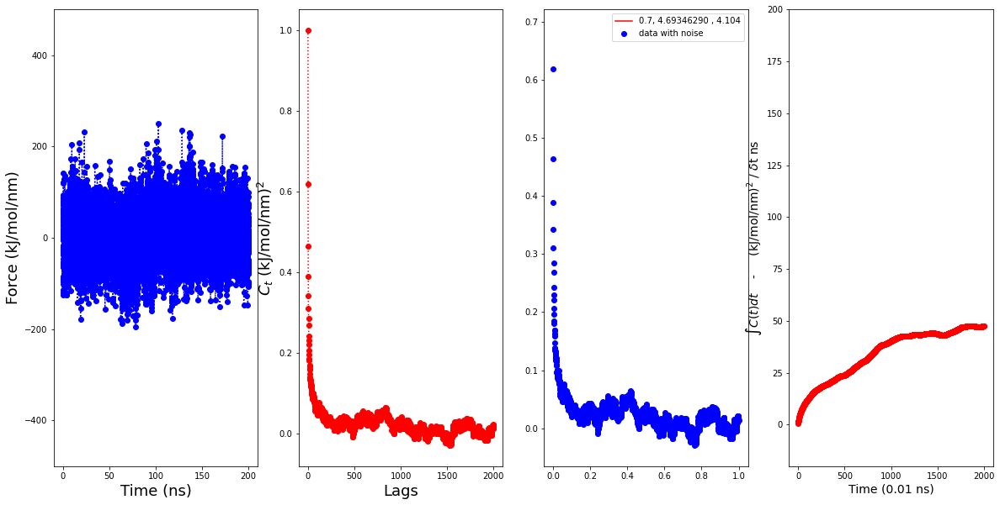

19
20
[1.         0.69066757 0.54373479 ... 0.01934989 0.02156598 0.01821791]
[1.         0.69066757 0.54373479 ... 0.01934989 0.02156598 0.01821791]
2001
0.7722414838516671 4.495469500739984 3.7159307979839413
Gamma function value is
0.045756198706416944


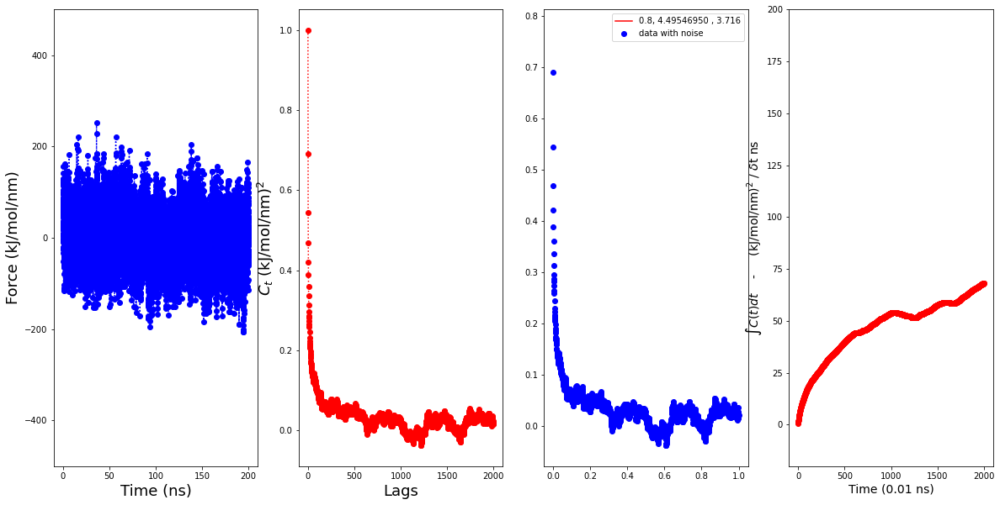

20
21
[1.         0.66476222 0.51933531 ... 0.01123018 0.00642636 0.00467457]
[1.         0.66476222 0.51933531 ... 0.01123018 0.00642636 0.00467457]
2001
0.7083269085370782 4.33252408635863 3.705786003662761
Gamma function value is
0.04815343641582646


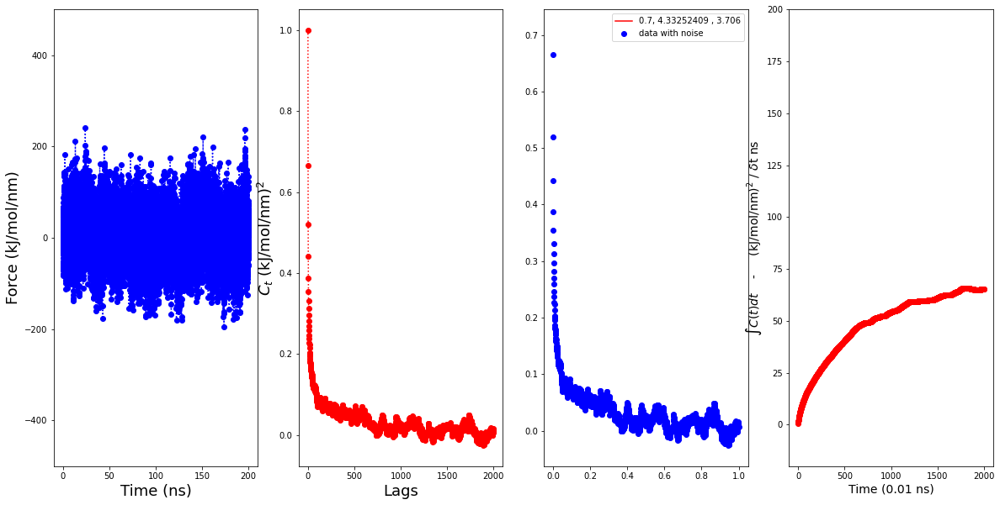

21
22
[1.         0.68248104 0.53447672 ... 0.0381231  0.03445019 0.02968588]
[1.         0.68248104 0.53447672 ... 0.0381231  0.03445019 0.02968588]
2001
0.3497777134327681 1.9340484371646731 -1321814.0023353295
Gamma function value is
nan


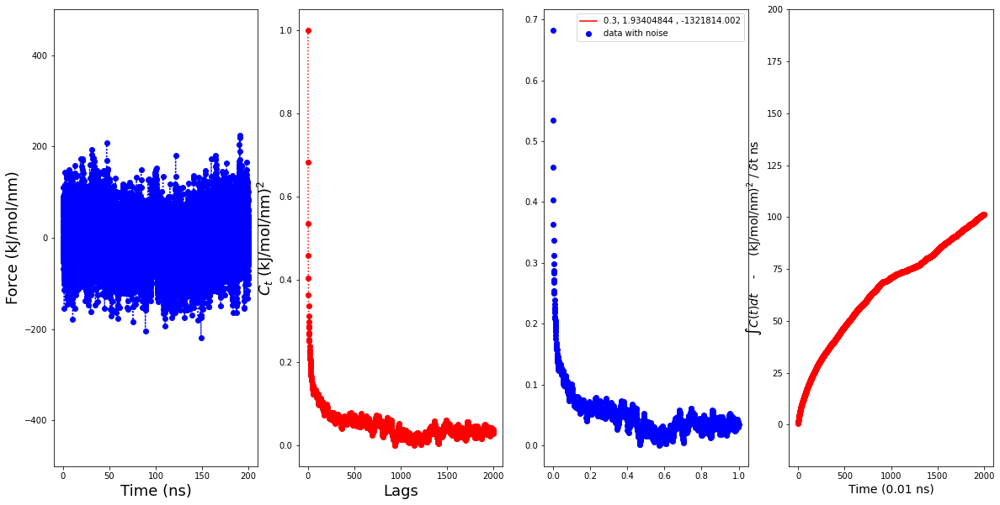

22
23
[ 1.          0.59321397  0.4410271  ... -0.02139313 -0.01923627
 -0.01818672]
[ 1.          0.59321397  0.4410271  ... -0.02139313 -0.01923627
 -0.01818672]
2001
0.040360232341709025 0.010195816646694974 -991645.6838728113
Gamma function value is
-0.0


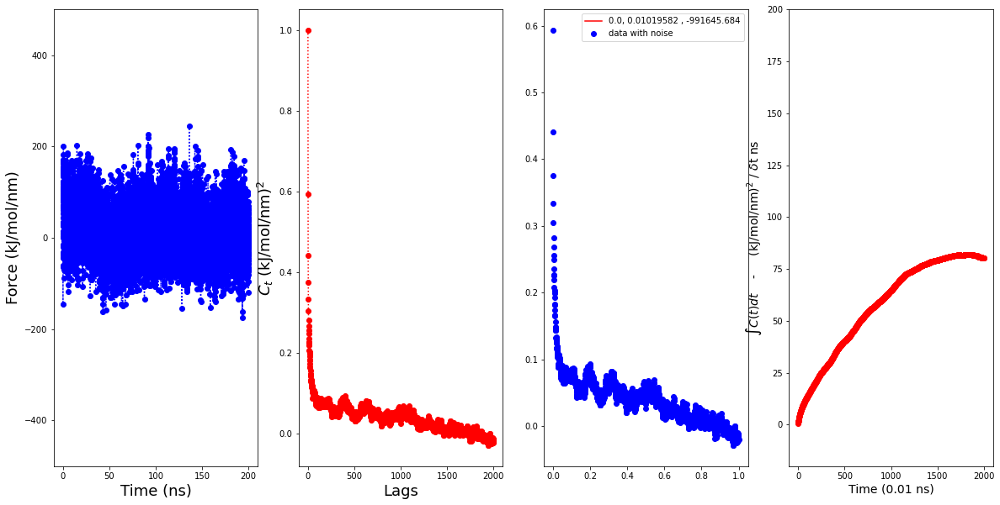

23
24
[1.         0.65345051 0.5015613  ... 0.01415766 0.01143144 0.01136646]
[1.         0.65345051 0.5015613  ... 0.01415766 0.01143144 0.01136646]
2001
0.6936404154731094 8.131085212670722 2.68540702119204
Gamma function value is
0.010229077356536876


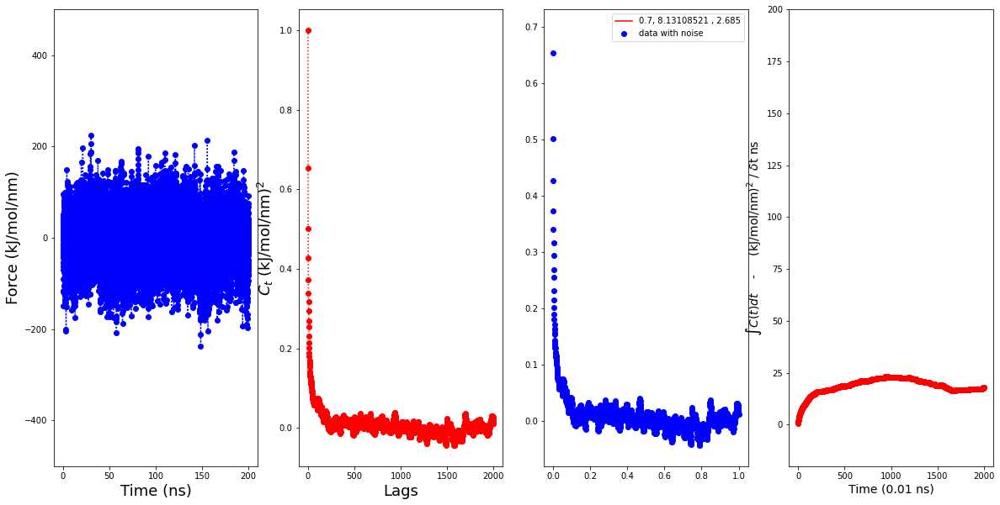

24
25
[ 1.          0.679402    0.52536341 ... -0.01496609 -0.01817411
 -0.02005477]
[ 1.          0.679402    0.52536341 ... -0.01496609 -0.01817411
 -0.02005477]
2001
0.4877734037271785 2.630808440246571 -1340333.87297584
Gamma function value is
nan


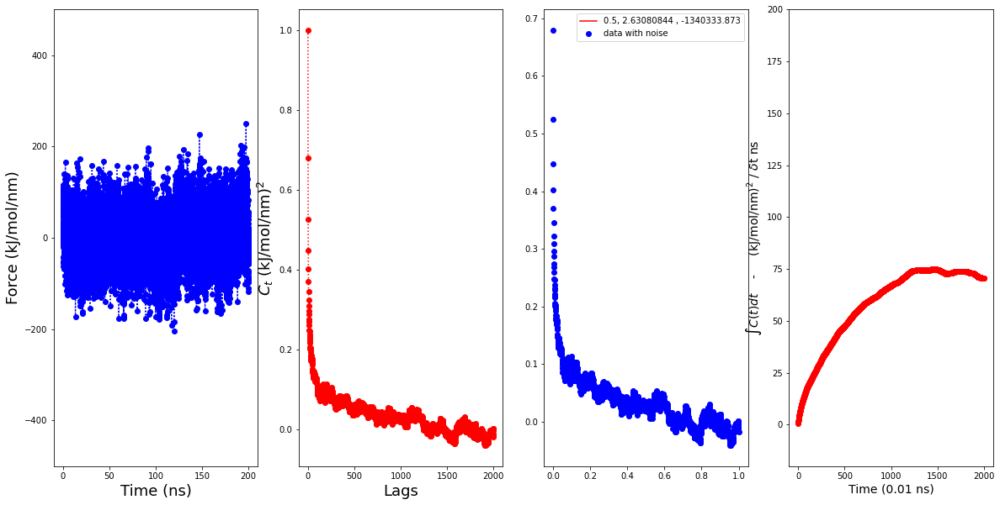

25
26
[ 1.          0.66347143  0.50379176 ... -0.01139132 -0.01538823
 -0.01646342]
[ 1.          0.66347143  0.50379176 ... -0.01139132 -0.01538823
 -0.01646342]
2001
0.6734269396546391 11.08447821484699 2.2511580674980074
Gamma function value is
0.007645335011505745


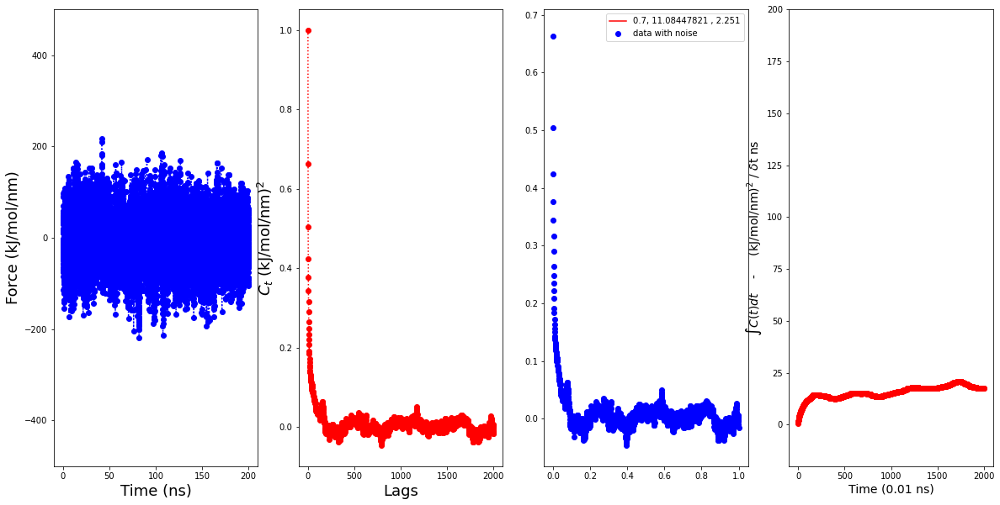

26
27
[ 1.          0.64218885  0.46851474 ...  0.00395084 -0.00199478
 -0.00623469]
[ 1.          0.64218885  0.46851474 ...  0.00395084 -0.00199478
 -0.00623469]
2001
0.6669297840937216 9.78724585921334 2.5400407594616827
Gamma function value is
0.0070572598915685


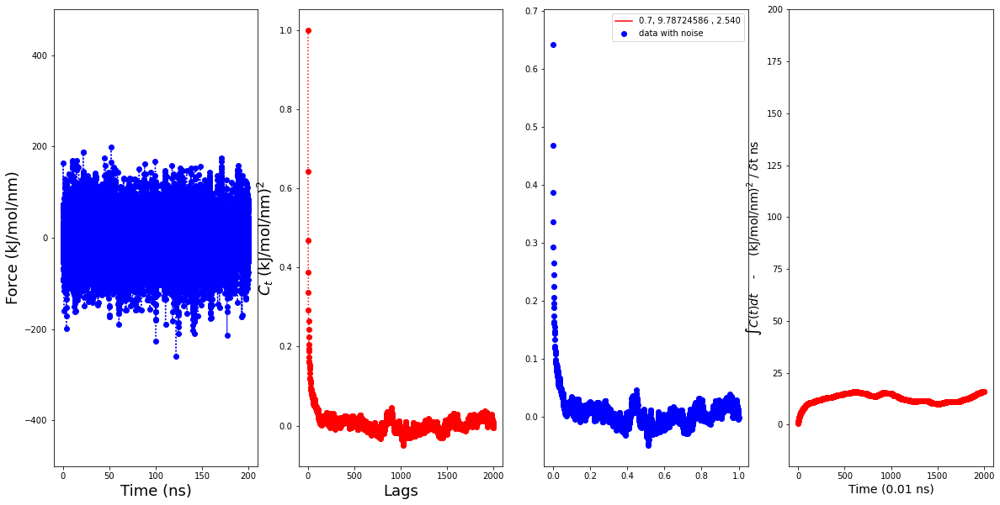

27
28
[ 1.          0.64413251  0.48509784 ...  0.00340001  0.00276943
 -0.00510384]
[ 1.          0.64413251  0.48509784 ...  0.00340001  0.00276943
 -0.00510384]
2001
0.7146362931886387 4.4964180729268906 4.361260513767084
Gamma function value is
0.04259774810408708


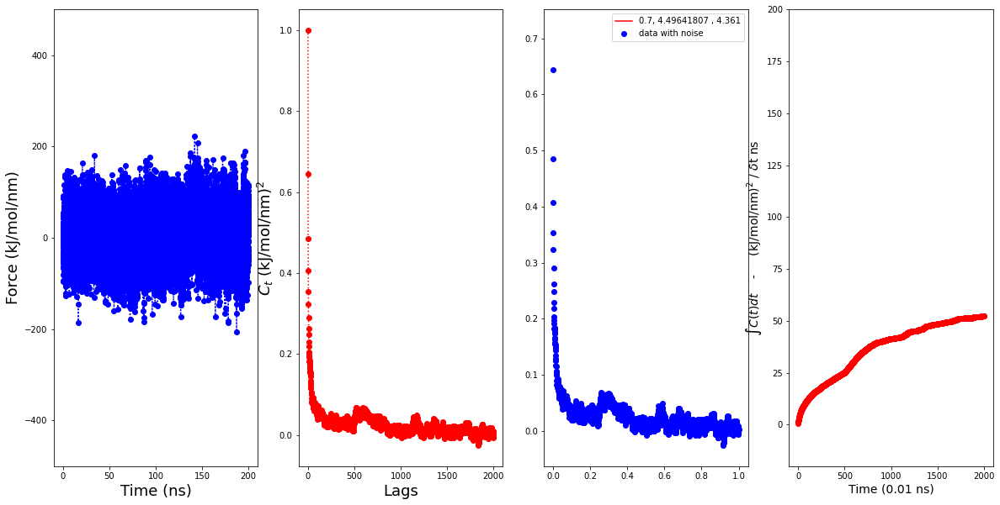

28
29
[ 1.          0.67134481  0.516823   ... -0.02954357 -0.02739468
 -0.02746171]
[ 1.          0.67134481  0.516823   ... -0.02954357 -0.02739468
 -0.02746171]
2001
0.680544611091872 12.061126909131492 2.159287213025098
Gamma function value is
0.00732533831318333


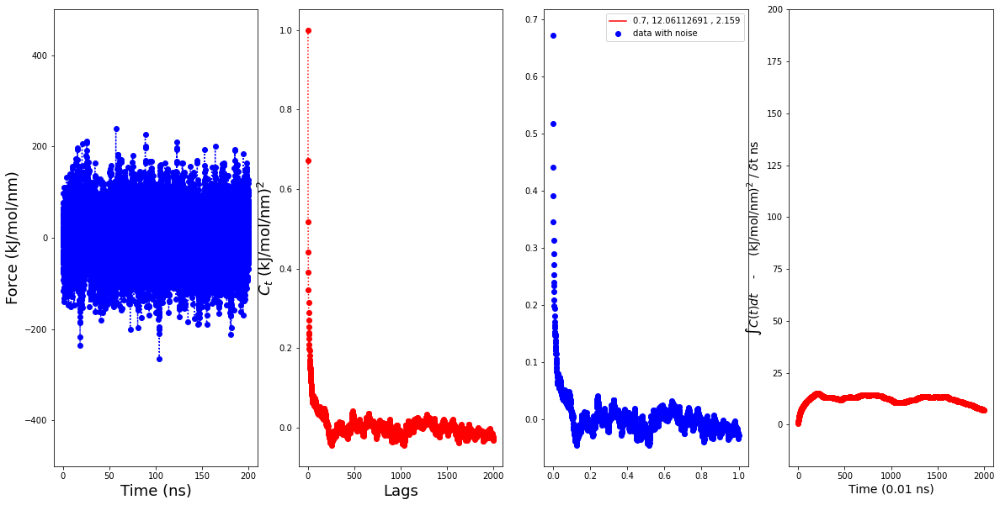

29
30
[1.00000000e+00 6.29573261e-01 4.70267377e-01 ... 2.32179881e-04
 6.72558417e-03 8.90101873e-03]
[1.00000000e+00 6.29573261e-01 4.70267377e-01 ... 2.32179881e-04
 6.72558417e-03 8.90101873e-03]
2001
0.6315786840727978 8.931607252086506 2.492456989401583
Gamma function value is
0.00887652065425553


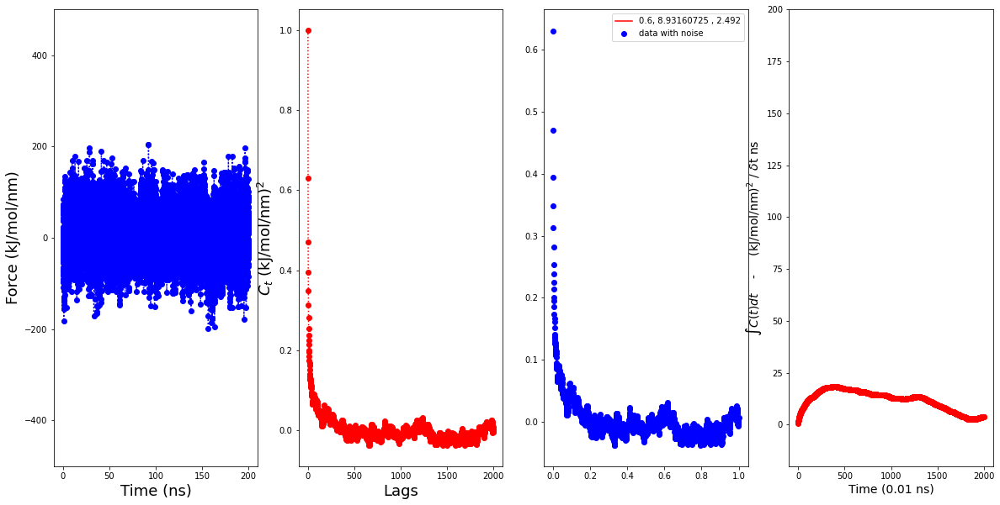

30
31
[1.         0.65393778 0.49401062 ... 0.01519466 0.01857033 0.02478536]
[1.         0.65393778 0.49401062 ... 0.01519466 0.01857033 0.02478536]
2001
0.4532950873403296 2.4108146908427925 -1453181.1062001146
Gamma function value is
nan


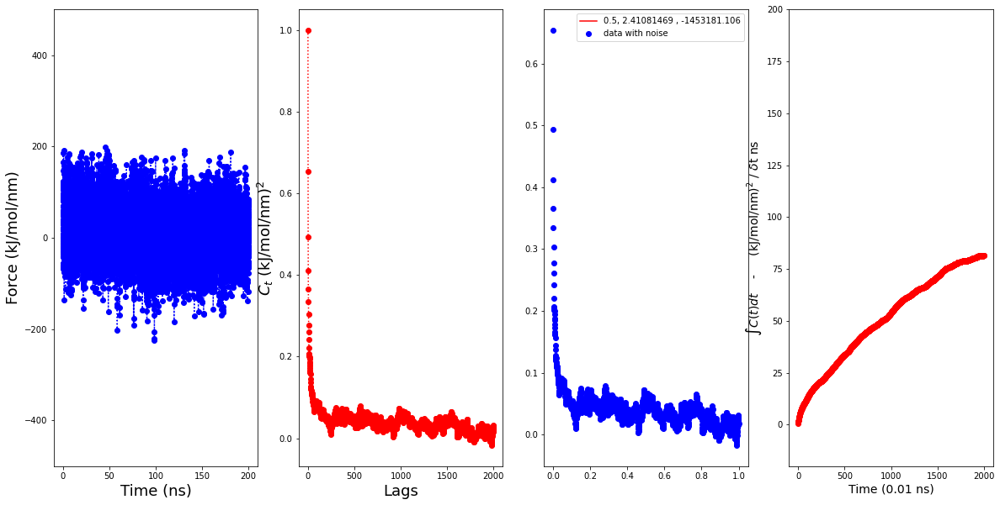

31
32
[1.         0.68576848 0.54342279 ... 0.02807563 0.02269252 0.0258364 ]
[1.         0.68576848 0.54342279 ... 0.02807563 0.02269252 0.0258364 ]
2001
0.7101244513324468 4.716854536900752 3.169738739857346
Gamma function value is
0.038772880301031376


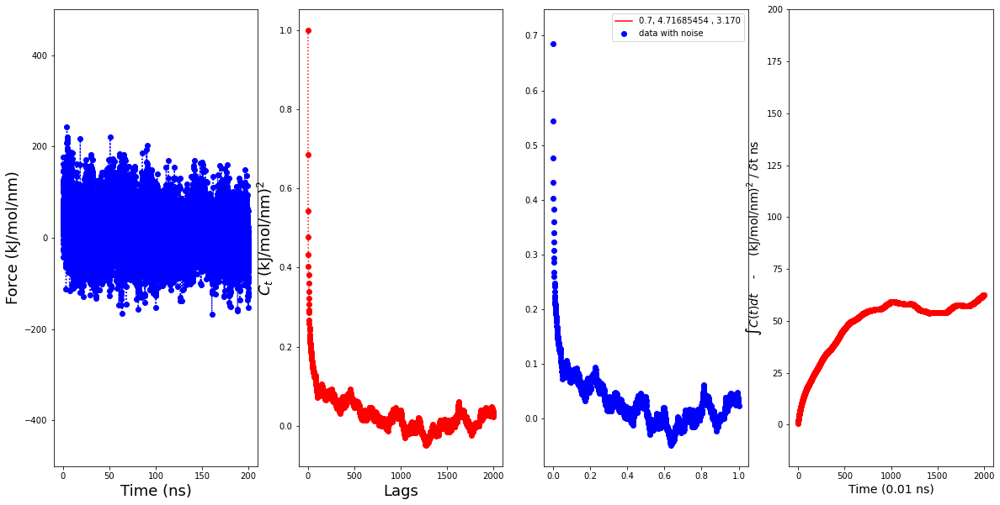

32
33
[1.         0.66315898 0.5023657  ... 0.00150013 0.00144337 0.00276664]
[1.         0.66315898 0.5023657  ... 0.00150013 0.00144337 0.00276664]
2001
0.7039759431803275 6.774681264568573 2.9391239659111696
Gamma function value is
0.014146337215029803


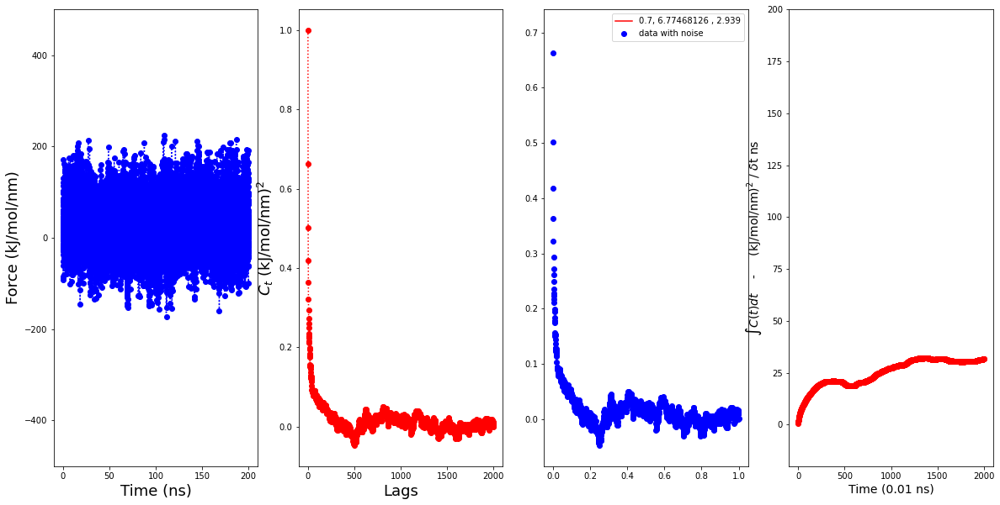

33
34
[1.         0.59003871 0.45087127 ... 0.03068292 0.02922987 0.02837405]
[1.         0.59003871 0.45087127 ... 0.03068292 0.02922987 0.02837405]
2001
0.22040152072063496 1.6911618820560417 -1400441.3137643104
Gamma function value is
nan


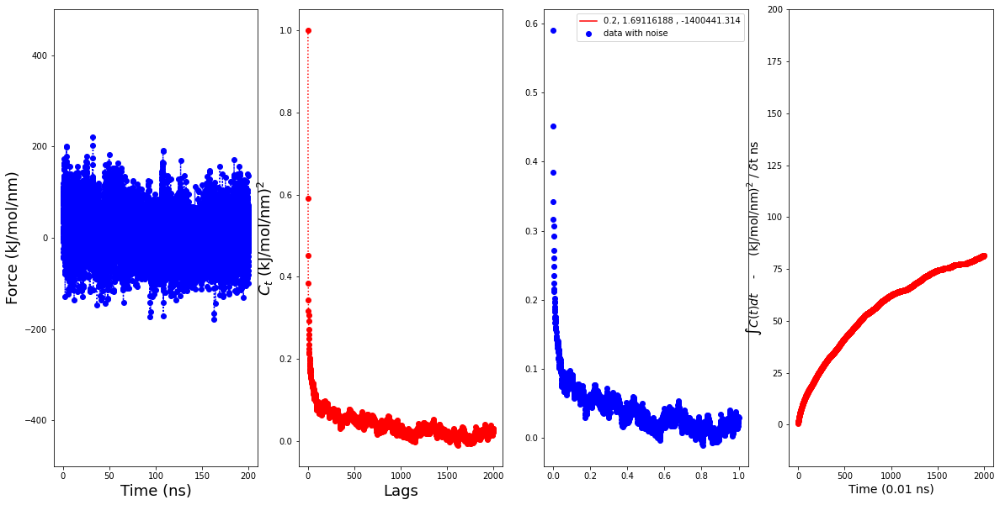

34
35
[1.         0.65860231 0.50958468 ... 0.06830247 0.07015811 0.06123239]
[1.         0.65860231 0.50958468 ... 0.06830247 0.07015811 0.06123239]
2001
0.07388795779414059 0.0027105648607057336 -1028813.3996993966
Gamma function value is
-0.0


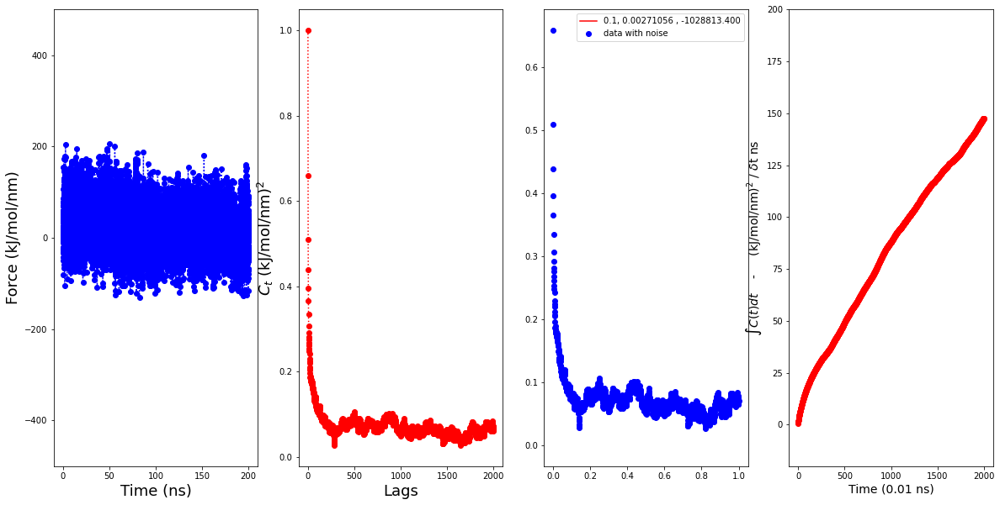

35
36
[ 1.          0.68040381  0.53018356 ... -0.01371614 -0.01885229
 -0.02436739]
[ 1.          0.68040381  0.53018356 ... -0.01371614 -0.01885229
 -0.02436739]
2001
0.7172300201225899 4.871090954598505 3.2484474004682835
Gamma function value is
0.03462140518041163


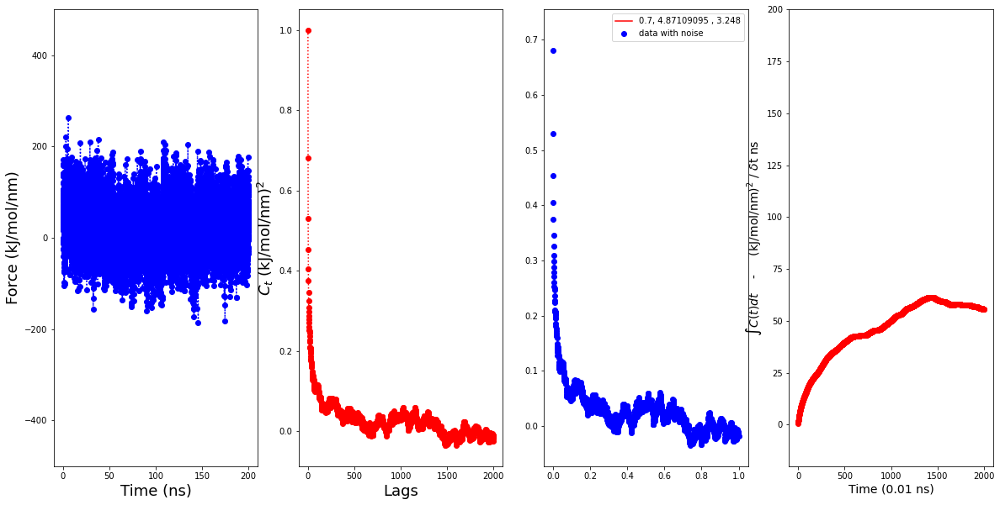

36
37
[ 1.          0.68408011  0.54096485 ... -0.01091921 -0.01384916
 -0.01622345]
[ 1.          0.68408011  0.54096485 ... -0.01091921 -0.01384916
 -0.01622345]
2001
0.09428734274880228 0.12817642713286687 -1434472.9269528294
Gamma function value is
0.0


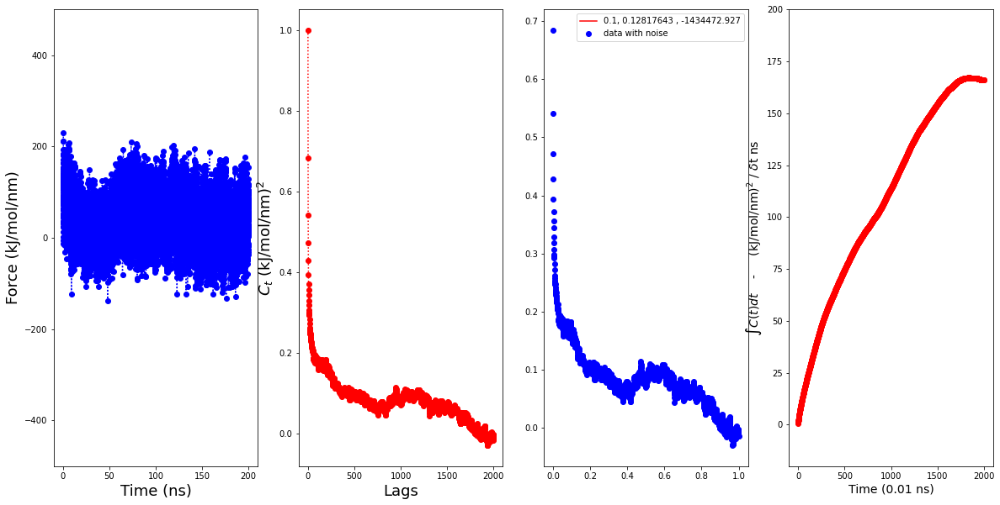

37
38
[1.         0.6821058  0.54216611 ... 0.01997272 0.01376327 0.01681302]
[1.         0.6821058  0.54216611 ... 0.01997272 0.01376327 0.01681302]
2001
0.23355221389591696 1.5640028443695162 -1354645.2788509084
Gamma function value is
nan


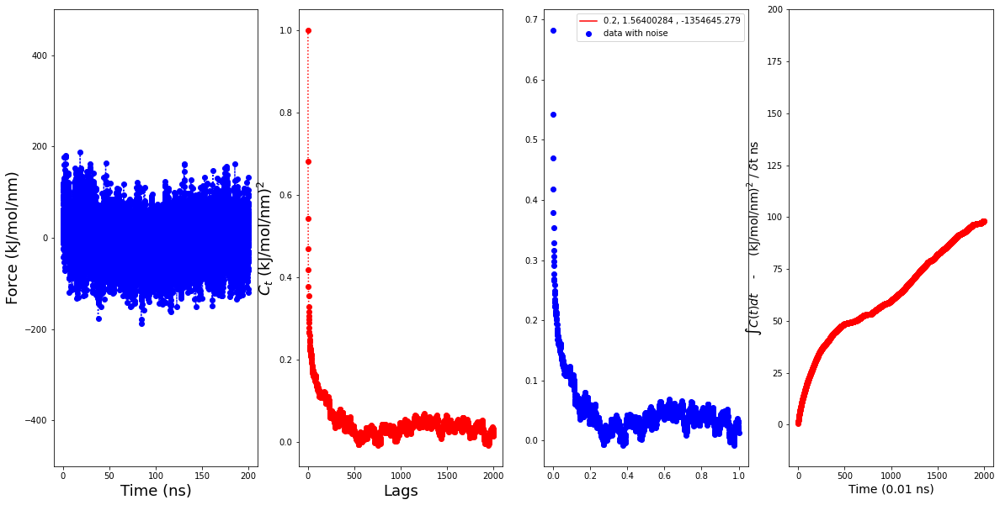

38
39
[ 1.          0.69441747  0.55217477 ... -0.02567501 -0.02770993
 -0.0264651 ]
[ 1.          0.69441747  0.55217477 ... -0.02567501 -0.02770993
 -0.0264651 ]
2001
0.056177393079817964 0.5353502240875615 -1421525.3307330874
Gamma function value is
-0.0


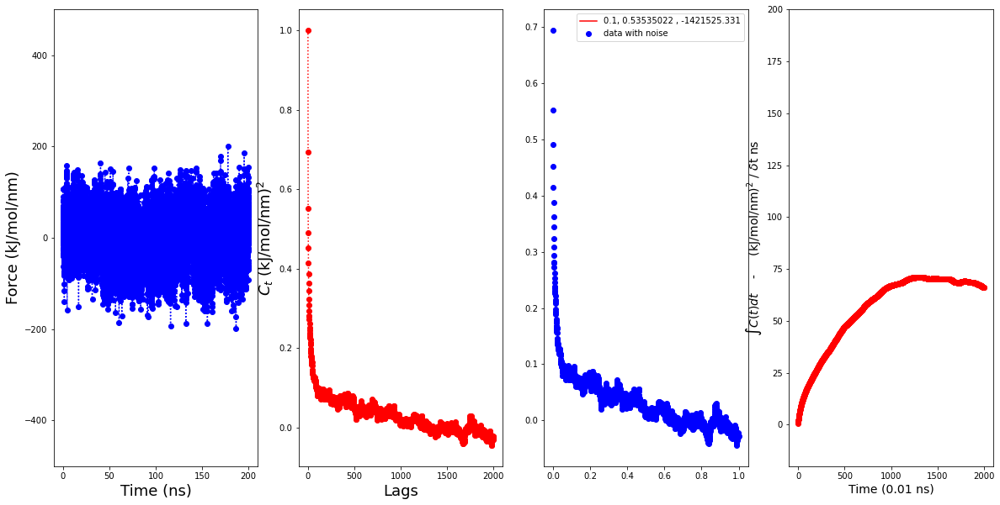

39
40
[ 1.          0.69096414  0.55914103 ... -0.00278877 -0.00946916
 -0.00676782]
[ 1.          0.69096414  0.55914103 ... -0.00278877 -0.00946916
 -0.00676782]
2001
0.136982457616928 0.7348468214219608 -1462331.2035685508
Gamma function value is
-0.0


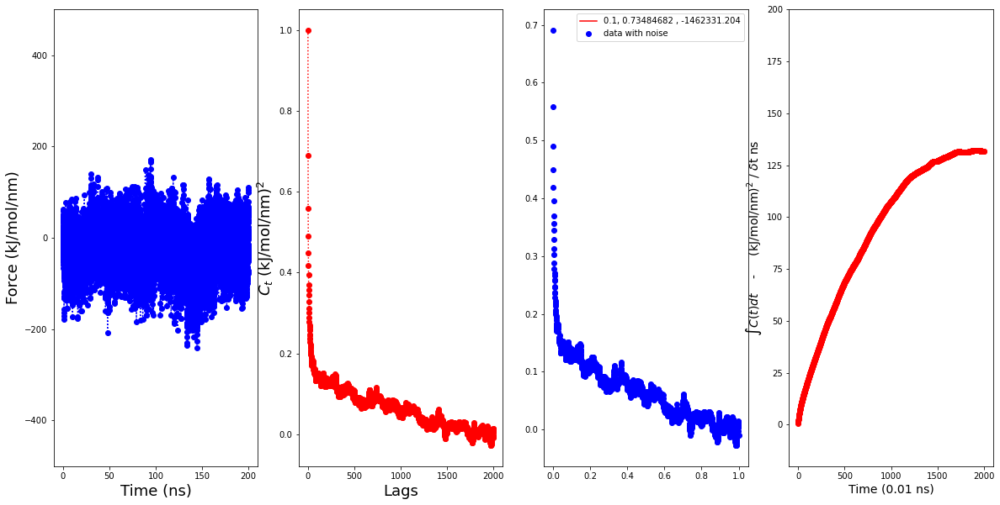

40
41
[ 1.          0.67004782  0.52590434 ... -0.01418327 -0.01489431
 -0.01872661]
[ 1.          0.67004782  0.52590434 ... -0.01418327 -0.01489431
 -0.01872661]
2001
0.5990308650607827 5.249486951821183 2.6779971502669992
Gamma function value is
0.028711898478898042


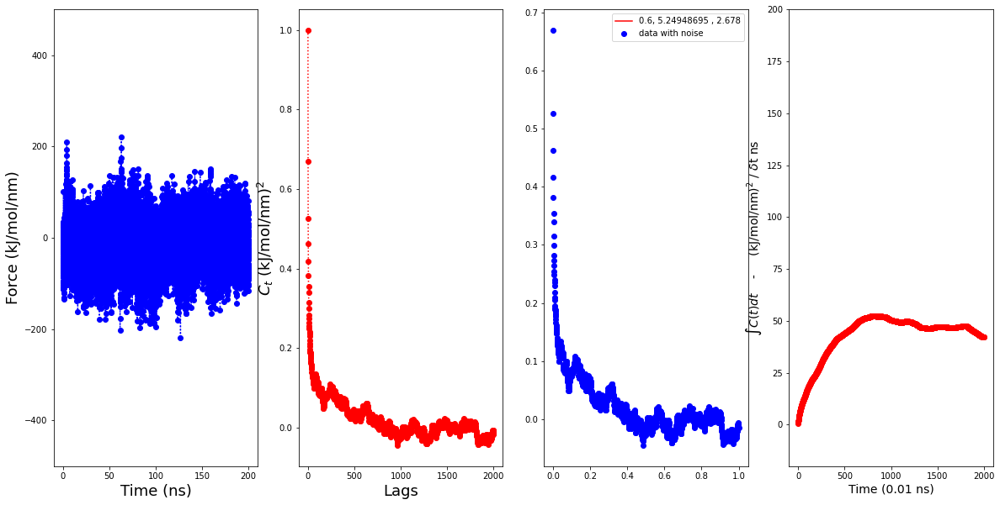

41
42
[1.         0.64441146 0.49330448 ... 0.02974287 0.02366474 0.02335656]
[1.         0.64441146 0.49330448 ... 0.02974287 0.02366474 0.02335656]
2001
0.6875489434791933 4.520676338309631 3.7415026935006748
Gamma function value is
0.03983464737388012


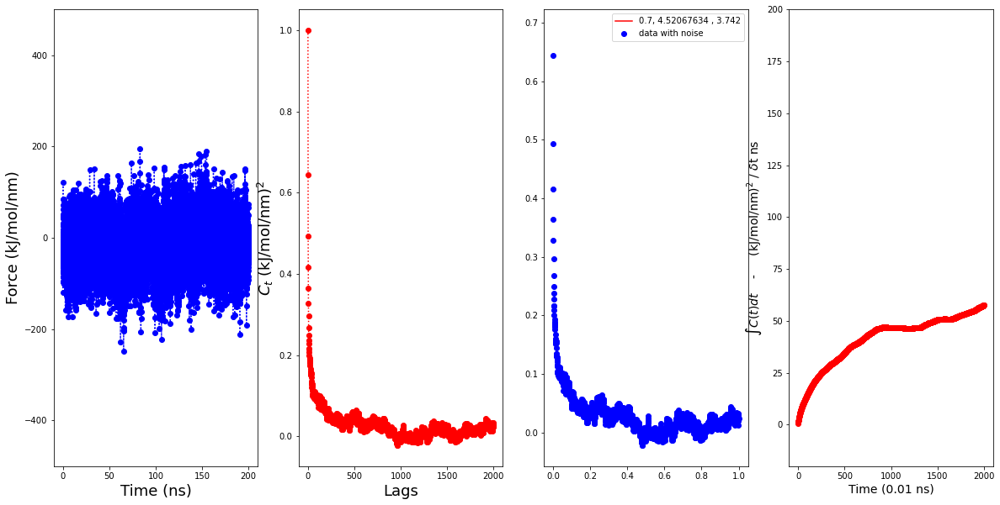

42
43
[1.         0.67001687 0.50946793 ... 0.01300957 0.01392327 0.01755636]
[1.         0.67001687 0.50946793 ... 0.01300957 0.01392327 0.01755636]
2001
0.16192293935330232 1.5834514114866174 -1446238.5415780726
Gamma function value is
nan


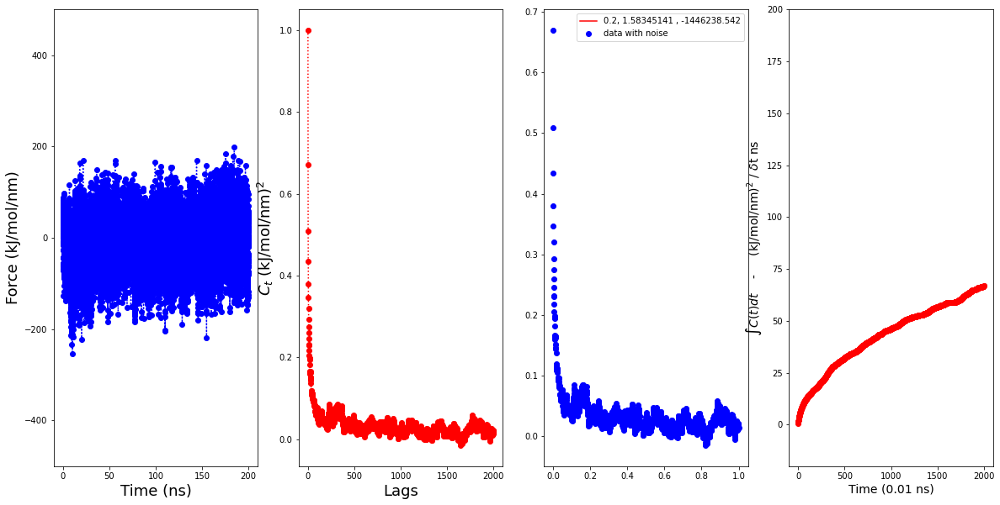

43
44
[1.         0.64959935 0.49566096 ... 0.03947368 0.0376496  0.03436598]
[1.         0.64959935 0.49566096 ... 0.03947368 0.0376496  0.03436598]
2001
0.09418063478732104 0.43349707521076386 -1436963.5476691003
Gamma function value is
-0.0


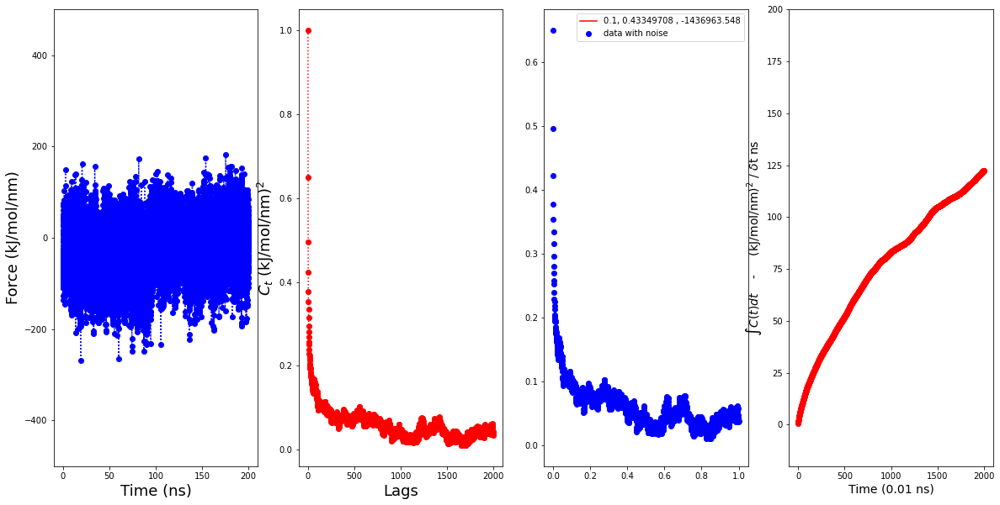

44
45
[ 1.          0.57469597  0.42941063 ... -0.00351789 -0.00996962
 -0.00735017]
[ 1.          0.57469597  0.42941063 ... -0.00351789 -0.00996962
 -0.00735017]
2001
0.5725326083740838 8.788380775500256 2.371420806182651
Gamma function value is
0.009562527070162944


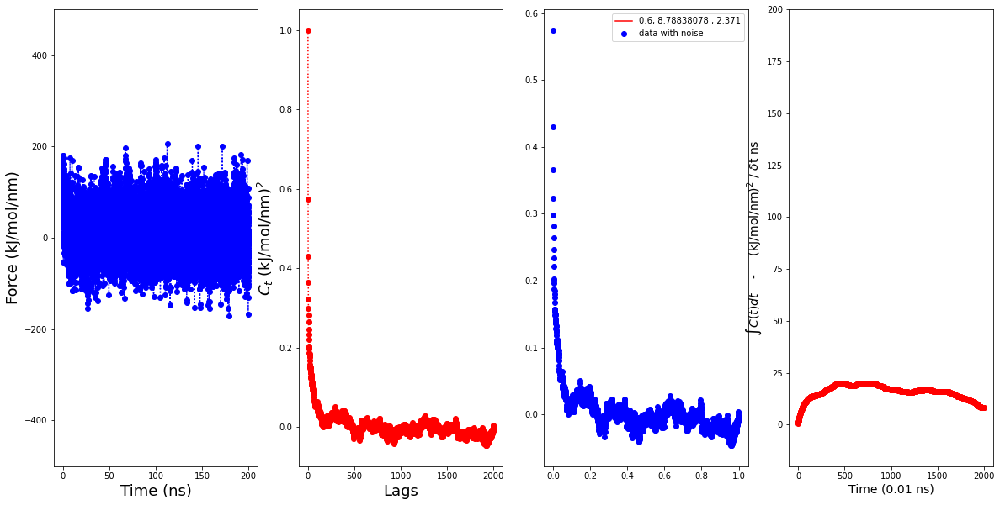

45
46
[1.         0.60596073 0.45004591 ... 0.05581387 0.05284404 0.05253621]
[1.         0.60596073 0.45004591 ... 0.05581387 0.05284404 0.05253621]
2001
0.04027852102502455 8.344639474910042e-05 -1433619.39650731
Gamma function value is
-0.0


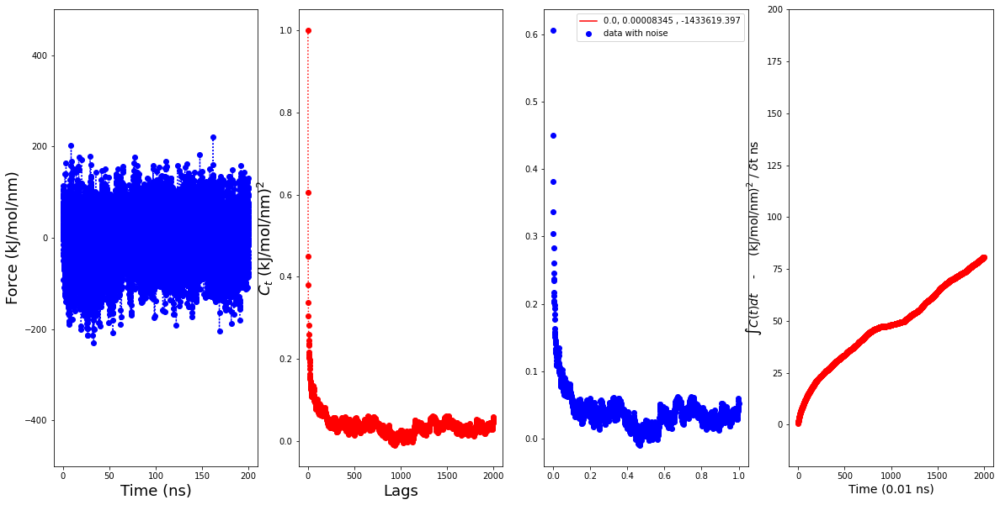

46
47
[ 1.          0.60789727  0.43588931 ... -0.00546494 -0.00184994
 -0.00120716]
[ 1.          0.60789727  0.43588931 ... -0.00546494 -0.00184994
 -0.00120716]
2001
0.6434485621511083 8.564460533181338 2.80436659892458
Gamma function value is
0.007357204156138538


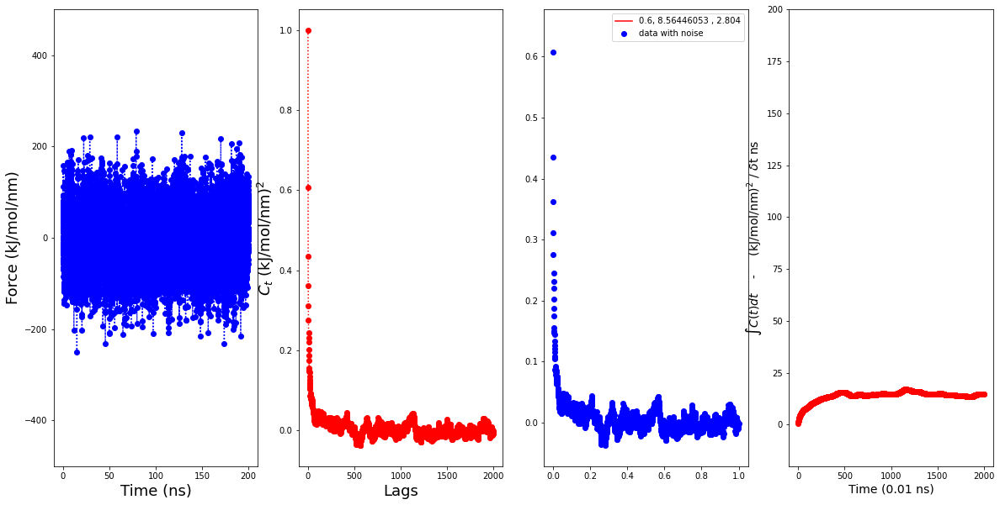

47
48
[ 1.          0.63686076  0.49821384 ... -0.00858093 -0.00931069
 -0.01173995]
[ 1.          0.63686076  0.49821384 ... -0.00858093 -0.00931069
 -0.01173995]
2001
0.037050726139231764 0.014854415173928787 -747814.6576421724
Gamma function value is
0.0


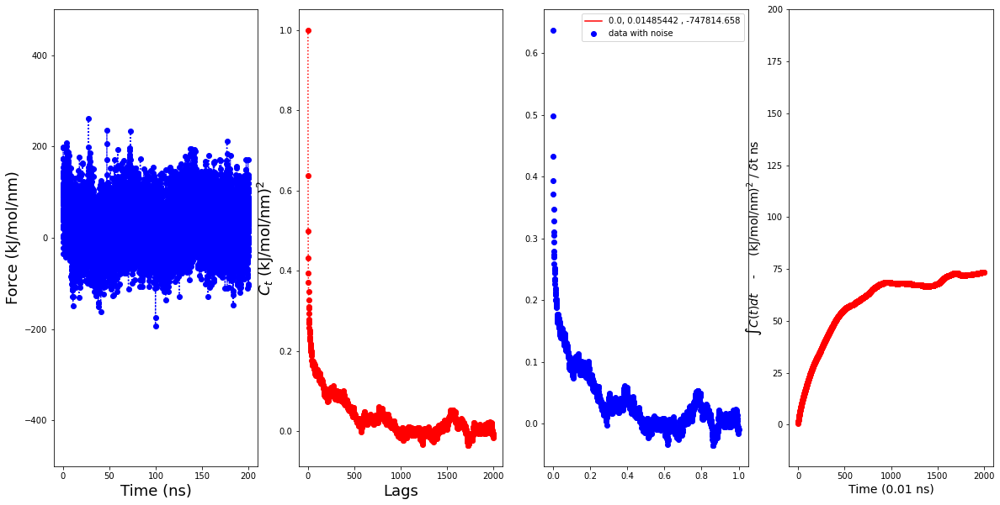

48
49
[1.         0.61207938 0.47613916 ... 0.0072352  0.00727427 0.01130427]
[1.         0.61207938 0.47613916 ... 0.0072352  0.00727427 0.01130427]
2001
0.6801836803574769 4.82569792472429 3.3848648176301817
Gamma function value is
0.03279348371115754


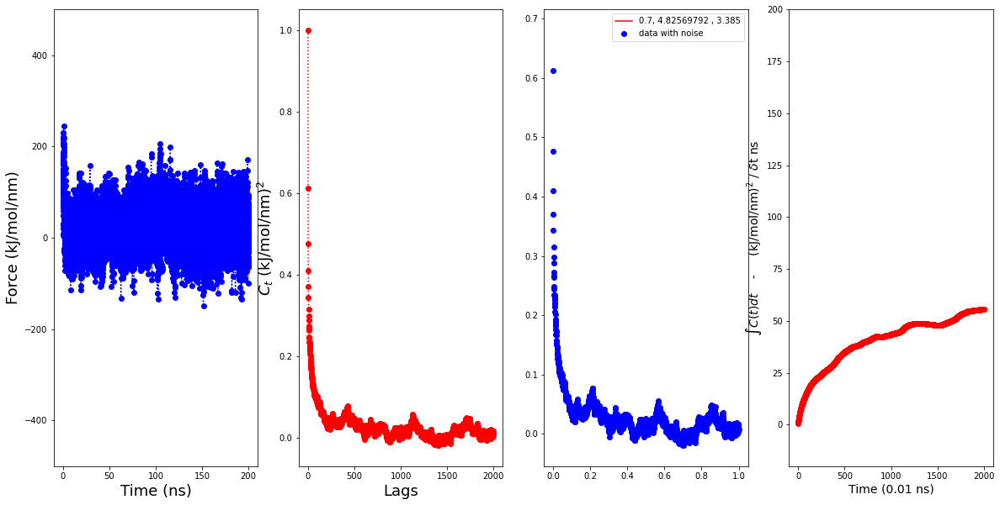

49
50
[1.00000000e+00 5.78273848e-01 4.28665330e-01 ... 3.85021344e-03
 4.41493462e-03 3.36322909e-04]
[1.00000000e+00 5.78273848e-01 4.28665330e-01 ... 3.85021344e-03
 4.41493462e-03 3.36322909e-04]
2001
0.14480845942308895 1.3855884503818159 -1481816.7687723846
Gamma function value is
nan


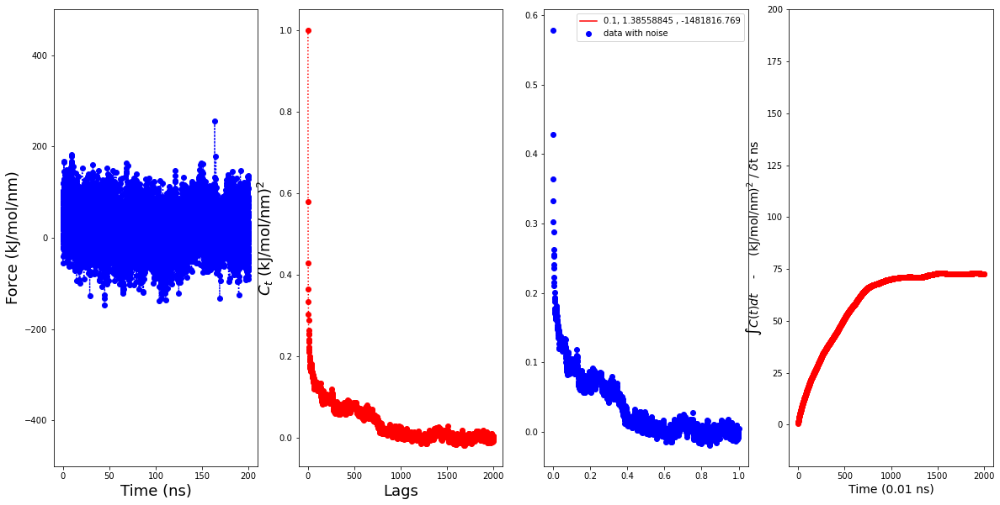

50
51
[1.         0.61936338 0.48277373 ... 0.01247224 0.01544385 0.01413295]
[1.         0.61936338 0.48277373 ... 0.01247224 0.01544385 0.01413295]
2001
0.2710733992309354 1.6796229740029922 -1505461.6326734566
Gamma function value is
nan


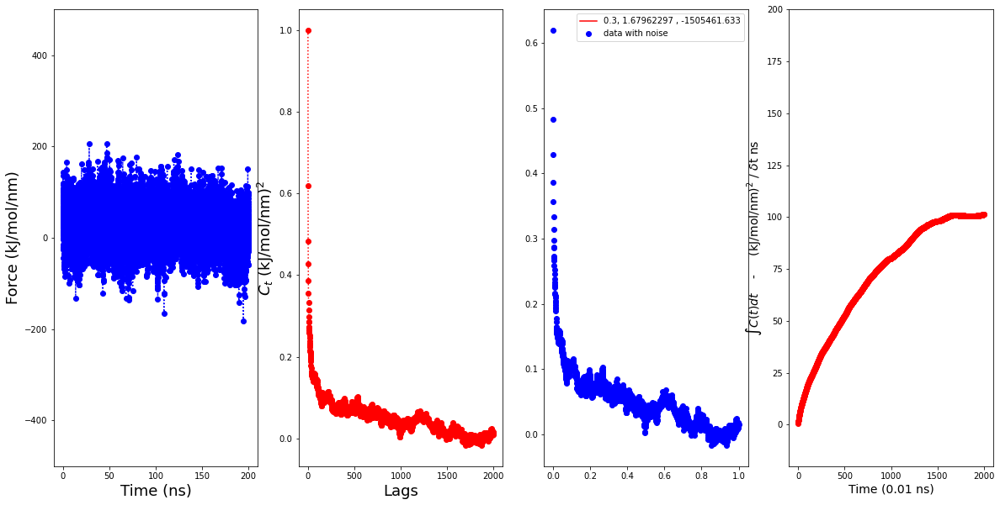

51
51
51
51
[ 3.19301329e-04  2.34369396e-04  1.48640627e-03  4.13304371e-04
             nan             nan  3.32574513e-04 -0.00000000e+00
  1.58942063e-04             nan  9.73687090e-05             nan
  2.62889627e-04  8.33351485e-05  6.14561851e-05  2.06072551e-04
             nan             nan  3.38213692e-04  4.57561987e-04
  4.81534364e-04             nan -0.00000000e+00  1.02290774e-04
             nan  7.64533501e-05  7.05725989e-05  4.25977481e-04
  7.32533831e-05  8.87652065e-05             nan  3.87728803e-04
  1.41463372e-04             nan -0.00000000e+00  3.46214052e-04
  0.00000000e+00             nan -0.00000000e+00 -0.00000000e+00
  2.87118985e-04  3.98346474e-04             nan -0.00000000e+00
  9.56252707e-05 -0.00000000e+00  7.35720416e-05  0.00000000e+00
  3.27934837e-04             nan             nan]


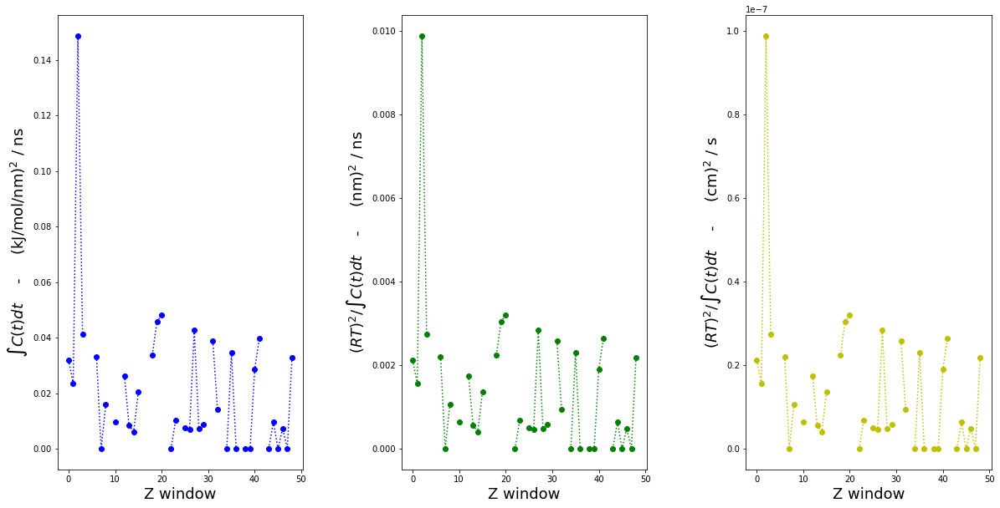

In [18]:


#Original data, 100, 1000. 
#Red, blue, black and purple at 500,000. 

#Correlation func & Integral: 1, 100, 1000.

#Auto-correlation
from statsmodels.graphics import tsaplots

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import os
import glob 
import errno
import statsmodels.api as sm
import scipy.integrate as scint
from scipy import integrate

from scipy.optimize import curve_fit
            
import math        
from numpy import array, hstack, vstack


import itertools

last = []
dz = []
bl = []
bla = range(20000)
bla2 = array([bla])
save_acf = array([bla])

bla3 = save_acf.T

bla4 = np.empty(shape=(20000,) * 1)

plt.figure(figsize=(20,6))
count=1

# create subplots

os.chdir('/Users/chrisjorg/Documents/Postdoc/Georgetown/Double_bilayer_Sandwich/Z_LPP/LPP_2MR_DPG_5000eq_0.2/Force_prod/All_new2/Convolve_100')



with open('data.txt', 'w') as file:
    path = './*pullf.xvg' 
    path2 = os.getcwd()
    files = glob.glob(path)
    colors = itertools.cycle(["r", "b", "g","y","c","m"])
    
def key_func(x):
        return os.path.split(x)[-1]

for name in sorted(glob.glob('*_pullf.xvg_dt*'), key=key_func):
        try: 
            print(count)
            
            lines = open(name,'r')
            f = np.loadtxt(name)
            #plt.subplot(1, 1, count) 

            subplot_dim = (20, 10)
            X_=f[:,0]/1000
            Y=f[:,1]
            X_scale = np.linspace(0, 1, 20000) 
            
            X_scale_ = X_scale/100
            
           
            
            
            fig, (ax0, ax1, ax2, ax3) = plt.subplots(1, 4,figsize=(20,10))
            ax0.plot(X_,Y,':ro',label=name,color=next(colors))
             
            ax0.set_ylabel('Force (kJ/mol/nm)',fontsize=18)
            ax0.set_xlabel('Time (ns)',fontsize=18)
             
            ax0.set_ylim(-500, 500)

            colors = itertools.cycle(["r", "b", "g","y","c","m"])
            
            acf_ = sm.tsa.acf(Y,  nlags=2000)
            
            acf__ = acf_.T
            print(acf__)
            print(acf_)
            blbb = np.concatenate(([X_scale, X_, Y]), axis=0) 
            np.savetxt('AutoCorr_100_' + str(count) + '.txt', acf_, delimiter=" ", fmt="%s")
 
            save_acf__ = hstack([ X_, Y])
           
            ax1.plot(acf_,':ro',label=name,color=next(colors)) 
            ax1.set_ylabel('$C_{t}$ (kJ/mol/nm)$^2$',fontsize=18)
            ax1.set_xlabel('Lags',fontsize=18)
            
            print(len(acf_))
            colors = itertools.cycle(["r", "b", "g","y","c","m"])

            X_scale = np.linspace(0, 1, 2000)
            acf__ = acf_[1:]
            acf_int = integrate.cumtrapz(acf__)
   
            np.savetxt("dz_integrat.txt", acf_int, delimiter=" ", fmt="%s")

            # define type of function to search
            def model_func(x, a, b, c):
                return a * np.exp(-(b * x ** (c ** (-1))))

            # curve fit
            X_scale = np.linspace(0, 1, 1999)
            p0 = (1.,1.e-5,1.) # starting search koefs
            opt, pcov = curve_fit(model_func, X_scale, acf__[:1999], p0)
            a, b, c= opt
            # test result
            
            x2 = np.linspace(0, 1999, 1)
            y2 = model_func(x2, a, b, c)
            ax2.plot(x2, y2, color='r', label='%.1f, %.8f , %-.3f' % (a,b,c))
            
            print(a, b, c)
            ax2.plot(X_scale, acf__[:1999], 'bo', label='data with noise')
            #ax2.set_xlim(0, 1999)
            ax2.legend(loc='best')
        
        
            from scipy.stats import gamma
          
            
        
            def int_val(a, b, c):
                return a * (b ** (-c)) * math.gamma(1 + c)
            y3 = int_val(a, b, c)
            print("Gamma function value is")
            print(y3)

 
            ax3.plot(acf_int,':ro',label=name,color=next(colors))
            ax3.set_ylabel(r'$\int C(t) dt $    -     (kJ/mol/nm)$^2$ / $\delta$t ns',fontsize=14)
            ax3.set_xlabel('Time (0.01 ns)',fontsize=14)
            ax3.set_ylim(-20, 200)
            plt.show()
             
            count+=1
             
            fig.savefig('AutoCorr_100_' + str(count) + '.png',dpi=300,bbox_inches='tight',pad_inches=0.06)
            last_element = y3
      
            #last_element_ = 100*last_element
            last.append(last_element)
            print(len(last))
        except IOError as exc: 
            if exc.errno != errno.EISDIR: 
                raise

np.savetxt("test5.txt", blbb, delimiter=" ", fmt="%s") 

# Display the autocorrelation plot of your time series

print(len(last))
fig, (ax0, ax1, ax2) = plt.subplots(1, 3,figsize=(20,10))
last_arr = np.array(last)
last_ = last_arr
np.savetxt("test6.txt", last_, delimiter=" ", fmt="%s") 

print(len(last_))
rt = 0.008314*310   #kJ/mol
rt2_ = rt*rt

dt = 0.01 

dt1 = 1/dt
invert_last = 1. / dt1*last_
print(len(invert_last))
print(invert_last)
#invert_last = np.reciprocal(last_)
fraction = rt2_*invert_last
fraction_units = fraction*0.00001

#plt.plot(last_,':ro',label=name,color=next(colors))

ax0.plot(last_,':ro',label=name,color=next(colors))
ax0.set_ylabel(r'$\int C(t) dt $    -     (kJ/mol/nm)$^2$ / ns',fontsize=18)
ax0.set_xlabel('Z window',fontsize=18)
#plt.xlim(0, 50000)

ax1.plot(fraction,':ro',label=name,color=next(colors))
ax1.set_ylabel('$(RT)^{2} / \int C(t) dt $    -     (nm)$^2$ / ns',fontsize=18)
ax1.set_xlabel('Z window',fontsize=18)
#plt.xlim(0, 100)
 
ax2.plot(fraction_units,':ro',label=name,color=next(colors))
ax2.set_ylabel('$(RT)^{2} / \int C(t) dt $    -     (cm)$^2$ / s',fontsize=18)
ax2.set_xlabel('Z window',fontsize=18)
np.savetxt("last_element_.txt", last, delimiter=" ", fmt="%s")
plt.ticklabel_format(useOffset=False)

np.savetxt("dz.txt", fraction_units, delimiter=" ", fmt="%s")
 
plt.subplots_adjust(wspace=0.4)
            
#plt.tight_layout()
plt.savefig('AutoCorr_100.png',dpi=300,bbox_inches='tight',pad_inches=0.2)

1
[ 1.          0.66273582  0.50227375 ... -0.01696509 -0.02007268
 -0.01847672]
[ 1.          0.66273582  0.50227375 ... -0.01696509 -0.02007268
 -0.01847672]
2001
0.6984969041549265 11.446047547138935 2.275102110195767
Gamma function value is
0.007131233498767456


<Figure size 1440x432 with 0 Axes>

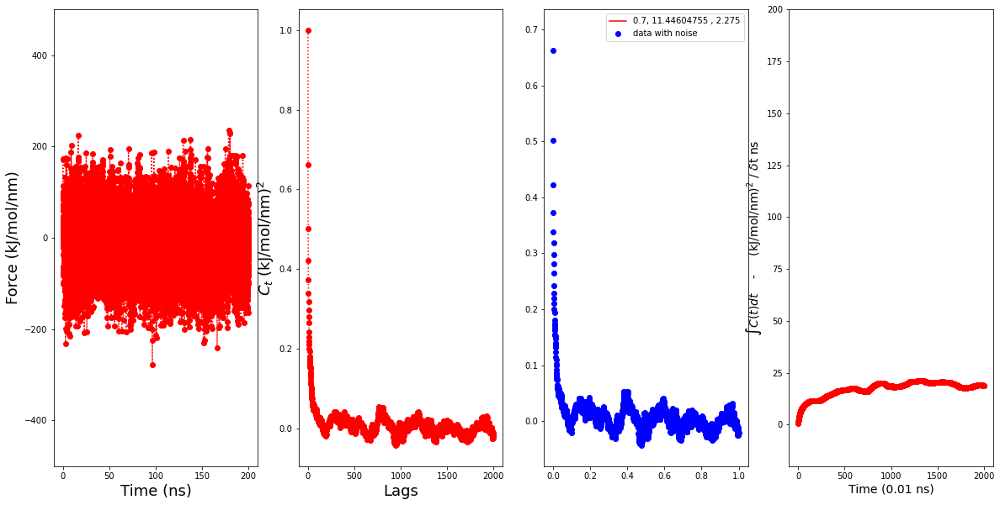

1
2
[ 1.          0.61639586  0.45387881 ... -0.003418   -0.00539805
 -0.00356734]
[ 1.          0.61639586  0.45387881 ... -0.003418   -0.00539805
 -0.00356734]
2001
0.4282749435234553 2.812004750037179 -1416488.0215616268
Gamma function value is
nan


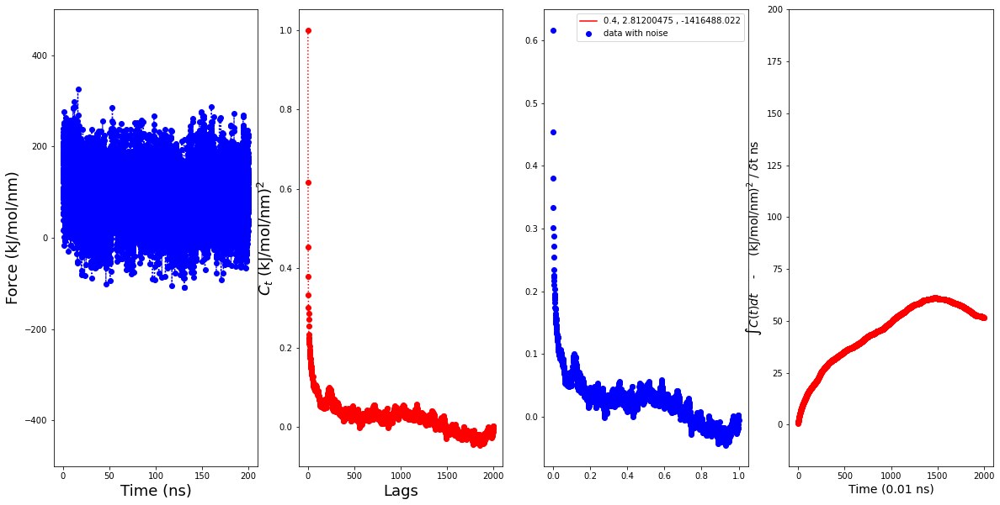

2
3
[1.         0.66283722 0.50160323 ... 0.04619383 0.04771391 0.04655424]
[1.         0.66283722 0.50160323 ... 0.04619383 0.04771391 0.04655424]
2001
0.06106776984467097 0.005474152379054773 -734541.2546086534
Gamma function value is
-0.0


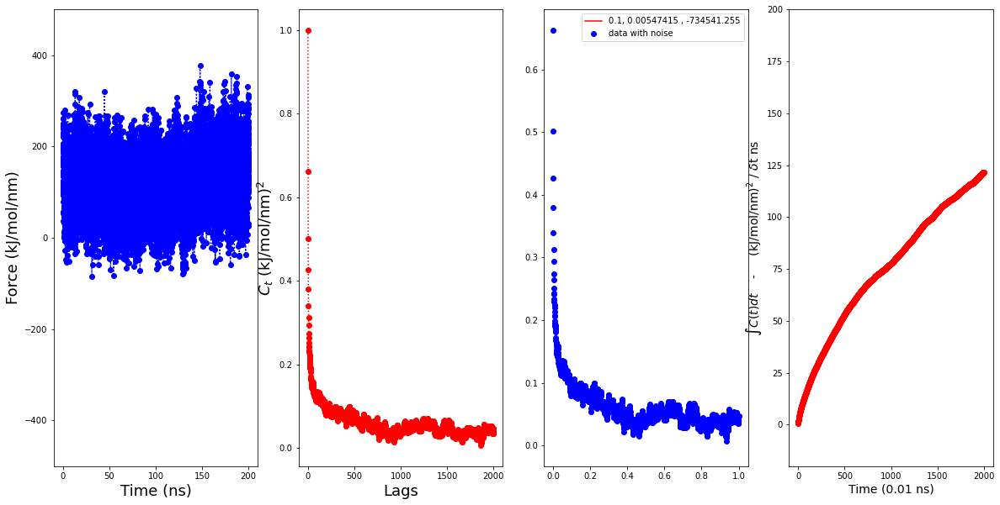

3
4
[1.         0.63523545 0.46552219 ... 0.00673047 0.01277114 0.01427934]
[1.         0.63523545 0.46552219 ... 0.00673047 0.01277114 0.01427934]
2001
0.6914810433884 5.139498960501896 3.847660639750365
Gamma function value is
0.02432723098862234


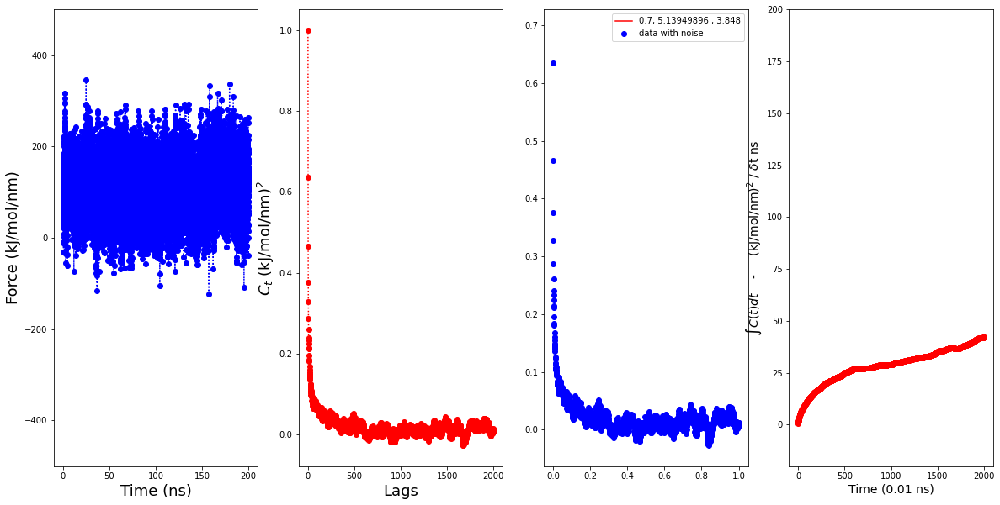

4
5
[1.         0.64903492 0.487132   ... 0.01309982 0.00794129 0.01373898]
[1.         0.64903492 0.487132   ... 0.01309982 0.00794129 0.01373898]
2001
0.0635912911540858 0.014763714128583807 -1425705.8416570567
Gamma function value is
-0.0


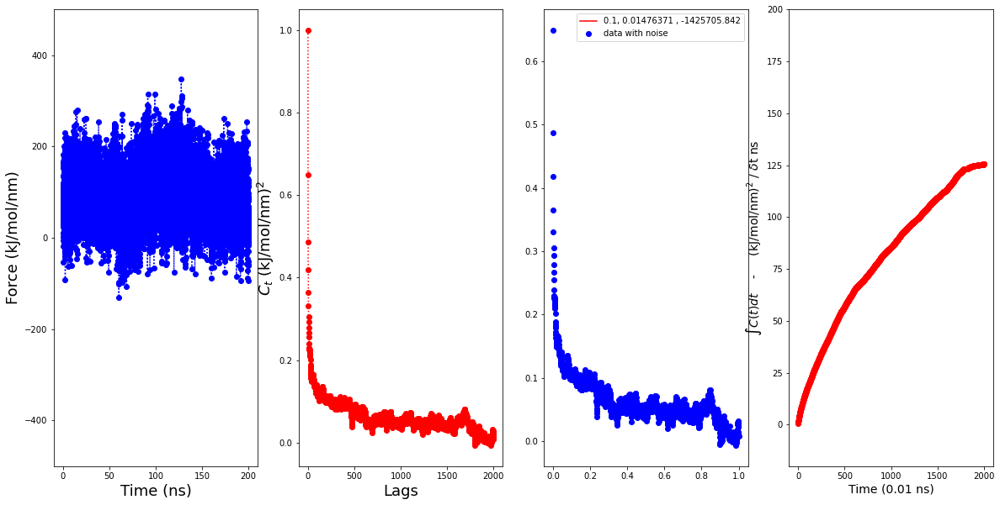

5
6
[ 1.00000000e+00  6.33135928e-01  4.70430975e-01 ...  9.33495090e-03
  6.02212827e-04 -2.84459537e-03]
[ 1.00000000e+00  6.33135928e-01  4.70430975e-01 ...  9.33495090e-03
  6.02212827e-04 -2.84459537e-03]
2001
0.48142051275102327 2.798311747279313 -1288509.96942214
Gamma function value is
nan


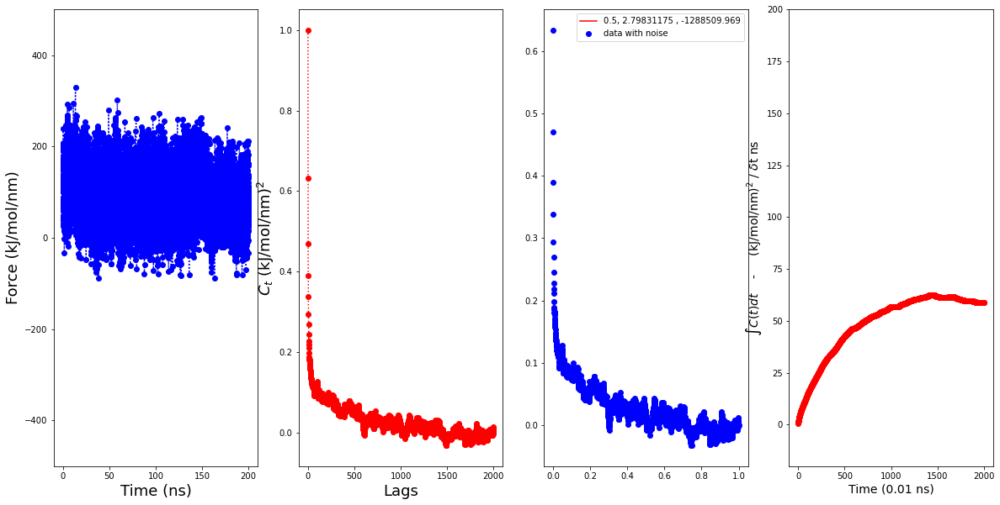

6
7
[1.         0.63044787 0.47321094 ... 0.00627248 0.01310643 0.02177888]
[1.         0.63044787 0.47321094 ... 0.00627248 0.01310643 0.02177888]
2001
0.054270637591936816 0.002817978429986969 -789157.0376369109
Gamma function value is
-0.0


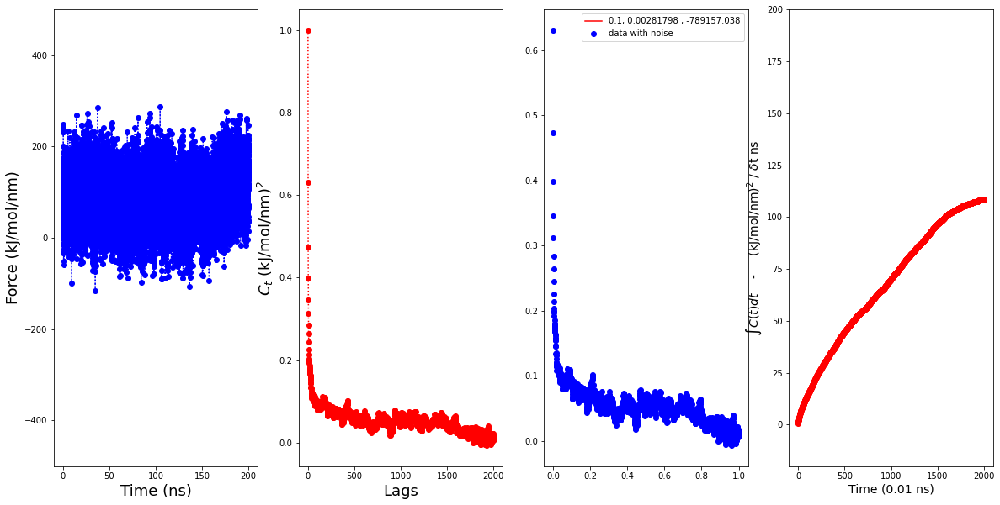

7
8
[1.         0.63647195 0.47511936 ... 0.02254699 0.02360191 0.02450773]
[1.         0.63647195 0.47511936 ... 0.02254699 0.02360191 0.02450773]
2001
0.04663202505562648 0.0021855306830708553 -931576.0295914633
Gamma function value is
0.0


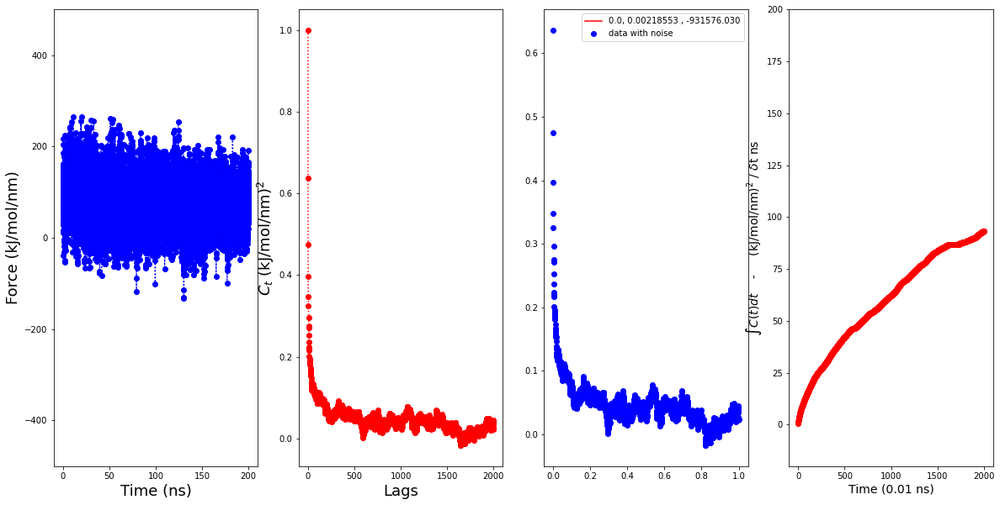

8
9
[1.         0.72920617 0.60522671 ... 0.08511271 0.08371046 0.08269085]
[1.         0.72920617 0.60522671 ... 0.08511271 0.08371046 0.08269085]
2001
0.11622165507788837 0.0017876668856263143 -646546.3001561823
Gamma function value is
0.0


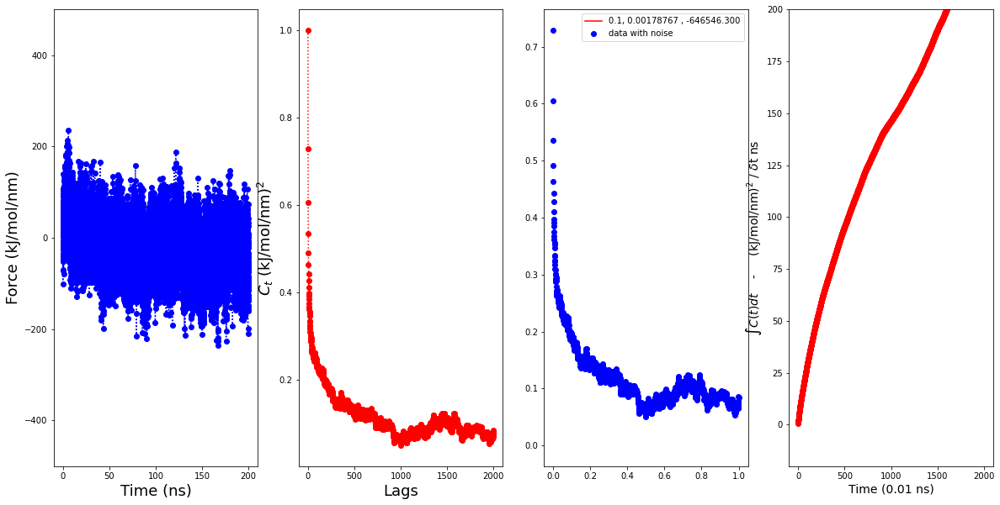

9
10
[1.         0.72726975 0.58614147 ... 0.07801001 0.08065468 0.07850572]
[1.         0.72726975 0.58614147 ... 0.07801001 0.08065468 0.07850572]
2001
0.09712184774069663 0.0041786085949759525 -904968.6933812114
Gamma function value is
0.0


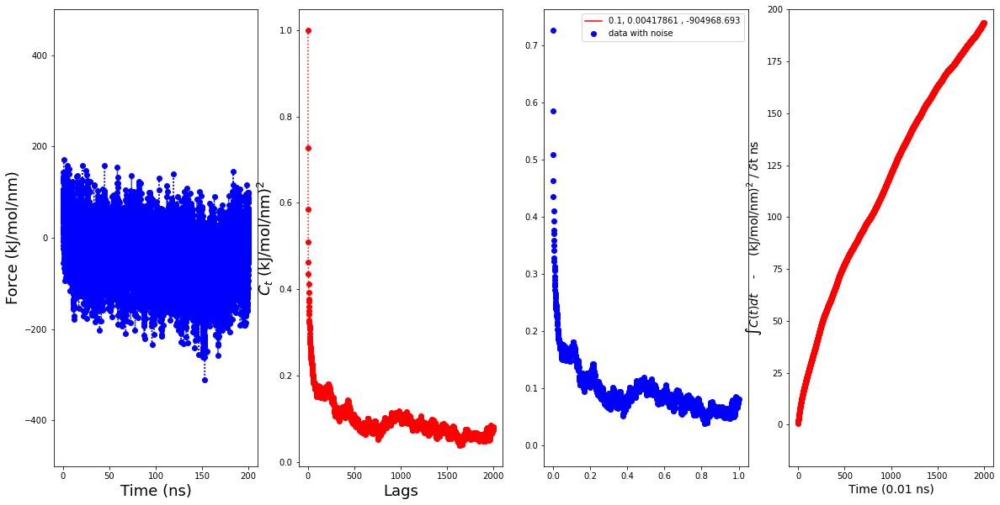

10
11
[1.         0.72142874 0.57865713 ... 0.00450385 0.00563676 0.00195931]
[1.         0.72142874 0.57865713 ... 0.00450385 0.00563676 0.00195931]
2001
0.4073185041841373 2.011153955837998 -1355153.0730210687
Gamma function value is
nan


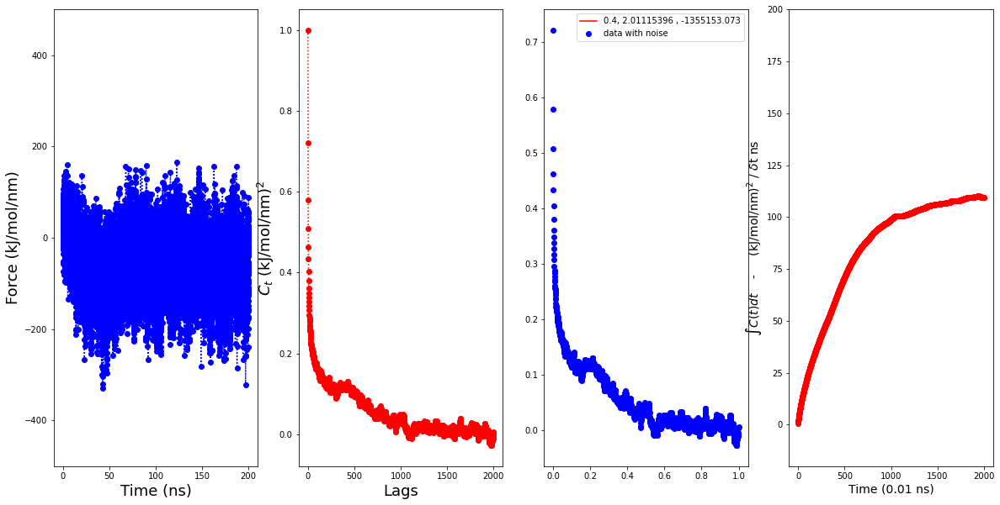

11
12
[ 1.          0.67168852  0.51336877 ... -0.02446986 -0.0325307
 -0.03881589]
[ 1.          0.67168852  0.51336877 ... -0.02446986 -0.0325307
 -0.03881589]
2001
0.6977381326962407 6.676306270850464 2.8244643415439135
Gamma function value is
0.015817671287735296


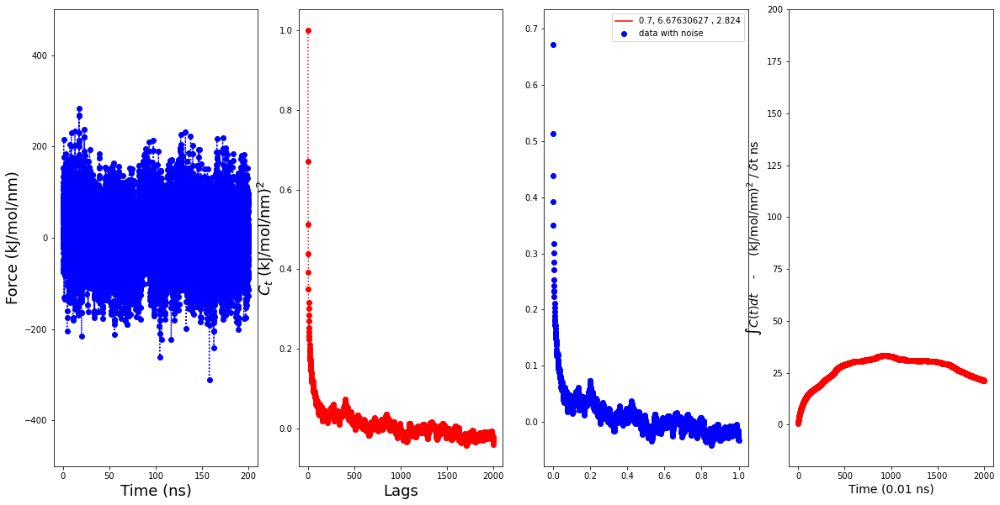

12
13
[1.         0.69600648 0.55384245 ... 0.03488129 0.0388685  0.04124526]
[1.         0.69600648 0.55384245 ... 0.03488129 0.0388685  0.04124526]
2001
0.756964317590612 4.661174947844976 3.5373972568050727
Gamma function value is
0.04005146412489076


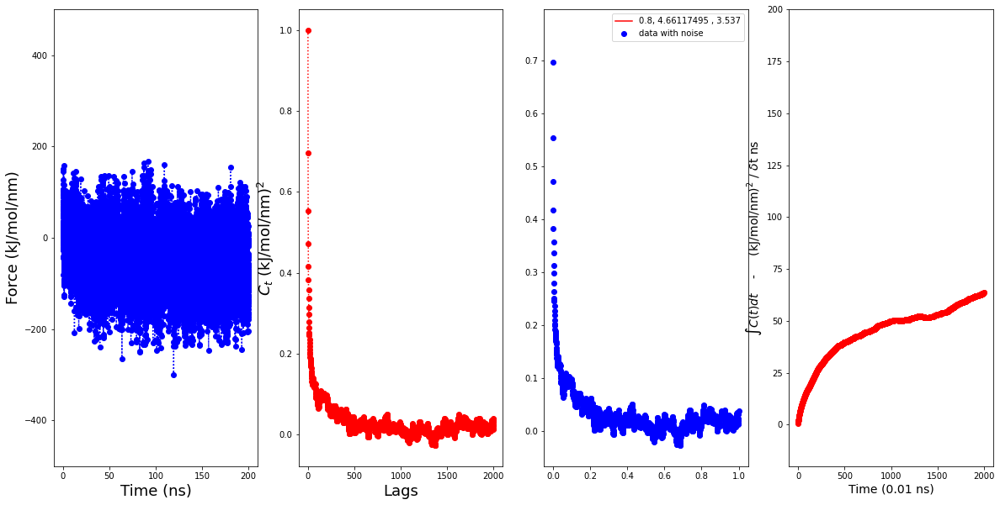

13
14
[1.         0.79460738 0.67992363 ... 0.07255118 0.07331692 0.06914227]
[1.         0.79460738 0.67992363 ... 0.07255118 0.07331692 0.06914227]
2001
0.11669217923078737 0.004850785180171406 -690040.9256265666
Gamma function value is
0.0


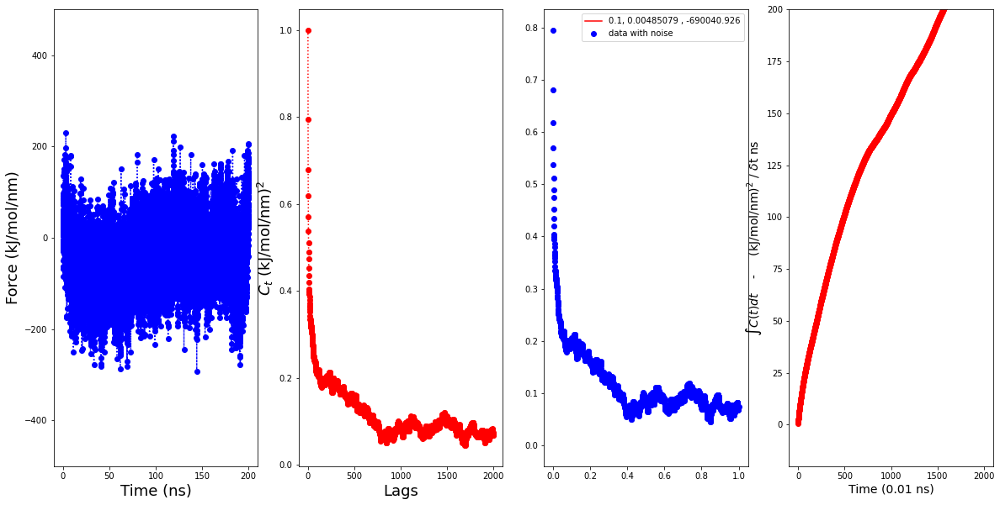

14
15
[1.         0.77083211 0.64615259 ... 0.04443013 0.04565418 0.05067083]
[1.         0.77083211 0.64615259 ... 0.04443013 0.04565418 0.05067083]
2001
0.11134059956877307 0.0029642550973750866 -726119.8791460926
Gamma function value is
-0.0


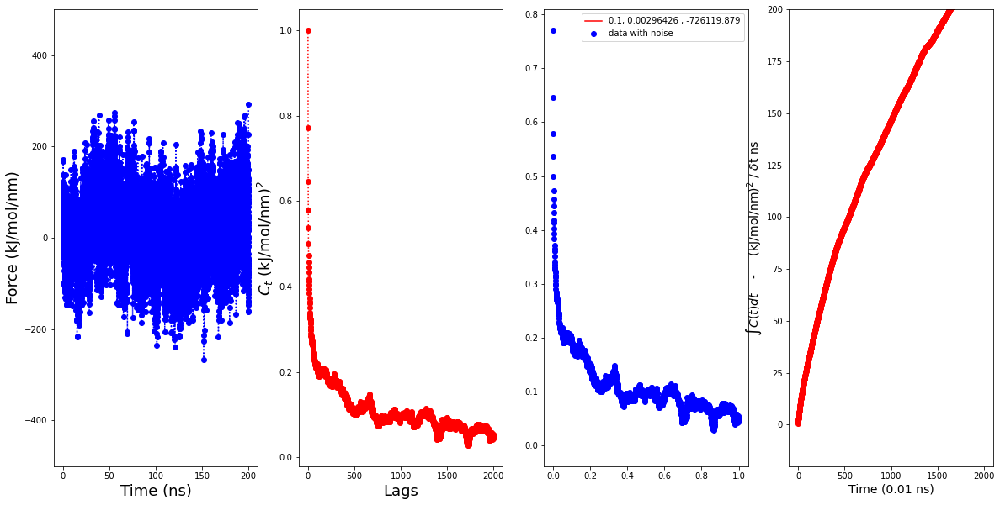

15
16
[ 1.          0.72048044  0.57428671 ... -0.02357749 -0.02026538
 -0.02121235]
[ 1.          0.72048044  0.57428671 ... -0.02357749 -0.02026538
 -0.02121235]
2001
0.6869467058653548 6.775302271886471 2.427493293581407
Gamma function value is
0.02028000380411551


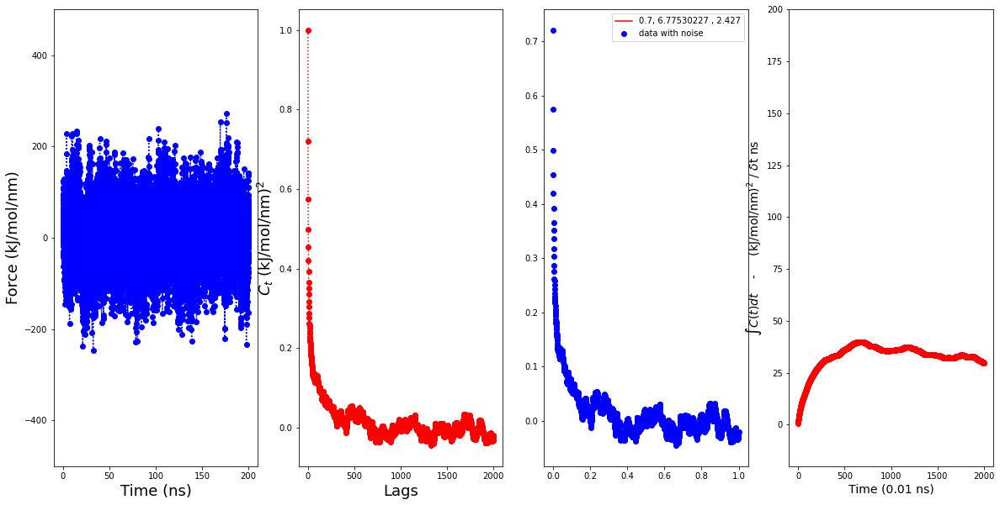

16
17
[ 1.00000000e+00  7.41898379e-01  6.08535364e-01 ... -2.28029999e-03
  2.06674524e-04  2.06257971e-03]
[ 1.00000000e+00  7.41898379e-01  6.08535364e-01 ... -2.28029999e-03
  2.06674524e-04  2.06257971e-03]
2001
0.6894161362485138 5.168592174147884 2.515000406719794
Gamma function value is
0.037422159621645495


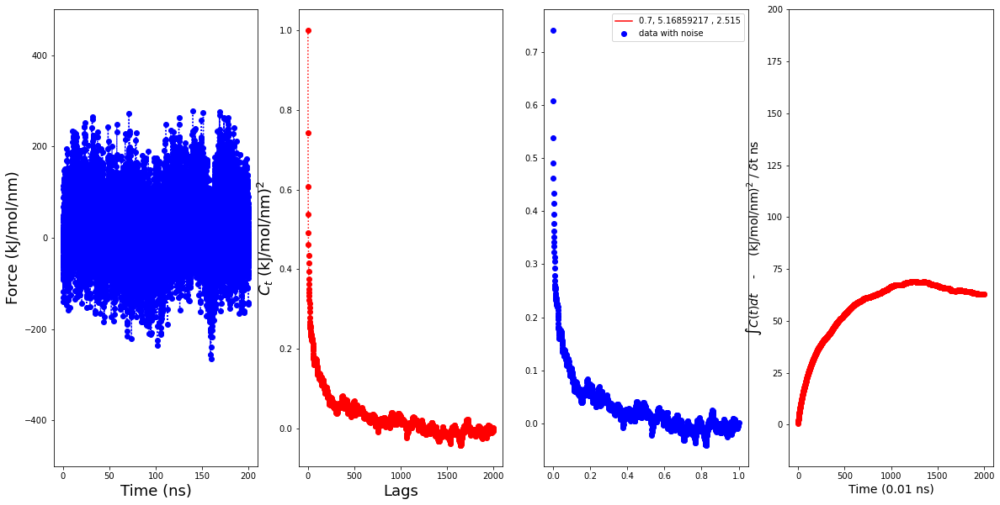

17
18
[ 1.          0.75426789  0.62338899 ... -0.03359054 -0.03207662
 -0.03077517]
[ 1.          0.75426789  0.62338899 ... -0.03359054 -0.03207662
 -0.03077517]
2001
0.19699724396818621 1.3961709014318808 -1481000.241430111
Gamma function value is
nan


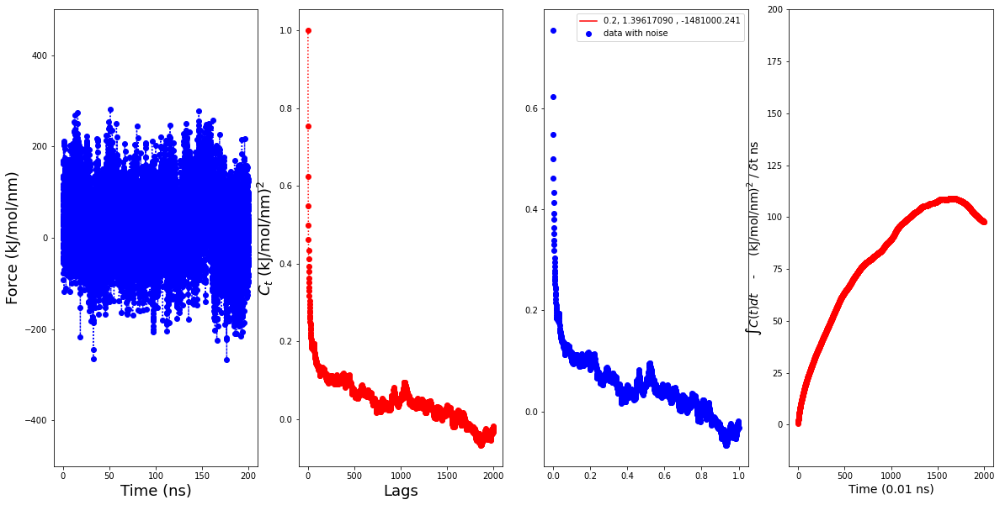

18
19
[1.         0.66810972 0.50914036 ... 0.02161406 0.02191886 0.02072234]
[1.         0.66810972 0.50914036 ... 0.02161406 0.02191886 0.02072234]
2001
0.6768043565399082 9.159621881597811 2.3795914701351233
Gamma function value is
0.010151509818824594


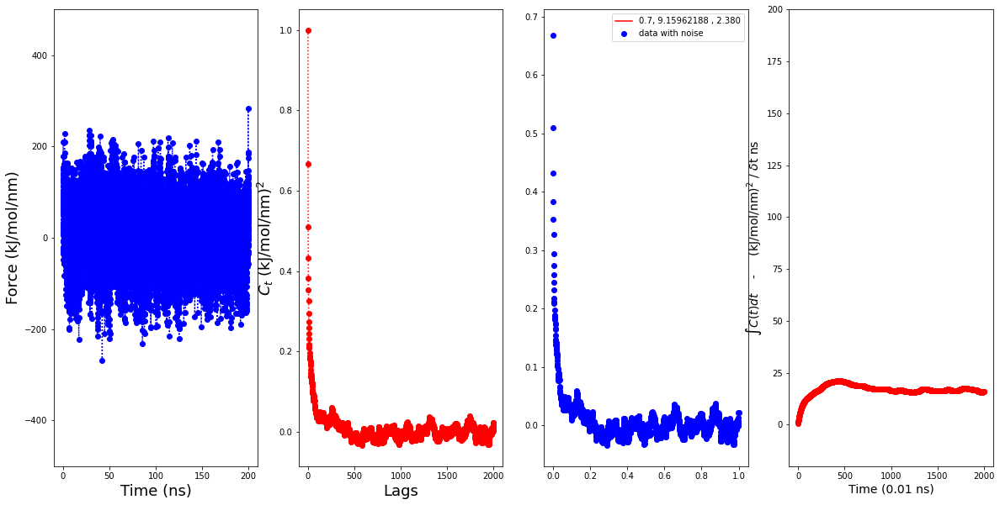

19
20
[1.         0.66900863 0.51386945 ... 0.00592464 0.00577954 0.01094436]
[1.         0.66900863 0.51386945 ... 0.00592464 0.00577954 0.01094436]
2001
0.32206778237194794 1.842205758470695 -1376506.126185973
Gamma function value is
nan


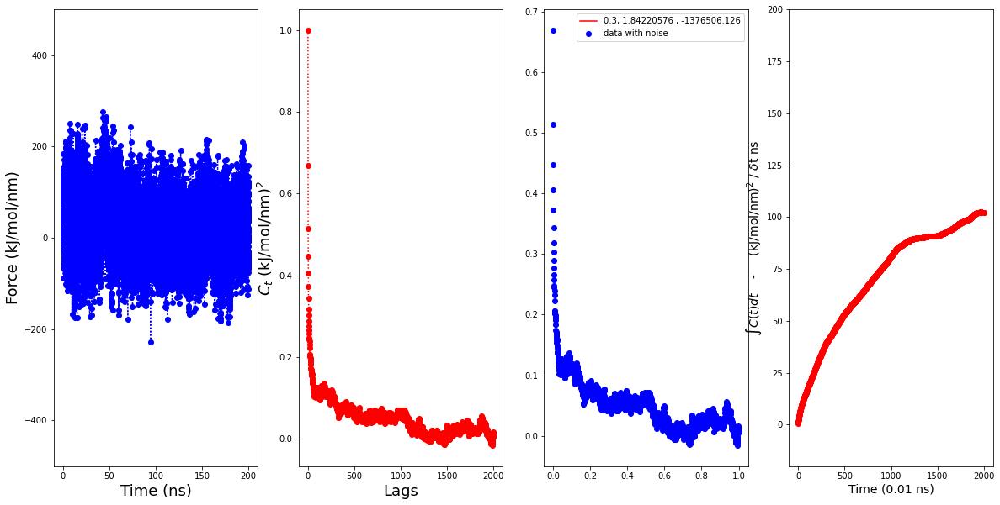

20
21
[ 1.00000000e+00  7.36825256e-01  5.97768085e-01 ... -1.22162727e-03
  5.25547254e-04  6.04333283e-04]
[ 1.00000000e+00  7.36825256e-01  5.97768085e-01 ... -1.22162727e-03
  5.25547254e-04  6.04333283e-04]
2001
0.7166874303586819 6.75575773385829 2.336868989857488
Gamma function value is
0.02300674233766022


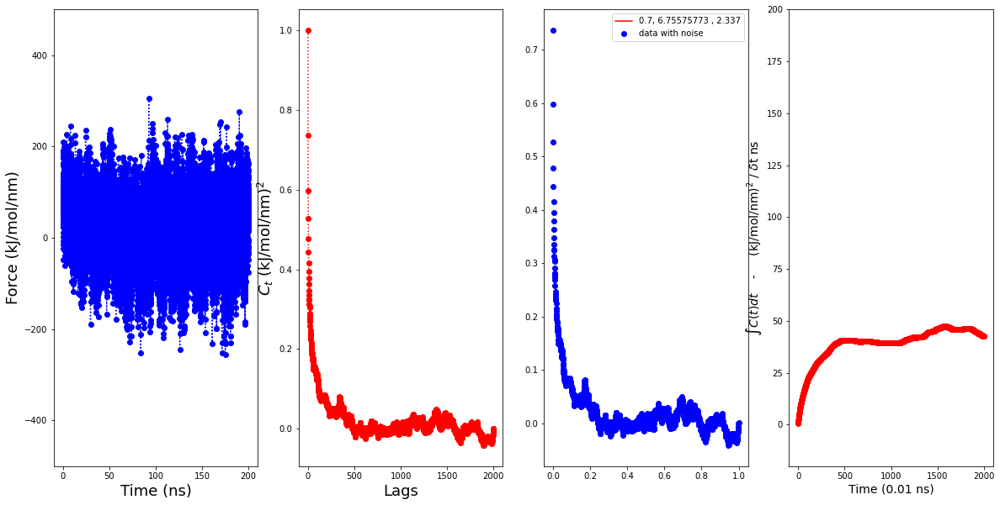

21
22
[ 1.          0.73174738  0.59255096 ... -0.0044472  -0.00718092
 -0.00142331]
[ 1.          0.73174738  0.59255096 ... -0.0044472  -0.00718092
 -0.00142331]
2001
0.6435091523111958 6.312943516539455 2.2370335286413643
Gamma function value is
0.026248769705150207


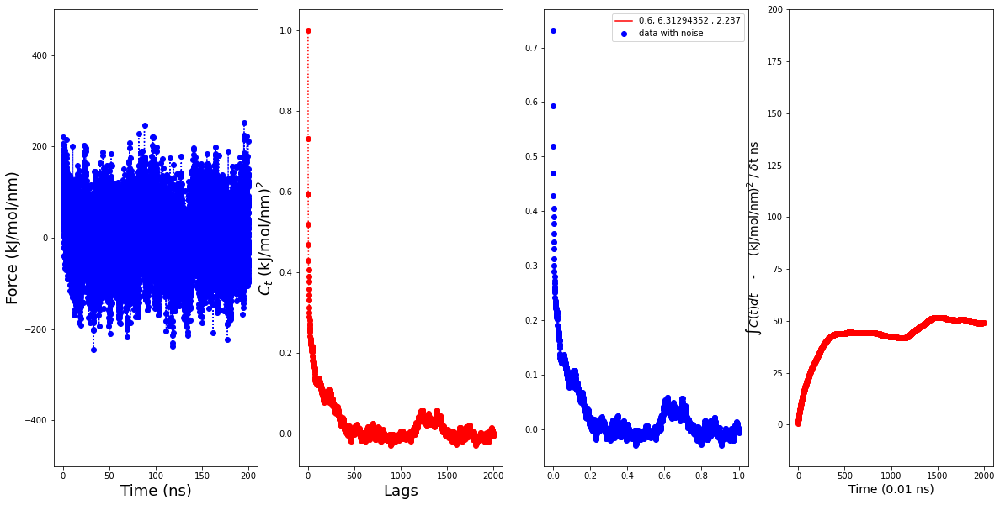

22
23
[1.         0.7086903  0.5684973  ... 0.01664705 0.01782715 0.01875387]
[1.         0.7086903  0.5684973  ... 0.01664705 0.01782715 0.01875387]
2001
0.7405434160165525 4.9581081261675495 3.195877110122337
Gamma function value is
0.0342559047366784


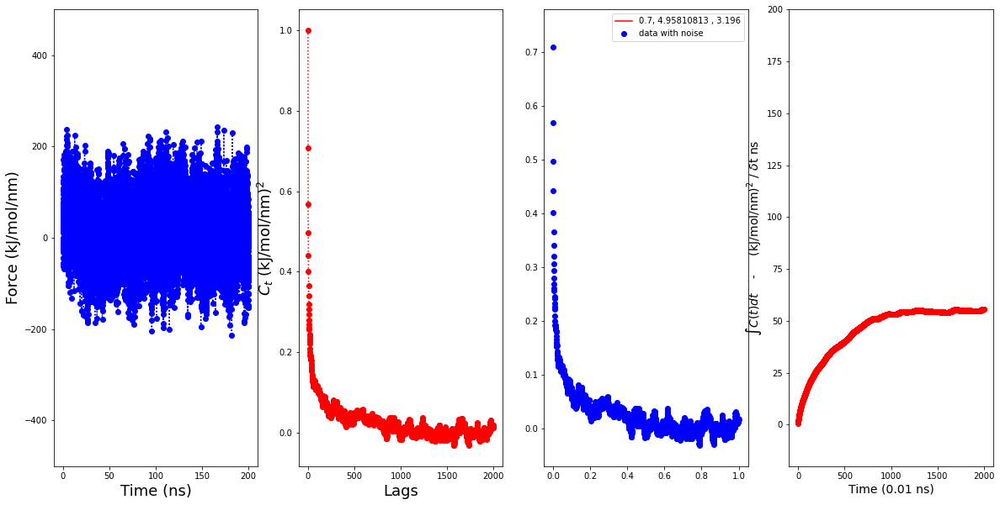

23
24
[ 1.00000000e+00  7.02868596e-01  5.59748869e-01 ...  2.47558509e-03
  3.10504413e-03 -4.36660591e-04]
[ 1.00000000e+00  7.02868596e-01  5.59748869e-01 ...  2.47558509e-03
  3.10504413e-03 -4.36660591e-04]
2001
0.7427186195721958 5.310305739247907 3.1726691942054073
Gamma function value is
0.027823703111528035


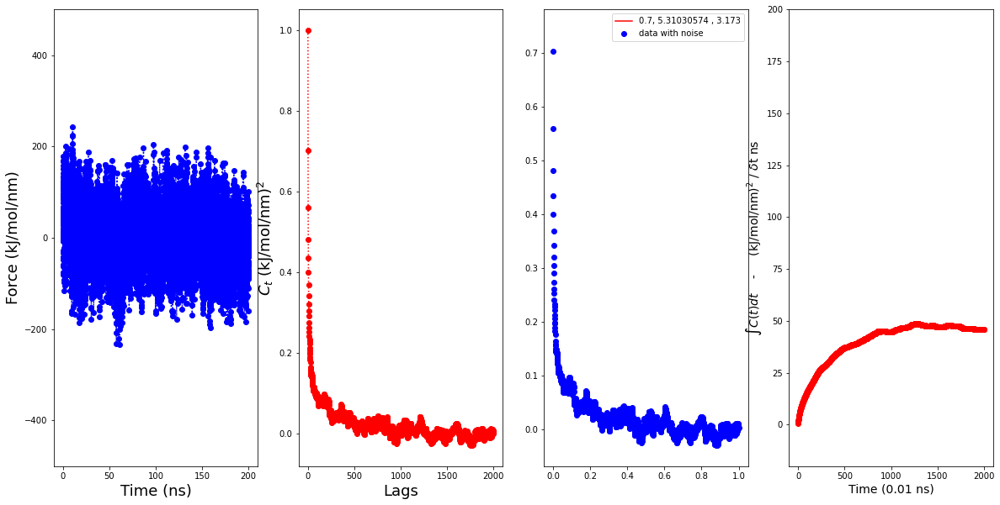

24
25
[ 1.          0.68738483  0.52824001 ... -0.04847976 -0.04348245
 -0.03919267]
[ 1.          0.68738483  0.52824001 ... -0.04847976 -0.04348245
 -0.03919267]
2001
0.46288779316022693 3.030712067715197 -1452144.4919461526
Gamma function value is
nan


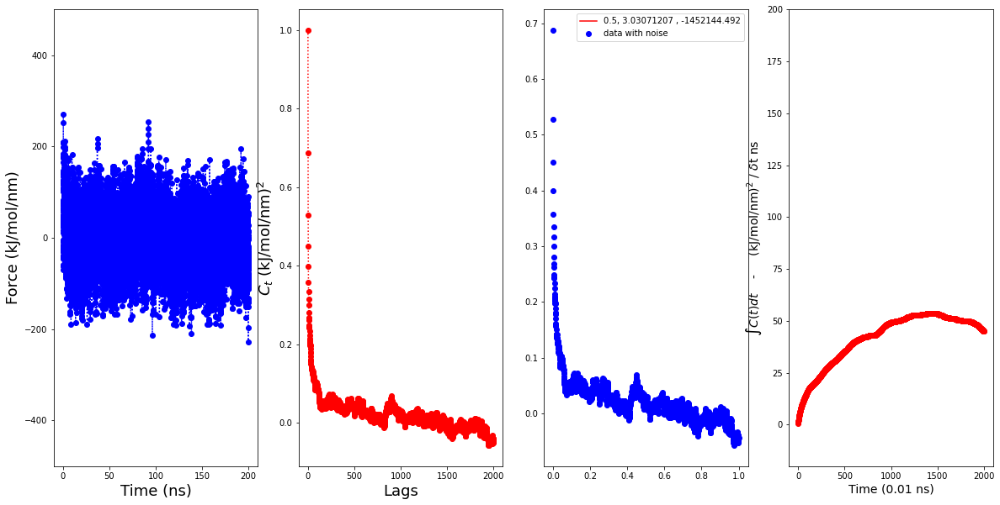

25
26
[1.         0.73317161 0.59416542 ... 0.05387633 0.05115828 0.0509067 ]
[1.         0.73317161 0.59416542 ... 0.05387633 0.05115828 0.0509067 ]
2001
0.2462261035316103 1.3775962626395055 -1329123.997556638
Gamma function value is
nan


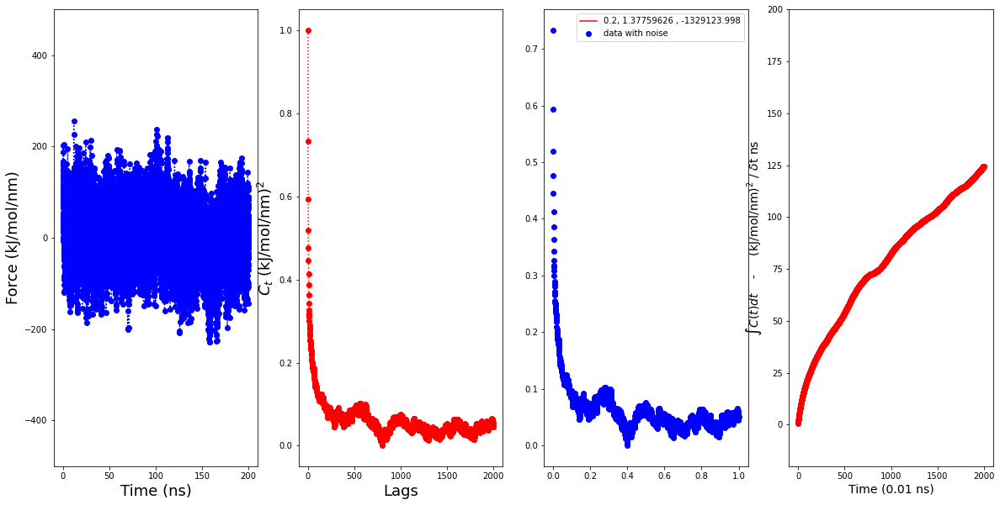

26
27
[1.         0.66651744 0.51198513 ... 0.00992844 0.01112555 0.00998373]
[1.         0.66651744 0.51198513 ... 0.00992844 0.01112555 0.00998373]
2001
0.6011015472421128 5.857391173151359 2.587244057010572
Gamma function value is
0.022731334009648406


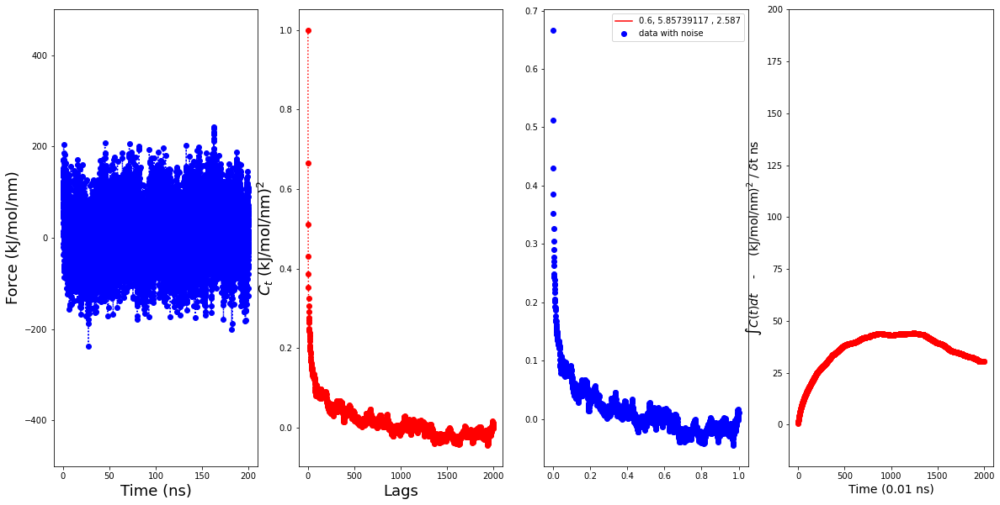

27
28
[ 1.00000000e+00  6.42841843e-01  4.73189111e-01 ... -5.14017489e-04
 -3.06891782e-03 -1.45020335e-03]
[ 1.00000000e+00  6.42841843e-01  4.73189111e-01 ... -5.14017489e-04
 -3.06891782e-03 -1.45020335e-03]
2001
0.6975015199809746 7.263980935504185 3.1227667704572655
Gamma function value is
0.010007817425312726


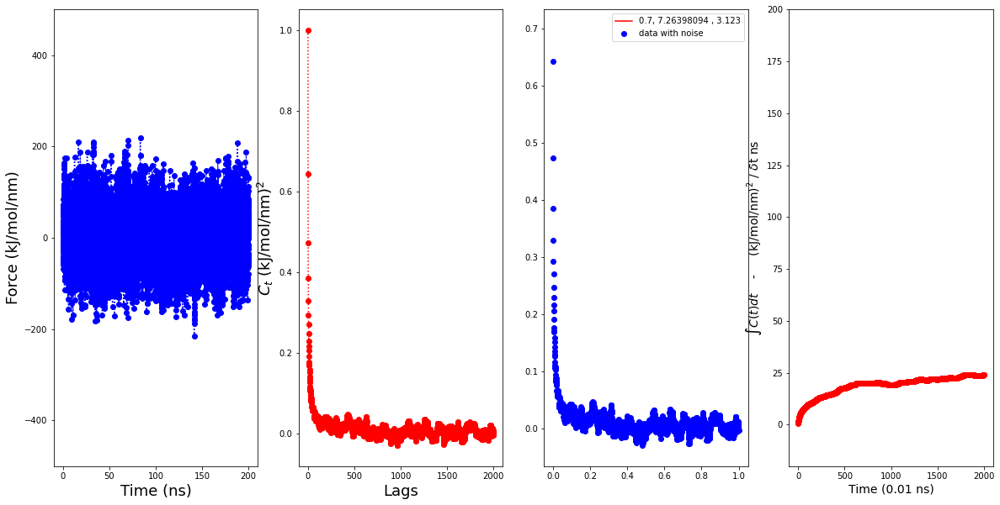

28
29
[1.         0.66266582 0.50401745 ... 0.01913011 0.02486267 0.02285   ]
[1.         0.66266582 0.50401745 ... 0.01913011 0.02486267 0.02285   ]
2001
0.6902130864524609 8.275507579915589 2.619314134285571
Gamma function value is
0.010345176048078674


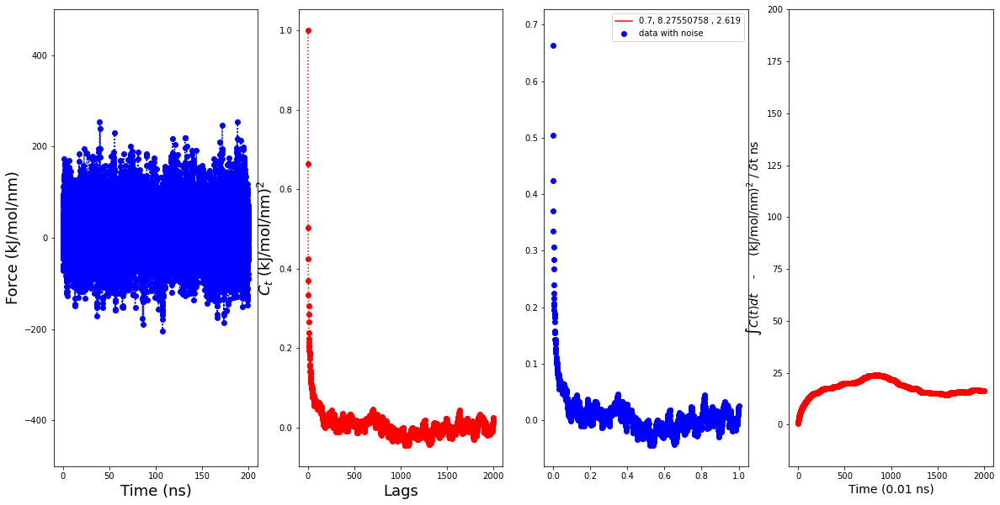

29
30
[ 1.          0.6304322   0.46788937 ... -0.00666947 -0.00604235
 -0.00107468]
[ 1.          0.6304322   0.46788937 ... -0.00666947 -0.00604235
 -0.00107468]
2001
0.6630514153692669 6.809585119402414 3.0394515429054323
Gamma function value is
0.012276822464801523


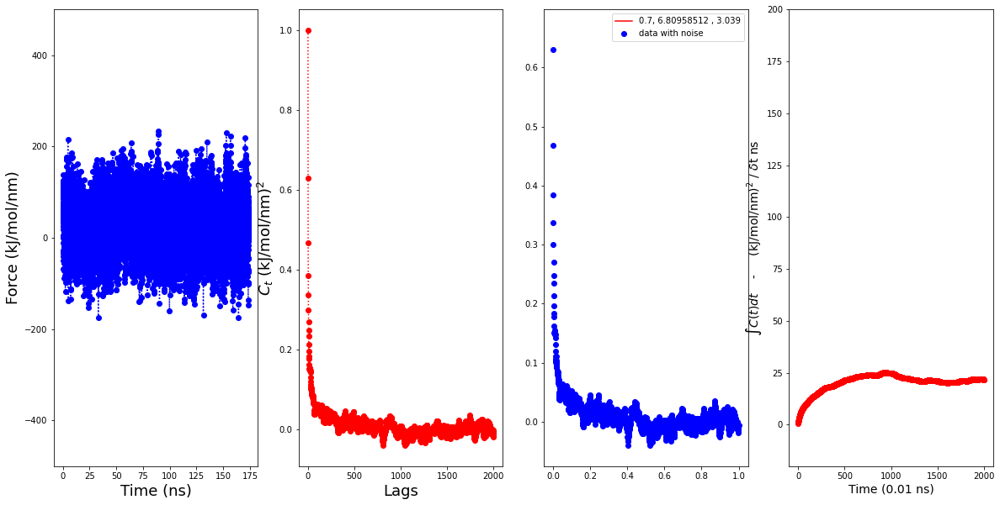

30
31
[1.00000000e+00 6.29915401e-01 4.60429185e-01 ... 6.62911852e-04
 1.37989647e-03 7.37669610e-03]
[1.00000000e+00 6.29915401e-01 4.60429185e-01 ... 6.62911852e-04
 1.37989647e-03 7.37669610e-03]
2001
0.683458301888192 6.84924844592841 3.1780692698649915
Gamma function value is
0.011381401711969219


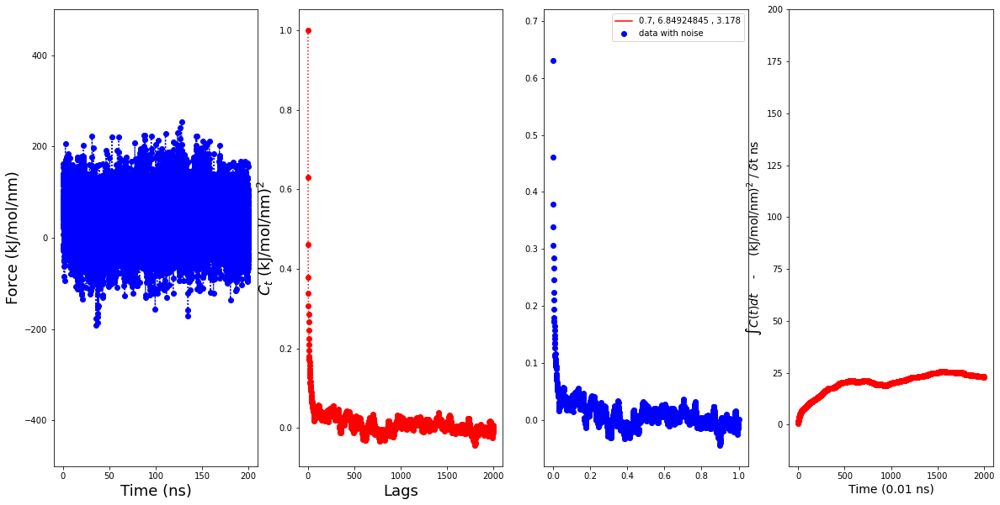

31
32
[1.         0.71381216 0.58292675 ... 0.01518718 0.02279528 0.02071784]
[1.         0.71381216 0.58292675 ... 0.01518718 0.02279528 0.02071784]
2001
0.11511999039716345 0.012159484857278318 -663253.6218911003
Gamma function value is
-0.0


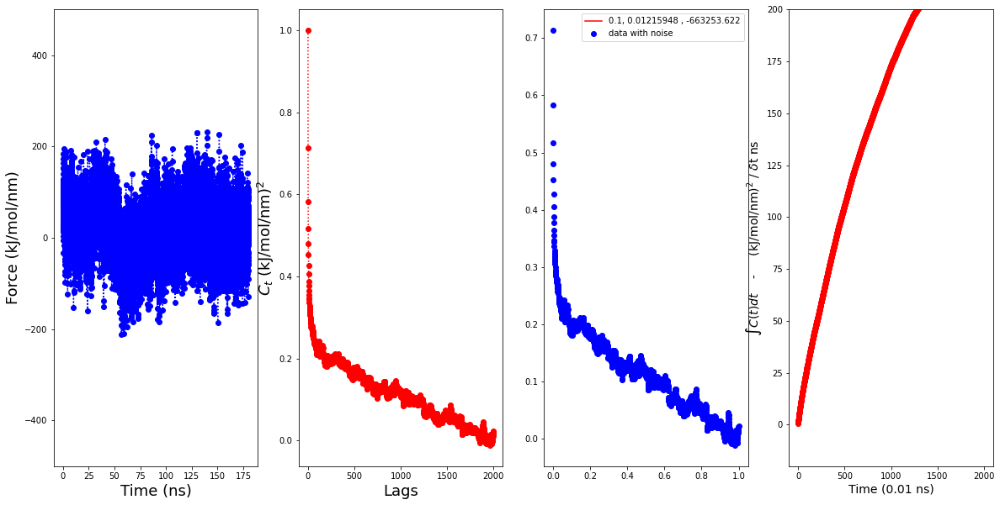

32
33
[ 1.          0.67129689  0.51954042 ... -0.01136849 -0.00645501
 -0.00873   ]
[ 1.          0.67129689  0.51954042 ... -0.01136849 -0.00645501
 -0.00873   ]
2001
0.5126750025786118 2.6666340769982266 -1286434.8696261975
Gamma function value is
nan


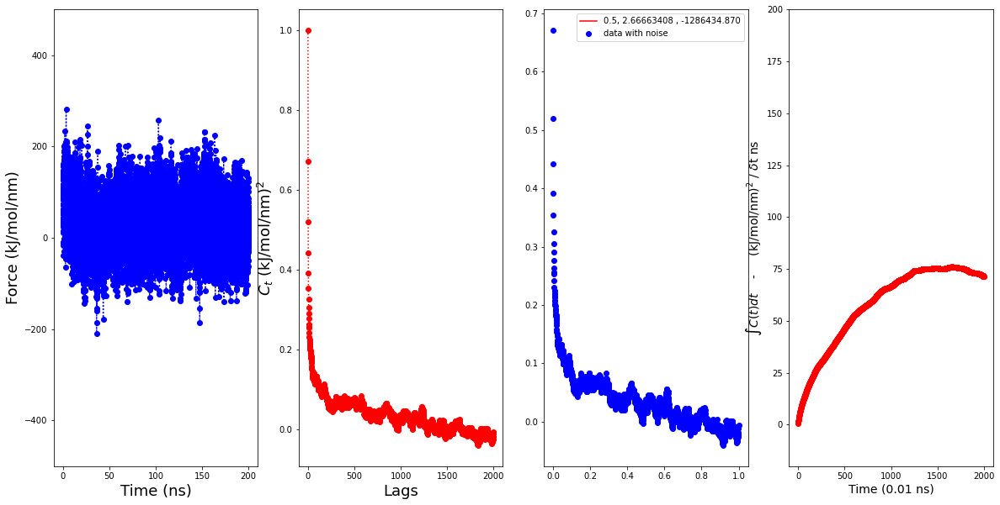

33
34
[1.         0.69191517 0.55371545 ... 0.07617526 0.07994251 0.07927864]
[1.         0.69191517 0.55371545 ... 0.07617526 0.07994251 0.07927864]
2001
0.09492557590050324 0.006426671027576044 -1355696.7512855292
Gamma function value is
0.0


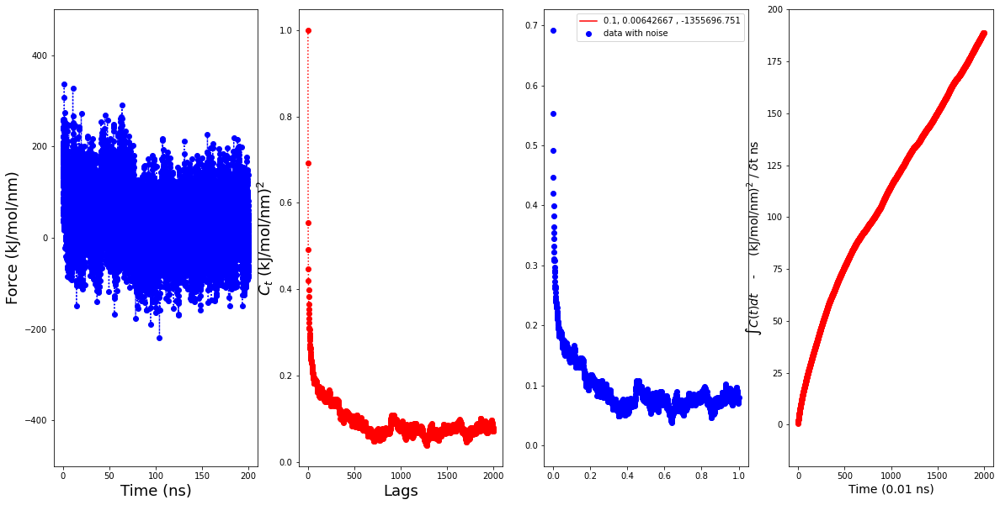

34
35
[1.         0.64749183 0.49833346 ... 0.06778929 0.06816187 0.0664542 ]
[1.         0.64749183 0.49833346 ... 0.06778929 0.06816187 0.0664542 ]
2001
0.0671965445902963 0.010182233710738686 -1456604.8184248977
Gamma function value is
0.0


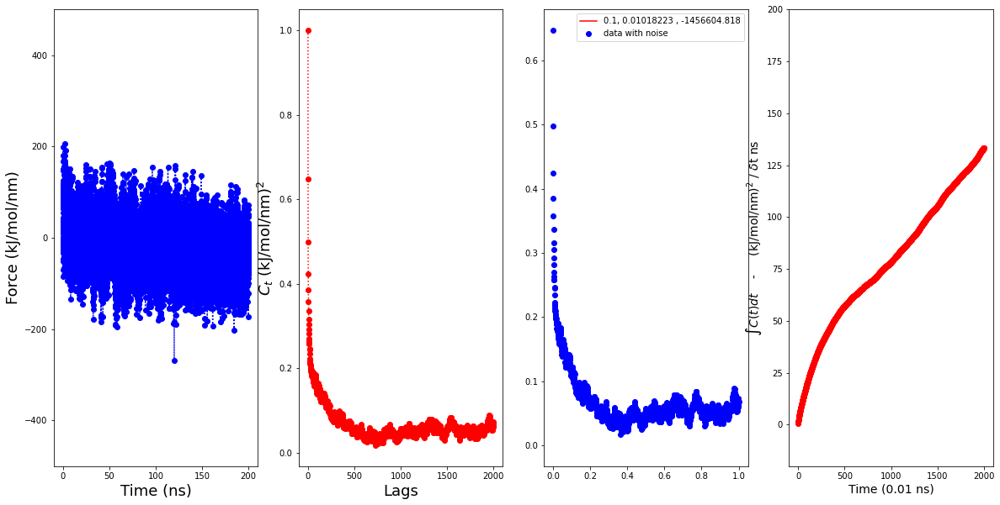

35
36
[ 1.          0.60494301  0.43740209 ...  0.00242456  0.00446668
 -0.00416946]
[ 1.          0.60494301  0.43740209 ...  0.00242456  0.00446668
 -0.00416946]
2001
0.6240821296584275 5.700714418420542 3.1994564446266676
Gamma function value is
0.018452099639328274


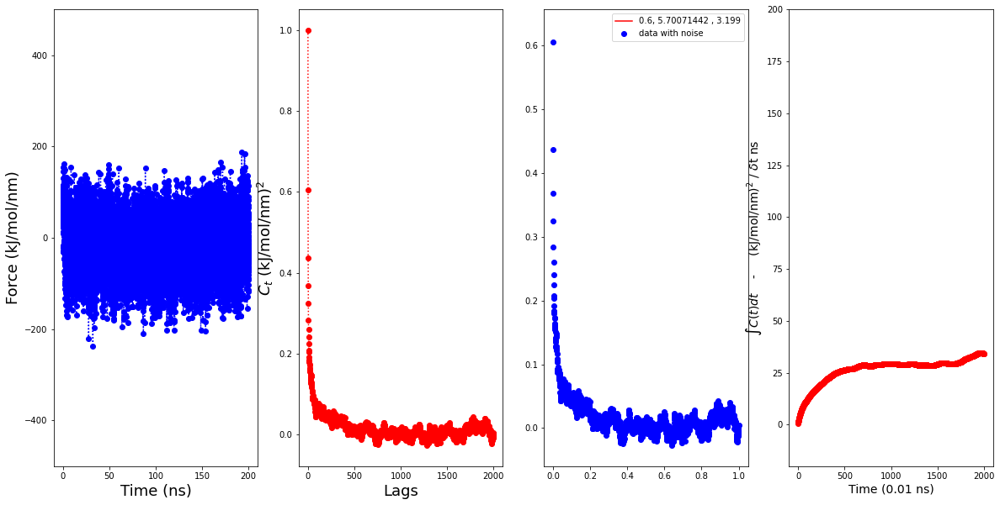

36
37
[1.         0.62459122 0.4706572  ... 0.00345082 0.00476715 0.00661575]
[1.         0.62459122 0.4706572  ... 0.00345082 0.00476715 0.00661575]
2001
0.25694555770926003 1.93219844268017 -1442472.4273745131
Gamma function value is
nan


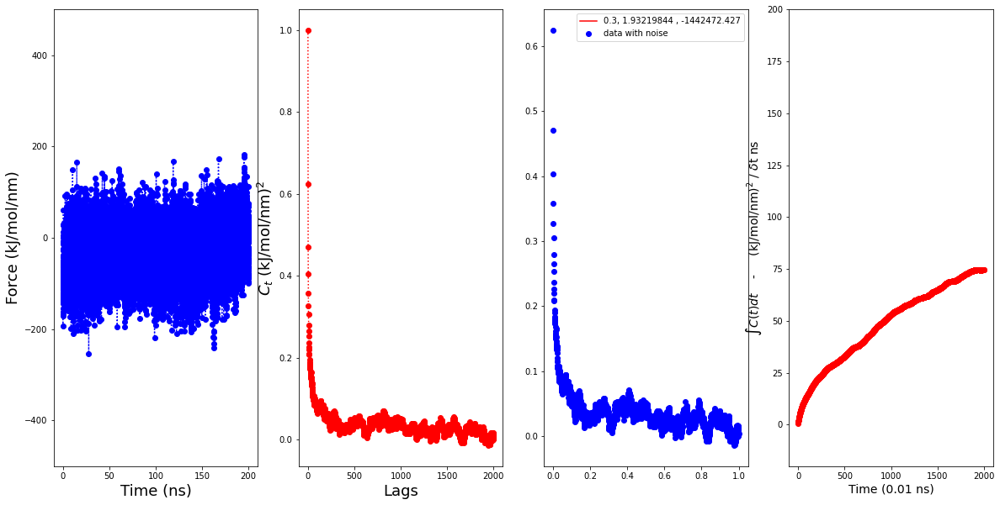

37
38
[1.         0.62029415 0.46765233 ... 0.02396611 0.02460417 0.02014664]
[1.         0.62029415 0.46765233 ... 0.02396611 0.02460417 0.02014664]
2001
0.05310850880379728 0.004157090203392743 -795725.488811035
Gamma function value is
-0.0


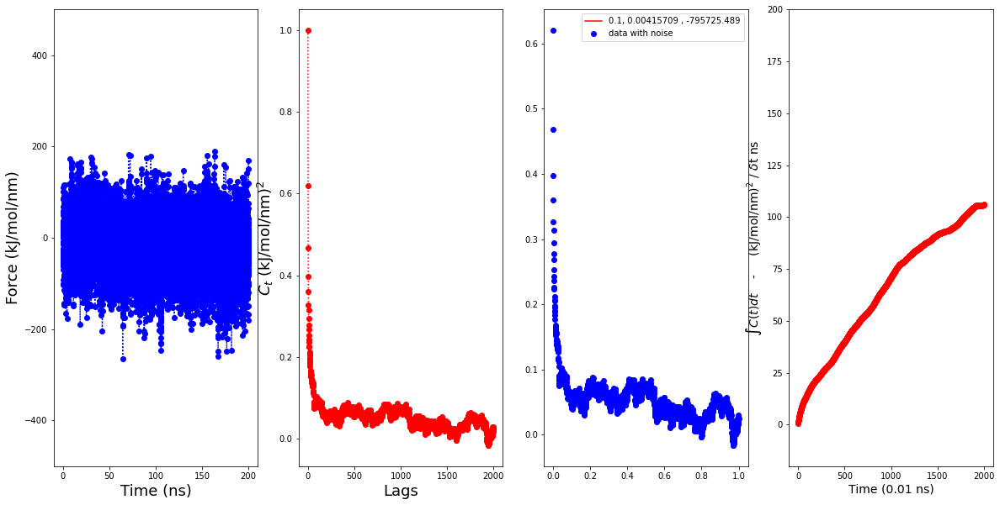

38
39
[ 1.          0.62117302  0.47779891 ... -0.02393485 -0.01654025
 -0.01259658]
[ 1.          0.62117302  0.47779891 ... -0.02393485 -0.01654025
 -0.01259658]
2001
0.04303113947655036 0.0005863883748619077 -745348.0388314261
Gamma function value is
0.0


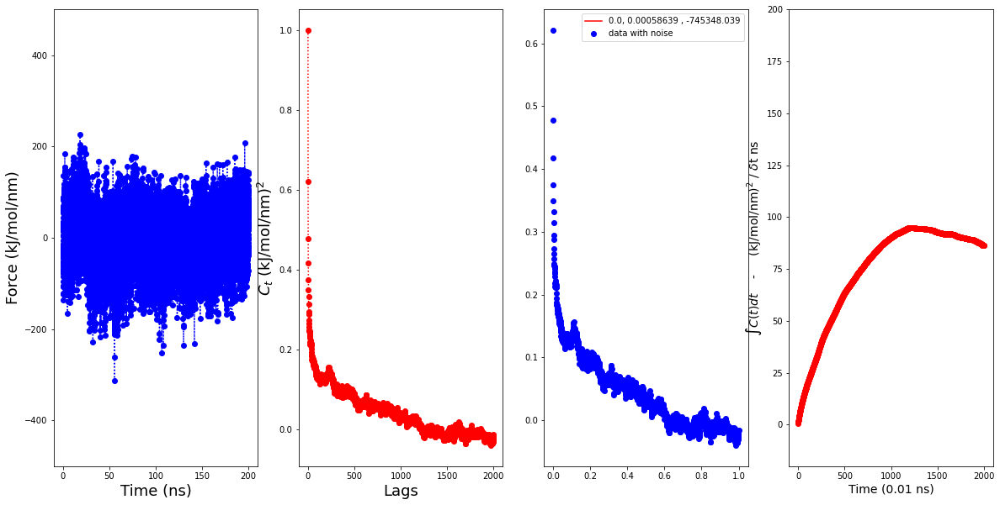

39
40
[ 1.          0.54729672  0.37266673 ... -0.01227493 -0.00686652
 -0.00307824]
[ 1.          0.54729672  0.37266673 ... -0.01227493 -0.00686652
 -0.00307824]
2001
0.5700556540136221 6.797728538459761 3.2700678997692587
Gamma function value is
0.009202297988113327


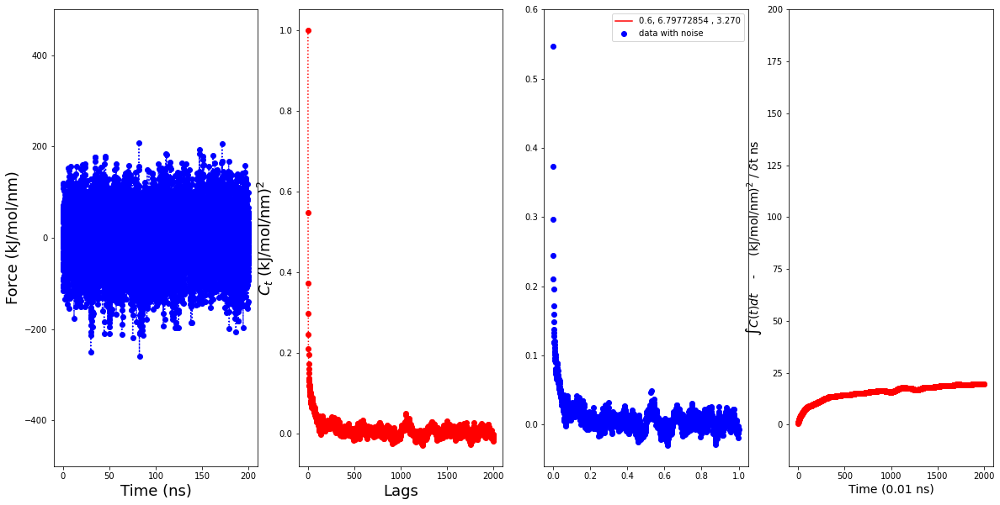

40
41
[ 1.          0.65840329  0.50356006 ... -0.01152464 -0.00606338
 -0.0015282 ]
[ 1.          0.65840329  0.50356006 ... -0.01152464 -0.00606338
 -0.0015282 ]
2001
0.6003072869369828 5.835935097070933 2.6597001997696763
Gamma function value is
0.021909663894748452


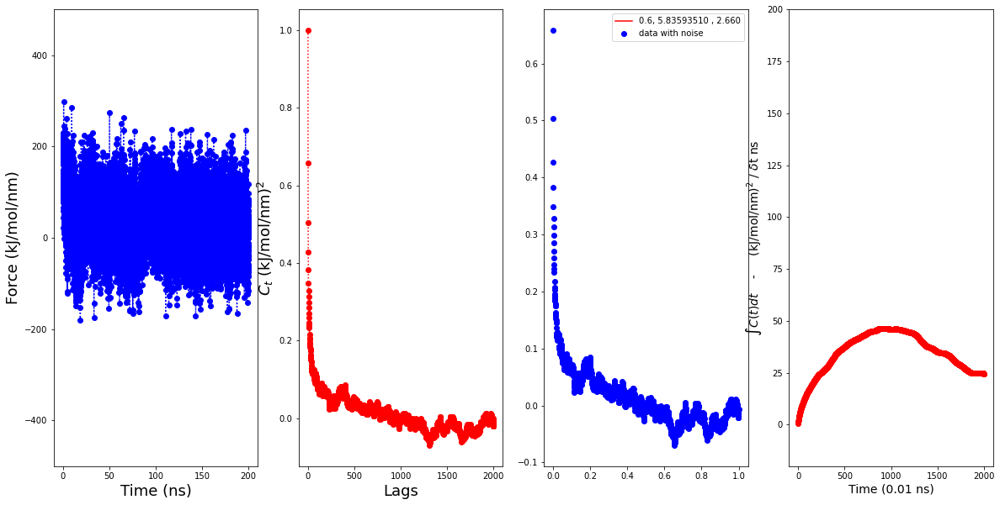

41
42
[1.         0.67752997 0.52672514 ... 0.03432312 0.0331113  0.03115967]
[1.         0.67752997 0.52672514 ... 0.03432312 0.0331113  0.03115967]
2001
0.7769949472799921 4.501069202078372 3.8769011693213953
Gamma function value is
0.04549935533354042


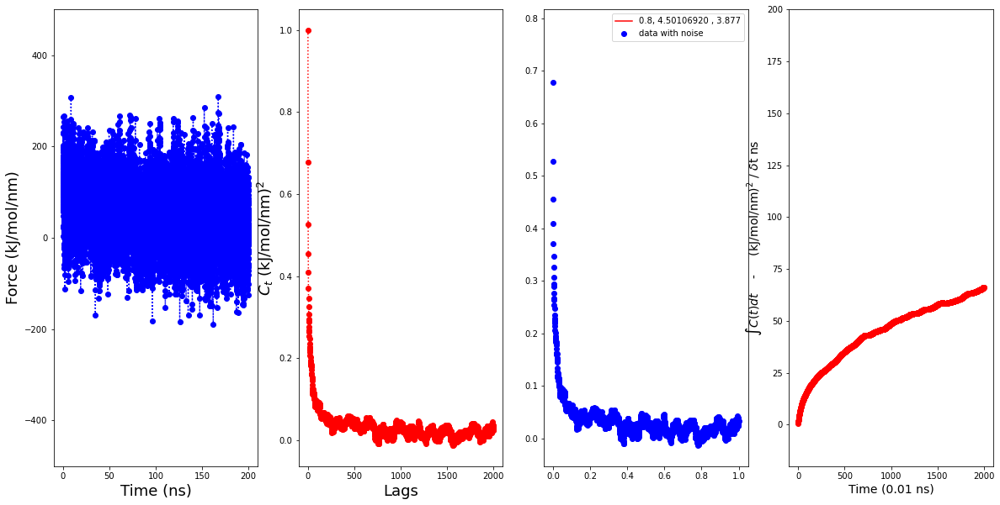

42
43
[1.         0.66324458 0.51297262 ... 0.02105535 0.02087699 0.01964085]
[1.         0.66324458 0.51297262 ... 0.02105535 0.02087699 0.01964085]
2001
0.17664558424843638 1.0650728196053463 -1438545.114595383
Gamma function value is
nan


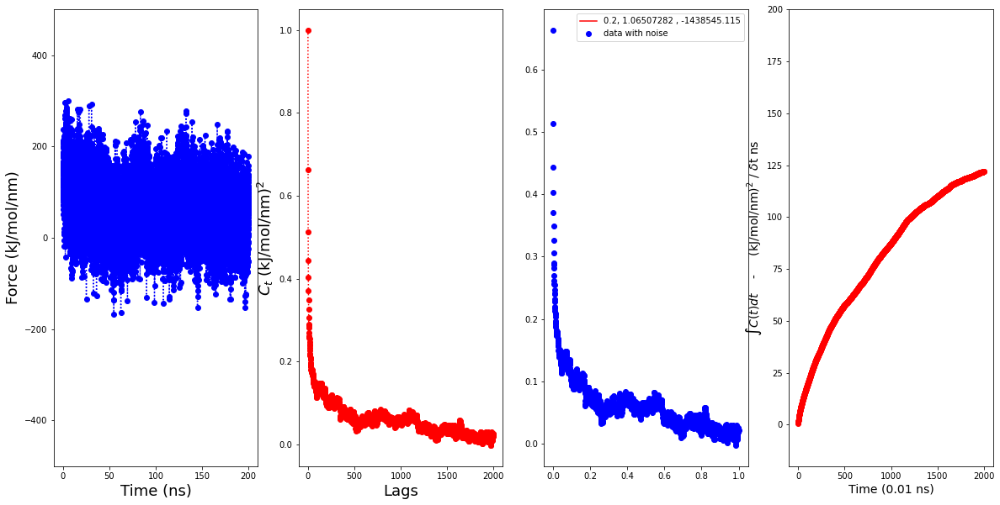

43
44
[1.         0.66841959 0.51889641 ... 0.03200754 0.03285893 0.0291045 ]
[1.         0.66841959 0.51889641 ... 0.03200754 0.03285893 0.0291045 ]
2001
0.22858732982420152 1.5741725286016668 -1370089.5211049311
Gamma function value is
nan


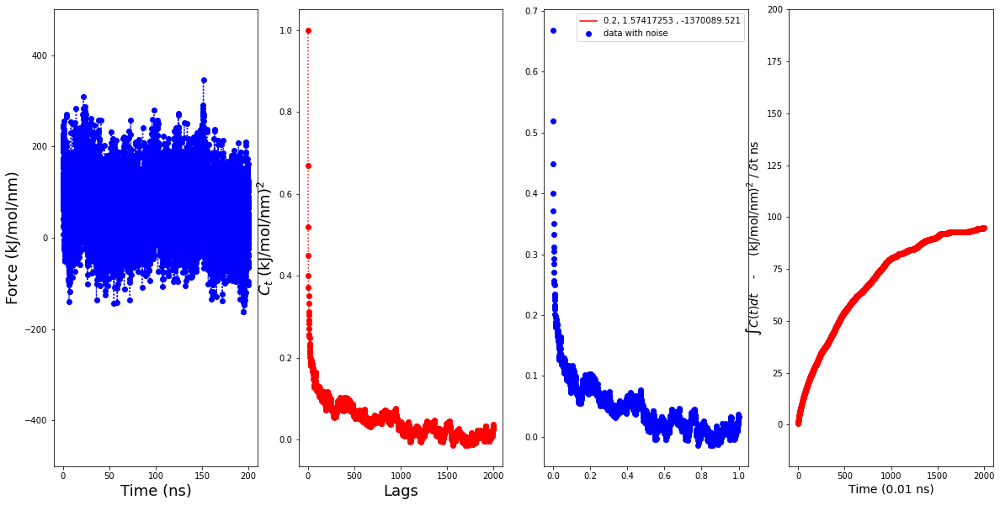

44
45
[1.         0.68157928 0.5358624  ... 0.03393609 0.03426927 0.03144399]
[1.         0.68157928 0.5358624  ... 0.03393609 0.03426927 0.03144399]
2001
0.7491731068690692 4.367997029152764 3.455733428471561
Gamma function value is
0.05023274635028874


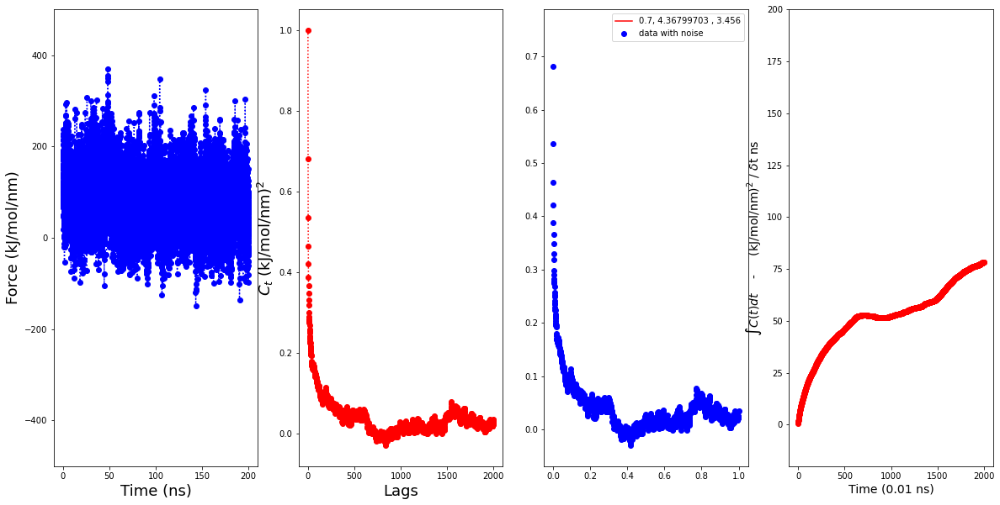

45
45
45
45
[ 7.13123350e-05             nan -0.00000000e+00  2.43272310e-04
 -0.00000000e+00             nan -0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00             nan  1.58176713e-04
  4.00514641e-04  0.00000000e+00 -0.00000000e+00  2.02800038e-04
  3.74221596e-04             nan  1.01515098e-04             nan
  2.30067423e-04  2.62487697e-04  3.42559047e-04  2.78237031e-04
             nan             nan  2.27313340e-04  1.00078174e-04
  1.03451760e-04  1.22768225e-04  1.13814017e-04 -0.00000000e+00
             nan  0.00000000e+00  0.00000000e+00  1.84520996e-04
             nan -0.00000000e+00  0.00000000e+00  9.20229799e-05
  2.19096639e-04  4.54993553e-04             nan             nan
  5.02327464e-04]


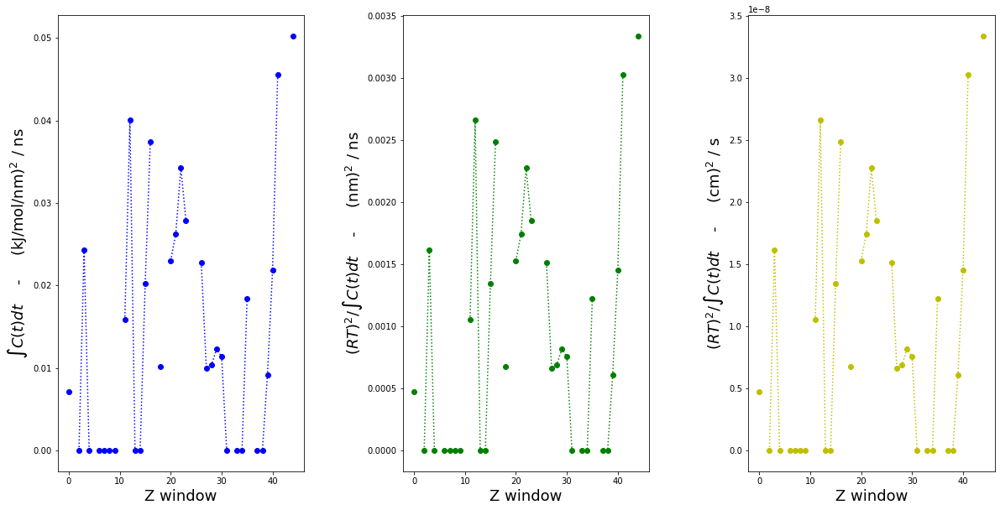

In [21]:

#Original data, 100, 1000. 
#Red, blue, black and purple at 500,000. 

#Correlation func & Integral: 1, 100, 1000.

#Auto-correlation
from statsmodels.graphics import tsaplots

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import os
import glob 
import errno
import statsmodels.api as sm
import scipy.integrate as scint
from scipy import integrate

from scipy.optimize import curve_fit
            
import math        
from numpy import array, hstack, vstack


import itertools

last = []
dz = []
bl = []
bla = range(20000)
bla2 = array([bla])
save_acf = array([bla])

bla3 = save_acf.T

bla4 = np.empty(shape=(20000,) * 1)

plt.figure(figsize=(20,6))
count=1

# create subplots

os.chdir('/Users/chrisjorg/Documents/Postdoc/Georgetown/Double_bilayer_Sandwich/Z_LPP/LPP_Caff_DPG_5000eq_0.2/All_test4/Convolve')



with open('data.txt', 'w') as file:
    path = './*pullf.xvg' 
    path2 = os.getcwd()
    files = glob.glob(path)
    colors = itertools.cycle(["r", "b", "g","y","c","m"])
    
def key_func(x):
        return os.path.split(x)[-1]

for name in sorted(glob.glob('*_pullf.xvg_dt*'), key=key_func):
        try: 
            print(count)
            
            lines = open(name,'r')
            f = np.loadtxt(name)
            #plt.subplot(1, 1, count) 

            subplot_dim = (20, 10)
            X_=f[:,0]/1000
            Y=f[:,1]
            X_scale = np.linspace(0, 1, 20000) 
            
            X_scale_ = X_scale/100
            
           
            
            
            fig, (ax0, ax1, ax2, ax3) = plt.subplots(1, 4,figsize=(20,10))
            ax0.plot(X_,Y,':ro',label=name,color=next(colors))
             
            ax0.set_ylabel('Force (kJ/mol/nm)',fontsize=18)
            ax0.set_xlabel('Time (ns)',fontsize=18)
             
            ax0.set_ylim(-500, 500)

            colors = itertools.cycle(["r", "b", "g","y","c","m"])
            
            acf_ = sm.tsa.acf(Y,  nlags=2000)
            
            acf__ = acf_.T
            print(acf__)
            print(acf_)
            blbb = np.concatenate(([X_scale, X_, Y]), axis=0) 
            np.savetxt('AutoCorr_100_' + str(count) + '.txt', acf_, delimiter=" ", fmt="%s")
 
            save_acf__ = hstack([ X_, Y])
           
            ax1.plot(acf_,':ro',label=name,color=next(colors)) 
            ax1.set_ylabel('$C_{t}$ (kJ/mol/nm)$^2$',fontsize=18)
            ax1.set_xlabel('Lags',fontsize=18)
            
            print(len(acf_))
            colors = itertools.cycle(["r", "b", "g","y","c","m"])

            X_scale = np.linspace(0, 1, 2000)
            acf__ = acf_[1:]
            acf_int = integrate.cumtrapz(acf__)
   
            np.savetxt("dz_integrat.txt", acf_int, delimiter=" ", fmt="%s")

            # define type of function to search
            def model_func(x, a, b, c):
                return a * np.exp(-(b * x ** (c ** (-1))))

            # curve fit
            X_scale = np.linspace(0, 1, 1999)
            p0 = (1.,1.e-5,1.) # starting search koefs
            opt, pcov = curve_fit(model_func, X_scale, acf__[:1999], p0, maxfev=1500)
            a, b, c= opt
            # test result
            
            x2 = np.linspace(0, 1999, 1)
            y2 = model_func(x2, a, b, c)
            ax2.plot(x2, y2, color='r', label='%.1f, %.8f , %-.3f' % (a,b,c))
            
            print(a, b, c)
            ax2.plot(X_scale, acf__[:1999], 'bo', label='data with noise')
            #ax2.set_xlim(0, 1999)
            ax2.legend(loc='best')
        
        
            from scipy.stats import gamma
          
            
        
            def int_val(a, b, c):
                return a * (b ** (-c)) * math.gamma(1 + c)
            y3 = int_val(a, b, c)
            print("Gamma function value is")
            print(y3)

 
            ax3.plot(acf_int,':ro',label=name,color=next(colors))
            ax3.set_ylabel(r'$\int C(t) dt $    -     (kJ/mol/nm)$^2$ / $\delta$t ns',fontsize=14)
            ax3.set_xlabel('Time (0.01 ns)',fontsize=14)
            ax3.set_ylim(-20, 200)
            plt.show()
             
            count+=1
             
            fig.savefig('AutoCorr_100_' + str(count) + '.png',dpi=300,bbox_inches='tight',pad_inches=0.06)
            last_element = y3
      
            #last_element_ = 100*last_element
            last.append(last_element)
            print(len(last))
        except IOError as exc: 
            if exc.errno != errno.EISDIR: 
                raise

np.savetxt("test5.txt", blbb, delimiter=" ", fmt="%s") 

# Display the autocorrelation plot of your time series

print(len(last))
fig, (ax0, ax1, ax2) = plt.subplots(1, 3,figsize=(20,10))
last_arr = np.array(last)
last_ = last_arr
np.savetxt("test6.txt", last_, delimiter=" ", fmt="%s") 

print(len(last_))
rt = 0.008314*310   #kJ/mol
rt2_ = rt*rt

dt = 0.01 

dt1 = 1/dt
invert_last = 1. / dt1*last_
print(len(invert_last))
print(invert_last)
#invert_last = np.reciprocal(last_)
fraction = rt2_*invert_last
fraction_units = fraction*0.00001

#plt.plot(last_,':ro',label=name,color=next(colors))

ax0.plot(last_,':ro',label=name,color=next(colors))
ax0.set_ylabel(r'$\int C(t) dt $    -     (kJ/mol/nm)$^2$ / ns',fontsize=18)
ax0.set_xlabel('Z window',fontsize=18)
#plt.xlim(0, 50000)

ax1.plot(fraction,':ro',label=name,color=next(colors))
ax1.set_ylabel('$(RT)^{2} / \int C(t) dt $    -     (nm)$^2$ / ns',fontsize=18)
ax1.set_xlabel('Z window',fontsize=18)
#plt.xlim(0, 100)
 
ax2.plot(fraction_units,':ro',label=name,color=next(colors))
ax2.set_ylabel('$(RT)^{2} / \int C(t) dt $    -     (cm)$^2$ / s',fontsize=18)
ax2.set_xlabel('Z window',fontsize=18)
np.savetxt("last_element_.txt", last, delimiter=" ", fmt="%s")
plt.ticklabel_format(useOffset=False)

np.savetxt("dz.txt", fraction_units, delimiter=" ", fmt="%s")
 
plt.subplots_adjust(wspace=0.4)
            
#plt.tight_layout()
plt.savefig('AutoCorr_100.png',dpi=300,bbox_inches='tight',pad_inches=0.2)